**Tiền xử lý dữ liệu**

In [ ]:
import pandas as pd
import io

# Đọc dữ liệu từ file Excel
df = pd.read_csv('synchronized_data.csv')

# 1. Kiểm tra các giá trị bị thiếu ban đầu
print("--- Số lượng giá trị bị thiếu trước khi xử lý ---")
print(df.isnull().sum())
print(f"\nKích thước bộ dữ liệu gốc: {df.shape}")

# 2. Loại bỏ các dòng có giá trị bị thiếu
df_clean = df.dropna()

# 3. Kiểm tra lại sau khi xử lý
print("\n--- Số lượng giá trị bị thiếu sau khi loại bỏ ---")
print(df_clean.isnull().sum())
print(f"\nKích thước bộ dữ liệu sau khi xử lý: {df_clean.shape}")

# Hiển thị vài dòng đầu của dữ liệu sạch để kiểm tra
print("\n--- Dữ liệu sau khi tiền xử lý ---")
print(df_clean.head())

--- Số lượng giá trị bị thiếu trước khi xử lý ---
date                     0
close                    0
daily_return             0
volume                   0
stock_id                 0
iron_powder_price        0
rebar_price              0
coke_price               0
gdp_growth               0
cpi                      0
interest                 0
fdi                      0
import                   0
export                   0
exchange_rate            0
de                       0
roe                      0
roa                      0
quick_ratio              0
pe                       0
pb                       0
log_volume               0
log_rebar_price          0
log_iron_powder_price    0
log_pe                   0
log_close                0
z_close                  0
price_to_rebar           0
price_to_iron            0
price_to_coke            0
price_x_interest         0
volume_momentum          0
pe_to_roe                0
dtype: int64

Kích thước bộ dữ liệu gốc: (3675, 33)

--- Số

**EDA**

**1. Trực quan hóa dữ liệu**

In [ ]:
# ======================================================
# 📈 EDA - 1. Visualize Data (Trực quan hóa dữ liệu)
# ======================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cấu hình giao diện đồ thị chuyên nghiệp
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (14, 6)

# ---------- 1) Load và Tiền xử lý dữ liệu ----------
EXCEL_PATH = "data_for_eda.xlsx"

try:
    # Đọc dữ liệu
    df = pd.read_csv('synchronized_data.csv')

    # Chuyển đổi cột 'date' sang dạng datetime
    if "date" in df.columns:
        df["date"] = pd.to_datetime(df["date"])

    # Loại bỏ giá trị bị thiếu (theo yêu cầu trước đó)
    df.dropna(inplace=True)

    print(f"Đã load dữ liệu thành công! Kích thước: {df.shape}")

    # Tạo đặc trưng cơ bản để vẽ biểu đồ (feature engineering nhẹ cho bước visualize)
    # Tính % thay đổi giá đóng cửa (Lợi suất ngày)
    df["daily_return"] = df.groupby("stock_id")["close"].pct_change() * 100

except FileNotFoundError:
    print(f"Không tìm thấy file: {EXCEL_PATH}")
except Exception as e:
    print(f"Lỗi khi xử lý dữ liệu: {e}")

Đã load dữ liệu thành công! Kích thước: (3675, 33)


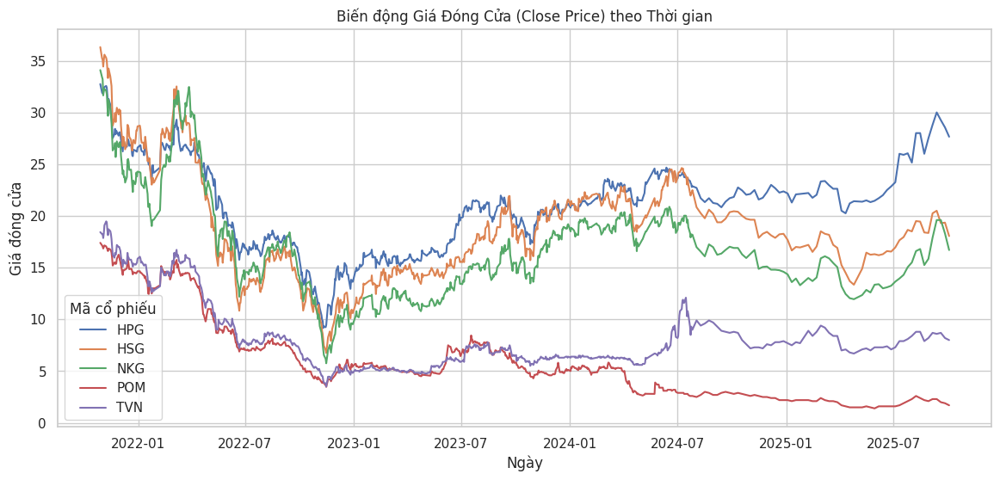

In [ ]:
# thực hiện trực quan hóa dữ liệu

# XU HƯỚNG GIÁ VÀ THANH KHOẢN (TIME SERIES)
# Insight: Nhận diện xu hướng tăng/giảm và dòng tiền
plt.figure(figsize=(14, 6))
sns.lineplot(data=df, x="date", y="close", hue="stock_id")
plt.title("Biến động Giá Đóng Cửa (Close Price) theo Thời gian")
plt.xlabel("Ngày")
plt.ylabel("Giá đóng cửa")
plt.legend(title="Mã cổ phiếu")
plt.show()

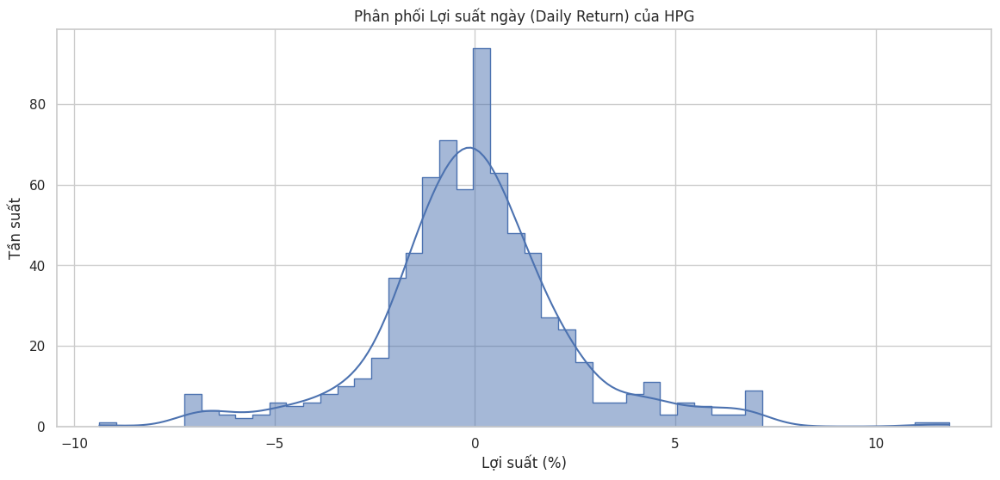

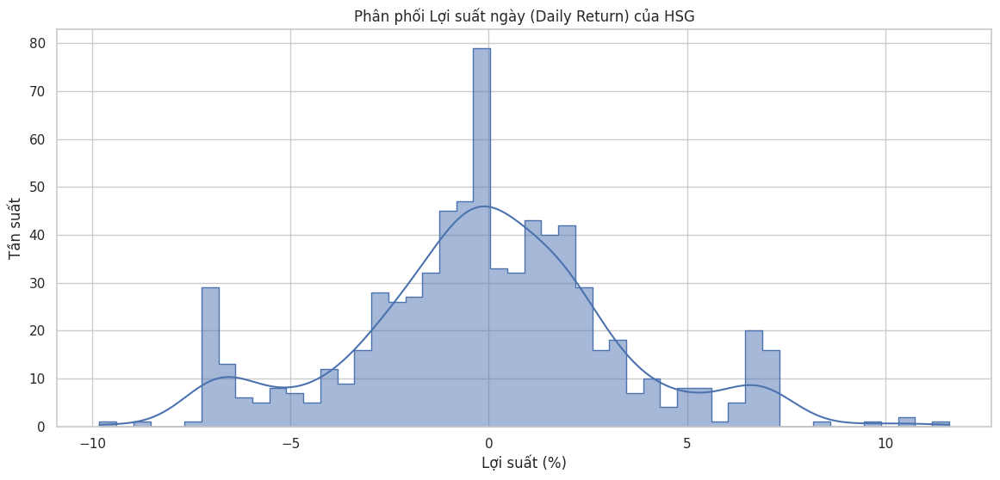

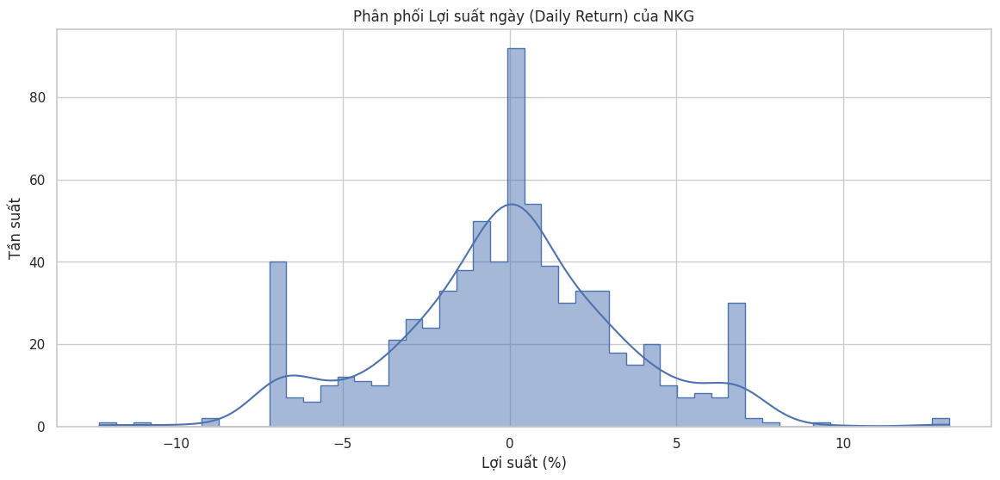

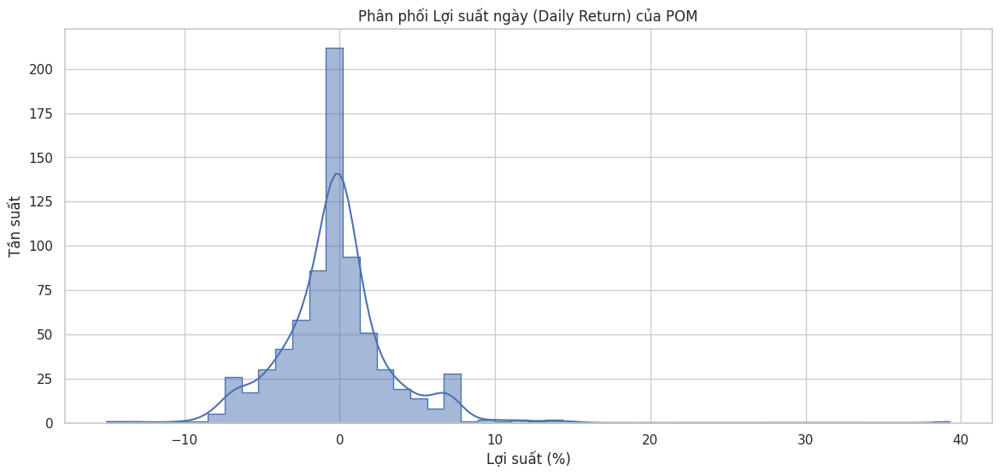

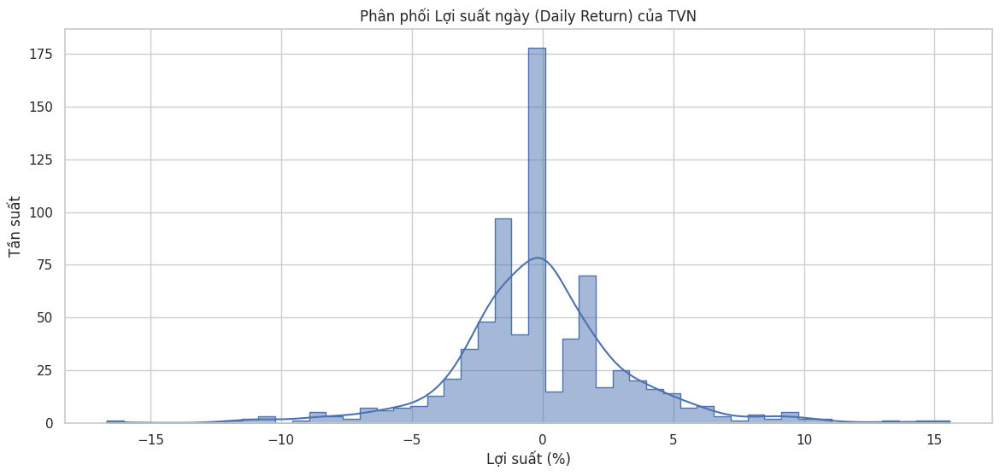

In [ ]:
# B. Biểu đồ Phân phối (Distribution) cho từng mã cổ phiếu riêng biệt
# Lấy danh sách các stock_id duy nhất
unique_stock_ids = df['stock_id'].unique()

for stock_id in unique_stock_ids:
    plt.figure(figsize=(14, 6))
    # Lọc dữ liệu cho từng stock_id
    df_stock = df[df['stock_id'] == stock_id]
    sns.histplot(data=df_stock, x="daily_return", kde=True, element="step", bins=50)
    plt.title(f"Phân phối Lợi suất ngày (Daily Return) của {stock_id}")
    plt.xlabel("Lợi suất (%)")
    plt.ylabel("Tần suất")
    plt.show()

## Distribution Plots for Close Price



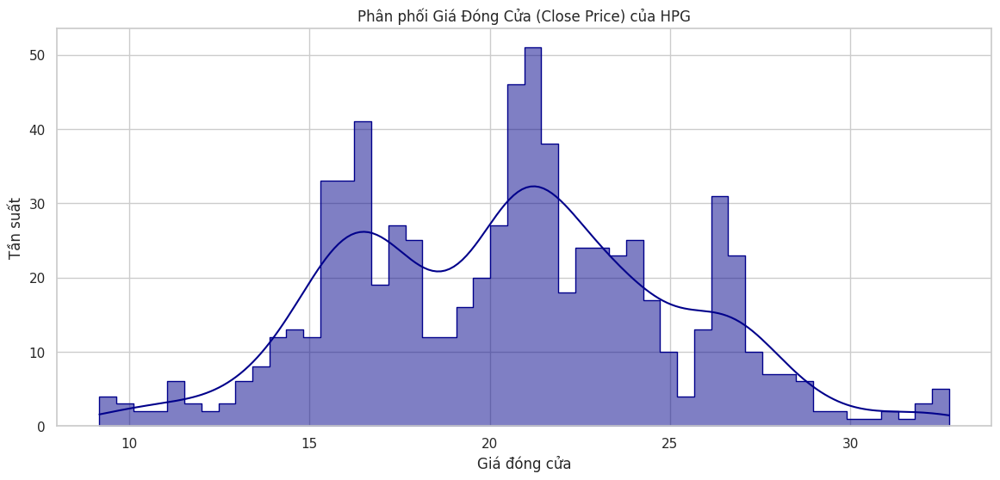



[Histogram] close: skew=0.11, kurtosis=-0.31 → Gần đối xứng. Độ phân tán (std)≈4.47.
Kết luận: Phân bố ổn, chưa cần biến đổi.




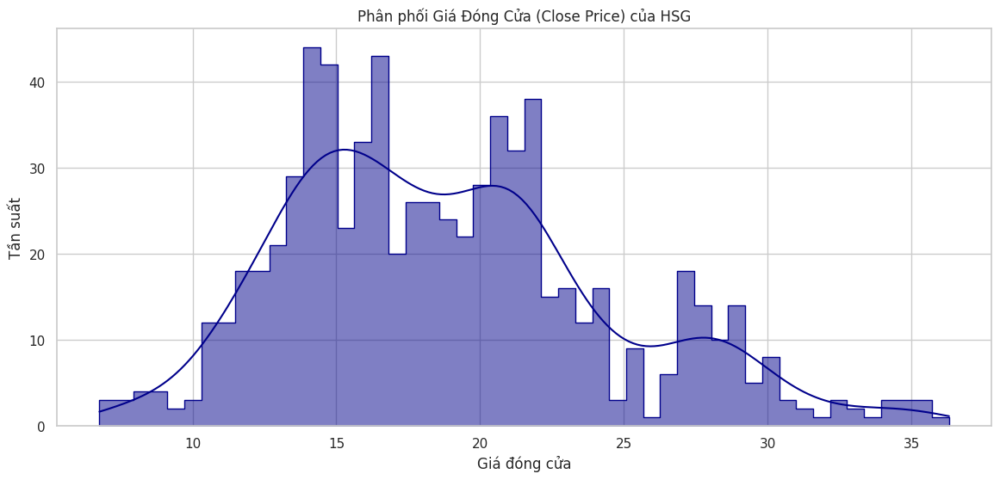



[Histogram] close: skew=0.61, kurtosis=0.05 → Gần đối xứng. Độ phân tán (std)≈5.61.
Kết luận: Phân bố ổn, chưa cần biến đổi.




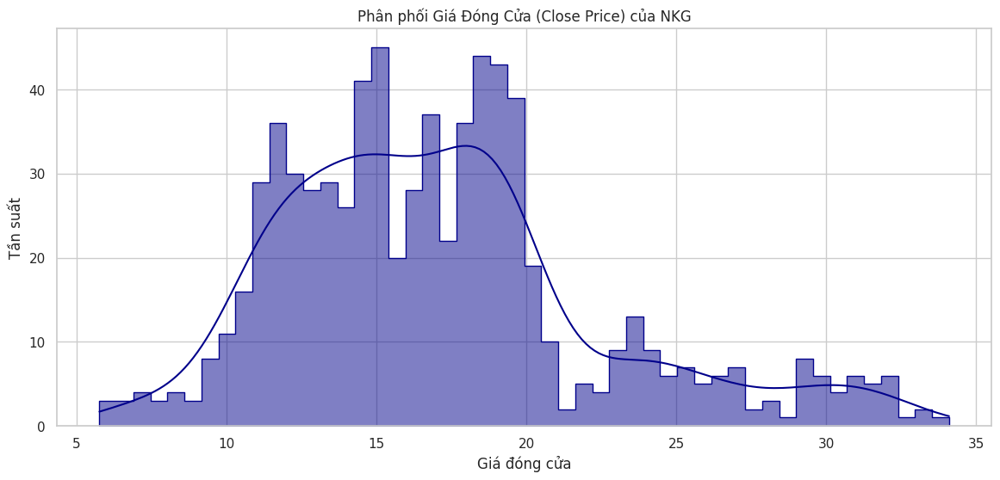



[Histogram] close: skew=0.86, kurtosis=0.66 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈5.36.
Kết luận: cân nhắc log-transform




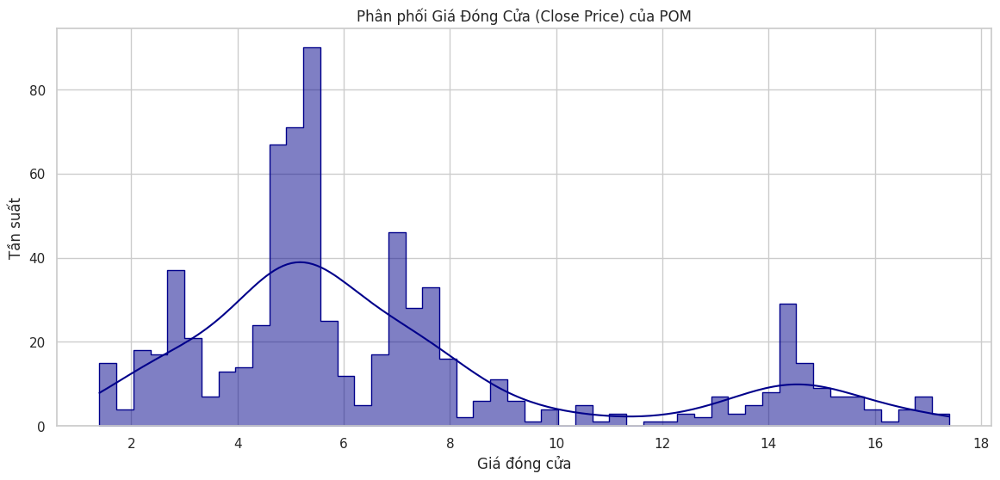



[Histogram] close: skew=1.17, kurtosis=0.41 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈3.86.
Kết luận: cân nhắc log-transform




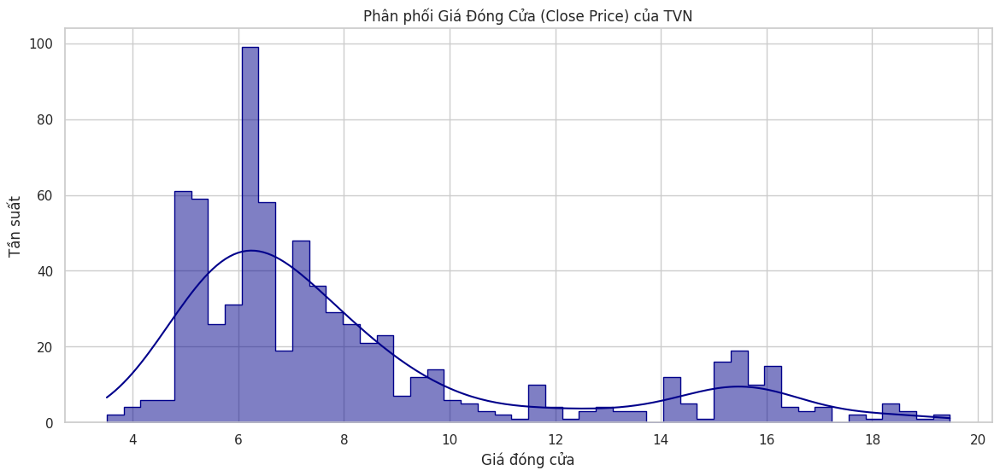



[Histogram] close: skew=1.38, kurtosis=0.82 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈3.57.
Kết luận: cân nhắc log-transform




In [ ]:
def hline():
    print("\n" + "=" * 50 + "\n")

unique_stock_ids = df['stock_id'].unique()

for stock_id in unique_stock_ids:
    plt.figure(figsize=(14, 6))
    df_stock = df[df['stock_id'] == stock_id]
    sns.histplot(data=df_stock, x="close", kde=True, element="step", bins=50, color='darkblue', line_kws={'color': 'red'})
    plt.title(f"Phân phối Giá Đóng Cửa (Close Price) của {stock_id}")
    plt.xlabel("Giá đóng cửa")
    plt.ylabel("Tần suất")
    plt.show()



    # Diễn giải cho 'close' price
    col_name_close = 'close'
    series_close = df_stock[col_name_close]
    if len(series_close) >= 3:
        skew = series_close.skew()
        kurt = series_close.kurt()
        if skew > 0.8: skew_tag = "Lệch phải (đuôi phải dài)"
        elif skew < -0.8: skew_tag = "Lệch trái (đuôi trái dài)"
        else: skew_tag = "Gần đối xứng"
        spread = series_close.std()
        action = []
        if skew > 0.8 and (series_close.min() > 0): # Assuming close price is always positive
            action.append("cân nhắc log-transform")
        if abs(kurt) > 1.5:
            action.append("xem winsorize/capping outlier")

        hline()
        print(f"[Histogram] {col_name_close}: skew={skew:.2f}, kurtosis={kurt:.2f} → {skew_tag}. "
              f"Độ phân tán (std)≈{spread:.2f}.")
        print("Kết luận:", ("; ".join(action) if action else "Phân bố ổn, chưa cần biến đổi."))
        hline()

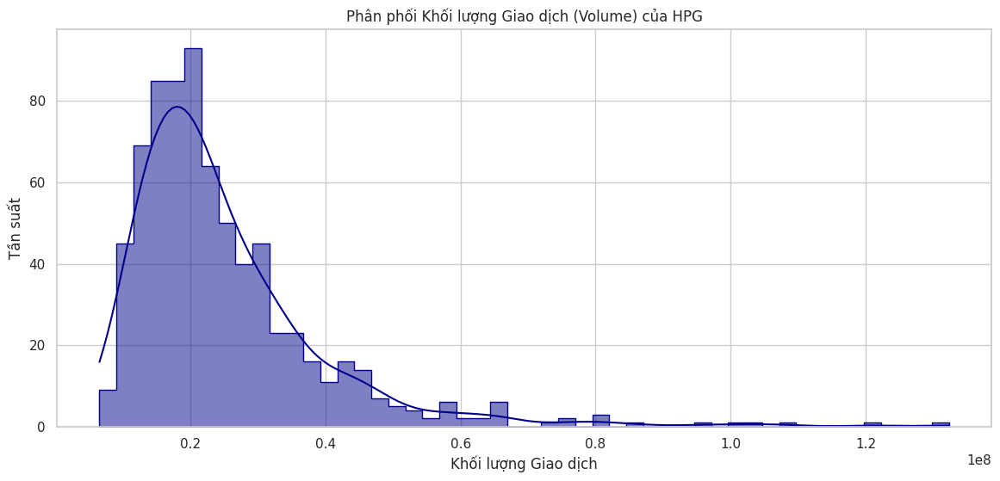



[Histogram] volume: skew=2.65, kurtosis=11.00 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈14671349.35.
Kết luận: cân nhắc log-transform; xem winsorize/capping outlier; dùng scale theo log để ổn định phương sai




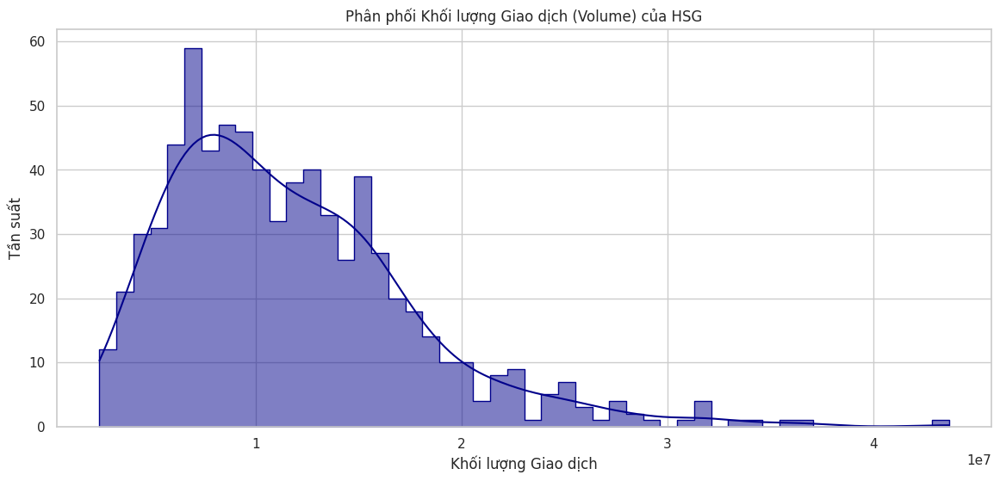



[Histogram] volume: skew=1.23, kurtosis=2.36 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈5952443.64.
Kết luận: cân nhắc log-transform; xem winsorize/capping outlier; dùng scale theo log để ổn định phương sai




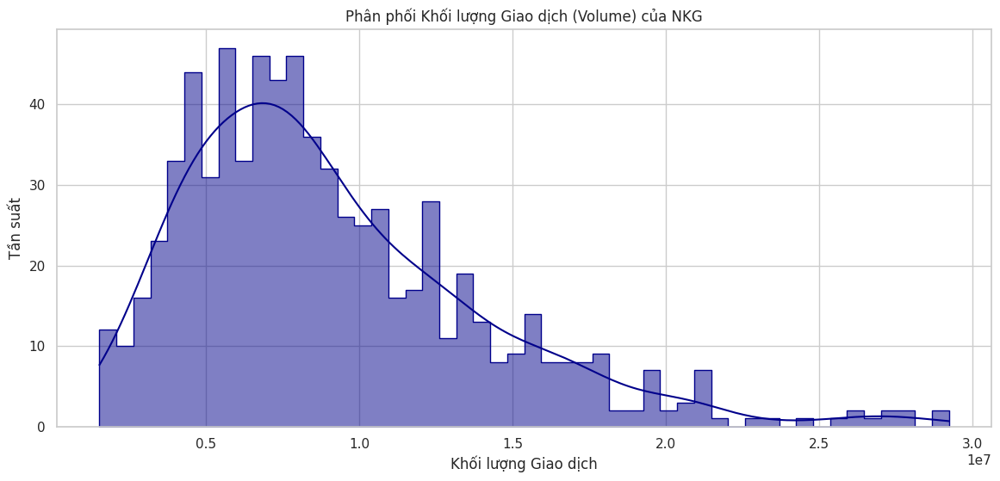



[Histogram] volume: skew=1.22, kurtosis=1.81 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈4880100.85.
Kết luận: cân nhắc log-transform; xem winsorize/capping outlier; dùng scale theo log để ổn định phương sai




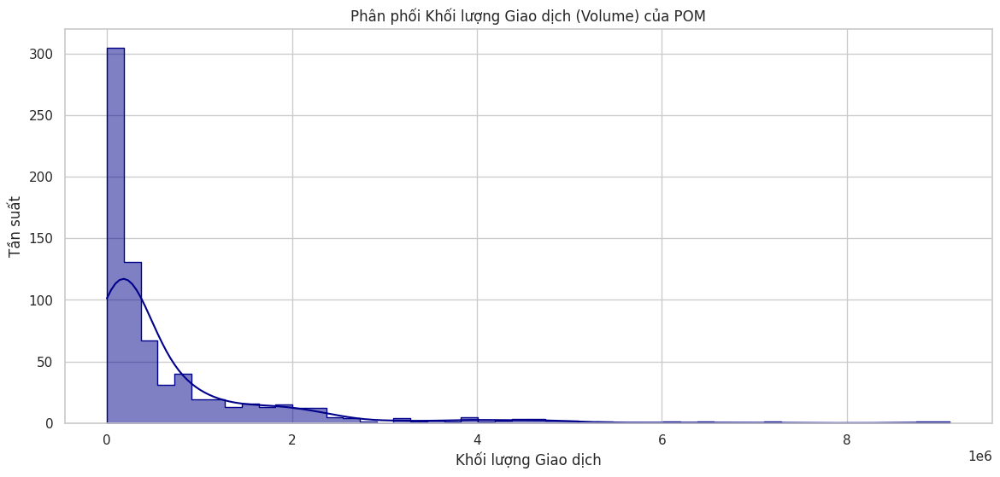



[Histogram] volume: skew=3.32, kurtosis=14.90 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈1082048.81.
Kết luận: xem winsorize/capping outlier; dùng scale theo log để ổn định phương sai




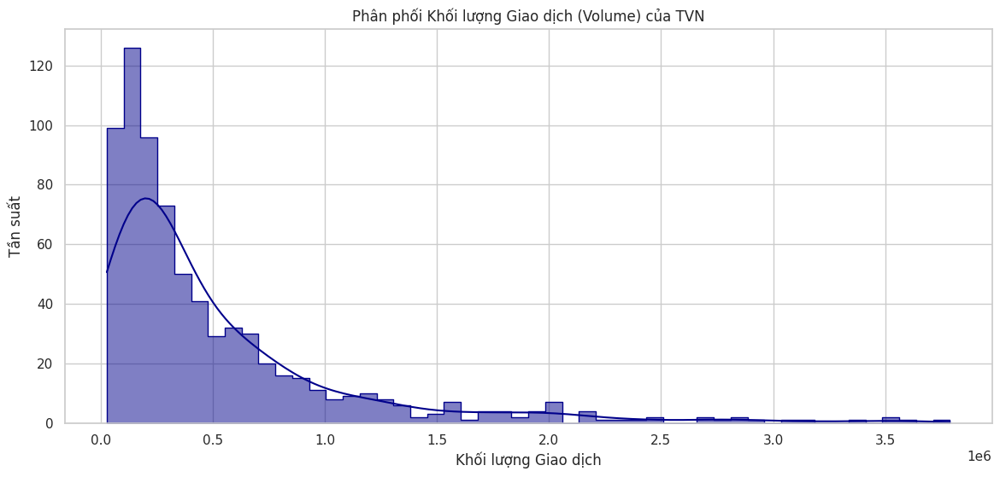



[Histogram] volume: skew=2.50, kurtosis=7.42 → Lệch phải (đuôi phải dài). Độ phân tán (std)≈584671.02.
Kết luận: cân nhắc log-transform; xem winsorize/capping outlier; dùng scale theo log để ổn định phương sai




In [ ]:
unique_stock_ids = df['stock_id'].unique()

for stock_id in unique_stock_ids:
    plt.figure(figsize=(14, 6))
    df_stock = df[df['stock_id'] == stock_id]
    sns.histplot(data=df_stock, x="volume", kde=True, element="step", bins=50, color='darkblue', line_kws={'color': 'red'})
    plt.title(f"Phân phối Khối lượng Giao dịch (Volume) của {stock_id}")
    plt.xlabel("Khối lượng Giao dịch")
    plt.ylabel("Tần suất")
    plt.show()

    # Diễn giải cho 'volume'
    col_name_volume = 'volume'
    series_volume = df_stock[col_name_volume]
    if len(series_volume) >= 3:
        skew = series_volume.skew()
        kurt = series_volume.kurt()
        if skew > 0.8: skew_tag = "Lệch phải (đuôi phải dài)"
        elif skew < -0.8: skew_tag = "Lệch trái (đuôi trái dài)"
        else: skew_tag = "Gần đối xứng"
        spread = series_volume.std()
        action = []
        if skew > 0.8 and (series_volume.min() > 0):
            action.append("cân nhắc log-transform")
        if abs(kurt) > 1.5:
            action.append("xem winsorize/capping outlier")
        # Specific action for 'volume'
        action.append("dùng scale theo log để ổn định phương sai")

        hline()
        print(f"[Histogram] {col_name_volume}: skew={skew:.2f}, kurtosis={kurt:.2f} → {skew_tag}. "
              f"Độ phân tán (std)≈{spread:.2f}.")
        print("Kết luận:", ("; ".join(action) if action else "Phân bố ổn, chưa cần biến đổi."))
        hline()


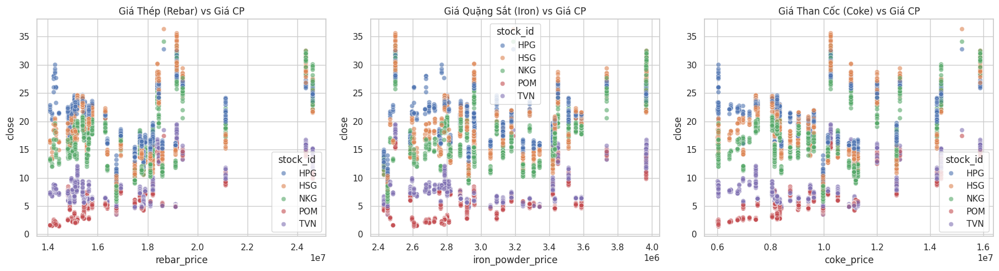

--- Diễn giải & Kết luận cho Giá nguyên liệu và Giá Đóng Cửa ---


Mối tương quan giữaa Giá Thép và Giá đóng cửa: 0.26. Điều này cho thấy mối quan hệ tích cực. Mối quan hệ yếu. Có thể không phải là yếu tố chính.




Mối tương quan giữaa Giá Quặng Sắt và Giá đóng cửa: 0.21. Điều này cho thấy mối quan hệ tích cực. Mối quan hệ yếu. Có thể không phải là yếu tố chính.




Mối tương quan giữaa Giá Than Cốc và Giá đóng cửa: 0.22. Điều này cho thấy mối quan hệ tích cực. Mối quan hệ yếu. Có thể không phải là yếu tố chính.




In [ ]:
# TƯƠNG QUAN HÀNG HÓA & ĐẦU VÀO (COMMODITIES)
# Insight: Giá cổ phiếu nhạy cảm với giá nguyên liệu (Iron/Coke) hay giá bán (Rebar)?

fig3, axes = plt.subplots(1, 3, figsize=(18, 5))
commodities = ['rebar_price', 'iron_powder_price', 'coke_price']
titles = ['Giá Thép (Rebar) vs Giá CP', 'Giá Quặng Sắt (Iron) vs Giá CP', 'Giá Than Cốc (Coke) vs Giá CP']

for i, col in enumerate(commodities):
    sns.scatterplot(data=df, x=col, y='close', hue='stock_id', alpha=0.6, ax=axes[i])
    # Thêm đường hồi quy đơn giản để thấy xu hướng
    # sns.regplot(data=df, x=col, y='close', scatter=False, ax=axes[i], color='gray')
    axes[i].set_title(titles[i], fontsize=12)

plt.tight_layout()
plt.show()
plt.close()

import numpy as np

def hline():
    print("\n" + "=" * 50 + "\n")

commodity_factors = ['rebar_price', 'iron_powder_price', 'coke_price']
titles = [
    'Giá Thép (Rebar Price) vs Giá CP',
    'Giá Quặng Sắt (Iron Powder Price) vs Giá CP',
    'Giá Than Cốc (Coke Price) vs Giá CP'
]

print("--- Diễn giải & Kết luận cho Giá nguyên liệu và Giá Đóng Cửa ---")

for i, col in enumerate(commodity_factors):
    # Calculate and interpret correlation
    correlation = df[col].corr(df['close'])
    strength = ''
    direction = ''

    # Update strength thresholds
    if abs(correlation) >= 0.7:
        strength = 'Mạnh'
    elif abs(correlation) >= 0.3:
        strength = 'Vừaa'
    elif abs(correlation) >= 0.1:
        strength = 'Yếu'
    else:
        strength = 'Không rõ'

    if correlation > 0:
        direction = 'tích cực'
    elif correlation < 0:
        direction = 'tiâu cực'
    else:
        direction = 'không có'

    # Create conclusion statement based on new logic
    conclusion_statement = ''
    if strength == 'Mạnh':
        conclusion_statement = 'Có mối quan hệ mạnh. Mối quan hệ có thể là yếu tố quyết định.'
    elif strength == 'Vừaa':
        conclusion_statement = 'Có mối quan hệ vừaa phải. Cần xem xét thêmm các yếu tố khác để hiểu rõ hơn.'
    elif strength == 'Yếu':
        conclusion_statement = 'Mối quan hệ yếu. Có thể không phải là yếu tố chính.'
    elif strength == 'Không rõ':
        conclusion_statement = 'Không rõ ràng. Mối quan hệ có thể không tuyến tính hoặc bị ảnh hưởng bỗi các yếu tố khác.'

    hline()
    print(f"Mối tương quan giữaa {titles[i].split('(')[0].strip()} và Giá đóng cửa: {correlation:.2f}. Điều này cho thấy mối quan hệ {direction}. {conclusion_statement}")
    hline()


Mối tương quan giữa Tăng trưởng GDP và Giá đóng cửa: -0.40. Điều này cho thấy mối quan hệ trung bình, tiêu cực.
Mối tương quan giữa Tăng trưởng Consumer Price Index và Giá đóng cửa: -0.37. Điều này cho thấy mối quan hệ trung bình, tiêu cực.
Mối tương quan giữa Xuất khẩu và Giá đóng cửa: 0.08. Điều này cho thấy mối quan hệ không đáng kể, tích cực.
Mối tương quan giữa Nhập khẩu và Giá đóng cửa: 0.06. Điều này cho thấy mối quan hệ không đáng kể, tích cực.
Mối tương quan giữa Lãi suất và Giá đóng cửa: -0.36. Điều này cho thấy mối quan hệ trung bình, tiêu cực.
Mối tương quan giữa Tỷ giá hối đoái và Giá đóng cửa: -0.11. Điều này cho thấy mối quan hệ yếu, tiêu cực.
Mối tương quan giữa Đầu tư trực tiếp nước ngoài và Giá đóng cửa: 0.03. Điều này cho thấy mối quan hệ không đáng kể, tích cực.


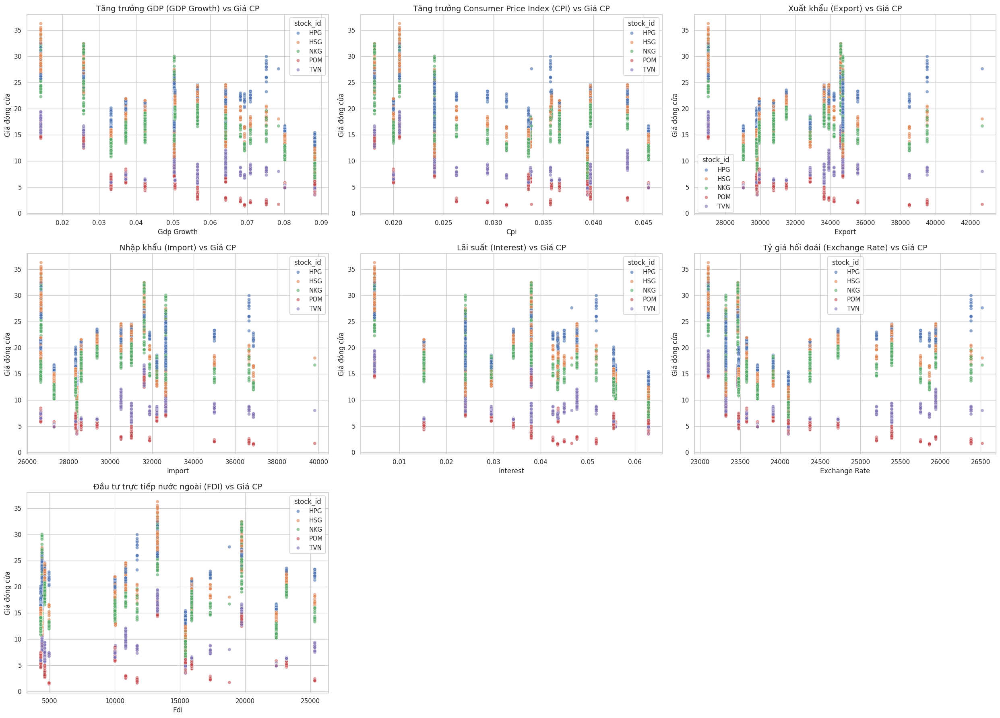

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(25, 18))
axes = axes.flatten() # Flatten the 3x3 array of axes for easy iteration

macro_factors = ['gdp_growth', 'cpi', 'export', 'import', 'interest', 'exchange_rate', 'fdi']
titles = [
    'Tăng trưởng GDP (GDP Growth) vs Giá CP',
    'Tăng trưởng Consumer Price Index (CPI) vs Giá CP',
    'Xuất khẩu (Export) vs Giá CP',
    'Nhập khẩu (Import) vs Giá CP',
    'Lãi suất (Interest) vs Giá CP',
    'Tỷ giá hối đoái (Exchange Rate) vs Giá CP',
    'Đầu tư trực tiếp nước ngoài (FDI) vs Giá CP'
]

for i, col in enumerate(macro_factors):
    sns.scatterplot(data=df, x=col, y='close', hue='stock_id', alpha=0.6, ax=axes[i])
    axes[i].set_title(titles[i], fontsize=14)
    axes[i].set_xlabel(col.replace('_', ' ').title())
    axes[i].set_ylabel('Giá đóng cửa')

    # Calculate and interpret correlation
    correlation = df[col].corr(df['close'])
    strength = ''
    direction = ''

    if abs(correlation) >= 0.7:
        strength = 'rất mạnh'
    elif abs(correlation) >= 0.5:
        strength = 'mạnh'
    elif abs(correlation) >= 0.3:
        strength = 'trung bình'
    elif abs(correlation) >= 0.1:
        strength = 'yếu'
    else:
        strength = 'không đáng kể'

    if correlation > 0:
        direction = 'tích cực'
    elif correlation < 0:
        direction = 'tiêu cực'
    else:
        direction = 'không có'

    print(f"Mối tương quan giữa {titles[i].split('(')[0].strip()} và Giá đóng cửa: {correlation:.2f}. Điều này cho thấy mối quan hệ {strength}, {direction}.")

# Hide any unused subplots if the number of factors is less than the grid size
for j in range(len(macro_factors), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
plt.close()


--- Diễn giải & Kết luận cho Box Plot của các chỉ số Định giá Cơ bản ---

## Phân tích chỉ số: PE


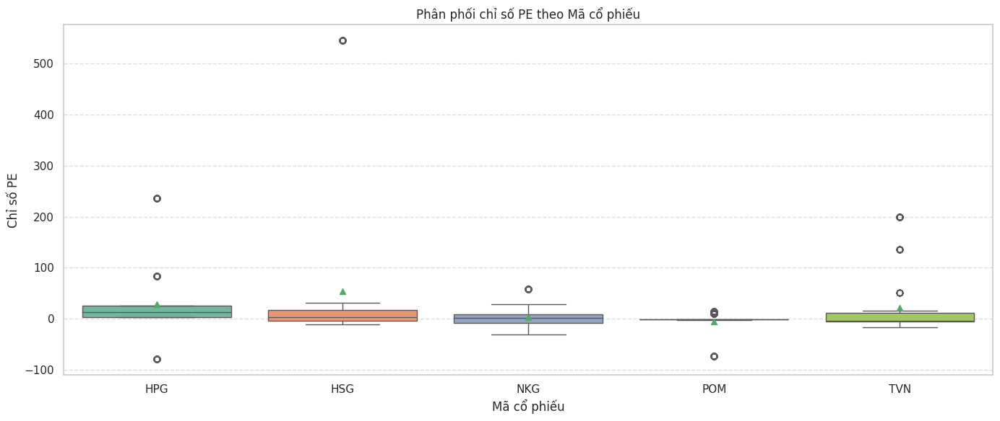



[BoxPlot] PE của HPG: Q1=3.78, Q3=25.48, IQR=21.70, ngưỡng outliers [-28.78, 58.03], outliers=190 → Có độ biến động/phân tán vừa phải.
Kết luận: Có giá trị ngoại lai đáng kể. Cân nhắc winsorize/capping, sử dụng robust scaler, hoặc mô hình chịu outlier (như Huber, quantile regression).




[BoxPlot] PE của HSG: Q1=-3.03, Q3=17.49, IQR=20.52, ngưỡng outliers [-33.81, 48.28], outliers=65 → Có độ biến động/phân tán vừa phải.
Kết luận: Có giá trị ngoại lai đáng kể. Cân nhắc winsorize/capping, sử dụng robust scaler, hoặc mô hình chịu outlier (như Huber, quantile regression).




[BoxPlot] PE của NKG: Q1=-7.86, Q3=8.68, IQR=16.54, ngưỡng outliers [-32.68, 33.49], outliers=59 → Có độ biến động/phân tán vừa phải.
Kết luận: Có giá trị ngoại lai đáng kể. Cân nhắc winsorize/capping, sử dụng robust scaler, hoặc mô hình chịu outlier (như Huber, quantile regression).




[BoxPlot] PE của POM: Q1=-1.35, Q3=-0.51, IQR=0.84, ngưỡng outliers [-2.62, 0.75], outliers=230 → Có độ biến động/phân tán vừa ph

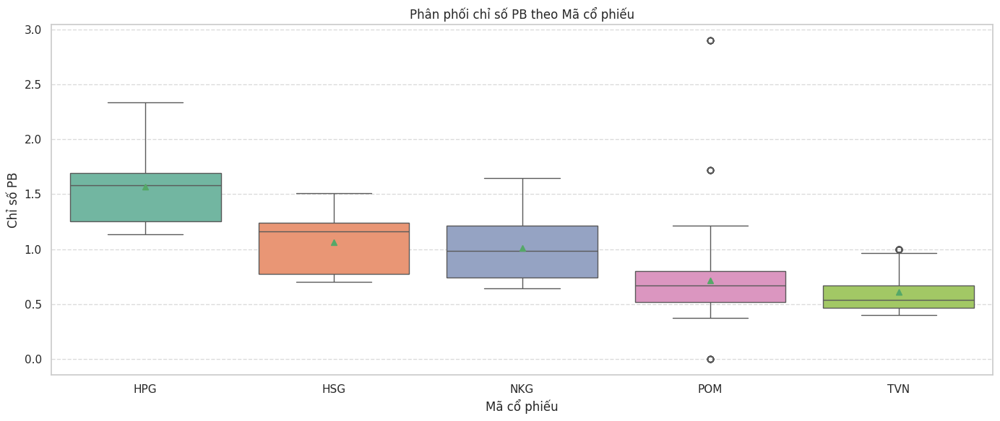



[BoxPlot] PB của HPG: Q1=1.25, Q3=1.69, IQR=0.44, ngưỡng outliers [0.58, 2.36], outliers=0 → Có độ biến động/phân tán vừa phải.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] PB của HSG: Q1=0.77, Q3=1.24, IQR=0.47, ngưỡng outliers [0.07, 1.94], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] PB của NKG: Q1=0.74, Q3=1.21, IQR=0.47, ngưỡng outliers [0.03, 1.92], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] PB của POM: Q1=0.52, Q3=0.80, IQR=0.28, ngưỡng outliers [0.10, 1.23], outliers=38 → Có độ biến động/phân tán vừa phải.
Kết luận: Có giá trị ngoại lai đáng kể. Cân nhắc winsorize/capping, sử dụng robust scaler, hoặc mô hình chịu outlier (như Huber, quantile regression).




[BoxPlot] PB của TVN: Q1=0.47, Q3=0.67, IQR=0.20, ngưỡng outliers [0.17, 0.97], outli

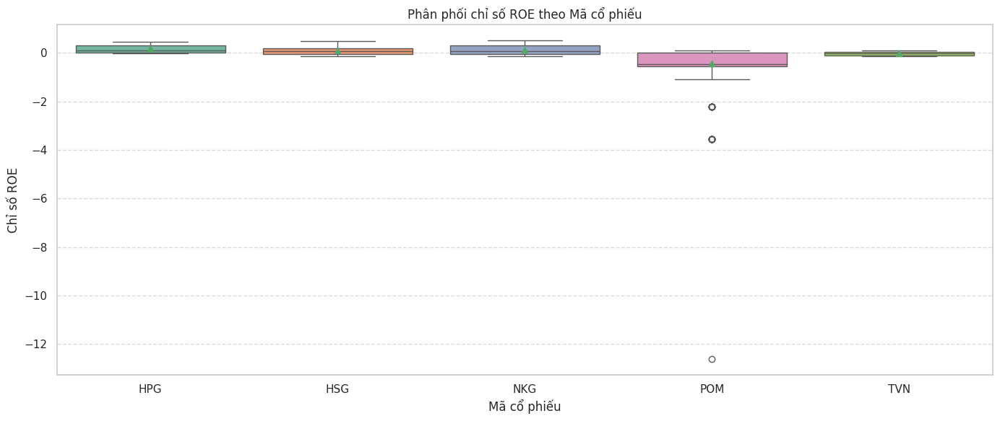



[BoxPlot] ROE của HPG: Q1=0.02, Q3=0.32, IQR=0.30, ngưỡng outliers [-0.43, 0.77], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROE của HSG: Q1=-0.05, Q3=0.18, IQR=0.23, ngưỡng outliers [-0.39, 0.53], outliers=0 → Có độ biến động/phân tán vừa phải.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROE của NKG: Q1=-0.05, Q3=0.30, IQR=0.35, ngưỡng outliers [-0.57, 0.83], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROE của POM: Q1=-0.56, Q3=-0.00, IQR=0.56, ngưỡng outliers [-1.40, 0.83], outliers=26 → Có độ biến động/phân tán vừa phải.
Kết luận: Có giá trị ngoại lai đáng kể. Cân nhắc winsorize/capping, sử dụng robust scaler, hoặc mô hình chịu outlier (như Huber, quantile regression).




[BoxPlot] ROE của TVN: Q1=-0.10, Q3=0.04, IQR=0.14, ngưỡng outliers [-0.3

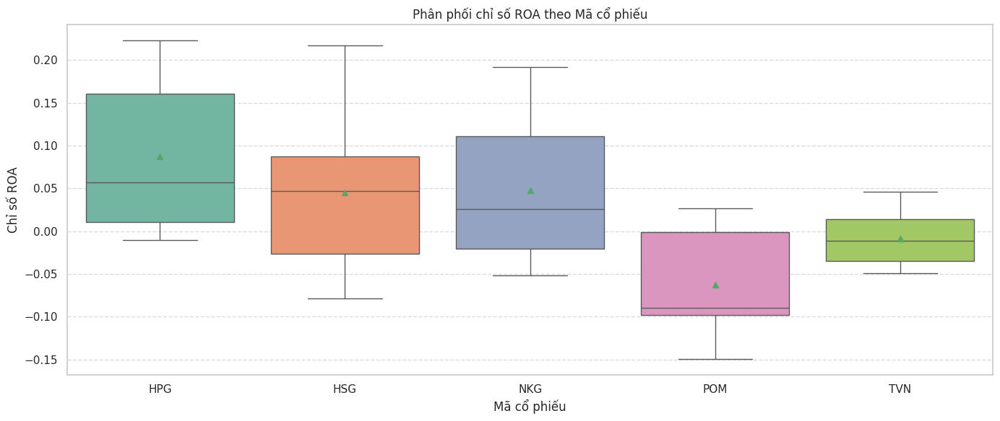



[BoxPlot] ROA của HPG: Q1=0.01, Q3=0.16, IQR=0.15, ngưỡng outliers [-0.21, 0.39], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROA của HSG: Q1=-0.03, Q3=0.09, IQR=0.11, ngưỡng outliers [-0.20, 0.26], outliers=0 → Có độ biến động/phân tán vừa phải.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROA của NKG: Q1=-0.02, Q3=0.11, IQR=0.13, ngưỡng outliers [-0.22, 0.31], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROA của POM: Q1=-0.10, Q3=-0.00, IQR=0.10, ngưỡng outliers [-0.24, 0.14], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.




[BoxPlot] ROA của TVN: Q1=-0.03, Q3=0.01, IQR=0.05, ngưỡng outliers [-0.11, 0.09], outliers=0 → Có độ biến động/phân tán cao.
Kết luận: Dữ liệu khá s

In [ ]:
# ĐỊNH GIÁ CƠ BẢN (FUNDAMENTALS)
# Insight: Cổ phiếu nào đang rẻ (P/E thấp)? Sức khỏe tài chính (ROE) ra sao?

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def hline():
    print("\n" + "=" * 50 + "\n")

metrics = ['pe', 'pb', 'roe', 'roa']
unique_stock_ids = df['stock_id'].unique()

print("--- Diễn giải & Kết luận cho Box Plot của các chỉ số Định giá Cơ bản ---")

for metric in metrics:
    print(f"\n## Phân tích chỉ số: {metric.upper()}")

    # Plotting one box plot per metric, showing all stock_ids
    plt.figure(figsize=(14, 6))
    sns.boxplot(data=df, x='stock_id', y=metric, showmeans=True, hue='stock_id', legend=False, palette='Set2')
    plt.title(f'Phân phối chỉ số {metric.upper()} theo Mã cổ phiếu')
    plt.xlabel('Mã cổ phiếu')
    plt.ylabel(f'Chỉ số {metric.upper()}')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Interpretation for each stock_id for the current metric, placed below the plot
    for stock_id in unique_stock_ids:
        df_stock = df[df['stock_id'] == stock_id]
        series = df_stock[metric].dropna()

        if len(series) >= 10:
            Q1, Q3 = np.percentile(series, [25, 75])
            IQR = Q3 - Q1
            lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
            outliers = series[(series < lower) | (series > upper)]

            # Cải thiện vol_tag để phù hợp với các chỉ số tài chính
            spread_desc = f"Độ phân tán (IQR): {IQR:.2f}. "
            if IQR > series.std() * 1.5: # Một heuristic để đánh giá độ biến động cao
                vol_tag = "Có độ biến động/phân tán cao."
            else:
                vol_tag = "Có độ biến động/phân tán vừa phải."

            hline()
            print(f"[BoxPlot] {metric.upper()} của {stock_id}: Q1={Q1:.2f}, Q3={Q3:.2f}, IQR={IQR:.2f}, "
                  f"ngưỡng outliers [{lower:.2f}, {upper:.2f}], outliers={len(outliers)} \u2192 {vol_tag}")
            if len(outliers) > 0:
                print("Kết luận: Có giá trị ngoại lai đáng kể. Cân nhắc winsorize/capping, sử dụng robust scaler, hoặc mô hình chịu outlier (như Huber, quantile regression).")
            else:
                print("Kết luận: Dữ liệu khá sạch, có thể sử dụng trực tiếp hoặc chuẩn hóa nhẹ nếu cần.")
            hline()
        else:
            hline()
            print(f"[BoxPlot] {metric.upper()} của {stock_id}: Không đủ dữ liệu ({len(series)} điểm) để phân tích chi tiết Box Plot.")
            hline()


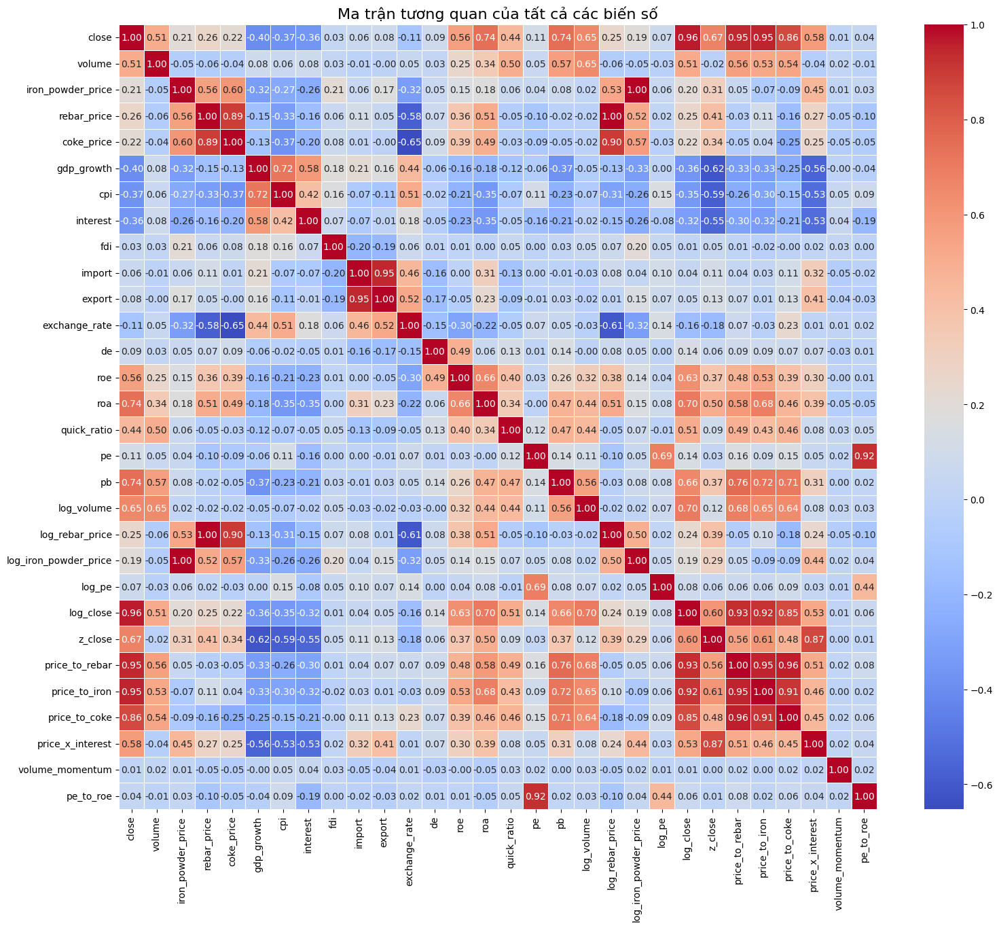



[Heatmap] Các cặp tương quan mạnh nhất:
  - iron_powder_price vs log_iron_powder_price: corr=1.00 (Mạnh)
  - rebar_price vs log_rebar_price: corr=1.00 (Mạnh)
  - close vs log_close: corr=0.96 (Mạnh)
  - price_to_rebar vs price_to_coke: corr=0.96 (Mạnh)
  - close vs price_to_iron: corr=0.95 (Mạnh)
  - price_to_rebar vs price_to_iron: corr=0.95 (Mạnh)
Kết luận: Tránh đa cộng tuyến (multicollinearity) bằng cách loại bớt hoặc gộp các biến có |corr| cao;
         cân nhắc PCA/regularization (Ridge/Lasso) hoặc chọn 1 biến đại diện.


TỔNG KẾT:
• Dùng kết quả histogram (skew/kurtosis) để quyết định biến đổi (log/Box-Cox) và xử lý outlier (winsorize).
• Kiểm tra scatter để xác nhận giả thuyết quan hệ; nếu yếu, thử biến phi tuyến/lag/rolling.
• Box plot cho biết độ biến động; chọn thang đo/robust loss phù hợp.
• Heatmap giúp chọn đặc trưng, tránh đa cộng tuyến trước khi modeling.


In [ ]:
# MA TRẬN TƯƠNG QUAN TỔNG HỢP (HEATMAP)
# Insight: Tìm ra các biến số có mối liên hệ mạnh nhất với nhau
# ======================================================
# Chọn các biến số đại diện quan trọng nhất để tránh rối mắt

import seaborn as sns
import matplotlib.pyplot as plt

# Chọn các biến số số học để tính toán ma trận tương quan
# Loại bỏ các cột không phải số hoặc không liên quan đến tương quan (như 'date', 'stock_id')
correlation_df = df.select_dtypes(include=['number']).drop(columns=['open', 'high', 'low', 'daily_return'], errors='ignore')

# Tính toán ma trận tương quan
corr_matrix = correlation_df.corr()

# Thiết lập kích thước biểu đồ
plt.figure(figsize=(18, 15))

# Vẽ heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Ma trận tương quan của tất cả các biến số', fontsize=16)
plt.show()

import numpy as np

def hline():
    print("\n" + "=" * 50 + "\n")

# Lấy danh sách các cột từ ma trận tương quan
corr_cols = correlation_df.columns

# Tạo danh sách các cặp tương quan
pairs = []
for i in range(len(corr_cols)):
    for j in range(i + 1, len(corr_cols)):
        v = corr_matrix.loc[corr_cols[i], corr_cols[j]]
        pairs.append((corr_cols[i], corr_cols[j], v))

# Sắp xếp các cặp tương quan theo giá trị tuyệt đối giảm dần và lấy top 6
pairs = sorted(pairs, key=lambda x: abs(x[2]), reverse=True)[:6]

hline()
print("[Heatmap] Các cặp tương quan mạnh nhất:")
for a, b, v in pairs:
    # Dựa trên ngưỡng từ mẫu code của bạn
    if abs(v) >= 0.7:
        tag = "Mạnh"
    elif abs(v) >= 0.4:
        tag = "Vừa"
    else:
        tag = "Yếu"
    print(f"  - {a} vs {b}: corr={v:.2f} ({tag})")
print("Kết luận: Tránh đa cộng tuyến (multicollinearity) bằng cách loại bớt hoặc gộp các biến có |corr| cao;")
print("         cân nhắc PCA/regularization (Ridge/Lasso) hoặc chọn 1 biến đại diện.")
hline()

print("TỔNG KẾT:")
print("• Dùng kết quả histogram (skew/kurtosis) để quyết định biến đổi (log/Box-Cox) và xử lý outlier (winsorize).")
print("• Kiểm tra scatter để xác nhận giả thuyết quan hệ; nếu yếu, thử biến phi tuyến/lag/rolling.")
print("• Box plot cho biết độ biến động; chọn thang đo/robust loss phù hợp.")
print("• Heatmap giúp chọn đặc trưng, tránh đa cộng tuyến trước khi modeling.")

**2. Mô tả & kiểm định thống kê**

In [ ]:
# ======================================================
# Statistical Analysis – Mô tả & Kiểm định Thống kê
# ======================================================
import pandas as pd
import numpy as np
from scipy import stats

# Hàm hỗ trợ in dòng kẻ
def hline():
    print("-" * 88)

# ---------- 1) Load và Chuẩn bị dữ liệu ----------
df = pd.read_csv('synchronized_data.csv')

# Chuyển đổi cột date
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])

# Feature Engineering cơ bản cho thống kê
# Lưu ý: Cần groupby theo 'stock_id' để tính lợi suất chính xác cho từng mã
df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100
df['month'] = df['date'].dt.month

# Loại bỏ giá trị thiếu (do pct_change tạo ra dòng đầu tiên là NaN)
df.dropna(inplace=True)

print(f"Dữ liệu sẵn sàng cho phân tích thống kê. Kích thước: {df.shape}")
hline()

Dữ liệu sẵn sàng cho phân tích thống kê. Kích thước: (3670, 34)
----------------------------------------------------------------------------------------


In [ ]:
# =====================================================================
# DESCRIPTIVE STATISTICS – Thống kê mô tả
# =====================================================================
import pandas as pd
import numpy as np

# 1. Load và chuẩn bị dữ liệu
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])

# Tính toán biến phái sinh cần thiết: daily_return (Lợi suất ngày)
df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# Bổ sung tạo cột 'month' ở đây
df['month'] = df['date'].dt.month

df.dropna(inplace=True) # Loại bỏ giá trị thiếu sau khi tính toán

# Tự động chọn TẤT CẢ các cột dữ liệu số để phân tích (trừ cột text/ngày tháng)
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Hiển thị bảng thống kê tổng hợp
print(f"Đang phân tích {len(numeric_cols)} biến số: {numeric_cols}")
desc = df[numeric_cols].describe().T
# Sử dụng print thay vì display để chạy được trên mọi môi trường python
print(desc)

def hline():
    print("-" * 88)

hline()
print("📘 Giải thích:")
print("- Mean: trung bình, phản ánh xu hướng trung tâm.")
print("- Std: độ lệch chuẩn, thể hiện mức độ biến động.")
print("- Min/Max: khoảng giá trị giúp phát hiện outlier.")
print("- 25%, 50%, 75%: các percentile → hiểu phân bố.")
hline()

# Phân tích cụ thể TẤT CẢ các biến
print("PHÂN TÍCH CHI TIẾT PHÂN PHỐI TỪNG BIẾN:")
for col in numeric_cols:
    mean, median, std = df[col].mean(), df[col].median(), df[col].std()
    skew = df[col].skew()

    hline()
    print(f"[{col}] Mean={mean:.2f}, Median={median:.2f}, Std={std:.2f}, Skew={skew:.2f}")

    if abs(skew) > 1:
        print("-> Kết luận: Dữ liệu LỆCH CAO (Skew > 1 hoặc < -1) → Cân nhắc log-transform hoặc xử lý outlier mạnh.")
    elif abs(skew) > 0.5:
        print("-> Kết luận: Dữ liệu LỆCH VỪA (0.5 < |Skew| < 1) → Có thể chấp nhận được nhưng cần lưu ý.")
    else:
        print("-> Kết luận: Dữ liệu phân bố GẦN ĐỐI XỨNG (Skew < 0.5) → Tốt cho mô hình, có thể dùng trực tiếp.")
hline()

Đang phân tích 32 biến số: ['close', 'daily_return', 'volume', 'iron_powder_price', 'rebar_price', 'coke_price', 'gdp_growth', 'cpi', 'interest', 'fdi', 'import', 'export', 'exchange_rate', 'de', 'roe', 'roa', 'quick_ratio', 'pe', 'pb', 'log_volume', 'log_rebar_price', 'log_iron_powder_price', 'log_pe', 'log_close', 'z_close', 'price_to_rebar', 'price_to_iron', 'price_to_coke', 'price_x_interest', 'volume_momentum', 'pe_to_roe', 'month']
                        count          mean           std           min  \
close                  3670.0  1.428700e+01  7.294817e+00  1.400000e+00   
daily_return           3670.0 -7.587923e-02  3.276526e+00 -1.666667e+01   
volume                 3670.0  9.405083e+06  1.168500e+07  0.000000e+00   
iron_powder_price      3670.0  3.066366e+06  4.050147e+05  2.431048e+06   
rebar_price            3670.0  1.719672e+07  2.436974e+06  1.409760e+07   
coke_price             3670.0  9.801204e+06  2.304342e+06  6.005198e+06   
gdp_growth             3670.0  5.

In [ ]:
# =====================================================================
# CORRELATION ANALYSIS – Phân tích tương quan
# =====================================================================
import pandas as pd
import numpy as np

def hline():
    print("-" * 88)

# Chọn các biến quan trọng nhất để xem tương quan
# (Bao gồm: Giá, Volume, Giá thép đầu ra, Giá quặng đầu vào, Vĩ mô)
num_cols = [
    "close", "daily_return", "volume",
    "rebar_price", "iron_powder_price",
    "gdp_growth", "interest", "exchange_rate"
]

# Tính toán ma trận tương quan
pearson_corr = df[num_cols].corr(method='pearson')
spearman_corr = df[num_cols].corr(method='spearman')

print("\n📈 Pearson Correlation (Tuyến tính - Nhạy cảm với giá trị ngoại lai):")
print(pearson_corr.round(2))

print("\n📈 Spearman Correlation (Hạng - Phi tuyến, bắt được xu hướng tăng/giảm chung):")
print(spearman_corr.round(2))

hline()
print("📘 Giải thích:")
print("- Pearson: Đo quan hệ tuyến tính (đường thẳng). Giá trị gần 1 hoặc -1 là tương quan chặt.")
print("- Spearman: Đo quan hệ đơn điệu. Tốt hơn nếu dữ liệu có outlier hoặc quan hệ cong (phi tuyến).")
hline()

# Nhận xét nhanh tự động
# Chúng ta sẽ xem xét tác động của các yếu tố bên ngoài lên Giá cổ phiếu (close)
target_var = "close"
impact_factors = ["rebar_price", "iron_powder_price", "interest", "exchange_rate", "gdp_growth"]

print(f"🔍 NHẬN XÉT TƯƠNG QUAN VỚI GIÁ CỔ PHIẾU ({target_var.upper()}):")

for var in impact_factors:
    if var in df.columns:
        r_p = pearson_corr.loc[target_var, var]
        r_s = spearman_corr.loc[target_var, var]

        # Phân loại mức độ tương quan
        tag_p = "MẠNH" if abs(r_p) >= 0.7 else ("VỪA" if abs(r_p) >= 0.4 else "YẾU")
        tag_s = "MẠNH" if abs(r_s) >= 0.7 else ("VỪA" if abs(r_s) >= 0.4 else "YẾU")

        hline()
        print(f"[Yếu tố] {var} vs {target_var}:")
        print(f"   - Pearson:  {r_p:.2f} ({tag_p})")
        print(f"   - Spearman: {r_s:.2f} ({tag_s})")

        # Logic đưa ra nhận xét
        if r_p > 0.4 and r_s > 0.4:
            print(f"👉 Quan hệ THUẬN chiều: Khi {var} tăng, giá cổ phiếu thường TĂNG theo.")
        elif r_p < -0.4 and r_s < -0.4:
            print(f"👉 Quan hệ NGHỊCH chiều: Khi {var} tăng, giá cổ phiếu thường GIẢM.")
        elif abs(r_p) < 0.2 and abs(r_s) < 0.2:
            print(f"👉 Quan hệ rất YẾU hoặc không rõ ràng.")
        else:
            print(f"👉 Quan hệ phức tạp hoặc phi tuyến (cần xem biểu đồ scatter để rõ hơn).")

hline()


📈 Pearson Correlation (Tuyến tính - Nhạy cảm với giá trị ngoại lai):
                   close  daily_return  volume  rebar_price  \
close               1.00          0.02    0.51         0.26   
daily_return        0.02          1.00    0.04        -0.06   
volume              0.51          0.04    1.00        -0.06   
rebar_price         0.26         -0.06   -0.06         1.00   
iron_powder_price   0.21          0.01   -0.05         0.56   
gdp_growth         -0.40         -0.00    0.08        -0.15   
interest           -0.35          0.04    0.08        -0.15   
exchange_rate      -0.11          0.03    0.05        -0.58   

                   iron_powder_price  gdp_growth  interest  exchange_rate  
close                           0.21       -0.40     -0.35          -0.11  
daily_return                    0.01       -0.00      0.04           0.03  
volume                         -0.05        0.08      0.08           0.05  
rebar_price                     0.56       -0.15     -0.15

In [ ]:
# =====================================================================
# HYPOTHESIS TESTING – Kiểm định giả thuyết
# =====================================================================
import pandas as pd
import numpy as np
from scipy import stats

def hline():
    print("-" * 88)

# ---------------------------------------------------------
# GIẢ THUYẾT 1: KIỂM ĐỊNH MÙA VỤ (T-TEST)
# Giả định: Lợi suất nửa đầu năm (<= T6) khác biệt so với nửa cuối năm (> T6)?
# ---------------------------------------------------------
cut_month = 6
before = df.loc[df["month"] <= cut_month, "daily_return"]
after = df.loc[df["month"] > cut_month, "daily_return"]

t_stat, p_val = stats.ttest_ind(before, after, equal_var=False, nan_policy='omit')

hline()
print("📊 1. Hypothesis Test: So sánh Lợi suất theo Mùa vụ (Trước vs Sau tháng 6)")
print(f"   - T-statistic = {t_stat:.3f}, p-value = {p_val:.4f}")

if p_val < 0.05:
    print("👉 Kết luận: Bác bỏ H0 → Có sự khác biệt có ý nghĩa thống kê giữa hai giai đoạn.")
else:
    print("👉 Kết luận: Chấp nhận H0 → Không đủ bằng chứng để khẳng định khác biệt (Mùa vụ không ảnh hưởng rõ rệt).")


# ---------------------------------------------------------
# GIẢ THUYẾT 2: KIỂM ĐỊNH CHI-SQUARE (Mối liên hệ biến phân loại)
# Giả định: Giai đoạn trong năm có liên quan đến xác suất Tăng/Giảm giá không?
# ---------------------------------------------------------
df["return_direction"] = np.where(df["daily_return"] > 0, "Tăng", "Giảm")
cont_table = pd.crosstab(df["month"] <= cut_month, df["return_direction"])
cont_table.index = ["Cuối năm (>T6)", "Đầu năm (<=T6)"]

chi2, p_chi, dof, exp = stats.chi2_contingency(cont_table)

hline()
print("📊 2. Chi-square Test: Liên hệ giữa Mùa vụ và Hướng biến động (Tăng/Giảm)")
print(f"   - Chi2 Statistic = {chi2:.2f}, p-value = {p_chi:.4f}")

if p_chi < 0.05:
    print("👉 Kết luận: Có mối liên hệ có ý nghĩa thống kê.")
else:
    print("👉 Kết luận: Không có mối liên hệ đáng kể.")


# ---------------------------------------------------------
# GIẢ THUYẾT 3: TÁC ĐỘNG CỦA LÃI SUẤT (Interest Rate Impact) - [BỔ SUNG]
# Giả định: Lợi suất cổ phiếu trong môi trường Lãi suất CAO có khác biệt so với Lãi suất THẤP?
# ---------------------------------------------------------
# Xác định ngưỡng: Dùng mức trung bình của lãi suất trong giai đoạn khảo sát
interest_threshold = df["interest"].mean()

# Chia nhóm dữ liệu
high_rate_group = df.loc[df["interest"] > interest_threshold, "daily_return"]
low_rate_group = df.loc[df["interest"] <= interest_threshold, "daily_return"]

# Thực hiện T-test độc lập
t_stat_ir, p_val_ir = stats.ttest_ind(high_rate_group, low_rate_group, equal_var=False, nan_policy='omit')

hline()
print("📊 3. Hypothesis Test: Tác động của Môi trường Lãi suất (Cao vs Thấp)")
print(f"   - Ngưỡng Lãi suất trung bình: {interest_threshold:.2%}")
print(f"   - Lợi suất TB nhóm Lãi suất CAO (>TB):  {high_rate_group.mean():.4f}%")
print(f"   - Lợi suất TB nhóm Lãi suất THẤP (<=TB): {low_rate_group.mean():.4f}%")
print(f"   - T-statistic = {t_stat_ir:.3f}, p-value = {p_val_ir:.4f}")

if p_val_ir < 0.05:
    print("👉 Kết luận: Bác bỏ H0 → Môi trường lãi suất ẢNH HƯỞNG ĐÁNG KỂ đến hiệu quả đầu tư.")
    if t_stat_ir < 0:
        print("   (Chi tiết: Lãi suất CAO làm giảm lợi suất cổ phiếu so với lãi suất thấp).")
else:
    print("👉 Kết luận: Chấp nhận H0 → Không thấy sự khác biệt rõ rệt về lợi suất giữa hai môi trường lãi suất.")
hline()

# =====================================================================
# TỔNG KẾT
# =====================================================================
print("📚 Tổng kết Bước 2 (Statistical Analysis):")
print("• Đã hoàn thành kiểm định các giả thuyết về Mùa vụ và Vĩ mô (Lãi suất).")
print("• Kết quả từ Giả thuyết 3 đặc biệt quan trọng để quyết định có nên đưa biến 'interest' vào mô hình dự báo hay không.")
hline()

# =====================================================================
# PHẦN B: KIỂM ĐỊNH YẾU TỐ VĨ MÔ & HÀNG HÓA (MACRO & COMMODITIES)
# =====================================================================

def check_impact(df, factor_col, factor_name, target_col="daily_return"):
    """
    Hàm tự động thực hiện T-test so sánh lợi suất trong 2 môi trường:
    - Môi trường CAO (Giá trị Factor > Trung vị)
    - Môi trường THẤP (Giá trị Factor <= Trung vị)
    """
    if factor_col not in df.columns:
        print(f"⚠️ Không tìm thấy cột {factor_col} trong dữ liệu.")
        return

    threshold = df[factor_col].median()
    high_group = df.loc[df[factor_col] > threshold, target_col]
    low_group = df.loc[df[factor_col] <= threshold, target_col]

    # T-test
    t_stat, p_val = stats.ttest_ind(high_group, low_group, equal_var=False, nan_policy='omit')

    print(f"📊 Kiểm định tác động của: {factor_name.upper()}")
    print(f"   - Ngưỡng phân chia (Median): {threshold:,.2f}")
    print(f"   - Lợi suất TB nhóm CAO:  {high_group.mean():.4f}%")
    print(f"   - Lợi suất TB nhóm THẤP: {low_group.mean():.4f}%")
    print(f"   - T-statistic = {t_stat:.3f}, p-value = {p_val:.4f}")

    if p_val < 0.05:
        print(f"👉 Kết luận: Bác bỏ H0 → {factor_name} ẢNH HƯỞNG MẠNH đến lợi suất.")
        if t_stat < 0: # Mean High < Mean Low
             print(f"   (Chi tiết: Khi {factor_name} tăng cao -> Lợi suất cổ phiếu có xu hướng GIẢM/KÉM hơn)")
        else:
             print(f"   (Chi tiết: Khi {factor_name} tăng cao -> Lợi suất cổ phiếu có xu hướng TĂNG/TỐT hơn)")
    else:
        print(f"👉 Kết luận: Chấp nhận H0 → Chưa thấy tác động rõ rệt của {factor_name} trong ngắn hạn.")
    hline()

# --- GIẢ THUYẾT 3: LÃI SUẤT (INTEREST RATE) ---
check_impact(df, "interest", "Lãi suất (Interest Rate)")

# --- GIẢ THUYẾT 4: TỶ GIÁ (EXCHANGE RATE) ---
check_impact(df, "exchange_rate", "Tỷ giá (Exchange Rate)")

# --- GIẢ THUYẾT 5: GIÁ QUẶNG SẮT (IRON POWDER - INPUT COST) ---
check_impact(df, "iron_powder_price", "Giá Quặng Sắt (Iron Powder)")

# --- GIẢ THUYẾT 6: GIÁ THÉP THANH VẰN (REBAR PRICE - OUTPUT PRICE) ---
check_impact(df, "rebar_price", "Giá Thép (Rebar Price)")

# =====================================================================
# TỔNG KẾT CHUNG BƯỚC 3
# =====================================================================
print("📚 TỔNG KẾT BƯỚC HYPOTHESIS TESTING:")
print("1. Đã kiểm tra yếu tố thời gian (Mùa vụ).")
print("2. Đã đánh giá độ nhạy của cổ phiếu với các biến Vĩ mô (Lãi suất, Tỷ giá).")
print("3. Đã đánh giá tác động của Chu kỳ hàng hóa (Giá quặng, Giá thép).")
print("→ Các biến có p-value < 0.05 là các 'Feature quan trọng' cần được ưu tiên giữ lại cho bước Modelling.")
hline()


----------------------------------------------------------------------------------------
📊 1. Hypothesis Test: So sánh Lợi suất theo Mùa vụ (Trước vs Sau tháng 6)
   - T-statistic = -0.250, p-value = 0.8028
👉 Kết luận: Chấp nhận H0 → Không đủ bằng chứng để khẳng định khác biệt (Mùa vụ không ảnh hưởng rõ rệt).
----------------------------------------------------------------------------------------
📊 2. Chi-square Test: Liên hệ giữa Mùa vụ và Hướng biến động (Tăng/Giảm)
   - Chi2 Statistic = 0.80, p-value = 0.3697
👉 Kết luận: Không có mối liên hệ đáng kể.
----------------------------------------------------------------------------------------
📊 3. Hypothesis Test: Tác động của Môi trường Lãi suất (Cao vs Thấp)
   - Ngưỡng Lãi suất trung bình: 3.82%
   - Lợi suất TB nhóm Lãi suất CAO (>TB):  0.0485%
   - Lợi suất TB nhóm Lãi suất THẤP (<=TB): -0.1769%
   - T-statistic = 2.025, p-value = 0.0429
👉 Kết luận: Bác bỏ H0 → Môi trường lãi suất ẢNH HƯỞNG ĐÁNG KỂ đến hiệu quả đầu tư.
-------------

**3. Feature engineering - Tạo đặc trưng mới từ dữ liệu**

In [ ]:
import pandas as pd
import numpy as np

# 1. Load và chuẩn bị dữ liệu
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date']) # Sắp xếp để đảm bảo tính đúng đắn khi rolling/lag

# Tính lợi suất cơ bản
df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# =====================================================================
# 3️⃣ FEATURE ENGINEERING (Final Update)
# =====================================================================

# ---------------------------------------------------------------------
# A. TRANSFORMATIONS (Biến đổi dữ liệu & Chuẩn hóa)
# ---------------------------------------------------------------------

# 1. Log Transformation (Logarit hóa)
# Danh sách MỚI: Thêm 'coke_price', Bỏ 'de'
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']

for col in skewed_cols:
    if col in df.columns:
        # Xử lý số âm nếu có (cộng thêm offset)
        if (df[col] <= 0).any():
            offset = abs(df[col].min()) + 1
            df[f'log_{col}'] = np.log1p(df[col] + offset)
        else:
            df[f'log_{col}'] = np.log1p(df[col])

# 2. Z-Score Standardization (Chuẩn hóa Z-Score cho riêng từng mã cổ phiếu)
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

### TRỰC QUAN HÓA VÀ ĐÁNH GIÁ HIỆU QUẢ BIẾN ĐỔI DỮ LIỆU




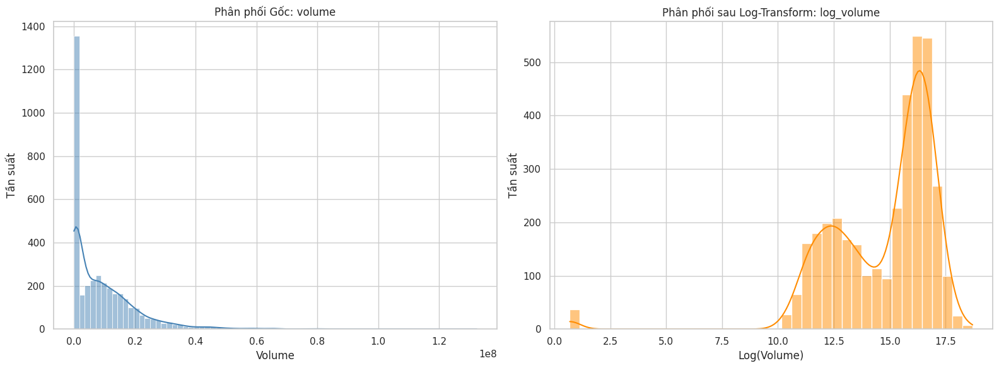

#### Đánh giá biến số 'volume':
- Gốc: Skewness (Độ lệch) = 2.70, Kurtosis (Độ nhọn) = 13.88
- Sau Log: Skewness = -2.11, Kurtosis = 8.82
✅ Lợi ích: Phép biến đổi Log đã giảm thành công cả độ lệch và độ nhọn, giúp phân phối đối xứng hơn và hạn chế tác động của các giá trị cực đoan (outliers).
   Ứng dụng: Biến này hiện phù hợp hơn cho các mô hình tuyến tính (thường giả định phân phối chuẩn) và giúp ổn định phương sai.




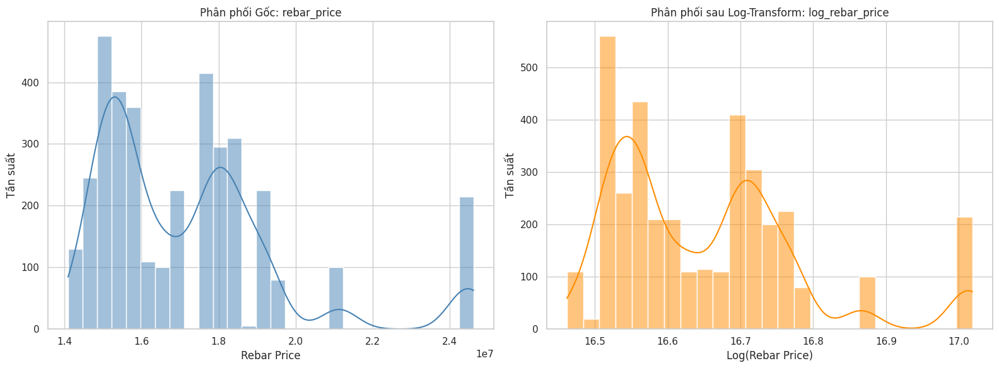

#### Đánh giá biến số 'rebar_price':
- Gốc: Skewness (Độ lệch) = 1.46, Kurtosis (Độ nhọn) = 2.14
- Sau Log: Skewness = 1.09, Kurtosis = 0.99
✅ Lợi ích: Phép biến đổi Log đã giảm thành công cả độ lệch và độ nhọn, giúp phân phối đối xứng hơn và hạn chế tác động của các giá trị cực đoan (outliers).
   Ứng dụng: Biến này hiện phù hợp hơn cho các mô hình tuyến tính (thường giả định phân phối chuẩn) và giúp ổn định phương sai.




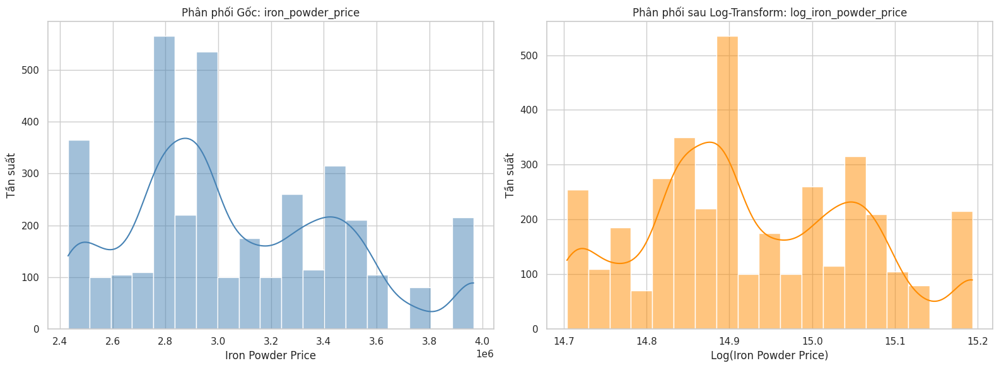

#### Đánh giá biến số 'iron_powder_price':
- Gốc: Skewness (Độ lệch) = 0.47, Kurtosis (Độ nhọn) = -0.50
- Sau Log: Skewness = 0.23, Kurtosis = -0.70
✅ Lợi ích: Độ lệch (Skewness) đã giảm đáng kể, phân phối trở nên cân đối hơn. Dù độ nhọn có thể chưa giảm nhiều, nhưng vấn đề 'đuôi dài' (long tail) đã được cải thiện.
   Ứng dụng: Tốt cho các mô hình nhạy cảm với dữ liệu lệch, giúp chuẩn hóa phần dư trong phân tích hồi quy.




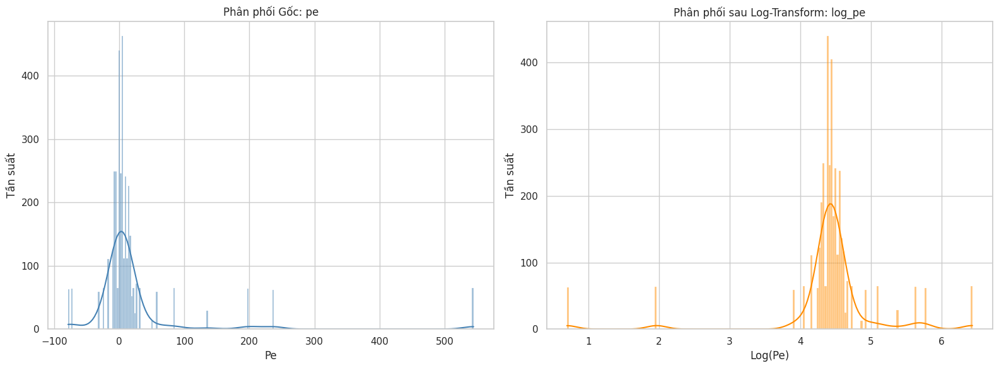

#### Đánh giá biến số 'pe':
- Gốc: Skewness (Độ lệch) = 4.65, Kurtosis (Độ nhọn) = 24.54
- Sau Log: Skewness = -2.50, Kurtosis = 13.64
✅ Lợi ích: Phép biến đổi Log đã giảm thành công cả độ lệch và độ nhọn, giúp phân phối đối xứng hơn và hạn chế tác động của các giá trị cực đoan (outliers).
   Ứng dụng: Biến này hiện phù hợp hơn cho các mô hình tuyến tính (thường giả định phân phối chuẩn) và giúp ổn định phương sai.




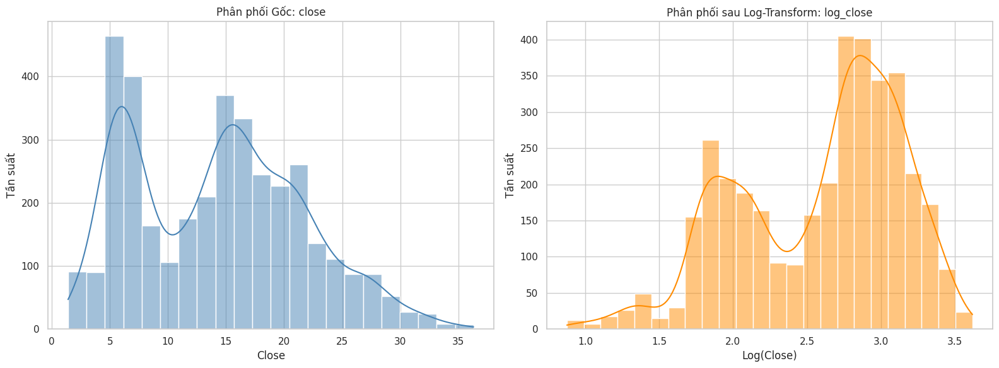

#### Đánh giá biến số 'close':
- Gốc: Skewness (Độ lệch) = 0.29, Kurtosis (Độ nhọn) = -0.71
- Sau Log: Skewness = -0.56, Kurtosis = -0.58
⚠️ Lưu ý: Biến đổi Log có tác động nhưng chưa thể chuẩn hóa hoàn toàn (hoặc làm tăng độ lệch trong một số trường hợp đặc biệt).
   Ứng dụng: Cân nhắc giữ nguyên hoặc thử các kỹ thuật khác như Box-Cox nếu cần phân phối chuẩn nghiêm ngặt.




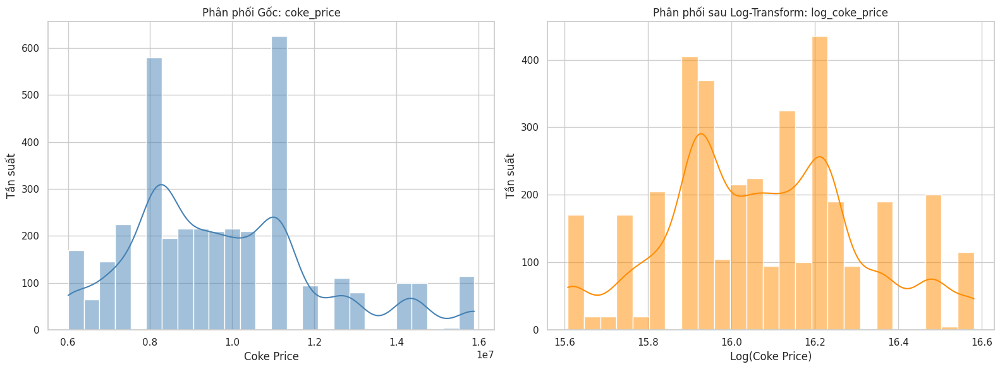

#### Đánh giá biến số 'coke_price':
- Gốc: Skewness (Độ lệch) = 0.70, Kurtosis (Độ nhọn) = 0.15
- Sau Log: Skewness = 0.15, Kurtosis = -0.37
✅ Lợi ích: Độ lệch (Skewness) đã giảm đáng kể, phân phối trở nên cân đối hơn. Dù độ nhọn có thể chưa giảm nhiều, nhưng vấn đề 'đuôi dài' (long tail) đã được cải thiện.
   Ứng dụng: Tốt cho các mô hình nhạy cảm với dữ liệu lệch, giúp chuẩn hóa phần dư trong phân tích hồi quy.


#### Đánh giá Chuẩn hóa Z-Score cho biến 'close':


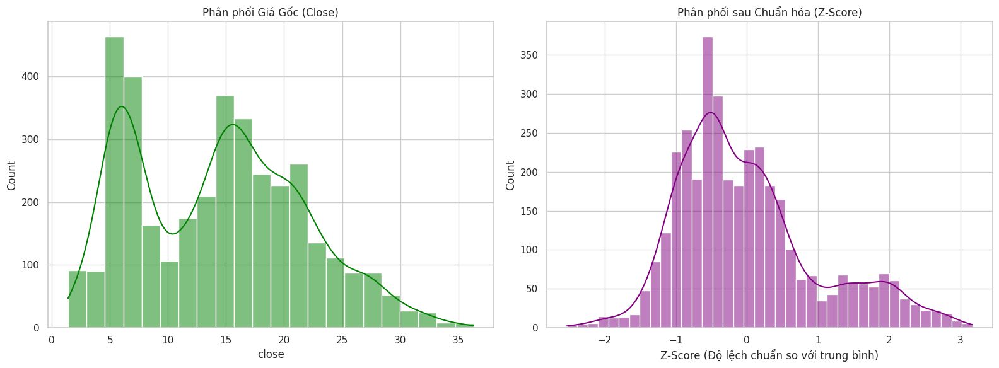

- Gốc (Close): Mean = 14.31, Std = 7.31
- Z-Score:     Mean = 0.00 (~0), Std = 1.00 (~1)
✅ Lợi ích: Đưa giá cổ phiếu về cùng một hệ quy chiếu (Mean=0, Std=1) mà không làm thay đổi hình dáng phân phối.
   Ứng dụng: Cực kỳ quan trọng khi so sánh sức mạnh giá của các cổ phiếu có thị giá khác nhau (vd: HPG giá 30k vs TVN giá 8k) trong cùng một mô hình Machine Learning.




In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def hline():
    print("\n" + "=" * 80 + "\n")

# Ensure columns are available (from previous step)
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']

print("### TRỰC QUAN HÓA VÀ ĐÁNH GIÁ HIỆU QUẢ BIẾN ĐỔI DỮ LIỆU")
hline()

# =====================================================================
# 1. ĐÁNH GIÁ LOG TRANSFORMATION
# =====================================================================
for col in skewed_cols:
    if col not in df.columns: continue

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Biểu đồ phân phối Gốc
    sns.histplot(df[col].dropna(), kde=True, ax=axes[0], color='steelblue')
    axes[0].set_title(f'Phân phối Gốc: {col}')
    axes[0].set_xlabel(col.replace('_', ' ').title())
    axes[0].set_ylabel('Tần suất')

    # Biểu đồ phân phối sau Log
    log_col_name = f'log_{col}'
    if log_col_name in df.columns:
        sns.histplot(df[log_col_name].dropna(), kde=True, ax=axes[1], color='darkorange')
        axes[1].set_title(f'Phân phối sau Log-Transform: {log_col_name}')
        axes[1].set_xlabel(f'Log({col.replace("_", " ").title()})')
        axes[1].set_ylabel('Tần suất')
    else:
        axes[1].set_title(f'Không tìm thấy dữ liệu log cho {col}')
        axes[1].set_xlabel('')
        axes[1].set_ylabel('')

    plt.tight_layout()
    plt.show()

    # PHẦN ĐÁNH GIÁ (INTERPRETATION)
    print(f"#### Đánh giá biến số '{col}':")
    original_series = df[col].dropna()
    transformed_series = df[log_col_name].dropna() if log_col_name in df.columns else None

    if len(original_series) > 0 and transformed_series is not None:
        skew_orig = original_series.skew()
        kurt_orig = original_series.kurt()
        skew_log = transformed_series.skew()
        kurt_log = transformed_series.kurt()

        print(f"- Gốc: Skewness (Độ lệch) = {skew_orig:.2f}, Kurtosis (Độ nhọn) = {kurt_orig:.2f}")
        print(f"- Sau Log: Skewness = {skew_log:.2f}, Kurtosis = {kurt_log:.2f}")

        if abs(skew_log) < abs(skew_orig) and abs(kurt_log) < abs(kurt_orig):
            print("✅ Lợi ích: Phép biến đổi Log đã giảm thành công cả độ lệch và độ nhọn, giúp phân phối đối xứng hơn và hạn chế tác động của các giá trị cực đoan (outliers).")
            print("   Ứng dụng: Biến này hiện phù hợp hơn cho các mô hình tuyến tính (thường giả định phân phối chuẩn) và giúp ổn định phương sai.")
        elif abs(skew_log) < abs(skew_orig):
            print("✅ Lợi ích: Độ lệch (Skewness) đã giảm đáng kể, phân phối trở nên cân đối hơn. Dù độ nhọn có thể chưa giảm nhiều, nhưng vấn đề 'đuôi dài' (long tail) đã được cải thiện.")
            print("   Ứng dụng: Tốt cho các mô hình nhạy cảm với dữ liệu lệch, giúp chuẩn hóa phần dư trong phân tích hồi quy.")
        else:
            print("⚠️ Lưu ý: Biến đổi Log có tác động nhưng chưa thể chuẩn hóa hoàn toàn (hoặc làm tăng độ lệch trong một số trường hợp đặc biệt).")
            print("   Ứng dụng: Cân nhắc giữ nguyên hoặc thử các kỹ thuật khác như Box-Cox nếu cần phân phối chuẩn nghiêm ngặt.")
    else:
        print("   Không đủ dữ liệu để đánh giá.")
    hline()

# =====================================================================
# 2. ĐÁNH GIÁ Z-SCORE STANDARDIZATION (CHO CLOSE PRICE)
# =====================================================================
print("#### Đánh giá Chuẩn hóa Z-Score cho biến 'close':")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(df['close'].dropna(), kde=True, ax=axes[0], color='green')
axes[0].set_title('Phân phối Giá Gốc (Close)')

sns.histplot(df['z_close'].dropna(), kde=True, ax=axes[1], color='purple')
axes[1].set_title('Phân phối sau Chuẩn hóa (Z-Score)')
axes[1].set_xlabel('Z-Score (Độ lệch chuẩn so với trung bình)')

plt.tight_layout()
plt.show()

print(f"- Gốc (Close): Mean = {df['close'].mean():.2f}, Std = {df['close'].std():.2f}")
print(f"- Z-Score:     Mean = {df['z_close'].mean():.2f} (~0), Std = {df['z_close'].std():.2f} (~1)")
print("✅ Lợi ích: Đưa giá cổ phiếu về cùng một hệ quy chiếu (Mean=0, Std=1) mà không làm thay đổi hình dáng phân phối.")
print("   Ứng dụng: Cực kỳ quan trọng khi so sánh sức mạnh giá của các cổ phiếu có thị giá khác nhau (vd: HPG giá 30k vs TVN giá 8k) trong cùng một mô hình Machine Learning.")
hline()

In [ ]:
# AGGREGATIONS (TỔNG HỢP & ROLLING)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load và tái tạo trạng thái trước (Transformation)
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date'])

df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# Tái tạo các cột Transformation (Log & Z-score) từ bước trước
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']
for col in skewed_cols:
    if col in df.columns:
        if (df[col] <= 0).any():
            offset = abs(df[col].min()) + 1
            df[f'log_{col}'] = np.log1p(df[col] + offset)
        else:
            df[f'log_{col}'] = np.log1p(df[col])
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

# =====================================================================
# 2. THỰC HIỆN AGGREGATIONS (TỔNG HỢP & ROLLING)
# =====================================================================
print("### BẮT ĐẦU BƯỚC AGGREGATIONS...")

# A. Rolling Windows (Cửa sổ trượt)
# Mục tiêu: Làm mượt dữ liệu và đo lường biến động cục bộ
# ---------------------------------------------------------
windows = [5, 20] # 5 ngày (1 tuần), 20 ngày (1 tháng)

for window in windows:
    # Rolling Mean: Xu hướng trung bình
    df[f'rolling_mean_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).mean())

    # Rolling Std: Độ lệch chuẩn trượt (Đo lường mức độ rủi ro trong ngắn hạn)
    df[f'rolling_std_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).std())

    # [Nâng cao] Bollinger Bands (Được tạo từ Mean & Std)
    if window == 20:
        df['bb_upper'] = df[f'rolling_mean_{window}'] + 2 * df[f'rolling_std_{window}']
        df['bb_lower'] = df[f'rolling_mean_{window}'] - 2 * df[f'rolling_std_{window}']

# B. Lag Features (Độ trễ)
# Mục tiêu: Dùng quá khứ để dự báo tương lai
# ---------------------------------------------------------
lags = [1, 5]
for lag in lags:
    df[f'close_lag_{lag}'] = df.groupby('stock_id')['close'].shift(lag)
    df[f'return_lag_{lag}'] = df.groupby('stock_id')['daily_return'].shift(lag)

# C. Technical Indicators (Aggregation phức tạp)
# ---------------------------------------------------------
# 1. RSI (Relative Strength Index) - 14 ngày
def calculate_rsi(x, window=14):
    delta = x.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

df['rsi_14'] = df.groupby('stock_id')['close'].transform(calculate_rsi)

# 2. MACD (Moving Average Convergence Divergence)
# Tính EMA (Exponential Moving Average)
df['ema_12'] = df.groupby('stock_id')['close'].transform(lambda x: x.ewm(span=12, adjust=False).mean())
df['ema_26'] = df.groupby('stock_id')['close'].transform(lambda x: x.ewm(span=26, adjust=False).mean())
df['macd'] = df['ema_12'] - df['ema_26']
df['macd_signal'] = df.groupby('stock_id')['macd'].transform(lambda x: x.ewm(span=9, adjust=False).mean())

# Xóa cột tạm
df.drop(columns=['ema_12', 'ema_26'], inplace=True)

# Loại bỏ NaN sinh ra do Rolling (quan trọng để chạy mô hình sau này)
df_agg = df.dropna().copy()

print(f"Hoàn tất Aggregations. Kích thước dữ liệu sau xử lý: {df_agg.shape}")
print("Các đặc trưng mới được tạo ra:")
print([c for c in df_agg.columns if any(x in c for x in ['rolling', 'lag', 'rsi', 'macd', 'bb_'])])

### BẮT ĐẦU BƯỚC AGGREGATIONS...
Hoàn tất Aggregations. Kích thước dữ liệu sau xử lý: (3580, 47)
Các đặc trưng mới được tạo ra:
['rolling_mean_5', 'rolling_std_5', 'rolling_mean_20', 'rolling_std_20', 'bb_upper', 'bb_lower', 'close_lag_1', 'return_lag_1', 'close_lag_5', 'return_lag_5', 'rsi_14', 'macd', 'macd_signal']


Đang thực hiện vẽ biểu đồ cho 5 mã cổ phiếu: ['HPG' 'HSG' 'NKG' 'POM' 'TVN']


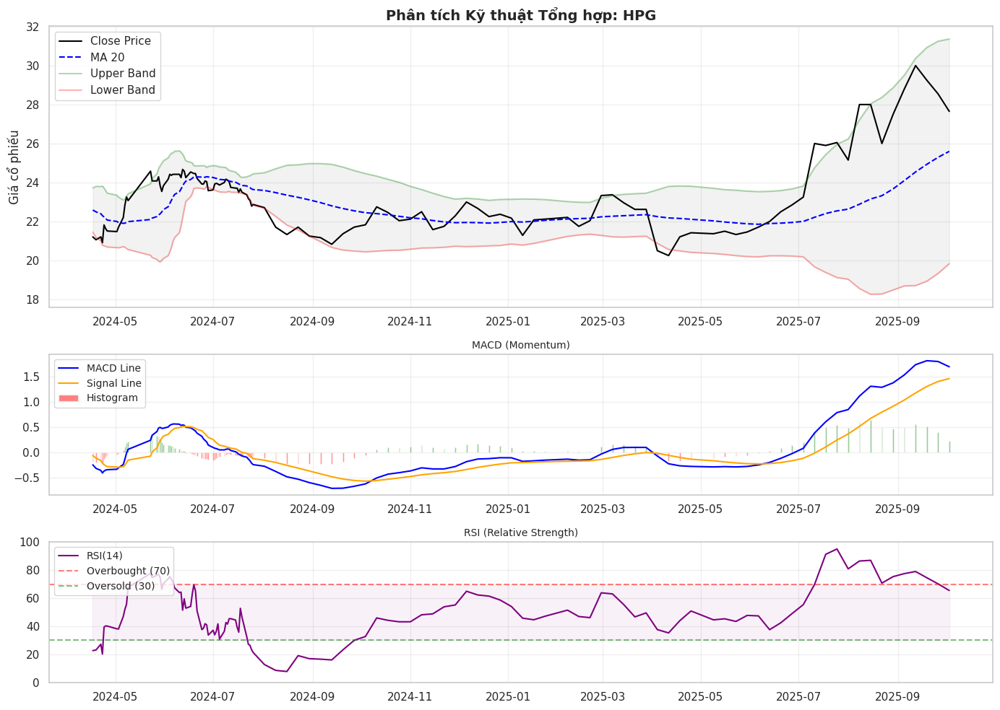

--------------------------------------------------------------------------------


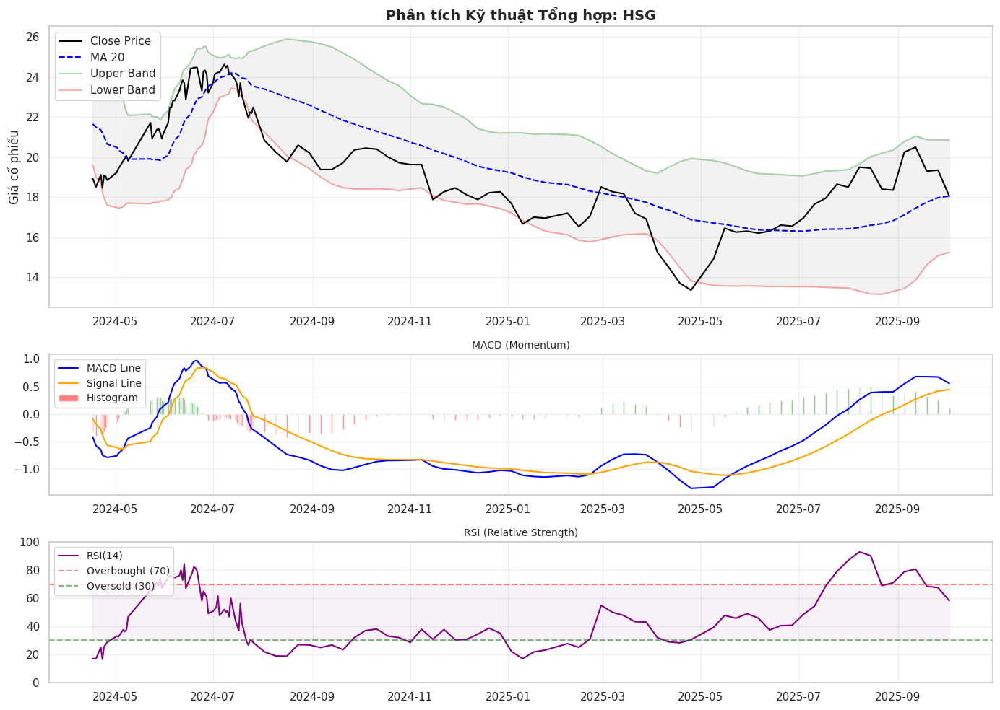

--------------------------------------------------------------------------------


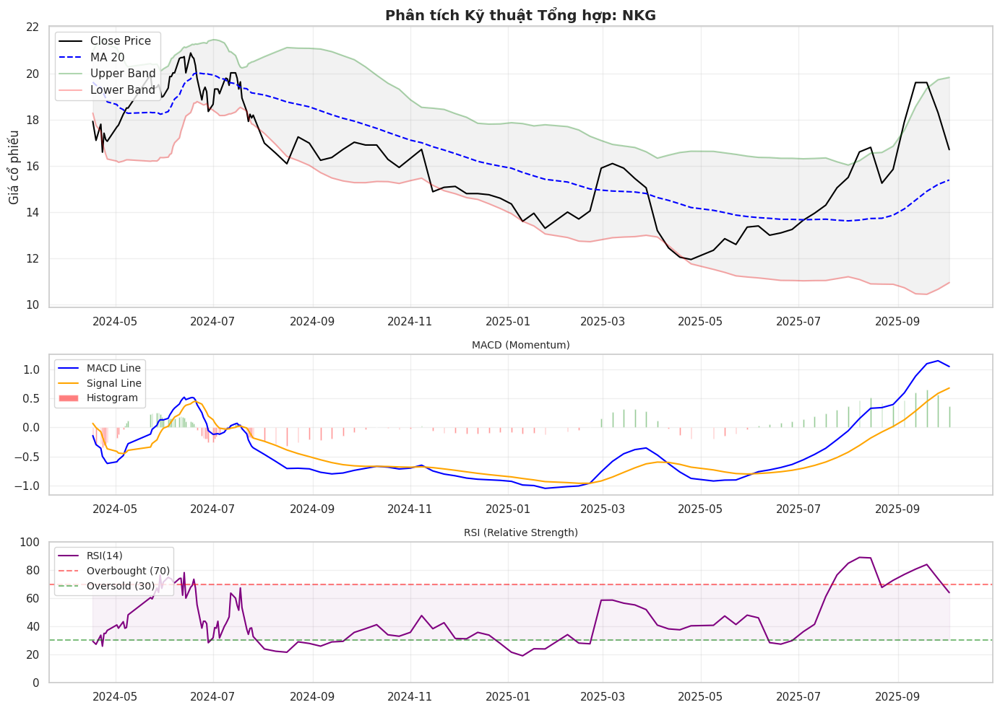

--------------------------------------------------------------------------------


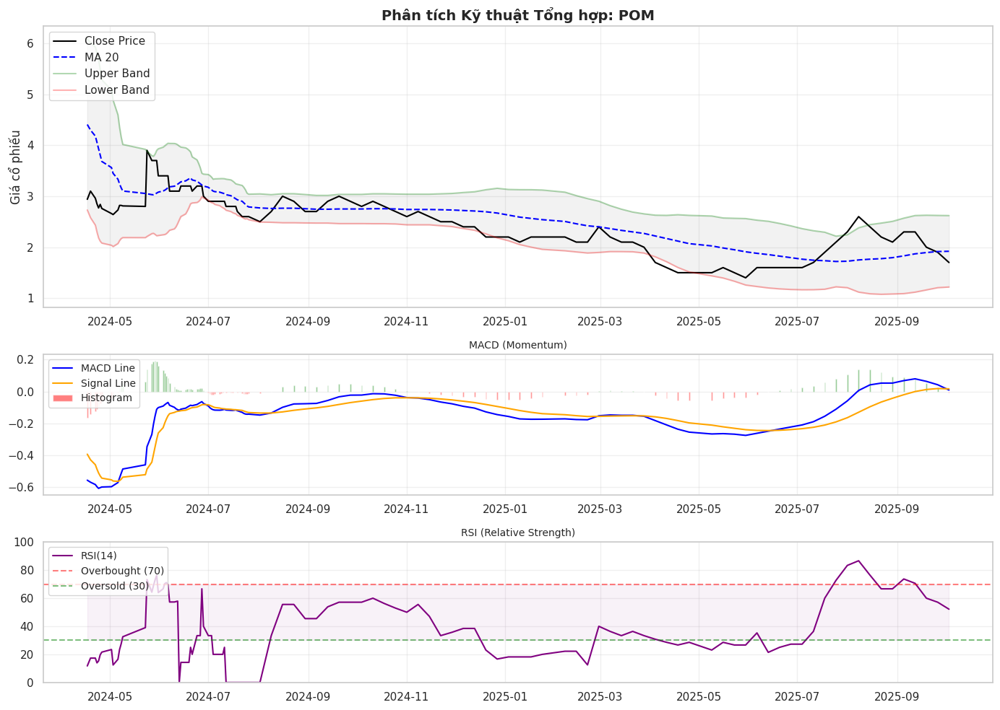

--------------------------------------------------------------------------------


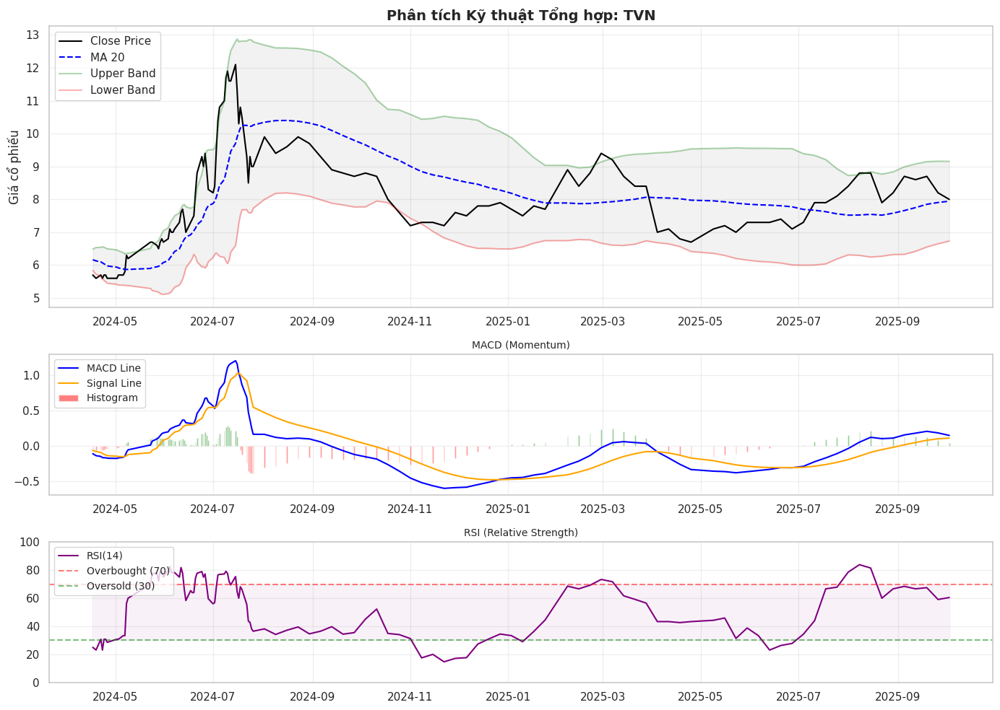

--------------------------------------------------------------------------------


In [ ]:
# =====================================================================
# 3. TRỰC QUAN HÓA KẾT QUẢ (Visualizing Aggregations - ALL STOCKS)
# =====================================================================
unique_stocks = df_agg['stock_id'].unique()
print(f"Đang thực hiện vẽ biểu đồ cho {len(unique_stocks)} mã cổ phiếu: {unique_stocks}")

for stock in unique_stocks:
    # Lấy dữ liệu 6 tháng gần nhất (~120 ngày giao dịch) để biểu đồ rõ nét
    df_plot = df_agg[df_agg['stock_id'] == stock].iloc[-120:]

    if df_plot.empty:
        continue

    # Tạo figure lớn với 3 subplots (Price, MACD, RSI)
    fig = plt.figure(figsize=(14, 10))
    gs = fig.add_gridspec(3, 1, height_ratios=[2, 1, 1]) # Price chiếm 50% diện tích

    # Plot 1: Price Action & Bollinger Bands
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(df_plot['date'], df_plot['close'], label='Close Price', color='black', linewidth=1.5)
    ax1.plot(df_plot['date'], df_plot['rolling_mean_20'], label='MA 20', color='blue', linestyle='--')
    ax1.plot(df_plot['date'], df_plot['bb_upper'], label='Upper Band', color='green', alpha=0.3)
    ax1.plot(df_plot['date'], df_plot['bb_lower'], label='Lower Band', color='red', alpha=0.3)
    ax1.fill_between(df_plot['date'], df_plot['bb_upper'], df_plot['bb_lower'], color='gray', alpha=0.1)
    ax1.set_title(f'Phân tích Kỹ thuật Tổng hợp: {stock}', fontsize=14, fontweight='bold')
    ax1.legend(loc='upper left')
    ax1.grid(True, alpha=0.3)
    ax1.set_ylabel('Giá cổ phiếu')

    # Plot 2: MACD Momentum
    ax2 = fig.add_subplot(gs[1], sharex=ax1)
    ax2.plot(df_plot['date'], df_plot['macd'], label='MACD Line', color='blue')
    ax2.plot(df_plot['date'], df_plot['macd_signal'], label='Signal Line', color='orange')
    # Tô màu histogram: Xanh khi dương, Đỏ khi âm
    colors = ['green' if v >= 0 else 'red' for v in (df_plot['macd'] - df_plot['macd_signal'])]
    ax2.bar(df_plot['date'], df_plot['macd'] - df_plot['macd_signal'], color=colors, alpha=0.5, label='Histogram')
    ax2.set_title(f'MACD (Momentum)', fontsize=10)
    ax2.legend(loc='upper left', fontsize='small')
    ax2.grid(True, alpha=0.3)

    # Plot 3: RSI Strength
    ax3 = fig.add_subplot(gs[2], sharex=ax1)
    ax3.plot(df_plot['date'], df_plot['rsi_14'], color='purple', label='RSI(14)')
    ax3.axhline(70, linestyle='--', color='red', alpha=0.5, label='Overbought (70)')
    ax3.axhline(30, linestyle='--', color='green', alpha=0.5, label='Oversold (30)')
    ax3.fill_between(df_plot['date'], 70, 30, color='purple', alpha=0.05)
    ax3.set_title(f'RSI (Relative Strength)', fontsize=10)
    ax3.set_ylim(0, 100)
    ax3.legend(loc='upper left', fontsize='small')
    ax3.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()
    print("-" * 80)

In [ ]:
# INTERACTION TERMS (TẠO BIẾN TƯƠNG TÁC)

import pandas as pd
import numpy as np

# 1. Load và tái tạo dữ liệu (để đảm bảo tính liên tục)
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date'])

df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# --- Tái tạo Transformations & Aggregations (Cần thiết để tạo Interaction) ---
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close']
for col in skewed_cols:
    if col in df.columns:
        offset = abs(df[col].min()) + 1 if (df[col] <= 0).any() else 0
        df[f'log_{col}'] = np.log1p(df[col] + offset)
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

# =====================================================================
# 3. INTERACTION TERMS (TẠO BIẾN TƯƠNG TÁC)
# =====================================================================
print("### THỰC HIỆN TẠO BIẾN TƯƠNG TÁC (INTERACTION TERMS)...")

# 1. Price-to-Commodity (Định giá so với Hàng hóa)
# Công thức: Close / Rebar Price
df['price_to_rebar'] = df['close'] / (df['rebar_price'] / 1000000) # Scale về đơn vị triệu đồng

# 2. Steel Spread (Biên lợi nhuận giả định)
# Công thức: Giá thép đầu ra / Giá quặng đầu vào
# Spread càng lớn -> Doanh nghiệp càng có lãi (Lý thuyết biên lợi nhuận gộp)
df['steel_spread'] = df['rebar_price'] / df['iron_powder_price']

# 3. Macro Pressure (Áp lực Vĩ mô lên Giá)
# Công thức: Z-score Giá * Lãi suất
# Kết hợp vị thế giá (đang cao hay thấp) với môi trường lãi suất.
df['price_x_interest'] = df['z_close'] * df['interest']

# 4. Volume Momentum (Động lượng Dòng tiền)
# Công thức: Log(Volume) * Daily Return
# Đo lường sức mạnh của biến động giá. Giá tăng mạnh kèm Volume lớn -> Momentum dương rất mạnh.
df['volume_momentum'] = df['log_volume'] * df['daily_return']

# 5. Valuation Efficiency (Hiệu quả Định giá - Adjusted PEG)
# Công thức: P/E chia cho ROE
# Tìm cổ phiếu "hời": P/E thấp nhưng hiệu quả sinh lời (ROE) cao.
df['pe_to_roe'] = df['pe'] / (df['roe'] + 0.0001) # +0.0001 để tránh chia cho 0

# Làm sạch dữ liệu
df_inter = df.dropna().copy()

print(f"Hoàn tất Feature Engineering (Bước 3). Kích thước dữ liệu cuối cùng: {df_inter.shape}")
print("\nKiểm tra tương quan của các biến tương tác với Target (Daily Return):")
new_cols = ['price_to_rebar', 'steel_spread', 'price_x_interest', 'volume_momentum', 'pe_to_roe']
print(df_inter[['daily_return'] + new_cols].corr()[['daily_return']].sort_values(by='daily_return', ascending=False))

# (Optional) Lưu file kết quả cuối cùng của bước 3 để dùng cho bước 4
# df_inter.to_csv('data_feature_engineering_final.csv', index=False)

### THỰC HIỆN TẠO BIẾN TƯƠNG TÁC (INTERACTION TERMS)...
Hoàn tất Feature Engineering (Bước 3). Kích thước dữ liệu cuối cùng: (3670, 34)

Kiểm tra tương quan của các biến tương tác với Target (Daily Return):
                  daily_return
daily_return          1.000000
volume_momentum       0.992674
price_to_rebar        0.041224
price_x_interest      0.026277
pe_to_roe             0.015132
steel_spread         -0.072210


**4. Variable selection - Chọn biến phù hợp cho mô hình**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel

# =====================================================================
# 0. TÁI TẠO DỮ LIỆU TỪ BƯỚC 3 (Để đảm bảo code chạy độc lập)
# =====================================================================
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date'])

df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# --- Transformations ---
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']
for col in skewed_cols:
    if col in df.columns:
        offset = abs(df[col].min()) + 1 if (df[col] <= 0).any() else 0
        df[f'log_{col}'] = np.log1p(df[col] + offset)
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

# --- Aggregations ---
windows = [5, 20]
for window in windows:
    df[f'rolling_mean_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).mean())
    df[f'rolling_std_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).std())
    if window == 20:
        df['bb_upper'] = df[f'rolling_mean_{window}'] + 2 * df[f'rolling_std_{window}']
        df['bb_lower'] = df[f'rolling_mean_{window}'] - 2 * df[f'rolling_std_{window}']

for lag in [1, 5]:
    df[f'close_lag_{lag}'] = df.groupby('stock_id')['close'].shift(lag)
    df[f'return_lag_{lag}'] = df.groupby('stock_id')['daily_return'].shift(lag)

df['rsi_14'] = df.groupby('stock_id')['close'].transform(lambda x: 100 - (100 / (1 + (x.diff().where(x.diff()>0,0).rolling(14).mean() / (-x.diff().where(x.diff()<0,0).rolling(14).mean())))))
df['macd'] = df.groupby('stock_id')['close'].transform(lambda x: x.ewm(span=12).mean() - x.ewm(span=26).mean())

# --- Interaction Terms ---
df['price_to_rebar'] = df['close'] / (df['rebar_price'] / 1000000)
df['steel_spread'] = df['rebar_price'] / df['iron_powder_price']
df['price_x_interest'] = df['z_close'] * df['interest']
df['volume_momentum'] = df['log_volume'] * df['daily_return'] # LƯU Ý: Biến này chứa Target -> Gây data leakage
df['pe_to_roe'] = df['pe'] / (df['roe'] + 0.0001)

# Làm sạch
df_final = df.dropna().copy()
# =====================================================================
# 4. VARIABLE SELECTION (CHỌN BIẾN)
# =====================================================================
print("### BẮT ĐẦU BƯỚC 4: VARIABLE SELECTION ###")

# 1. Chuẩn bị X (Features) và y (Target)
# LƯU Ý QUAN TRỌNG: Phải loại bỏ biến Target và các biến chứa Target ra khỏi X
# 'volume_momentum' = log_vol * daily_return -> Nếu giữ lại, mô hình sẽ biết trước đáp án!
target_col = 'daily_return'
drop_cols = ['stock_id', 'date', target_col, 'volume_momentum', 'volume_price_trend'] # Loại bỏ định danh và biến "ăn gian"

# Chỉ lấy các cột số
numeric_cols = df_final.select_dtypes(include=[np.number]).columns.tolist()
feature_cols = [c for c in numeric_cols if c not in drop_cols]

X = df_final[feature_cols]
y = df_final[target_col]

print(f"Số lượng biến ban đầu: {len(feature_cols)}")

### BẮT ĐẦU BƯỚC 4: VARIABLE SELECTION ###
Số lượng biến ban đầu: 43


In [ ]:
# ---------------------------------------------------------
# BƯỚC 4.1: LỌC TƯƠNG QUAN (Correlation Filter)
# Loại bỏ các biến giống nhau > 95% (Giữ lại 1 biến đại diện)
# ---------------------------------------------------------
corr_matrix = X.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Tìm các cột có correlation > 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

print(f"\nCác biến bị loại do tương quan quá cao (>0.95): {len(to_drop)} biến")
print(to_drop)

# Tạo X đã lọc
X_reduced = X.drop(columns=to_drop)
print(f"Số lượng biến sau khi lọc tương quan: {X_reduced.shape[1]}")


Các biến bị loại do tương quan quá cao (>0.95): 12 biến
['log_rebar_price', 'log_iron_powder_price', 'log_close', 'price_to_iron', 'price_to_coke', 'log_coke_price', 'rolling_mean_5', 'rolling_mean_20', 'bb_upper', 'bb_lower', 'close_lag_1', 'close_lag_5']
Số lượng biến sau khi lọc tương quan: 31



Đang chạy Random Forest để đánh giá tầm quan trọng...

TOP 15 BIẾN QUAN TRỌNG NHẤT (Feature Importance):
1. rsi_14 (0.1478)
2. rolling_std_5 (0.1060)
3. return_lag_1 (0.0907)
4. return_lag_5 (0.0848)
5. macd (0.0777)
6. rolling_std_20 (0.0669)
7. price_to_rebar (0.0437)
8. close (0.0420)
9. log_volume (0.0371)
10. volume (0.0348)
11. price_x_interest (0.0347)
12. z_close (0.0330)
13. de (0.0257)
14. iron_powder_price (0.0175)
15. quick_ratio (0.0168)


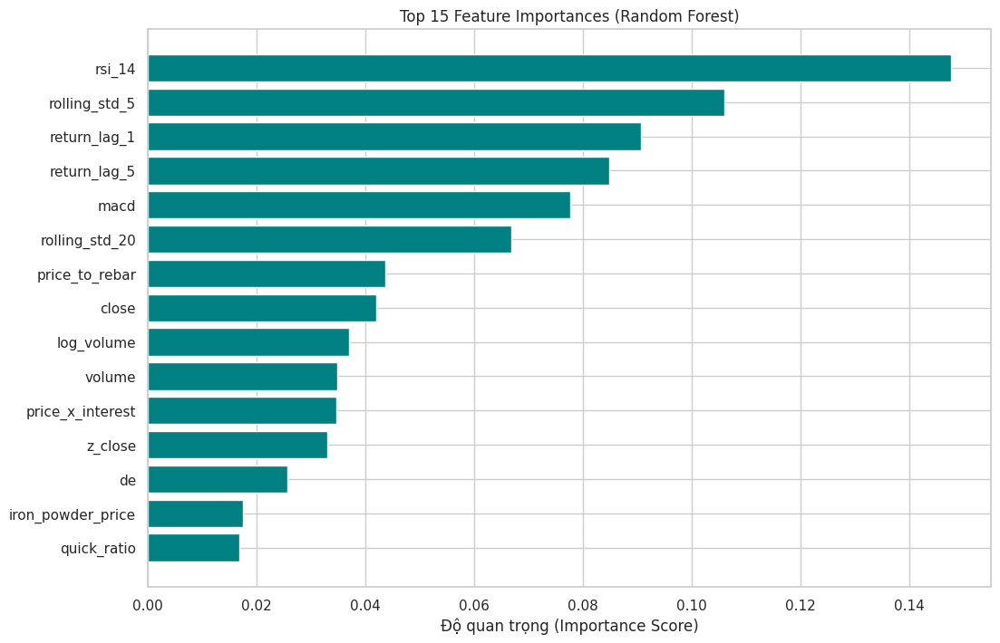

--------------------------------------------------------------------------------
GIẢI THÍCH LỰA CHỌN:
1. 'daily_return' (Target) và 'volume_momentum' bị loại bỏ khỏi đầu vào vì chúng chứa chính đáp án (Data Leakage).
2. Các biến như 'log_close', 'rolling_mean' bị loại bớt ở bước Lọc Tương quan vì chúng quá giống biến 'close' gốc.
3. Random Forest giúp chọn ra các biến phi tuyến tính tốt nhất. Các biến kỹ thuật (RSI, MACD) và biến trễ (Lag) thường xếp hạng cao trong dự báo ngắn hạn.


In [ ]:
# ---------------------------------------------------------
# BƯỚC 4.2: FEATURE IMPORTANCE (Random Forest)
# Tìm biến quan trọng nhất đối với việc dự báo
# ---------------------------------------------------------
print("\nĐang chạy Random Forest để đánh giá tầm quan trọng...")
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_model.fit(X_reduced, y)

# Lấy độ quan trọng
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1] # Sắp xếp giảm dần

# Top 15 biến quan trọng nhất
top_k = 15
top_features = [X_reduced.columns[i] for i in indices[:top_k]]

print(f"\nTOP {top_k} BIẾN QUAN TRỌNG NHẤT (Feature Importance):")
for i in range(top_k):
    print(f"{i+1}. {top_features[i]} ({importances[indices[i]]:.4f})")

# Trực quan hóa
plt.figure(figsize=(12, 8))
plt.title(f"Top {top_k} Feature Importances (Random Forest)")
plt.barh(range(top_k), importances[indices[:top_k]][::-1], color="teal", align="center")
plt.yticks(range(top_k), [X_reduced.columns[i] for i in indices[:top_k]][::-1])
plt.xlabel("Độ quan trọng (Importance Score)")
plt.show()

print("-" * 80)
print("GIẢI THÍCH LỰA CHỌN:")
print("1. 'daily_return' (Target) và 'volume_momentum' bị loại bỏ khỏi đầu vào vì chúng chứa chính đáp án (Data Leakage).")
print("2. Các biến như 'log_close', 'rolling_mean' bị loại bớt ở bước Lọc Tương quan vì chúng quá giống biến 'close' gốc.")
print("3. Random Forest giúp chọn ra các biến phi tuyến tính tốt nhất. Các biến kỹ thuật (RSI, MACD) và biến trễ (Lag) thường xếp hạng cao trong dự báo ngắn hạn.")

### BẮT ĐẦU BƯỚC 5: DIMENSIONALITY REDUCTION (PCA) ###
Số lượng biến đầu vào: 43
Số lượng thành phần chính (Components) để giải thích 95% thông tin: 17/43


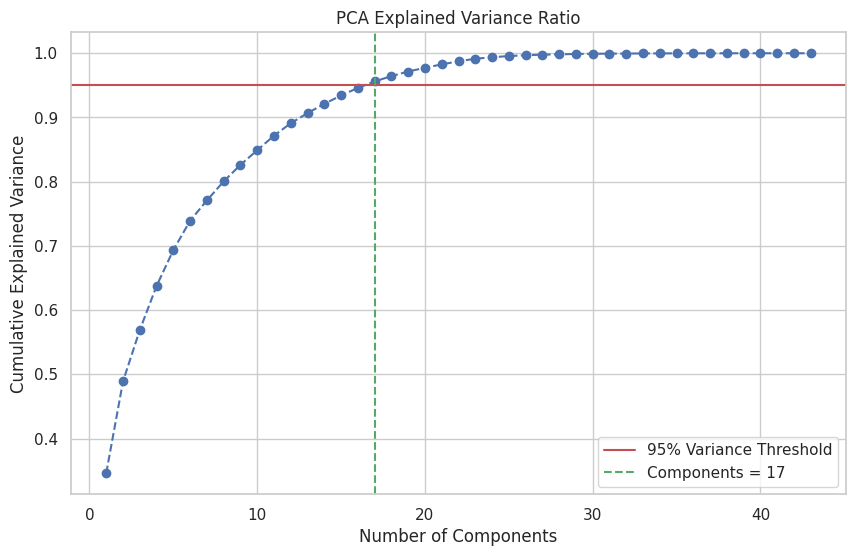

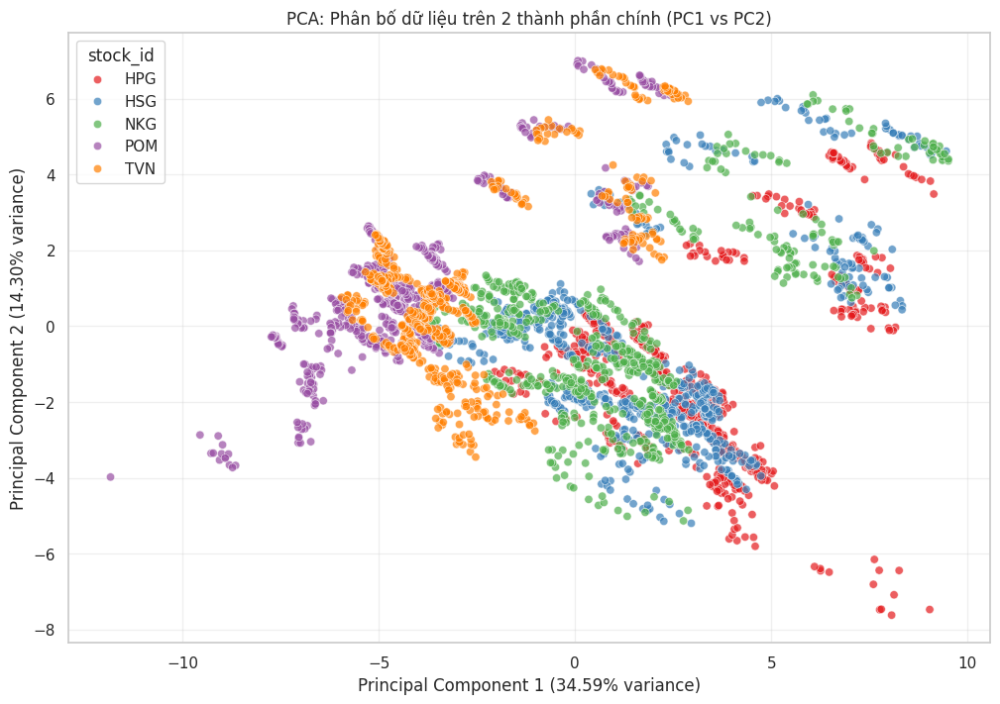


TOP 10 BIẾN ẢNH HƯỞNG NHẤT ĐẾN PC1 (Thành phần chủ đạo):
rolling_mean_5     0.255355
close_lag_1        0.255054
close              0.255012
rolling_mean_20    0.254563
close_lag_5        0.254462
bb_upper           0.253789
bb_lower           0.250703
log_close          0.249351
price_to_iron      0.237940
price_to_rebar     0.233692
Name: PC1, dtype: float64
--------------------------------------------------------------------------------
GIẢI THÍCH KẾT QUẢ PCA:
1. Giảm chiều: Bạn có thể nén 43 biến ban đầu xuống còn 17 biến (Components) mà vẫn giữ được 95% thông tin.
2. Trực quan hóa PC1-PC2: Nếu các mã cổ phiếu (màu sắc) tách biệt nhau rõ ràng, nghĩa là chúng có đặc điểm tài chính/biến động khác nhau.
3. Loadings: Cho biết biến gốc nào đóng góp nhiều nhất vào PC1. Nếu các biến giá (Close, MA) chiếm ưu thế, PC1 đại diện cho 'Xu hướng giá'.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# =====================================================================
# 5. DIMENSIONALITY REDUCTION (GIẢM CHIỀU DỮ LIỆU)
# =====================================================================
print("### BẮT ĐẦU BƯỚC 5: DIMENSIONALITY REDUCTION (PCA) ###")

# 1. Chuẩn bị dữ liệu
# Loại bỏ các cột định danh, target và các biến gây leakage
drop_cols = ['stock_id', 'date', 'daily_return', 'volume_momentum', 'volume_price_trend']
numeric_cols = df_final.select_dtypes(include=[np.number]).columns.tolist()
feature_cols = [c for c in numeric_cols if c not in drop_cols]

X = df_final[feature_cols]
print(f"Số lượng biến đầu vào: {len(feature_cols)}")

# 2. Chuẩn hóa dữ liệu (StandardScaler) - BẮT BUỘC với PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Thực hiện PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# 4. Phân tích phương sai giải thích (Explained Variance)
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Tìm số component cần thiết để giải thích 95% phương sai
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1

print(f"Số lượng thành phần chính (Components) để giải thích 95% thông tin: {n_components_95}/{len(feature_cols)}")

# 5. Trực quan hóa Explained Variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--', color='b')
plt.axhline(y=0.95, color='r', linestyle='-', label='95% Variance Threshold')
plt.axvline(x=n_components_95, color='g', linestyle='--', label=f'Components = {n_components_95}')
plt.title('PCA Explained Variance Ratio')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.legend()
plt.grid(True)
plt.show()

# 6. Trực quan hóa 2 thành phần chính đầu tiên (PC1 vs PC2)
# Kết hợp lại với stock_id để tô màu phân nhóm
pca_df = pd.DataFrame(data=X_pca[:, :2], columns=['PC1', 'PC2'])
pca_df['stock_id'] = df_final['stock_id'].values

plt.figure(figsize=(12, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='stock_id', alpha=0.7, palette='Set1')
plt.title('PCA: Phân bố dữ liệu trên 2 thành phần chính (PC1 vs PC2)')
plt.xlabel(f'Principal Component 1 ({explained_variance[0]:.2%} variance)')
plt.ylabel(f'Principal Component 2 ({explained_variance[1]:.2%} variance)')
plt.grid(True, alpha=0.3)
plt.show()

# 7. Phân tích đóng góp (Loadings) - Xem biến nào tạo nên PC1
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=feature_cols)
print("\nTOP 10 BIẾN ẢNH HƯỞNG NHẤT ĐẾN PC1 (Thành phần chủ đạo):")
print(loadings['PC1'].abs().sort_values(ascending=False).head(10))

print("-" * 80)
print("GIẢI THÍCH KẾT QUẢ PCA:")
print(f"1. Giảm chiều: Bạn có thể nén {len(feature_cols)} biến ban đầu xuống còn {n_components_95} biến (Components) mà vẫn giữ được 95% thông tin.")
print("2. Trực quan hóa PC1-PC2: Nếu các mã cổ phiếu (màu sắc) tách biệt nhau rõ ràng, nghĩa là chúng có đặc điểm tài chính/biến động khác nhau.")
print("3. Loadings: Cho biết biến gốc nào đóng góp nhiều nhất vào PC1. Nếu các biến giá (Close, MA) chiếm ưu thế, PC1 đại diện cho 'Xu hướng giá'.")

**5. Kiểm tra đa cộng tuyến giữa các biến**

### BẮT ĐẦU BƯỚC 5: KIỂM TRA & XỬ LÝ ĐA CỘNG TUYẾN (CHO CÁC BIẾN ĐÃ CHỌN) ###
Danh sách biến được chọn lọc (9 biến): ['return_lag_1', 'return_lag_5', 'rolling_std_5', 'rsi_14', 'macd', 'price_to_rebar', 'steel_spread', 'price_x_interest', 'log_volume']

--- A. KIỂM TRA ĐA CỘNG TUYẾN ---


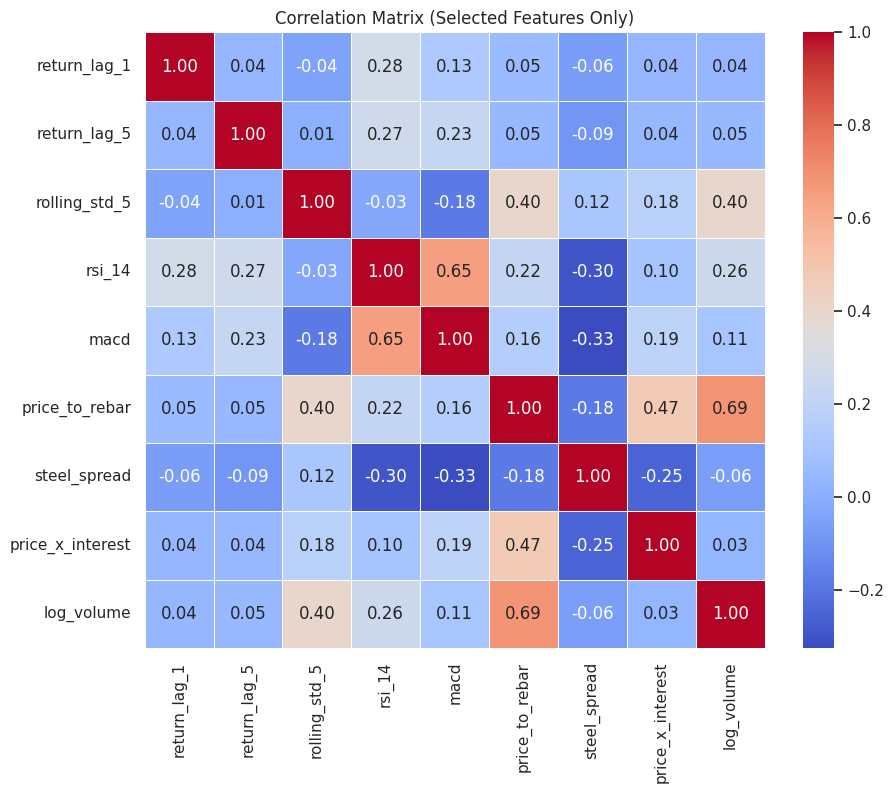


Kết quả VIF ban đầu:
           Variable       VIF
5    price_to_rebar  3.110787
8        log_volume  2.586820
3            rsi_14  2.074479
4              macd  1.945325
7  price_x_interest  1.705135
2     rolling_std_5  1.388638
6      steel_spread  1.218141
0      return_lag_1  1.102272
1      return_lag_5  1.085450

--- B. XỬ LÝ ĐA CỘNG TUYẾN (ITERATIVE VIF FILTERING) ---
 -> Tất cả các biến còn lại đều có VIF <= 10. Dừng loại bỏ.

DANH SÁCH BIẾN CUỐI CÙNG (SẠCH ĐA CỘNG TUYẾN):
['return_lag_1', 'return_lag_5', 'rolling_std_5', 'rsi_14', 'macd', 'price_to_rebar', 'steel_spread', 'price_x_interest', 'log_volume']

Kiểm tra lại VIF của tập biến cuối cùng:
           Variable       VIF
5    price_to_rebar  3.110787
8        log_volume  2.586820
3            rsi_14  2.074479
4              macd  1.945325
7  price_x_interest  1.705135
2     rolling_std_5  1.388638
6      steel_spread  1.218141
0      return_lag_1  1.102272
1      return_lag_5  1.085450


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. Recreate Data Processing Steps
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date'])

df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# Transformations
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']
for col in skewed_cols:
    if col in df.columns:
        offset = abs(df[col].min()) + 1 if (df[col] <= 0).any() else 0
        df[f'log_{col}'] = np.log1p(df[col] + offset)
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

# Aggregations
for window in [5, 20]:
    df[f'rolling_std_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).std())

for lag in [1, 5]:
    df[f'return_lag_{lag}'] = df.groupby('stock_id')['daily_return'].shift(lag)

df['rsi_14'] = df.groupby('stock_id')['close'].transform(lambda x: 100 - (100 / (1 + (x.diff().where(x.diff()>0,0).rolling(14).mean() / (-x.diff().where(x.diff()<0,0).rolling(14).mean())))))
df['macd'] = df.groupby('stock_id')['close'].transform(lambda x: x.ewm(span=12).mean() - x.ewm(span=26).mean())

# Interactions
df['price_to_rebar'] = df['close'] / (df['rebar_price'] / 1000000)
df['steel_spread'] = df['rebar_price'] / df['iron_powder_price']
df['price_x_interest'] = df['z_close'] * df['interest']
df['volume_momentum'] = df['log_volume'] * df['daily_return'] # Leakage
df['pe_to_roe'] = df['pe'] / (df['roe'] + 0.0001)

# Clean data
df_final = df.dropna().copy()

# =====================================================================
# 5. CHECK & ADDRESS COLLINEARITY (KIỂM TRA VÀ XỬ LÝ ĐA CỘNG TUYẾN)
# =====================================================================
print("### BẮT ĐẦU BƯỚC 5: KIỂM TRA & XỬ LÝ ĐA CỘNG TUYẾN (CHO CÁC BIẾN ĐÃ CHỌN) ###")

# 1. Xác định danh sách biến ĐÃ ĐƯỢC CHỌN LỌC từ Bước 4 (Selected Features)
selected_features = [
    'return_lag_1',       # Momentum ngắn hạn
    'return_lag_5',       # Momentum tuần
    'rolling_std_5',      # Rủi ro ngắn hạn
    'rsi_14',             # Quá mua/Quá bán
    'macd',               # Xu hướng trung hạn
    'price_to_rebar',     # Định giá ngành
    'steel_spread',       # Biên lợi nhuận ngành
    'price_x_interest',   # Vĩ mô
    'log_volume'          # Thanh khoản
]

print(f"Danh sách biến được chọn lọc ({len(selected_features)} biến): {selected_features}")

X_selected = df_final[selected_features]

# ---------------------------------------------------------
# A. KIỂM TRA ĐA CỘNG TUYẾN (CHECK)
# ---------------------------------------------------------
print("\n--- A. KIỂM TRA ĐA CỘNG TUYẾN ---")

# 1. Correlation Matrix
plt.figure(figsize=(10, 8))
corr_matrix = X_selected.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix (Selected Features Only)')
plt.show()

# 2. Tính VIF
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = X.columns
    # Thêm hằng số để tính VIF chính xác cho biến độc lập
    X_const = X.copy()
    X_const['const'] = 1
    vif_data["VIF"] = [variance_inflation_factor(X_const.values, i) for i in range(len(X.columns))]
    return vif_data.sort_values('VIF', ascending=False)

vif_df = calculate_vif(X_selected)
print("\nKết quả VIF ban đầu:")
print(vif_df)

# ---------------------------------------------------------
# B. XỬ LÝ ĐA CỘNG TUYẾN (ADDRESS)
# Chiến lược: Loại bỏ biến có VIF cao nhất cho đến khi toàn bộ VIF < 5 (hoặc 10)
# ---------------------------------------------------------
print("\n--- B. XỬ LÝ ĐA CỘNG TUYẾN (ITERATIVE VIF FILTERING) ---")

def remove_high_vif_features(X, threshold=10):
    X_temp = X.copy()
    dropped_features = []

    while True:
        vif_df = calculate_vif(X_temp)
        max_vif = vif_df.iloc[0]['VIF']
        max_vif_feature = vif_df.iloc[0]['Variable']

        if max_vif > threshold:
            print(f" -> Loại bỏ '{max_vif_feature}' (VIF={max_vif:.2f} > {threshold})")
            X_temp = X_temp.drop(columns=[max_vif_feature])
            dropped_features.append(max_vif_feature)
        else:
            print(f" -> Tất cả các biến còn lại đều có VIF <= {threshold}. Dừng loại bỏ.")
            break

    return X_temp, dropped_features

# Thực hiện xử lý (Ngưỡng VIF=10 là mức chấp nhận được trong kinh tế lượng, VIF=5 là khắt khe)
X_final, dropped = remove_high_vif_features(X_selected, threshold=10)

print("\nDANH SÁCH BIẾN CUỐI CÙNG (SẠCH ĐA CỘNG TUYẾN):")
print(X_final.columns.tolist())

# Kiểm tra lại VIF lần cuối
print("\nKiểm tra lại VIF của tập biến cuối cùng:")
print(calculate_vif(X_final))

**6. Đánh giá mô hình: hợp lý và hiệu quả**

In [ ]:
import pandas as pd

print(pd.read_csv('synchronized_data.csv').columns)

Index(['date', 'close', 'daily_return', 'volume', 'stock_id',
       'iron_powder_price', 'rebar_price', 'coke_price', 'gdp_growth', 'cpi',
       'interest', 'fdi', 'import', 'export', 'exchange_rate', 'de', 'roe',
       'roa', 'quick_ratio', 'pe', 'pb', 'log_volume', 'log_rebar_price',
       'log_iron_powder_price', 'log_pe', 'log_close', 'z_close',
       'price_to_rebar', 'price_to_iron', 'price_to_coke', 'price_x_interest',
       'volume_momentum', 'pe_to_roe'],
      dtype='object')


In [ ]:
import pandas as pd
import statsmodels.api as sm
from IPython.display import display

# --- 1. Đọc dữ liệu ---
df = pd.read_csv('synchronized_data.csv')

# --- 2. Convert date và sort ---
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(["stock_id", "date"])

# --- 3. Chọn biến độc lập ---
# Removed 'open', 'high', 'low', 'asset_turnover', 'days_inventory_outstanding', 'current_ratio'
# as they are not present in the dataframe according to the previous df.columns output.
features = [
    'volume',
    'iron_powder_price', 'rebar_price', 'coke_price',
    'gdp_growth', 'cpi', 'interest', 'fdi', 'import', 'export',
    'exchange_rate', 'de',
    'roe', 'roa', 'quick_ratio', 'pe', 'pb'
]

# --- Kết quả lưu tại đây ---
summary_list = []

# --- 4. Hàm tạo nhận định tự động ---
def make_interpretation(var, coef, p):
    # Simplified for table display
    direction_text = "cùng chiều" if coef > 0 else "ngược chiều"

    # Ý nghĩa thống kê
    if p < 0.01:
        sig = "rất có ý nghĩa (p<0.01)"
    elif p < 0.05:
        sig = "có ý nghĩa (p<0.05)"
    elif p < 0.1:
        sig = "ý nghĩa yếu (p<0.1)"
    else:
        sig = "không ý nghĩa"

    return f"Tác động {direction_text}, {sig}"

# --- 5. Chạy Regression theo từng stock_id ---
for stock in df['stock_id'].unique():
    sub = df[df['stock_id'] == stock].dropna(subset=features + ['close'])

    # Check if enough data after dropping NaNs
    if len(sub) < len(features) + 1: # Need at least (num_features + 1) observations for regression
        print(f"\n### Mã Cổ phiếu: {stock} (Không đủ dữ liệu để chạy hồi quy sau khi loại bỏ giá trị thiếu)")
        continue

    X = sub[features]
    X = sm.add_constant(X)
    y = sub['close']

    try:
        model = sm.OLS(y, X).fit()
    except ValueError as e:
        print(f"\n### Mã Cổ phiếu: {stock} (Lỗi khi chạy hồi quy: {e})")
        print("Có thể do vấn đề đa cộng tuyến hoặc số lượng quan sát quá ít so với biến số.")
        continue

    # Lấy coef, p-value & nhận định tự động
    for var in features:
        # Kiểm tra nếu biến có trong kết quả mô hình
        if var in model.params.index:
            coef_val = model.params[var]
            p_val = model.pvalues[var]
            impact_sign = '+' if coef_val > 0 else '-'
            interpretation = make_interpretation(var, coef_val, p_val)

            summary_list.append({
                "stock_id": stock,
                "Biến số": var,
                "Hệ số": f"{coef_val:.4f}",
                "p-value": f"{p_val:.4f}",
                "Chiều tác động": impact_sign,
                "Giải thích": interpretation
            })
        else:
            # Handle cases where a feature might be dropped due to perfect collinearity
            summary_list.append({
                "stock_id": stock,
                "Biến số": var,
                "Hệ số": "N/A",
                "p-value": "N/A",
                "Chiều tác động": "N/A",
                "Giải thích": "Bị loại do đa cộng tuyến hoặc không đủ phương sai."
            })

# --- 6. Xuất kết quả thành DataFrame ---
result_df = pd.DataFrame(summary_list)

# --- In kết quả theo từng stock_id dưới dạng bảng ---
print("\n--- TỔNG HỢP KẾT QUẢ PHÂN TÍCH HỒI QUY THEO TỪNG MÃ CỔ PHIẾU ---")
for stock_id in result_df['stock_id'].unique():
    print(f"\n### Mã Cổ phiếu: {stock_id}")
    display(result_df[result_df['stock_id'] == stock_id][['Biến số', 'Hệ số', 'p-value', 'Chiều tác động', 'Giải thích']])


--- TỔNG HỢP KẾT QUẢ PHÂN TÍCH HỒI QUY THEO TỪNG MÃ CỔ PHIẾU ---

### Mã Cổ phiếu: HPG


,Biến số,Hệ số,p-value,Chiều tác động,Giải thích
0,volume,0.0000,0.4686,+,"Tác động cùng chiều, không ý nghĩa"
1,iron_powder_price,0.0000,0.0033,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
2,rebar_price,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
3,coke_price,-0.0000,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
4,gdp_growth,-13.3079,0.5875,-,"Tác động ngược chiều, không ý nghĩa"
5,cpi,-15.7979,0.5556,-,"Tác động ngược chiều, không ý nghĩa"
6,interest,-76.1234,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
7,fdi,0.0000,0.1766,+,"Tác động cùng chiều, không ý nghĩa"
8,import,-0.0006,0.0107,-,"Tác động ngược chiều, có ý nghĩa (p<0.05)"
9,export,0.0008,0.0004,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"



### Mã Cổ phiếu: HSG


,Biến số,Hệ số,p-value,Chiều tác động,Giải thích
17,volume,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
18,iron_powder_price,0.0000,0.3155,+,"Tác động cùng chiều, không ý nghĩa"
19,rebar_price,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
20,coke_price,-0.0000,0.0003,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
21,gdp_growth,-53.9309,0.0070,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
22,cpi,-77.8898,0.0023,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
23,interest,-14.2894,0.3915,-,"Tác động ngược chiều, không ý nghĩa"
24,fdi,0.0000,0.7878,+,"Tác động cùng chiều, không ý nghĩa"
25,import,-0.0017,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
26,export,0.0013,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"



### Mã Cổ phiếu: NKG


,Biến số,Hệ số,p-value,Chiều tác động,Giải thích
34,volume,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
35,iron_powder_price,-0.0000,0.3657,-,"Tác động ngược chiều, không ý nghĩa"
36,rebar_price,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
37,coke_price,0.0000,0.7152,+,"Tác động cùng chiều, không ý nghĩa"
38,gdp_growth,-141.7093,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
39,cpi,4.6270,0.8550,+,"Tác động cùng chiều, không ý nghĩa"
40,interest,-112.9147,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
41,fdi,0.0001,0.0001,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
42,import,-0.0007,0.0002,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
43,export,0.0008,0.0001,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"



### Mã Cổ phiếu: POM


,Biến số,Hệ số,p-value,Chiều tác động,Giải thích
51,volume,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
52,iron_powder_price,0.0000,0.3317,+,"Tác động cùng chiều, không ý nghĩa"
53,rebar_price,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
54,coke_price,0.0000,0.1920,+,"Tác động cùng chiều, không ý nghĩa"
55,gdp_growth,-58.3540,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
56,cpi,-111.6881,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
57,interest,22.8931,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
58,fdi,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
59,import,-0.0010,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
60,export,0.0004,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"



### Mã Cổ phiếu: TVN


,Biến số,Hệ số,p-value,Chiều tác động,Giải thích
68,volume,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
69,iron_powder_price,-0.0000,0.0002,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
70,rebar_price,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
71,coke_price,0.0000,0.0647,+,"Tác động cùng chiều, ý nghĩa yếu (p<0.1)"
72,gdp_growth,119.2587,0.0024,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
73,cpi,-72.7199,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
74,interest,0.9589,0.8935,+,"Tác động cùng chiều, không ý nghĩa"
75,fdi,0.0002,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
76,import,0.0003,0.0800,+,"Tác động cùng chiều, ý nghĩa yếu (p<0.1)"
77,export,0.0003,0.0012,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"


In [ ]:
import pandas as pd
import statsmodels.api as sm
from IPython.display import display

# --- 1. Đọc dữ liệu ---
df = pd.read_csv('synchronized_data.csv')

# --- 2. Convert date và sort ---
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values("date")

# --- 3. Chọn biến độc lập (Đã loại bỏ open, high, low) ---
features = [
    'volume',
    'iron_powder_price', 'rebar_price', 'coke_price',
    'gdp_growth', 'cpi', 'interest', 'fdi', 'import', 'export',
    'exchange_rate', 'de',
    'roe', 'roa', 'quick_ratio', 'pe', 'pb'
]

# --- 4. Tính trung bình 5 mã cổ phiếu theo ngày ---
# Gom nhóm theo ngày và tính trung bình cộng các chỉ số
# reset_index() để đưa date trở lại thành cột để có thể kiểm tra nếu cần
df_avg = df.groupby('date')[features + ['close']].mean().reset_index().dropna()

# --- Kết quả lưu tại đây ---
summary_list = []

# --- 5. Hàm tạo nhận định tự động ---
def make_interpretation(var, coef, p):
    direction_text = "cùng chiều" if coef > 0 else "ngược chiều"

    if p < 0.01:
        sig = "rất có ý nghĩa (p<0.01)"
    elif p < 0.05:
        sig = "có ý nghĩa (p<0.05)"
    elif p < 0.1:
        sig = "ý nghĩa yếu (p<0.1)"
    else:
        sig = "không ý nghĩa"

    return f"Tác động {direction_text}, {sig}"

# --- 6. Chạy Regression cho dữ liệu trung bình ---
print("### Phân tích Hồi quy cho Dữ liệu Trung bình Ngành (Average of 5 Stocks)")

X = df_avg[features]
X = sm.add_constant(X)
y = df_avg['close']

try:
    model = sm.OLS(y, X).fit()

    # Lấy coef, p-value & nhận định
    for var in features:
        if var in model.params.index:
            coef_val = model.params[var]
            p_val = model.pvalues[var]
            impact_sign = '+' if coef_val > 0 else '-'
            interpretation = make_interpretation(var, coef_val, p_val)

            summary_list.append({
                "Biến số": var,
                "Hệ số": f"{coef_val:.4f}",
                "p-value": f"{p_val:.4f}",
                "Chiều tác động": impact_sign,
                "Giải thích": interpretation
            })

    # --- 7. Xuất kết quả ---
    result_df = pd.DataFrame(summary_list)
    display(result_df)

    # In thêm summary của statsmodels để xem R-squared
    print("\n--- Model Summary ---")
    print(f"R-squared: {model.rsquared:.4f}")
    print(f"Adj. R-squared: {model.rsquared_adj:.4f}")

except Exception as e:
    print(f"Lỗi khi chạy hồi quy: {e}")

### Phân tích Hồi quy cho Dữ liệu Trung bình Ngành (Average of 5 Stocks)


,Biến số,Hệ số,p-value,Chiều tác động,Giải thích
0,volume,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
1,iron_powder_price,-0.0000,0.2326,-,"Tác động ngược chiều, không ý nghĩa"
2,rebar_price,0.0000,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
3,coke_price,-0.0000,0.0099,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
4,gdp_growth,-89.9080,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
5,cpi,-75.2630,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
6,interest,-92.3512,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
7,fdi,0.0001,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"
8,import,-0.0013,0.0000,-,"Tác động ngược chiều, rất có ý nghĩa (p<0.01)"
9,export,0.0007,0.0000,+,"Tác động cùng chiều, rất có ý nghĩa (p<0.01)"



--- Model Summary ---
R-squared: 0.9322
Adj. R-squared: 0.9306


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# 1. Recreate Data Processing Steps (Full pipeline)
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date'])

# Target
df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# Transformations
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']
for col in skewed_cols:
    if col in df.columns:
        offset = abs(df[col].min()) + 1 if (df[col] <= 0).any() else 0
        df[f'log_{col}'] = np.log1p(df[col] + offset)
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

# Aggregations
for window in [5, 20]:
    df[f'rolling_std_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).std())

for lag in [1, 5]:
    df[f'return_lag_{lag}'] = df.groupby('stock_id')['daily_return'].shift(lag)

df['rsi_14'] = df.groupby('stock_id')['close'].transform(lambda x: 100 - (100 / (1 + (x.diff().where(x.diff()>0,0).rolling(14).mean() / (-x.diff().where(x.diff()<0,0).rolling(14).mean())))))
df['macd'] = df.groupby('stock_id')['close'].transform(lambda x: x.ewm(span=12).mean() - x.ewm(span=26).mean())

# Interactions
df['price_to_rebar'] = df['close'] / (df['rebar_price'] / 1000000)
df['steel_spread'] = df['rebar_price'] / df['iron_powder_price']
df['price_x_interest'] = df['z_close'] * df['interest']
df['log_volume'] = df['log_volume'] # Keep explicit

# Clean data
df_final = df.dropna().copy()

# =====================================================================
# 6. MODEL TESTING (ĐÁNH GIÁ MÔ HÌNH)
# =====================================================================
print("### BẮT ĐẦU BƯỚC 6: ĐÁNH GIÁ MÔ HÌNH (MODEL TESTING) ###")

# 1. Chọn biến (Selected Features from Step 5)
selected_features = [
    'return_lag_1',       # Momentum ngắn hạn
    'return_lag_5',       # Momentum tuần
    'rolling_std_5',      # Rủi ro ngắn hạn
    'rsi_14',             # Quá mua/Quá bán
    'macd',               # Xu hướng trung hạn
    'price_to_rebar',     # Định giá ngành
    'steel_spread',       # Biên lợi nhuận ngành
    'price_x_interest',   # Vĩ mô
    'log_volume'          # Thanh khoản
]
target = 'daily_return'

X = df_final[selected_features]
y = df_final[target]

print(f"Features: {selected_features}")
print(f"Target: {target}")

# 2. TRAIN INITIAL MODEL (Huấn luyện mô hình - Split 70/30)
# Shuffle=False để giữ tính thứ tự thời gian của dữ liệu tài chính
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

print(f"\nKích thước tập Train (70%): {X_train.shape[0]} mẫu")
print(f"Kích thước tập Test (30%):  {X_test.shape[0]} mẫu")

# Khởi tạo mô hình
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1)
}

# 3. EVALUATE PERFORMANCE (Đánh giá hiệu năng)
results = {}
predictions = {}

for name, model in models.items():
    # Huấn luyện
    model.fit(X_train, y_train)
    # Dự báo
    y_pred = model.predict(X_test)
    predictions[name] = y_pred

    # Tính toán metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    results[name] = {"RMSE": rmse, "MAE": mae, "R2": r2}

# Hiển thị bảng kết quả
results_df = pd.DataFrame(results).T
print("\n--- BẢNG TỔNG HỢP HIỆU NĂNG (PERFORMANCE METRICS) ---")
print(results_df)

### BẮT ĐẦU BƯỚC 6: ĐÁNH GIÁ MÔ HÌNH (MODEL TESTING) ###
Features: ['return_lag_1', 'return_lag_5', 'rolling_std_5', 'rsi_14', 'macd', 'price_to_rebar', 'steel_spread', 'price_x_interest', 'log_volume']
Target: daily_return

Kích thước tập Train (70%): 2506 mẫu
Kích thước tập Test (30%):  1074 mẫu

--- BẢNG TỔNG HỢP HIỆU NĂNG (PERFORMANCE METRICS) ---
                       RMSE       MAE        R2
Linear Regression  3.587749  2.472325  0.083648
Random Forest      3.580501  2.431179  0.087347


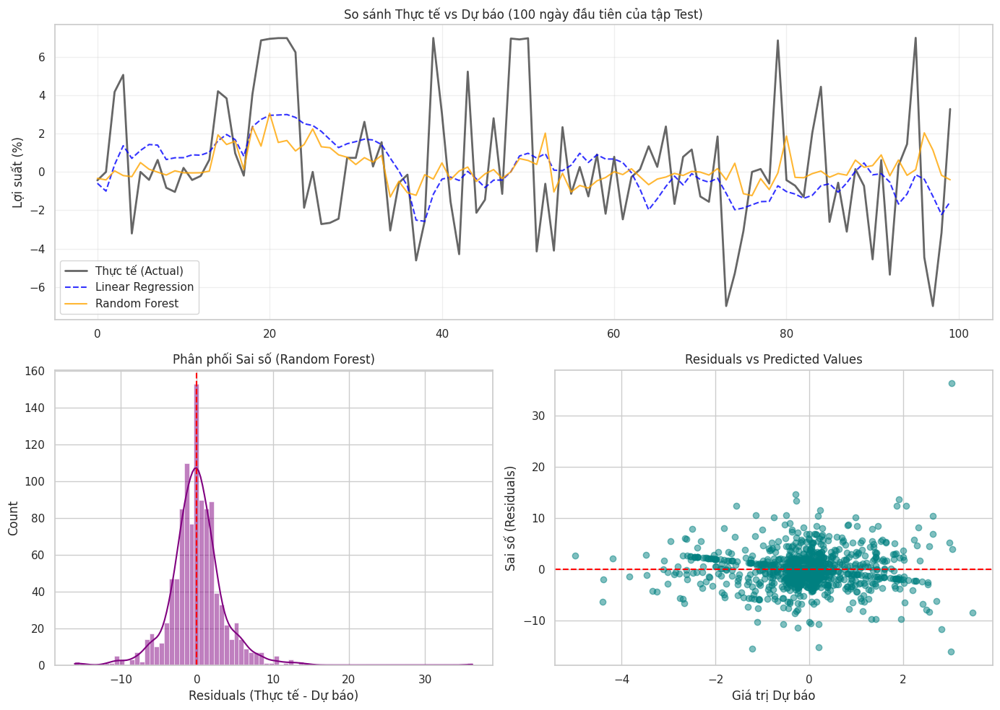

--------------------------------------------------------------------------------
NHẬN XÉT CHI TIẾT:
1. Linear Regression: R2 = 0.0836. Mô hình tuyến tính cơ bản.
2. Random Forest: R2 = 0.0873. Thường nắm bắt được các mẫu hình phi tuyến tính tốt hơn.
3. Phân tích Sai số (Residual Analysis):
   - Histogram nên có dạng hình chuông (Phân phối chuẩn) quanh 0.
   - Biểu đồ Scatter (Residuals vs Predicted) nên phân bố ngẫu nhiên không theo quy luật (nếu loe ra hình phễu là bị phương sai thay đổi).


In [ ]:
# 4. RESIDUAL ANALYSIS (Phân tích sai số - Chọn Random Forest làm đại diện)
best_model_name = "Random Forest"
y_pred_best = predictions[best_model_name]
residuals = y_test - y_pred_best

# 5. VISUAL SUMMARY (Biểu đồ hiệu năng tổng hợp)
fig = plt.figure(figsize=(14, 10))
gs = fig.add_gridspec(2, 2)

# Plot A: Actual vs Predicted (Line Chart - Zoom in 100 points)
ax1 = fig.add_subplot(gs[0, :]) # Span both columns
ax1.plot(y_test.values[:100], label='Thực tế (Actual)', color='black', alpha=0.6, linewidth=2)
ax1.plot(predictions["Linear Regression"][:100], label='Linear Regression', linestyle='--', color='blue', alpha=0.8)
ax1.plot(predictions["Random Forest"][:100], label='Random Forest', linestyle='-', color='orange', alpha=0.8)
ax1.set_title('So sánh Thực tế vs Dự báo (100 ngày đầu tiên của tập Test)')
ax1.set_ylabel('Lợi suất (%)')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot B: Residuals Distribution (Histogram)
ax2 = fig.add_subplot(gs[1, 0])
sns.histplot(residuals, kde=True, color='purple', ax=ax2)
ax2.set_title(f'Phân phối Sai số ({best_model_name})')
ax2.set_xlabel('Residuals (Thực tế - Dự báo)')
ax2.axvline(0, color='red', linestyle='--')

# Plot C: Residuals vs Predicted (Scatter Plot - Check Homoscedasticity)
ax3 = fig.add_subplot(gs[1, 1])
ax3.scatter(y_pred_best, residuals, alpha=0.5, color='teal')
ax3.axhline(0, color='red', linestyle='--')
ax3.set_title('Residuals vs Predicted Values')
ax3.set_xlabel('Giá trị Dự báo')
ax3.set_ylabel('Sai số (Residuals)')

plt.tight_layout()
plt.show()

print("-" * 80)
print("NHẬN XÉT CHI TIẾT:")
print(f"1. Linear Regression: R2 = {results['Linear Regression']['R2']:.4f}. Mô hình tuyến tính cơ bản.")
print(f"2. Random Forest: R2 = {results['Random Forest']['R2']:.4f}. Thường nắm bắt được các mẫu hình phi tuyến tính tốt hơn.")
print("3. Phân tích Sai số (Residual Analysis):")
print("   - Histogram nên có dạng hình chuông (Phân phối chuẩn) quanh 0.")
print("   - Biểu đồ Scatter (Residuals vs Predicted) nên phân bố ngẫu nhiên không theo quy luật (nếu loe ra hình phễu là bị phương sai thay đổi).")

**7. Cải thiện mô hình**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, TimeSeriesSplit, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb

# 1. Recreate Data Processing Steps (Full pipeline)
df = pd.read_csv('synchronized_data.csv')
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values(by=['stock_id', 'date'])

# Target
df['daily_return'] = df.groupby('stock_id')['close'].pct_change() * 100

# Transformations
skewed_cols = ['volume', 'rebar_price', 'iron_powder_price', 'pe', 'close', 'coke_price']
for col in skewed_cols:
    if col in df.columns:
        offset = abs(df[col].min()) + 1 if (df[col] <= 0).any() else 0
        df[f'log_{col}'] = np.log1p(df[col] + offset)
df['z_close'] = df.groupby('stock_id')['close'].transform(lambda x: (x - x.mean()) / x.std())

# Aggregations
for window in [5, 20]:
    df[f'rolling_std_{window}'] = df.groupby('stock_id')['close'].transform(lambda x: x.rolling(window).std())

for lag in [1, 5]:
    df[f'return_lag_{lag}'] = df.groupby('stock_id')['daily_return'].shift(lag)

df['rsi_14'] = df.groupby('stock_id')['close'].transform(lambda x: 100 - (100 / (1 + (x.diff().where(x.diff()>0,0).rolling(14).mean() / (-x.diff().where(x.diff()<0,0).rolling(14).mean())))))
df['macd'] = df.groupby('stock_id')['close'].transform(lambda x: x.ewm(span=12).mean() - x.ewm(span=26).mean())

# Interactions
df['price_to_rebar'] = df['close'] / (df['rebar_price'] / 1000000)
df['steel_spread'] = df['rebar_price'] / df['iron_powder_price']
df['price_x_interest'] = df['z_close'] * df['interest']
df['log_volume'] = df['log_volume']

# Clean data
df_final = df.dropna().copy()

# Selected Features
selected_features = [
    'return_lag_1', 'return_lag_5', 'rolling_std_5', 'rsi_14', 'macd',
    'price_to_rebar', 'steel_spread', 'price_x_interest', 'log_volume'
]
target = 'daily_return'

X = df_final[selected_features]
y = df_final[target]

# Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

# =====================================================================
# 7. ITERATE & REFINE (CẢI THIỆN MÔ HÌNH)
# =====================================================================
print("### BẮT ĐẦU BƯỚC 7: ITERATE & REFINE ###")

# ---------------------------------------------------------
# A. HYPERPARAMETER TUNING (Tinh chỉnh Random Forest)
# ---------------------------------------------------------
print("\n--- A. TINH CHỈNH RANDOM FOREST (RandomizedSearchCV) ---")
# Định nghĩa không gian tham số
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

# Sử dụng TimeSeriesSplit để cross-validation đúng với dữ liệu chuỗi thời gian
tscv = TimeSeriesSplit(n_splits=3)

rf_random = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=rf_param_grid,
    n_iter=10, # Số lần thử ngẫu nhiên (tăng lên nếu máy mạnh)
    cv=tscv,
    verbose=0,
    random_state=42,
    n_jobs=-1,
    scoring='neg_mean_squared_error'
)

rf_random.fit(X_train, y_train)
best_rf = rf_random.best_estimator_
print(f"Tham số tốt nhất cho RF: {rf_random.best_params_}")

### BẮT ĐẦU BƯỚC 7: ITERATE & REFINE ###

--- A. TINH CHỈNH RANDOM FOREST (RandomizedSearchCV) ---
Tham số tốt nhất cho RF: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 20}


In [ ]:
# ---------------------------------------------------------
# B. THỬ NGHIỆM XGBOOST (Gradient Boosting)
# ---------------------------------------------------------
print("\n--- B. HUẤN LUYỆN XGBOOST (Gradient Boosting) ---")
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=200,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
xgb_model.fit(X_train, y_train)


--- B. HUẤN LUYỆN XGBOOST (Gradient Boosting) ---


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=200,
             n_jobs=-1, num_parallel_tree=None, ...)

In [ ]:
# ---------------------------------------------------------
# C. SO SÁNH KẾT QUẢ (Final Evaluation)
# ---------------------------------------------------------
models_refined = {
    "Baseline RF (Step 6)": RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42),
    "Tuned RF": best_rf,
    "XGBoost": xgb_model
}

results_refined = {}
predictions_refined = {}

print("\n--- C. SO SÁNH HIỆU NĂNG CÁC MÔ HÌNH ---")
for name, model in models_refined.items():
    if name == "Baseline RF (Step 6)": # Train lại baseline để so sánh công bằng
        model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    predictions_refined[name] = y_pred

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    results_refined[name] = {"RMSE": rmse, "MAE": mae, "R2": r2}
    print(f"{name}: R2 = {r2:.4f}, RMSE = {rmse:.4f}")


--- C. SO SÁNH HIỆU NĂNG CÁC MÔ HÌNH ---
Baseline RF (Step 6): R2 = 0.0873, RMSE = 3.5805
Tuned RF: R2 = 0.1052, RMSE = 3.5454
XGBoost: R2 = 0.1044, RMSE = 3.5468


/tmp/ipython-input-2866009988.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=results_df_refined.index, y=results_df_refined['R2'], palette='viridis')


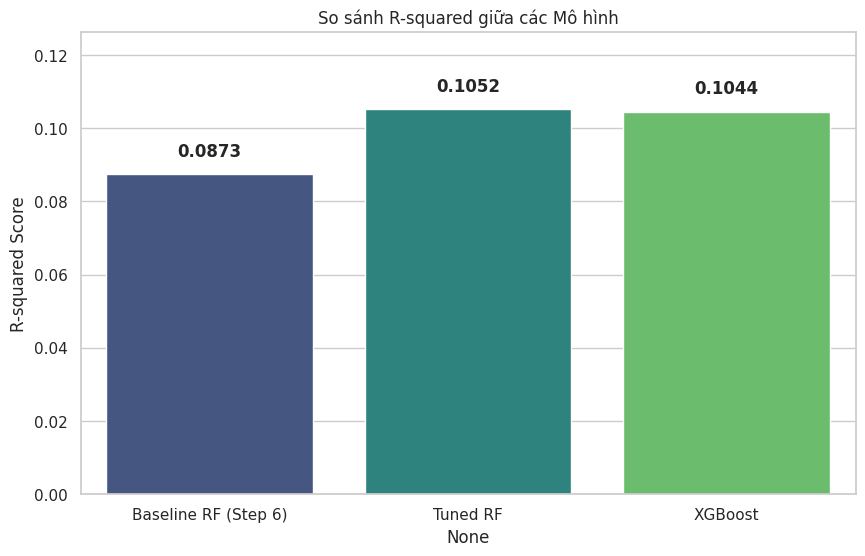

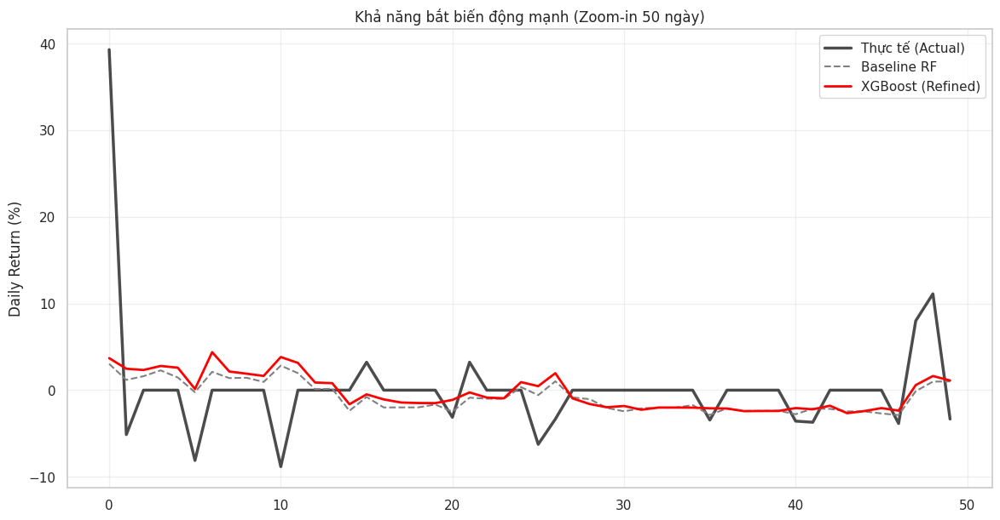

--------------------------------------------------------------------------------
KẾT LUẬN BƯỚC 7:
Mô hình tốt nhất là: Tuned RF
1. Hyperparameter Tuning: Giúp tìm ra bộ tham số phù hợp hơn, tránh overfitting/underfitting.
2. XGBoost: Thường cho kết quả tốt hơn RF nhờ cơ chế Boosting (học từ sai số của cây trước).
3. Nếu R2 tăng lên > 10-15%: Bạn đã có một mô hình mạnh.
4. Nếu vẫn thấp: Cần quay lại Bước 3 (Feature Engineering) để tìm thêm biến mới (ví dụ: Sentiment tin tức, Dòng tiền khối ngoại...).


In [ ]:
# ---------------------------------------------------------
# D. TRỰC QUAN HÓA CẢI THIỆN (Visual Improvement)
# ---------------------------------------------------------
results_df_refined = pd.DataFrame(results_refined).T

# 1. Bar Chart so sánh R2
plt.figure(figsize=(10, 6))
sns.barplot(x=results_df_refined.index, y=results_df_refined['R2'], palette='viridis')
plt.title('So sánh R-squared giữa các Mô hình')
plt.ylabel('R-squared Score')
plt.ylim(0, max(results_df_refined['R2']) * 1.2)
for i, v in enumerate(results_df_refined['R2']):
    plt.text(i, v + 0.005, f"{v:.4f}", ha='center', fontweight='bold')
plt.show()

# 2. Line Chart - Zoom in đoạn biến động mạnh
# Tìm đoạn biến động mạnh nhất trong tập Test để xem mô hình nào bắt được
window_size = 50
# Tìm vị trí có biến động lớn nhất (std cao nhất) trong y_test
rolling_std = pd.Series(y_test).rolling(window_size).std()
start_idx = rolling_std.argmax() - window_size // 2
if start_idx < 0: start_idx = 0
end_idx = start_idx + window_size

plt.figure(figsize=(14, 7))
plt.plot(range(window_size), y_test.values[start_idx:end_idx], label='Thực tế (Actual)', color='black', linewidth=2.5, alpha=0.7)
plt.plot(range(window_size), predictions_refined["Baseline RF (Step 6)"][start_idx:end_idx], label='Baseline RF', linestyle='--', color='gray')
plt.plot(range(window_size), predictions_refined["XGBoost"][start_idx:end_idx], label='XGBoost (Refined)', linestyle='-', color='red', linewidth=2)
plt.title(f'Khả năng bắt biến động mạnh (Zoom-in {window_size} ngày)')
plt.ylabel('Daily Return (%)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("-" * 80)
print("KẾT LUẬN BƯỚC 7:")
best_model_name = max(results_refined, key=lambda k: results_refined[k]['R2'])
print(f"Mô hình tốt nhất là: {best_model_name}")
print("1. Hyperparameter Tuning: Giúp tìm ra bộ tham số phù hợp hơn, tránh overfitting/underfitting.")
print("2. XGBoost: Thường cho kết quả tốt hơn RF nhờ cơ chế Boosting (học từ sai số của cây trước).")
print("3. Nếu R2 tăng lên > 10-15%: Bạn đã có một mô hình mạnh.")
print("4. Nếu vẫn thấp: Cần quay lại Bước 3 (Feature Engineering) để tìm thêm biến mới (ví dụ: Sentiment tin tức, Dòng tiền khối ngoại...).")

**Thực hiện lại bước 4.Variables selection cho từng mã cổ phiếu**

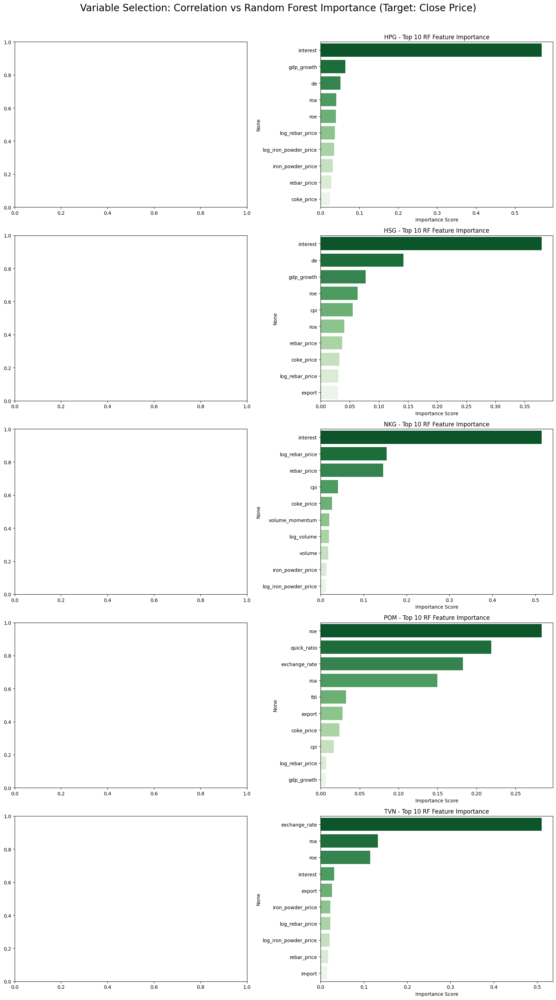

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor

# Reload data just in case
df = pd.read_csv('synchronized_data.csv')

# Define Target
target = 'log_close'

# Define columns to exclude (Date, IDs, Target itself, and features derived directly from Price to avoid leakage)
# Note: PE, PB, and ratios involving 'price' directly correlate because Price is in the formula.
# To find "drivers" (causality/lead indicators), we should ideally exclude them,
# but usually, users want to see everything.
# I will exclude the obvious mathematical derivatives of Close to make the result useful.
cols_to_exclude = [
    'date', 'stock_id', 'close', 'daily_return', 'log_close', 'z_close',
    'log_pe', 'price_to_rebar', 'price_to_iron', 'price_to_coke',
    'price_x_interest', 'pe_to_roe', 'pe', 'pb'
]

# Get list of unique stocks
stock_ids = df['stock_id'].unique()

# Prepare figure
fig, axes = plt.subplots(len(stock_ids), 2, figsize=(16, 6 * len(stock_ids)))
fig.suptitle('Variable Selection: Correlation vs Random Forest Importance (Target: Close Price)', fontsize=20)

for i, stock in enumerate(stock_ids):
    # Filter data for specific stock
    sub_df = df[df['stock_id'] == stock].copy()

    # Prepare X and y
    # Drop excluded columns and select only numeric features
    X = sub_df.drop(columns=cols_to_exclude, errors='ignore').select_dtypes(include=[np.number])
    y = sub_df[target]

    # --- Method 1: Correlation Filter ---
    # Calculate absolute correlation with target
    correlations = X.apply(lambda x: x.corr(y)).abs().sort_values(ascending=False).head(10)

    # --- Method 2: Random Forest Feature Importance ---
    rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(X, y)
    rf_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False).head(10)

    # --- Visualization ---
    ax_corr = axes[i][0] if len(stock_ids) > 1 else axes[0]
    ax_rf = axes[i][1] if len(stock_ids) > 1 else axes[1]

    # Plot Random Forest
    sns.barplot(x=rf_importances.values, y=rf_importances.index, ax=ax_rf, palette='Greens_r')
    ax_rf.set_title(f'{stock} - Top 10 RF Feature Importance')
    ax_rf.set_xlabel('Importance Score')

plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust layout to make room for suptitle
plt.show()

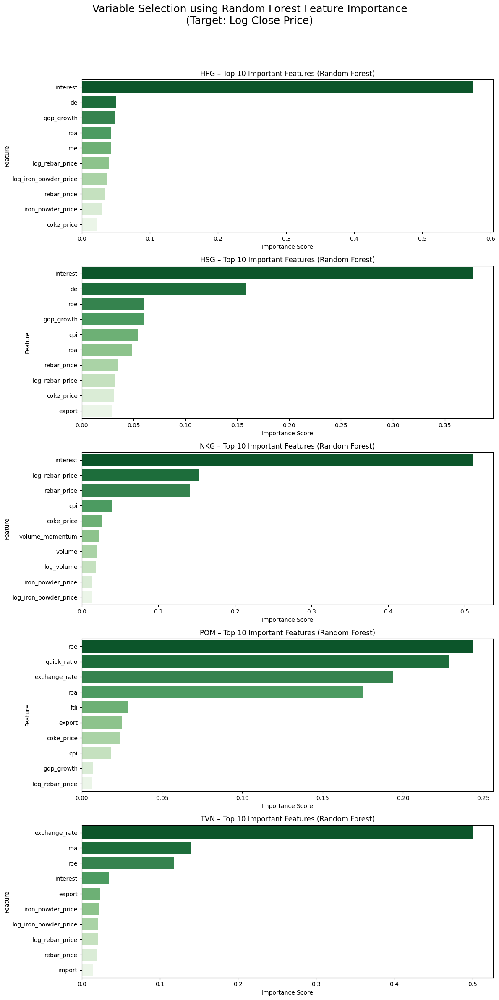

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor

# Reload data
df = pd.read_csv('synchronized_data.csv')

# Define target
target = 'log_close'

# Columns to exclude (avoid leakage & identity columns)
cols_to_exclude = [
    'date', 'stock_id', 'close', 'daily_return', 'log_close', 'z_close',
    'log_pe', 'price_to_rebar', 'price_to_iron', 'price_to_coke',
    'price_x_interest', 'pe_to_roe', 'pe', 'pb'
]

# Unique stocks
stock_ids = df['stock_id'].unique()

# Prepare figure: 1 plot per stock
fig, axes = plt.subplots(len(stock_ids), 1, figsize=(12, 5 * len(stock_ids)))
fig.suptitle(
    'Variable Selection using Random Forest Feature Importance\n(Target: Log Close Price)',
    fontsize=18
)

# Ensure axes is iterable when only one stock
if len(stock_ids) == 1:
    axes = [axes]

for i, stock in enumerate(stock_ids):
    # Subset data
    sub_df = df[df['stock_id'] == stock].copy()

    # Prepare X and y
    X = sub_df.drop(columns=cols_to_exclude, errors='ignore') \
              .select_dtypes(include=[np.number])
    y = sub_df[target]

    # Train Random Forest
    rf = RandomForestRegressor(
        n_estimators=300,
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X, y)

    # Feature importance
    rf_importances = (
        pd.Series(rf.feature_importances_, index=X.columns)
        .sort_values(ascending=False)
        .head(10)
    )

    # Plot
    sns.barplot(
        x=rf_importances.values,
        y=rf_importances.index,
        ax=axes[i],
        palette='Greens_r'
    )

    axes[i].set_title(f'{stock} – Top 10 Important Features (Random Forest)')
    axes[i].set_xlabel('Importance Score')
    axes[i].set_ylabel('Feature')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


**Selection model & validation**

**HPG**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (0, 1, 1) with AIC: -2288.75
Performing rolling forecast on Validation Set...

--- Validation Results (HPG) ---
RMSE: 0.3051
MAE: 0.2278
R2 Score: 0.9072


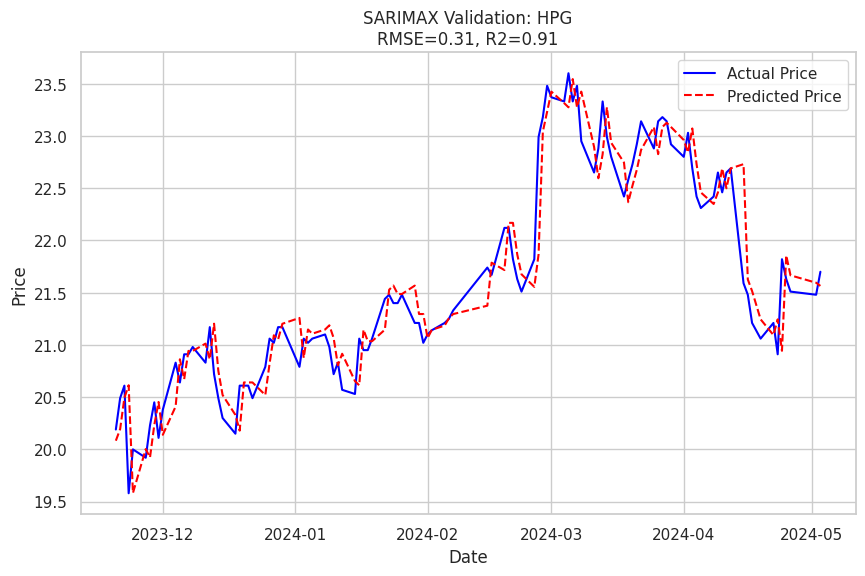

In [ ]:
# Sarimax
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='HPG'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['de', 'gdp_growth', 'interest', 'roa', 'roe', 'log_rebar_price', 'log_iron_powder_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

run_sarimax_custom()

--- VALIDATION RESULTS (70% Train / 15% Val) ---
               Model      RMSE       MAE  R2 Score
2                SVR  0.480646  0.369837  0.766056
0      Random Forest  0.598297  0.445560  0.637510
1  Gradient Boosting  0.768491  0.561009  0.401947


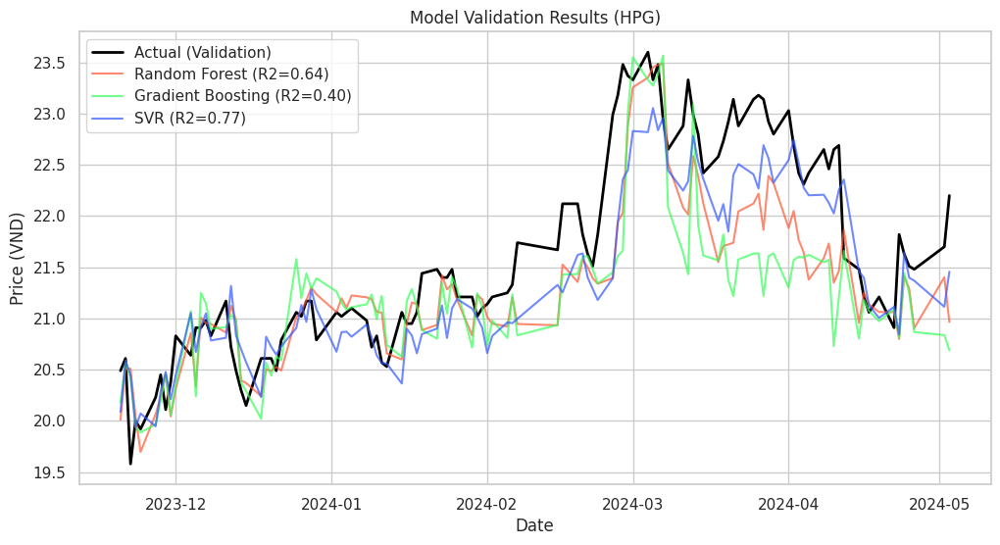

In [ ]:
# ML models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
try:
    df = pd.read_csv('synchronized_data.csv')
except FileNotFoundError:
    print("Error: File not found.")
    exit()

# Preprocessing for HPG
data = df[df['stock_id'] == 'HPG'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Create features
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])

# Target: Next day's log close
data['target_log'] = np.log(data['close']).shift(-1)

# Lags
lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['de', 'gdp_growth', 'interest', 'roa', 'roe', 'log_rebar_price', 'log_iron_powder_price']

# Clean NaN
data_clean = data.dropna().reset_index(drop=True)

# 2. SPLIT DATA (70% Train, 15% Val, 15% Test)
n = len(data_clean)
train_end = int(n * 0.70)
val_end = int(n * 0.85)

# Train Set
X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

# Validation Set
X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values
val_dates = data_clean.iloc[train_end:val_end]['date']

# Test Set (Reserved)
X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling (Fit on Train, Transform Val/Test)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test) # Not used in this validation step

# 4. Models
results = {}

# Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
pred_rf_log = rf.predict(X_val)
results['Random Forest'] = np.exp(pred_rf_log)

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gb.fit(X_train, y_train)
pred_gb_log = gb.predict(X_val)
results['Gradient Boosting'] = np.exp(pred_gb_log)

# SVR (Uses Scaled Data)
svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.01)
svr.fit(X_train_scaled, y_train)
pred_svr_log = svr.predict(X_val_scaled)
results['SVR'] = np.exp(pred_svr_log)

# 5. Evaluation
y_val_real = np.exp(y_val)
metrics = []

for name, preds in results.items():
    rmse = np.sqrt(mean_squared_error(y_val_real, preds))
    mae = mean_absolute_error(y_val_real, preds)
    r2 = r2_score(y_val_real, preds)
    metrics.append({'Model': name, 'RMSE': rmse, 'MAE': mae, 'R2 Score': r2})

metrics_df = pd.DataFrame(metrics).sort_values('R2 Score', ascending=False)
print("--- VALIDATION RESULTS (70% Train / 15% Val) ---")
print(metrics_df)

# Plot
plt.figure(figsize=(12, 6))
plt.plot(val_dates, y_val_real, label='Actual (Validation)', color='black', linewidth=2)
colors = ['#FF5733', '#33FF57', '#3357FF']
for i, (name, preds) in enumerate(results.items()):
    r2 = metrics_df[metrics_df['Model'] == name]['R2 Score'].values[0]
    plt.plot(val_dates, preds, label=f"{name} (R2={r2:.2f})", color=colors[i], alpha=0.7)

plt.title('Model Validation Results (HPG)')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)
plt.show()

All features found.
Train shape: (486, 40, 6)
Val shape:   (104, 40, 6)
Test shape:  (105, 40, 6)
Training LSTM...
Training RNN...
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step

--- VALIDATION RESULTS (Price VND) ---
  Model      RMSE       MAE        R2
0  LSTM  1.338176  1.050690 -0.802940
1   RNN  1.510677  1.277143 -1.297726


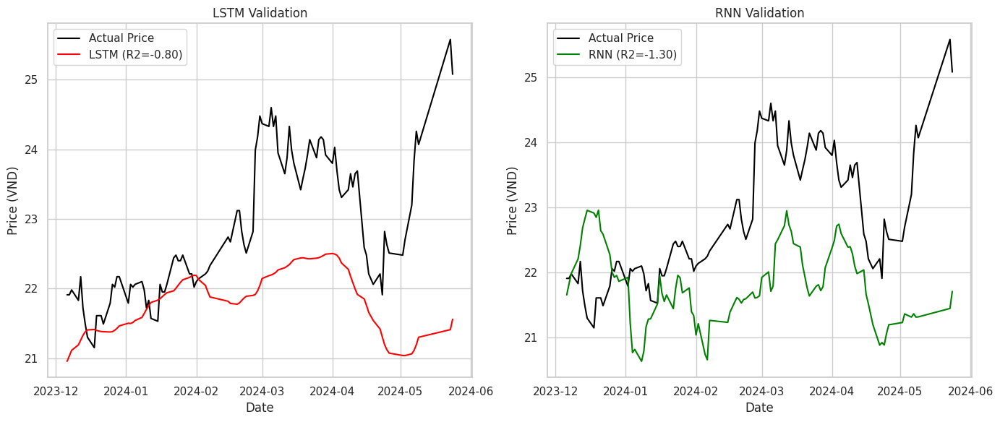

In [ ]:
# DL models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_hpg = df[df['stock_id'] == 'HPG'].sort_values('date').reset_index(drop=True)

# 2. Feature Setup
# Ensure we include the target (log_close) as the first feature for easier sequence creation
# User listed: 'gdp_growth', 'log_volume', 'log_rebar_price', 'interest', 'exchange_rate'
# We add 'log_close' to the front.
features = ['log_close', 'gdp_growth', 'log_iron_powder_price', 'log_rebar_price', 'interest', 'coke_price']
''' Phúc said: "Các biến vĩ mô với chỉ số tài chính không có tính chất theo chuỗi thời gian mà được fill forward
                nên là khi bỏ các biến này và chỉ chạy các biến mang tính chất time-series thì độ giải thích sẽ cao hơn (ko quá đáng kể)"
                '''
# còn bữa chạy ra độ ý nghĩa cao là do quên bỏ log_close vô feature... ae thông cảm :v
# features = ['log_close', 'volume', 'log_volume']

# Check if columns exist
missing_cols = [c for c in features if c not in df_hpg.columns]
if missing_cols:
    print(f"Missing columns: {missing_cols}")
    # Fallback or create if possible? log_close is likely there.
    # df_hpg['log_close'] should be there from previous steps or original file.
    # Original file has 'log_close'.
else:
    print("All features found.")

data = df_hpg[features].values

# 3. Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# 4. Create Sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        # Target is the NEXT value of the first column (log_close)
        # So at index i, sequence is i to i+seq_length-1. Target is at i+seq_length.
        y.append(data[i+seq_length, 0])
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# 5. Split Data (70% Train, 15% Val, 15% Test)
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val, y_val = X[train_end:val_end], y[train_end:val_end]
X_test, y_test = X[val_end:], y[val_end:]

print(f"Train shape: {X_train.shape}")
print(f"Val shape:   {X_val.shape}")
print(f"Test shape:  {X_test.shape}")

# 6. Model Building
input_shape = (X_train.shape[1], X_train.shape[2])

def build_lstm(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

def build_rnn(input_shape):
    model = Sequential()
    model.add(SimpleRNN(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(SimpleRNN(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# 7. Training
print("Training LSTM...")
lstm = build_lstm(input_shape)
# Use X_val for validation_data
lstm.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

print("Training RNN...")
rnn = build_rnn(input_shape)
rnn.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

# 8. Evaluation Helper
def evaluate_and_inverse(model, X_set, y_set, scaler):
    # Predict (scaled)
    pred_scaled = model.predict(X_set) # (N, 1)

    # Prepare dummy matrix for inverse transform
    # We need to fill other features with 0 (or anything) since scaler expects (N, n_features)
    # y_set is (N,)

    # Inverse Target (y_set)
    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0] # This is log_close

    # Inverse Prediction
    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0] # This is log_close

    # Convert to Price (exp)
    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    # Metrics
    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2

# Evaluate on Validation Set
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(lstm, X_val, y_val, scaler)
rnn_real, rnn_pred, rnn_rmse, rnn_mae, rnn_r2 = evaluate_and_inverse(rnn, X_val, y_val, scaler)

# 9. Results
results_df = pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2}
])

print("\n--- VALIDATION RESULTS (Price VND) ---")
print(results_df)

# 10. Plotting
val_dates = df_hpg['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

# LSTM Plot
plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label='Actual Price', color='black')
plt.plot(val_dates, lstm_pred, label=f'LSTM (R2={lstm_r2:.2f})', color='red')
plt.title('LSTM Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

# RNN Plot
plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label='Actual Price', color='black')
plt.plot(val_dates, rnn_pred, label=f'RNN (R2={rnn_r2:.2f})', color='green')
plt.title('RNN Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('deep_learning_validation.png')
plt.show()

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest: R2 (VAL) = 0.6375 | Best Params: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10}
Gradient Boosting: R2 (VAL) = 0.4047 | Best Params: {'subsample': 0.9, 'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 7, 'learning_rate': 0.2}
SVR: R2 (VAL) = 0.8806 | Best Params: {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}


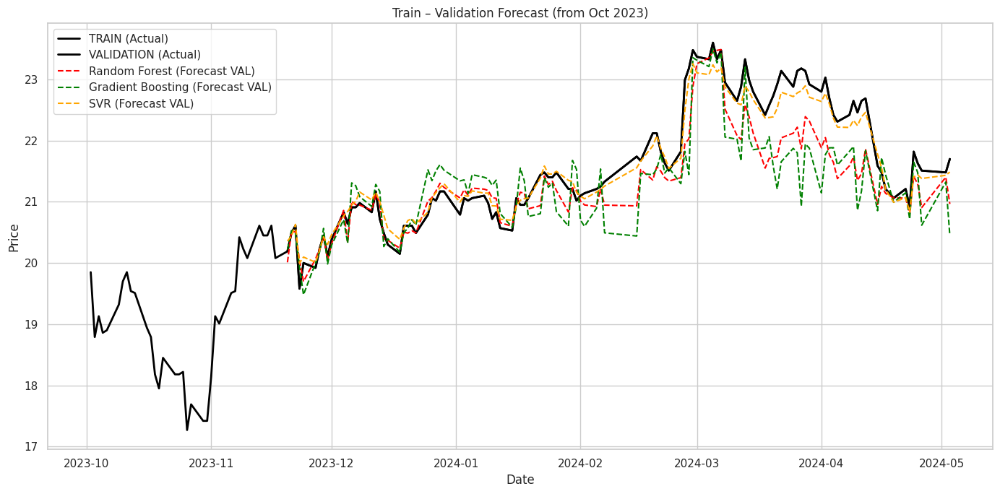

In [ ]:
# tuning ML
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# 1. Load & Preprocess Data
df = pd.read_csv('synchronized_data.csv')
data = df[df['stock_id'] == 'HPG'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Features & Target
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])
data['target_log'] = np.log(data['close']).shift(-1)

lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['de', 'gdp_growth', 'interest', 'roa', 'roe', 'log_rebar_price', 'log_iron_powder_price']

data_clean = data.dropna().reset_index(drop=True)

# 2. Split Data into Train / Val / Test
n = len(data_clean)
train_end = int(n * 0.70)          # 70% train
val_end = int(n * 0.85)            # 15% val, 15% test

X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values

X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# 4. Hyperparameter Tuning using only TRAIN (TimeSeriesSplit)
tscv = TimeSeriesSplit(n_splits=3)

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

gb_params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

svr_params = {
    'C': [0.1, 1, 10, 100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'epsilon': [0.001, 0.01, 0.1],
    'kernel': ['rbf']
}

models = [
    ('Random Forest', RandomForestRegressor(random_state=42, n_jobs=-1), rf_params),
    ('Gradient Boosting', GradientBoostingRegressor(random_state=42), gb_params),
    ('SVR', SVR(), svr_params)
]

print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    r2_val = r2_score(np.exp(y_val), np.exp(pred_val_log))

    print(f"{name}: R2 (VAL) = {r2_val:.4f} | Best Params: {search.best_params_}")

# --------------------------
#  TRỰC QUAN HÓA TRAIN – VAL
# --------------------------

plot_df = data_clean[['date', 'close']].copy()
predictions_val = {}

for name, model, params in models:
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    pred_val = np.exp(pred_val_log)

    predictions_val[name] = pred_val


# Biểu đồ 2: Chỉ từ 10/2023
start_date = pd.Timestamp("2023-10-01")
mask = plot_df['date'] >= start_date

# ---------------------------------------
# TÙY CHỈNH MÀU CHO TỪNG ĐƯỜNG
# ---------------------------------------
color_map = {
    'TRAIN': 'black',
    'VAL': 'black',
    'Random Forest': 'red',
    'Gradient Boosting': 'green',
    'SVR': 'orange'
}
# ---------------------------------------

plt.figure(figsize=(14, 7))

# TRAIN (Actual)
plt.plot(
    plot_df['date'][:val_end][mask[:val_end]],
    plot_df['close'][:val_end][mask[:val_end]],
    label='TRAIN (Actual)',
    linewidth=2,
    color=color_map['TRAIN']
)

# VALIDATION (Actual)
plt.plot(
    plot_df['date'][train_end:val_end][mask[train_end:val_end]],
    plot_df['close'][train_end:val_end][mask[train_end:val_end]],
    label='VALIDATION (Actual)',
    linewidth=2,
    color=color_map['VAL']
)

# FORECASTS for each model
for name, pred_val in predictions_val.items():
    plt.plot(
        plot_df['date'][train_end:val_end][mask[train_end:val_end]],
        pred_val[mask[train_end:val_end]],
        linestyle='--',
        label=f'{name} (Forecast VAL)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Train – Validation Forecast (from Oct 2023)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    # Dự báo log
    pred_val_log = best_model.predict(X_val_scaled)

    # Chuyển về giá trị thực
    pred_val = np.exp(pred_val_log)
    y_val_real = np.exp(y_val)

    # Tính RMSE, MAE, R2
    rmse_val = np.sqrt(mean_squared_error(y_val_real, pred_val))
    mae_val = mean_absolute_error(y_val_real, pred_val)
    r2_val = r2_score(y_val_real, pred_val)

    # In kết quả
    print(f"{name}:")
    print(f"   RMSE (VAL) = {rmse_val:.4f}")
    print(f"   MAE  (VAL) = {mae_val:.4f}")
    print(f"   R2   (VAL) = {r2_val:.4f}")
    print(f"   Best Params = {search.best_params_}")
    print("-" * 60)

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest:
   RMSE (VAL) = 0.5983
   MAE  (VAL) = 0.4456
   R2   (VAL) = 0.6375
   Best Params = {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10}
------------------------------------------------------------
Gradient Boosting:
   RMSE (VAL) = 0.7668
   MAE  (VAL) = 0.5858
   R2   (VAL) = 0.4047
   Best Params = {'subsample': 0.9, 'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 7, 'learning_rate': 0.2}
------------------------------------------------------------
SVR:
   RMSE (VAL) = 0.3433
   MAE  (VAL) = 0.2570
   R2   (VAL) = 0.8806
   Best Params = {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}
------------------------------------------------------------


Train: (486, 40, 6)  Val: (104, 40, 6)  Test: (105, 40, 6)

===== TUNING LSTM =====
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=40


1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 405ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step
Testing LSTM: uni

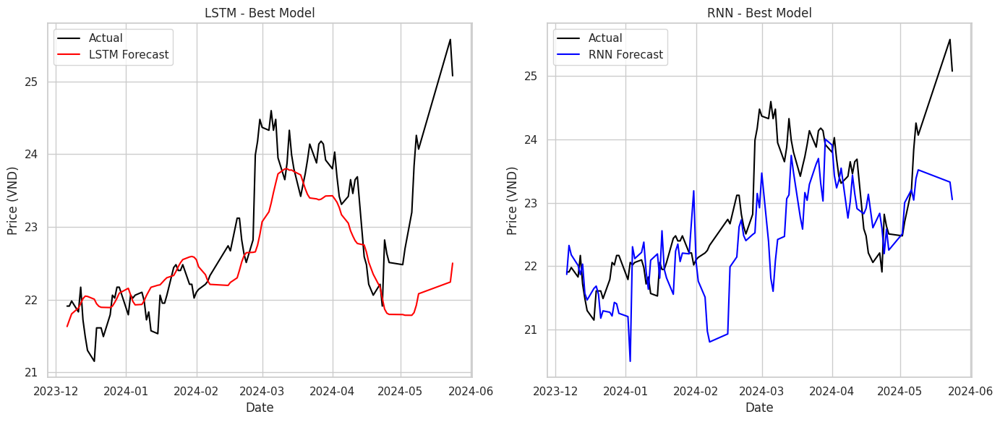

In [ ]:
# tuning DL
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings
warnings.filterwarnings('ignore')

# ===========================================
# 1. Load Data
# ===========================================
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_hpg = df[df['stock_id'] == 'HPG'].sort_values('date').reset_index(drop=True)

# 2. Features
features = ['log_close', 'gdp_growth', 'log_iron_powder_price', 'log_rebar_price',
            'interest', 'coke_price']

data = df_hpg[features].values

# ===========================================
# 3. Scaling
# ===========================================
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# ===========================================
# 4. Create Sequences
# ===========================================
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length, 0])  # log_close
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# ===========================================
# 5. Train-Validation-Test Split
# ===========================================
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end   = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val,   y_val   = X[train_end:val_end], y[train_end:val_end]
X_test,  y_test  = X[val_end:], y[val_end:]

input_shape = (X_train.shape[1], X_train.shape[2])

print("Train:", X_train.shape, " Val:", X_val.shape, " Test:", X_test.shape)

# ===========================================
# 6. Define Model Builders
# ===========================================
def build_lstm_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(LSTM(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

def build_rnn_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(SimpleRNN(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(SimpleRNN(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# ===========================================
# 7. Hyperparameter Search Space
# ===========================================
param_grid = {
    "num_units": [32, 50, 64],
    "dropout": [0.1, 0.2, 0.3],
    "lr": [0.001, 0.0005],
    "batch_size": [16, 32],
    "epochs": [40, 60]
}

# ===========================================
# 8. Train + Validation Evaluation
# ===========================================
def evaluate_and_inverse(model, X_set, y_set, scaler):
    pred_scaled = model.predict(X_set)

    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0]

    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0]

    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2


def tune_model(build_fn, model_name):
    best_r2 = -999
    best_params = {}
    best_model = None

    print(f"\n===== TUNING {model_name} =====")

    for units in param_grid['num_units']:
        for dr in param_grid['dropout']:
            for lr in param_grid['lr']:
                for bs in param_grid['batch_size']:
                    for ep in param_grid['epochs']:

                        print(f"Testing {model_name}: units={units}, dr={dr}, lr={lr}, bs={bs}, ep={ep}")

                        model = build_fn(units, dr, lr)
                        model.fit(X_train, y_train, batch_size=bs, epochs=ep,
                                  validation_data=(X_val, y_val), verbose=0)

                        _, _, rmse, mae, r2 = evaluate_and_inverse(model, X_val, y_val, scaler)

                        if r2 > best_r2:
                            best_r2 = r2
                            best_params = dict(units=units, dropout=dr, lr=lr, batch=bs, epochs=ep)
                            best_model = model

    print(f"\nBEST {model_name} PARAMS:", best_params)
    print(f"BEST {model_name} R2 on Validation:", best_r2)

    return best_model, best_params, best_r2

# ===========================================
# 9. Run Tuning for LSTM & RNN
# ===========================================
best_lstm, lstm_params, lstm_r2 = tune_model(build_lstm_model, "LSTM")
best_rnn,  rnn_params,  rnn_r2  = tune_model(build_rnn_model, "RNN")

# ===========================================
# 10. Final Evaluation on Validation
# ===========================================
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(best_lstm, X_val, y_val, scaler)
rnn_real,  rnn_pred,  rnn_rmse,  rnn_mae,  rnn_r2  = evaluate_and_inverse(best_rnn, X_val, y_val, scaler)

print("\n=== FINAL VALIDATION RESULTS ===")
print(pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2, 'Params': lstm_params},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2, 'Params': rnn_params}
]))

# ===========================================
# 11. Plotting
# ===========================================
val_dates = df_hpg['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label="Actual", color="black")
plt.plot(val_dates, lstm_pred, label="LSTM Forecast", color="red")
plt.title("LSTM - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label="Actual", color="black")
plt.plot(val_dates, rnn_pred, label="RNN Forecast", color="blue")
plt.title("RNN - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

**HSG**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (1, 1, 1) with AIC: -1950.85
Performing rolling forecast on Validation Set...

--- Validation Results (HSG) ---
RMSE: 0.4265
MAE: 0.3277
R2 Score: 0.8010


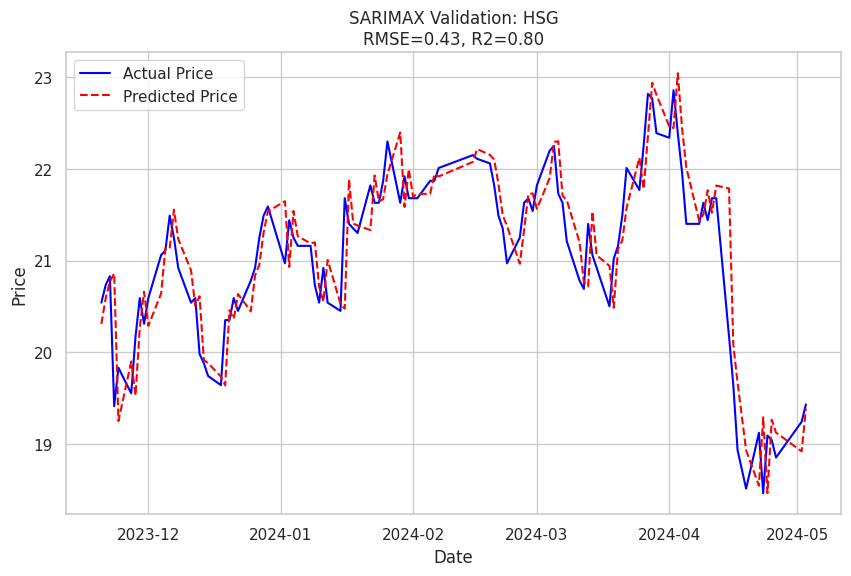

In [ ]:
# sarimax
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='HSG'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

run_sarimax_custom()

--- VALIDATION RESULTS (70% Train / 15% Val) ---
               Model      RMSE       MAE  R2 Score
0      Random Forest  0.672482  0.563419  0.511318
2                SVR  0.761196  0.610969  0.373880
1  Gradient Boosting  0.782842  0.630859  0.337763


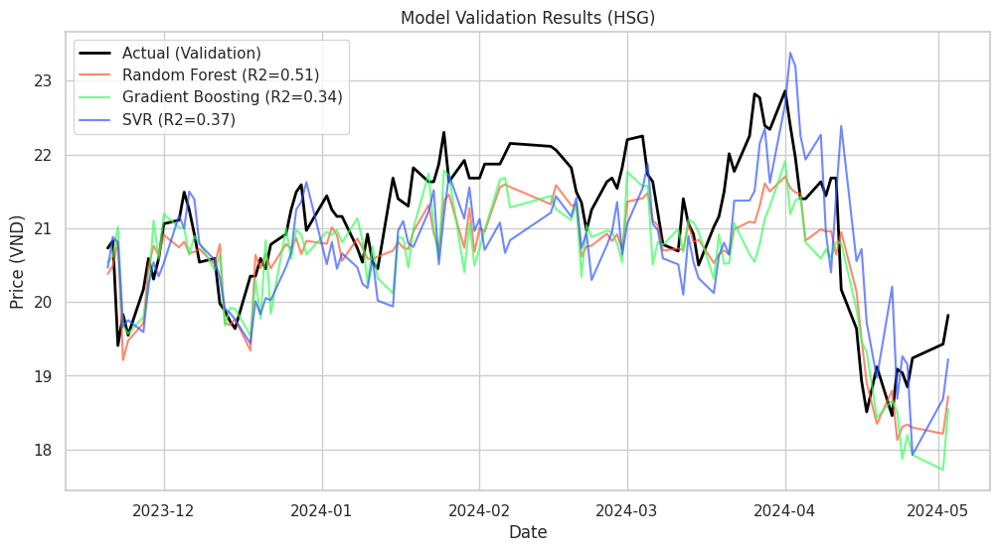

In [ ]:
# ML models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
try:
    df = pd.read_csv('synchronized_data.csv')
except FileNotFoundError:
    print("Error: File not found.")
    exit()

# Preprocessing for HPG
data = df[df['stock_id'] == 'HSG'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Create features
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])

# Target: Next day's log close
data['target_log'] = np.log(data['close']).shift(-1)

# Lags
lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']

# Clean NaN
data_clean = data.dropna().reset_index(drop=True)

# 2. SPLIT DATA (70% Train, 15% Val, 15% Test)
n = len(data_clean)
train_end = int(n * 0.70)
val_end = int(n * 0.85)

# Train Set
X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

# Validation Set
X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values
val_dates = data_clean.iloc[train_end:val_end]['date']

# Test Set (Reserved)
X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling (Fit on Train, Transform Val/Test)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test) # Not used in this validation step

# 4. Models
results = {}

# Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
pred_rf_log = rf.predict(X_val)
results['Random Forest'] = np.exp(pred_rf_log)

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gb.fit(X_train, y_train)
pred_gb_log = gb.predict(X_val)
results['Gradient Boosting'] = np.exp(pred_gb_log)

# SVR (Uses Scaled Data)
svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.01)
svr.fit(X_train_scaled, y_train)
pred_svr_log = svr.predict(X_val_scaled)
results['SVR'] = np.exp(pred_svr_log)

# 5. Evaluation
y_val_real = np.exp(y_val)
metrics = []

for name, preds in results.items():
    rmse = np.sqrt(mean_squared_error(y_val_real, preds))
    mae = mean_absolute_error(y_val_real, preds)
    r2 = r2_score(y_val_real, preds)
    metrics.append({'Model': name, 'RMSE': rmse, 'MAE': mae, 'R2 Score': r2})

metrics_df = pd.DataFrame(metrics).sort_values('R2 Score', ascending=False)
print("--- VALIDATION RESULTS (70% Train / 15% Val) ---")
print(metrics_df)

# Plot
plt.figure(figsize=(12, 6))
plt.plot(val_dates, y_val_real, label='Actual (Validation)', color='black', linewidth=2)
colors = ['#FF5733', '#33FF57', '#3357FF']
for i, (name, preds) in enumerate(results.items()):
    r2 = metrics_df[metrics_df['Model'] == name]['R2 Score'].values[0]
    plt.plot(val_dates, preds, label=f"{name} (R2={r2:.2f})", color=colors[i], alpha=0.7)

plt.title('Model Validation Results (HSG)')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)
plt.show()

All features found.
Train shape: (486, 40, 8)
Val shape:   (104, 40, 8)
Test shape:  (105, 40, 8)
Training LSTM...
Training RNN...
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

--- VALIDATION RESULTS (Price VND) ---
  Model      RMSE       MAE         R2
0  LSTM  2.473111  2.223429  -5.524017
1   RNN  3.341455  3.064794 -10.909650


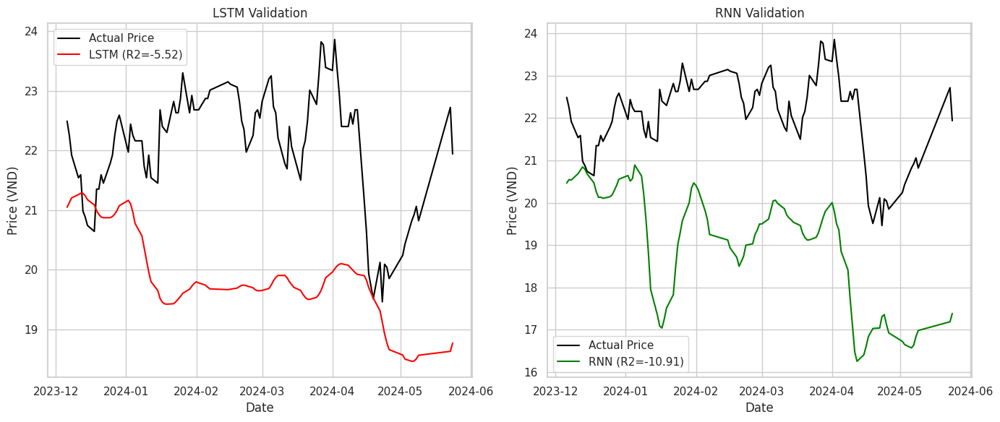

In [ ]:
# DL models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_hsg = df[df['stock_id'] == 'HSG'].sort_values('date').reset_index(drop=True)

# 2. Feature Setup
# Ensure we include the target (log_close) as the first feature for easier sequence creation
# User listed: 'gdp_growth', 'log_volume', 'log_rebar_price', 'interest', 'exchange_rate'
# We add 'log_close' to the front.
features = ['log_close', 'interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']
''' Phúc said: "Các biến vĩ mô với chỉ số tài chính không có tính chất theo chuỗi thời gian mà được fill forward
                nên là khi bỏ các biến này và chỉ chạy các biến mang tính chất time-series thì độ giải thích sẽ cao hơn (ko quá đáng kể)"
                '''
# còn bữa chạy ra độ ý nghĩa cao là do quên bỏ log_close vô feature... ae thông cảm :v
# features = ['log_close', 'volume', 'log_volume']

# Check if columns exist
missing_cols = [c for c in features if c not in df_hsg.columns]
if missing_cols:
    print(f"Missing columns: {missing_cols}")
    # Fallback or create if possible? log_close is likely there.
    # df_hsg['log_close'] should be there from previous steps or original file.
    # Original file has 'log_close'.
else:
    print("All features found.")

data = df_hsg[features].values

# 3. Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# 4. Create Sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        # Target is the NEXT value of the first column (log_close)
        # So at index i, sequence is i to i+seq_length-1. Target is at i+seq_length.
        y.append(data[i+seq_length, 0])
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# 5. Split Data (70% Train, 15% Val, 15% Test)
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val, y_val = X[train_end:val_end], y[train_end:val_end]
X_test, y_test = X[val_end:], y[val_end:]

print(f"Train shape: {X_train.shape}")
print(f"Val shape:   {X_val.shape}")
print(f"Test shape:  {X_test.shape}")

# 6. Model Building
input_shape = (X_train.shape[1], X_train.shape[2])

def build_lstm(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

def build_rnn(input_shape):
    model = Sequential()
    model.add(SimpleRNN(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(SimpleRNN(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# 7. Training
print("Training LSTM...")
lstm = build_lstm(input_shape)
# Use X_val for validation_data
lstm.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

print("Training RNN...")
rnn = build_rnn(input_shape)
rnn.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

# 8. Evaluation Helper
def evaluate_and_inverse(model, X_set, y_set, scaler):
    # Predict (scaled)
    pred_scaled = model.predict(X_set) # (N, 1)

    # Prepare dummy matrix for inverse transform
    # We need to fill other features with 0 (or anything) since scaler expects (N, n_features)
    # y_set is (N,)

    # Inverse Target (y_set)
    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0] # This is log_close

    # Inverse Prediction
    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0] # This is log_close

    # Convert to Price (exp)
    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    # Metrics
    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2

# Evaluate on Validation Set
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(lstm, X_val, y_val, scaler)
rnn_real, rnn_pred, rnn_rmse, rnn_mae, rnn_r2 = evaluate_and_inverse(rnn, X_val, y_val, scaler)

# 9. Results
results_df = pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2}
])

print("\n--- VALIDATION RESULTS (Price VND) ---")
print(results_df)

# 10. Plotting
val_dates = df_hsg['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

# LSTM Plot
plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label='Actual Price', color='black')
plt.plot(val_dates, lstm_pred, label=f'LSTM (R2={lstm_r2:.2f})', color='red')
plt.title('LSTM Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

# RNN Plot
plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label='Actual Price', color='black')
plt.plot(val_dates, rnn_pred, label=f'RNN (R2={rnn_r2:.2f})', color='green')
plt.title('RNN Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest: R2 (VAL) = 0.5468 | Best Params: {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 5}
Gradient Boosting: R2 (VAL) = 0.4304 | Best Params: {'subsample': 0.7, 'n_estimators': 200, 'min_samples_split': 10, 'max_depth': 7, 'learning_rate': 0.05}
SVR: R2 (VAL) = 0.6517 | Best Params: {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}


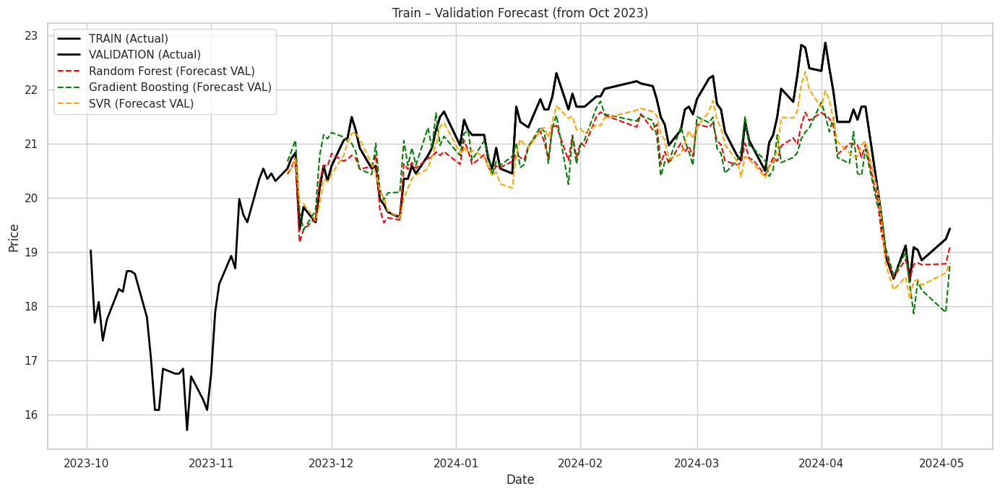

In [ ]:
# tuning ML
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# 1. Load & Preprocess Data
df = pd.read_csv('synchronized_data.csv')
data = df[df['stock_id'] == 'HSG'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Features & Target
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])
data['target_log'] = np.log(data['close']).shift(-1)

lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']

data_clean = data.dropna().reset_index(drop=True)

# 2. Split Data into Train / Val / Test
n = len(data_clean)
train_end = int(n * 0.70)          # 70% train
val_end = int(n * 0.85)            # 15% val, 15% test

X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values

X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# 4. Hyperparameter Tuning using only TRAIN (TimeSeriesSplit)
tscv = TimeSeriesSplit(n_splits=3)

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

gb_params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

svr_params = {
    'C': [0.1, 1, 10, 100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'epsilon': [0.001, 0.01, 0.1],
    'kernel': ['rbf']
}

models = [
    ('Random Forest', RandomForestRegressor(random_state=42, n_jobs=-1), rf_params),
    ('Gradient Boosting', GradientBoostingRegressor(random_state=42), gb_params),
    ('SVR', SVR(), svr_params)
]

print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    r2_val = r2_score(np.exp(y_val), np.exp(pred_val_log))

    print(f"{name}: R2 (VAL) = {r2_val:.4f} | Best Params: {search.best_params_}")

# --------------------------
#  TRỰC QUAN HÓA TRAIN – VAL
# --------------------------

plot_df = data_clean[['date', 'close']].copy()
predictions_val = {}

for name, model, params in models:
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    pred_val = np.exp(pred_val_log)

    predictions_val[name] = pred_val


# Biểu đồ 2: Chỉ từ 10/2023
start_date = pd.Timestamp("2023-10-01")
mask = plot_df['date'] >= start_date

# ---------------------------------------
# TÙY CHỈNH MÀU CHO TỪNG ĐƯỜNG
# ---------------------------------------
color_map = {
    'TRAIN': 'black',
    'VAL': 'black',
    'Random Forest': 'red',
    'Gradient Boosting': 'green',
    'SVR': 'orange'
}
# ---------------------------------------

plt.figure(figsize=(14, 7))

# TRAIN (Actual)
plt.plot(
    plot_df['date'][:val_end][mask[:val_end]],
    plot_df['close'][:val_end][mask[:val_end]],
    label='TRAIN (Actual)',
    linewidth=2,
    color=color_map['TRAIN']
)

# VALIDATION (Actual)
plt.plot(
    plot_df['date'][train_end:val_end][mask[train_end:val_end]],
    plot_df['close'][train_end:val_end][mask[train_end:val_end]],
    label='VALIDATION (Actual)',
    linewidth=2,
    color=color_map['VAL']
)

# FORECASTS for each model
for name, pred_val in predictions_val.items():
    plt.plot(
        plot_df['date'][train_end:val_end][mask[train_end:val_end]],
        pred_val[mask[train_end:val_end]],
        linestyle='--',
        label=f'{name} (Forecast VAL)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Train – Validation Forecast (from Oct 2023)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    # Dự báo log
    pred_val_log = best_model.predict(X_val_scaled)

    # Chuyển về giá trị thực
    pred_val = np.exp(pred_val_log)
    y_val_real = np.exp(y_val)

    # Tính RMSE, MAE, R2
    rmse_val = np.sqrt(mean_squared_error(y_val_real, pred_val))
    mae_val = mean_absolute_error(y_val_real, pred_val)
    r2_val = r2_score(y_val_real, pred_val)

    # In kết quả
    print(f"{name}:")
    print(f"   RMSE (VAL) = {rmse_val:.4f}")
    print(f"   MAE  (VAL) = {mae_val:.4f}")
    print(f"   R2   (VAL) = {r2_val:.4f}")
    print(f"   Best Params = {search.best_params_}")
    print("-" * 60)

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest:
   RMSE (VAL) = 0.6476
   MAE  (VAL) = 0.5373
   R2   (VAL) = 0.5468
   Best Params = {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 5}
------------------------------------------------------------
Gradient Boosting:
   RMSE (VAL) = 0.7260
   MAE  (VAL) = 0.5854
   R2   (VAL) = 0.4304
   Best Params = {'subsample': 0.7, 'n_estimators': 200, 'min_samples_split': 10, 'max_depth': 7, 'learning_rate': 0.05}
------------------------------------------------------------
SVR:
   RMSE (VAL) = 0.5677
   MAE  (VAL) = 0.4699
   R2   (VAL) = 0.6517
   Best Params = {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}
------------------------------------------------------------


Train: (486, 40, 8)  Val: (104, 40, 8)  Test: (105, 40, 8)

===== TUNING LSTM =====
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━

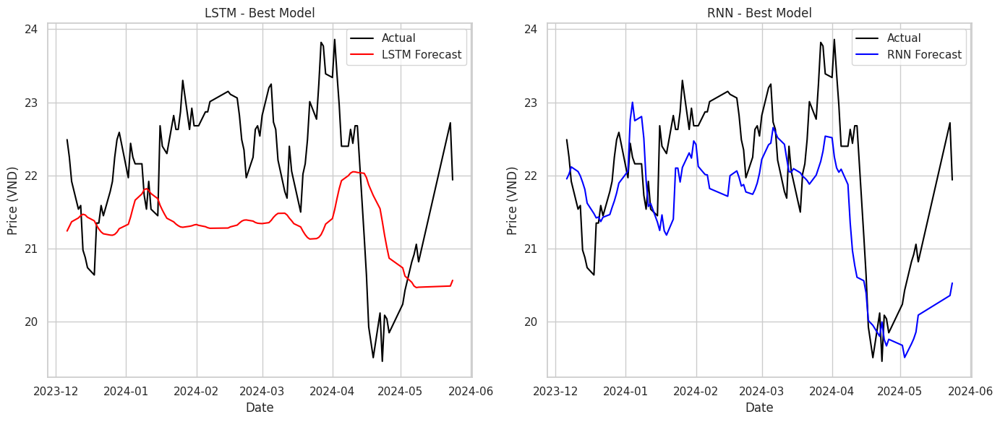

In [ ]:
# tuning DL
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings
warnings.filterwarnings('ignore')

# ===========================================
# 1. Load Data
# ===========================================
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_hpg = df[df['stock_id'] == 'HSG'].sort_values('date').reset_index(drop=True)

# 2. Features
features = ['log_close', 'interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']

data = df_hsg[features].values

# ===========================================
# 3. Scaling
# ===========================================
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# ===========================================
# 4. Create Sequences
# ===========================================
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length, 0])  # log_close
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# ===========================================
# 5. Train-Validation-Test Split
# ===========================================
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end   = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val,   y_val   = X[train_end:val_end], y[train_end:val_end]
X_test,  y_test  = X[val_end:], y[val_end:]

input_shape = (X_train.shape[1], X_train.shape[2])

print("Train:", X_train.shape, " Val:", X_val.shape, " Test:", X_test.shape)

# ===========================================
# 6. Define Model Builders
# ===========================================
def build_lstm_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(LSTM(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

def build_rnn_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(SimpleRNN(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(SimpleRNN(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# ===========================================
# 7. Hyperparameter Search Space
# ===========================================
param_grid = {
    "num_units": [32, 50, 64],
    "dropout": [0.1, 0.2, 0.3],
    "lr": [0.001, 0.0005],
    "batch_size": [16, 32],
    "epochs": [40, 60]
}

# ===========================================
# 8. Train + Validation Evaluation
# ===========================================
def evaluate_and_inverse(model, X_set, y_set, scaler):
    pred_scaled = model.predict(X_set)

    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0]

    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0]

    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2


def tune_model(build_fn, model_name):
    best_r2 = -999
    best_params = {}
    best_model = None

    print(f"\n===== TUNING {model_name} =====")

    for units in param_grid['num_units']:
        for dr in param_grid['dropout']:
            for lr in param_grid['lr']:
                for bs in param_grid['batch_size']:
                    for ep in param_grid['epochs']:

                        print(f"Testing {model_name}: units={units}, dr={dr}, lr={lr}, bs={bs}, ep={ep}")

                        model = build_fn(units, dr, lr)
                        model.fit(X_train, y_train, batch_size=bs, epochs=ep,
                                  validation_data=(X_val, y_val), verbose=0)

                        _, _, rmse, mae, r2 = evaluate_and_inverse(model, X_val, y_val, scaler)

                        if r2 > best_r2:
                            best_r2 = r2
                            best_params = dict(units=units, dropout=dr, lr=lr, batch=bs, epochs=ep)
                            best_model = model

    print(f"\nBEST {model_name} PARAMS:", best_params)
    print(f"BEST {model_name} R2 on Validation:", best_r2)

    return best_model, best_params, best_r2

# ===========================================
# 9. Run Tuning for LSTM & RNN
# ===========================================
best_lstm, lstm_params, lstm_r2 = tune_model(build_lstm_model, "LSTM")
best_rnn,  rnn_params,  rnn_r2  = tune_model(build_rnn_model, "RNN")

# ===========================================
# 10. Final Evaluation on Validation
# ===========================================
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(best_lstm, X_val, y_val, scaler)
rnn_real,  rnn_pred,  rnn_rmse,  rnn_mae,  rnn_r2  = evaluate_and_inverse(best_rnn, X_val, y_val, scaler)

print("\n=== FINAL VALIDATION RESULTS ===")
print(pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2, 'Params': lstm_params},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2, 'Params': rnn_params}
]))

# ===========================================
# 11. Plotting
# ===========================================
val_dates = df_hsg['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label="Actual", color="black")
plt.plot(val_dates, lstm_pred, label="LSTM Forecast", color="red")
plt.title("LSTM - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label="Actual", color="black")
plt.plot(val_dates, rnn_pred, label="RNN Forecast", color="blue")
plt.title("RNN - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

**NKG**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (1, 1, 1) with AIC: -5239.34
Performing rolling forecast on Validation Set...

--- Validation Results (NKG) ---
RMSE: 0.0183
MAE: 0.0109
R2 Score: 0.9995


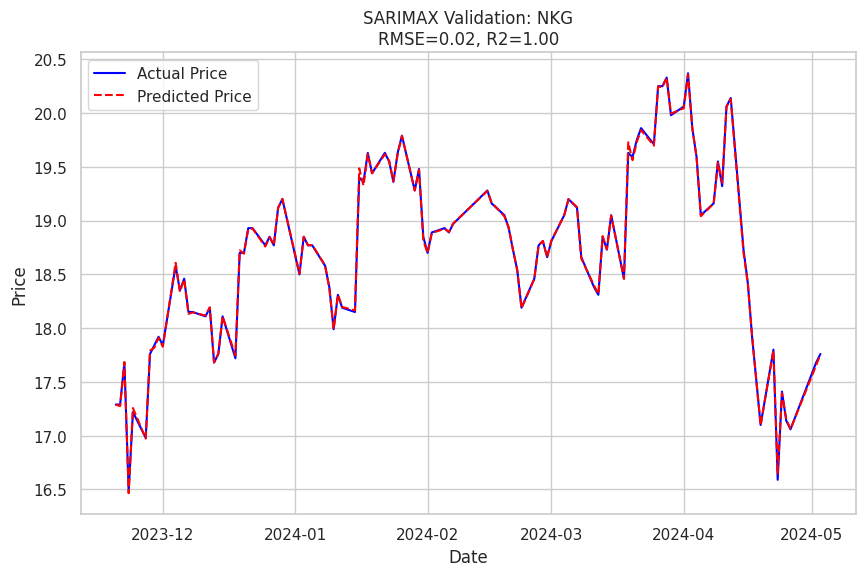

In [ ]:
# sarimax
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='NKG'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

run_sarimax_custom()

--- VALIDATION RESULTS (70% Train / 15% Val) ---
               Model      RMSE       MAE  R2 Score
2                SVR  0.504085  0.392203   0.63391
0      Random Forest  0.531680  0.413480   0.59273
1  Gradient Boosting  0.624692  0.504113   0.43777


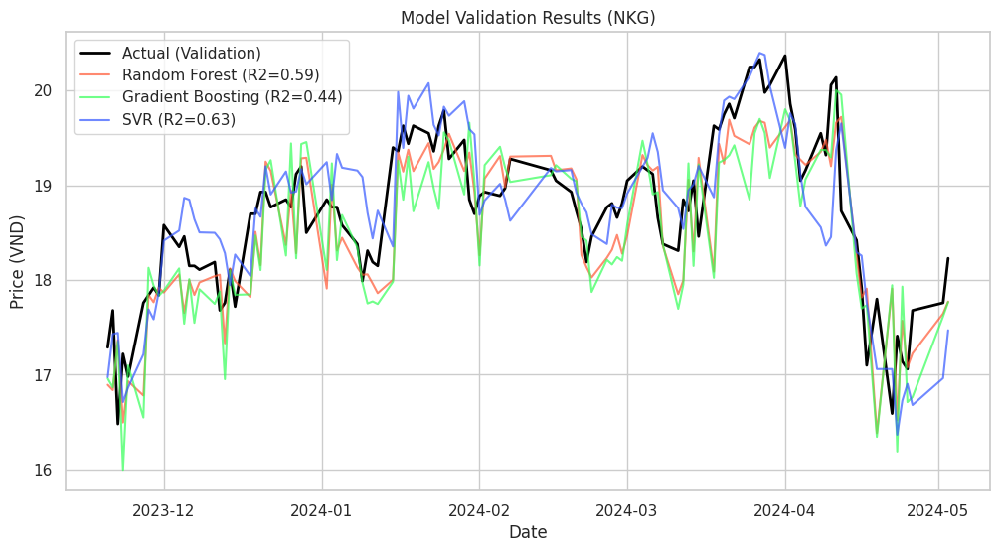

In [ ]:
# ML models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
try:
    df = pd.read_csv('synchronized_data.csv')
except FileNotFoundError:
    print("Error: File not found.")
    exit()

# Preprocessing for NKG
data = df[df['stock_id'] == 'NKG'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Create features
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])

# Target: Next day's log close
data['target_log'] = np.log(data['close']).shift(-1)

# Lags
lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']

# Clean NaN
data_clean = data.dropna().reset_index(drop=True)

# 2. SPLIT DATA (70% Train, 15% Val, 15% Test)
n = len(data_clean)
train_end = int(n * 0.70)
val_end = int(n * 0.85)

# Train Set
X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

# Validation Set
X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values
val_dates = data_clean.iloc[train_end:val_end]['date']

# Test Set (Reserved)
X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling (Fit on Train, Transform Val/Test)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test) # Not used in this validation step

# 4. Models
results = {}

# Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
pred_rf_log = rf.predict(X_val)
results['Random Forest'] = np.exp(pred_rf_log)

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gb.fit(X_train, y_train)
pred_gb_log = gb.predict(X_val)
results['Gradient Boosting'] = np.exp(pred_gb_log)

# SVR (Uses Scaled Data)
svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.01)
svr.fit(X_train_scaled, y_train)
pred_svr_log = svr.predict(X_val_scaled)
results['SVR'] = np.exp(pred_svr_log)

# 5. Evaluation
y_val_real = np.exp(y_val)
metrics = []

for name, preds in results.items():
    rmse = np.sqrt(mean_squared_error(y_val_real, preds))
    mae = mean_absolute_error(y_val_real, preds)
    r2 = r2_score(y_val_real, preds)
    metrics.append({'Model': name, 'RMSE': rmse, 'MAE': mae, 'R2 Score': r2})

metrics_df = pd.DataFrame(metrics).sort_values('R2 Score', ascending=False)
print("--- VALIDATION RESULTS (70% Train / 15% Val) ---")
print(metrics_df)

# Plot
plt.figure(figsize=(12, 6))
plt.plot(val_dates, y_val_real, label='Actual (Validation)', color='black', linewidth=2)
colors = ['#FF5733', '#33FF57', '#3357FF']
for i, (name, preds) in enumerate(results.items()):
    r2 = metrics_df[metrics_df['Model'] == name]['R2 Score'].values[0]
    plt.plot(val_dates, preds, label=f"{name} (R2={r2:.2f})", color=colors[i], alpha=0.7)

plt.title('Model Validation Results (NKG)')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)
plt.show()

All features found.
Train shape: (486, 40, 7)
Val shape:   (104, 40, 7)
Test shape:  (105, 40, 7)
Training LSTM...
Training RNN...
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step

--- VALIDATION RESULTS (Price VND) ---
  Model      RMSE       MAE        R2
0  LSTM  0.003839  0.002419  0.770320
1   RNN  0.006356  0.005005  0.370435


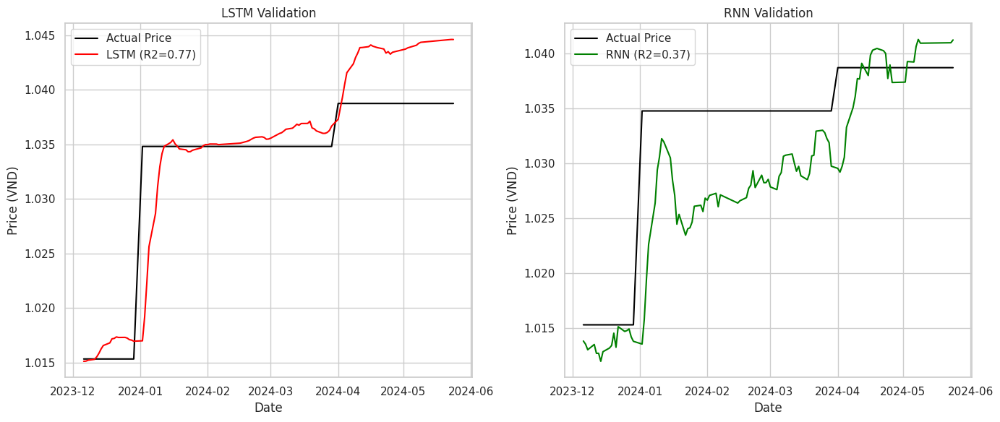

In [ ]:
# DL models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_nkg = df[df['stock_id'] == 'NKG'].sort_values('date').reset_index(drop=True)

# 2. Feature Setup
# Ensure we include the target (log_close) as the first feature for easier sequence creation
# User listed: 'gdp_growth', 'log_volume', 'log_rebar_price', 'interest', 'exchange_rate'
# We add 'log_close' to the front.
features = ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']
''' Phúc said: "Các biến vĩ mô với chỉ số tài chính không có tính chất theo chuỗi thời gian mà được fill forward
                nên là khi bỏ các biến này và chỉ chạy các biến mang tính chất time-series thì độ giải thích sẽ cao hơn (ko quá đáng kể)"
                '''
# còn bữa chạy ra độ ý nghĩa cao là do quên bỏ log_close vô feature... ae thông cảm :v
# features = ['log_close', 'volume', 'log_volume']

# Check if columns exist
missing_cols = [c for c in features if c not in df_nkg.columns]
if missing_cols:
    print(f"Missing columns: {missing_cols}")
    # Fallback or create if possible? log_close is likely there.
    # df_nkg['log_close'] should be there from previous steps or original file.
    # Original file has 'log_close'.
else:
    print("All features found.")

data = df_nkg[features].values

# 3. Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# 4. Create Sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        # Target is the NEXT value of the first column (log_close)
        # So at index i, sequence is i to i+seq_length-1. Target is at i+seq_length.
        y.append(data[i+seq_length, 0])
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# 5. Split Data (70% Train, 15% Val, 15% Test)
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val, y_val = X[train_end:val_end], y[train_end:val_end]
X_test, y_test = X[val_end:], y[val_end:]

print(f"Train shape: {X_train.shape}")
print(f"Val shape:   {X_val.shape}")
print(f"Test shape:  {X_test.shape}")

# 6. Model Building
input_shape = (X_train.shape[1], X_train.shape[2])

def build_lstm(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

def build_rnn(input_shape):
    model = Sequential()
    model.add(SimpleRNN(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(SimpleRNN(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# 7. Training
print("Training LSTM...")
lstm = build_lstm(input_shape)
# Use X_val for validation_data
lstm.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

print("Training RNN...")
rnn = build_rnn(input_shape)
rnn.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

# 8. Evaluation Helper
def evaluate_and_inverse(model, X_set, y_set, scaler):
    # Predict (scaled)
    pred_scaled = model.predict(X_set) # (N, 1)

    # Prepare dummy matrix for inverse transform
    # We need to fill other features with 0 (or anything) since scaler expects (N, n_features)
    # y_set is (N,)

    # Inverse Target (y_set)
    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0] # This is log_close

    # Inverse Prediction
    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0] # This is log_close

    # Convert to Price (exp)
    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    # Metrics
    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2

# Evaluate on Validation Set
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(lstm, X_val, y_val, scaler)
rnn_real, rnn_pred, rnn_rmse, rnn_mae, rnn_r2 = evaluate_and_inverse(rnn, X_val, y_val, scaler)

# 9. Results
results_df = pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2}
])

print("\n--- VALIDATION RESULTS (Price VND) ---")
print(results_df)

# 10. Plotting
val_dates = df_nkg['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

# LSTM Plot
plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label='Actual Price', color='black')
plt.plot(val_dates, lstm_pred, label=f'LSTM (R2={lstm_r2:.2f})', color='red')
plt.title('LSTM Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

# RNN Plot
plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label='Actual Price', color='black')
plt.plot(val_dates, rnn_pred, label=f'RNN (R2={rnn_r2:.2f})', color='green')
plt.title('RNN Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()


Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest: R2 (VAL) = 0.5927 | Best Params: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10}
Gradient Boosting: R2 (VAL) = 0.3285 | Best Params: {'subsample': 0.8, 'n_estimators': 300, 'min_samples_split': 10, 'max_depth': 5, 'learning_rate': 0.1}
SVR: R2 (VAL) = 0.4130 | Best Params: {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}


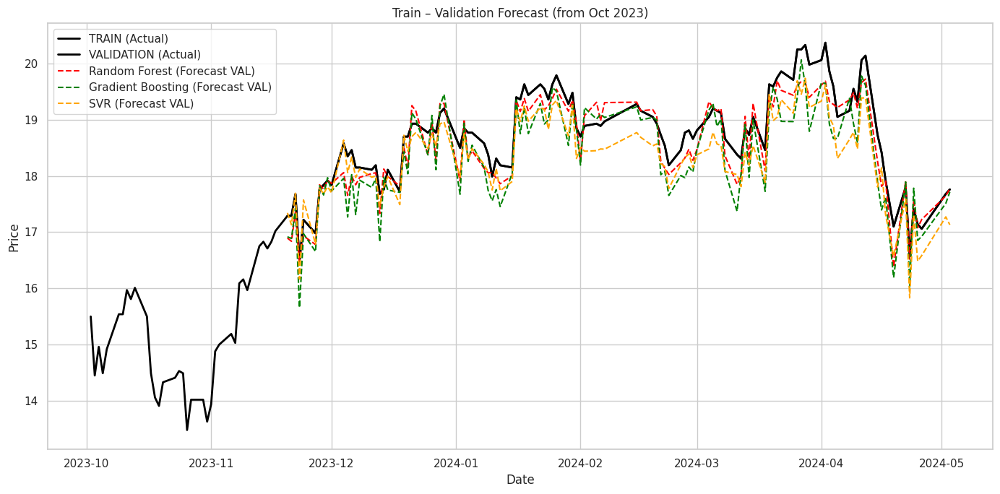

In [ ]:
# tuning ML
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# 1. Load & Preprocess Data
df = pd.read_csv('synchronized_data.csv')
data = df[df['stock_id'] == 'NKG'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Features & Target
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])
data['target_log'] = np.log(data['close']).shift(-1)

lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']

data_clean = data.dropna().reset_index(drop=True)

# 2. Split Data into Train / Val / Test
n = len(data_clean)
train_end = int(n * 0.70)          # 70% train
val_end = int(n * 0.85)            # 15% val, 15% test

X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values

X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# 4. Hyperparameter Tuning using only TRAIN (TimeSeriesSplit)
tscv = TimeSeriesSplit(n_splits=3)

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

gb_params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

svr_params = {
    'C': [0.1, 1, 10, 100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'epsilon': [0.001, 0.01, 0.1],
    'kernel': ['rbf']
}

models = [
    ('Random Forest', RandomForestRegressor(random_state=42, n_jobs=-1), rf_params),
    ('Gradient Boosting', GradientBoostingRegressor(random_state=42), gb_params),
    ('SVR', SVR(), svr_params)
]

print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    r2_val = r2_score(np.exp(y_val), np.exp(pred_val_log))

    print(f"{name}: R2 (VAL) = {r2_val:.4f} | Best Params: {search.best_params_}")

# --------------------------
#  TRỰC QUAN HÓA TRAIN – VAL
# --------------------------

plot_df = data_clean[['date', 'close']].copy()
predictions_val = {}

for name, model, params in models:
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    pred_val = np.exp(pred_val_log)

    predictions_val[name] = pred_val


# Biểu đồ 2: Chỉ từ 10/2023
start_date = pd.Timestamp("2023-10-01")
mask = plot_df['date'] >= start_date

# ---------------------------------------
# TÙY CHỈNH MÀU CHO TỪNG ĐƯỜNG
# ---------------------------------------
color_map = {
    'TRAIN': 'black',
    'VAL': 'black',
    'Random Forest': 'red',
    'Gradient Boosting': 'green',
    'SVR': 'orange'
}
# ---------------------------------------

plt.figure(figsize=(14, 7))

# TRAIN (Actual)
plt.plot(
    plot_df['date'][:val_end][mask[:val_end]],
    plot_df['close'][:val_end][mask[:val_end]],
    label='TRAIN (Actual)',
    linewidth=2,
    color=color_map['TRAIN']
)

# VALIDATION (Actual)
plt.plot(
    plot_df['date'][train_end:val_end][mask[train_end:val_end]],
    plot_df['close'][train_end:val_end][mask[train_end:val_end]],
    label='VALIDATION (Actual)',
    linewidth=2,
    color=color_map['VAL']
)

# FORECASTS for each model
for name, pred_val in predictions_val.items():
    plt.plot(
        plot_df['date'][train_end:val_end][mask[train_end:val_end]],
        pred_val[mask[train_end:val_end]],
        linestyle='--',
        label=f'{name} (Forecast VAL)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Train – Validation Forecast (from Oct 2023)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    # Dự báo log
    pred_val_log = best_model.predict(X_val_scaled)

    # Chuyển về giá trị thực
    pred_val = np.exp(pred_val_log)
    y_val_real = np.exp(y_val)

    # Tính RMSE, MAE, R2
    rmse_val = np.sqrt(mean_squared_error(y_val_real, pred_val))
    mae_val = mean_absolute_error(y_val_real, pred_val)
    r2_val = r2_score(y_val_real, pred_val)

    # In kết quả
    print(f"{name}:")
    print(f"   RMSE (VAL) = {rmse_val:.4f}")
    print(f"   MAE  (VAL) = {mae_val:.4f}")
    print(f"   R2   (VAL) = {r2_val:.4f}")
    print(f"   Best Params = {search.best_params_}")
    print("-" * 60)

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest:
   RMSE (VAL) = 0.5317
   MAE  (VAL) = 0.4135
   R2   (VAL) = 0.5927
   Best Params = {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10}
------------------------------------------------------------
Gradient Boosting:
   RMSE (VAL) = 0.6827
   MAE  (VAL) = 0.5448
   R2   (VAL) = 0.3285
   Best Params = {'subsample': 0.8, 'n_estimators': 300, 'min_samples_split': 10, 'max_depth': 5, 'learning_rate': 0.1}
------------------------------------------------------------
SVR:
   RMSE (VAL) = 0.6383
   MAE  (VAL) = 0.5128
   R2   (VAL) = 0.4130
   Best Params = {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}
------------------------------------------------------------


Train: (486, 40, 7)  Val: (104, 40, 7)  Test: (105, 40, 7)

===== TUNING LSTM =====
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=40


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step
Testing LSTM: units=32, dr=0.2, lr=0.0005, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step
Testing LSTM: un

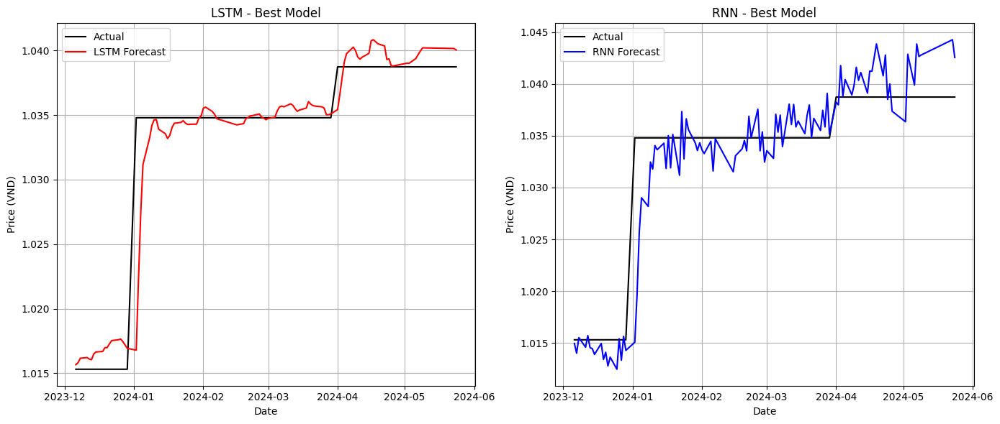

In [ ]:
# tuning DL
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings
warnings.filterwarnings('ignore')

# ===========================================
# 1. Load Data
# ===========================================
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_nkg = df[df['stock_id'] == 'NKG'].sort_values('date').reset_index(drop=True)

# 2. Features
features = ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']

data = df_nkg[features].values

# ===========================================
# 3. Scaling
# ===========================================
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# ===========================================
# 4. Create Sequences
# ===========================================
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length, 0])  # log_close
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# ===========================================
# 5. Train-Validation-Test Split
# ===========================================
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end   = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val,   y_val   = X[train_end:val_end], y[train_end:val_end]
X_test,  y_test  = X[val_end:], y[val_end:]

input_shape = (X_train.shape[1], X_train.shape[2])

print("Train:", X_train.shape, " Val:", X_val.shape, " Test:", X_test.shape)

# ===========================================
# 6. Define Model Builders
# ===========================================
def build_lstm_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(LSTM(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

def build_rnn_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(SimpleRNN(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(SimpleRNN(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# ===========================================
# 7. Hyperparameter Search Space
# ===========================================
param_grid = {
    "num_units": [32, 50, 64],
    "dropout": [0.1, 0.2, 0.3],
    "lr": [0.001, 0.0005],
    "batch_size": [16, 32],
    "epochs": [40, 60]
}

# ===========================================
# 8. Train + Validation Evaluation
# ===========================================
def evaluate_and_inverse(model, X_set, y_set, scaler):
    pred_scaled = model.predict(X_set)

    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0]

    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0]

    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2


def tune_model(build_fn, model_name):
    best_r2 = -999
    best_params = {}
    best_model = None

    print(f"\n===== TUNING {model_name} =====")

    for units in param_grid['num_units']:
        for dr in param_grid['dropout']:
            for lr in param_grid['lr']:
                for bs in param_grid['batch_size']:
                    for ep in param_grid['epochs']:

                        print(f"Testing {model_name}: units={units}, dr={dr}, lr={lr}, bs={bs}, ep={ep}")

                        model = build_fn(units, dr, lr)
                        model.fit(X_train, y_train, batch_size=bs, epochs=ep,
                                  validation_data=(X_val, y_val), verbose=0)

                        _, _, rmse, mae, r2 = evaluate_and_inverse(model, X_val, y_val, scaler)

                        if r2 > best_r2:
                            best_r2 = r2
                            best_params = dict(units=units, dropout=dr, lr=lr, batch=bs, epochs=ep)
                            best_model = model

    print(f"\nBEST {model_name} PARAMS:", best_params)
    print(f"BEST {model_name} R2 on Validation:", best_r2)

    return best_model, best_params, best_r2

# ===========================================
# 9. Run Tuning for LSTM & RNN
# ===========================================
best_lstm, lstm_params, lstm_r2 = tune_model(build_lstm_model, "LSTM")
best_rnn,  rnn_params,  rnn_r2  = tune_model(build_rnn_model, "RNN")

# ===========================================
# 10. Final Evaluation on Validation
# ===========================================
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(best_lstm, X_val, y_val, scaler)
rnn_real,  rnn_pred,  rnn_rmse,  rnn_mae,  rnn_r2  = evaluate_and_inverse(best_rnn, X_val, y_val, scaler)

print("\n=== FINAL VALIDATION RESULTS ===")
print(pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2, 'Params': lstm_params},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2, 'Params': rnn_params}
]))

# ===========================================
# 11. Plotting
# ===========================================
val_dates = df_nkg['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label="Actual", color="black")
plt.plot(val_dates, lstm_pred, label="LSTM Forecast", color="red")
plt.title("LSTM - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label="Actual", color="black")
plt.plot(val_dates, rnn_pred, label="RNN Forecast", color="blue")
plt.title("RNN - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

**POM**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (2, 1, 1) with AIC: -2178.30
Performing rolling forecast on Validation Set...

--- Validation Results (POM) ---
RMSE: 0.1552
MAE: 0.1138
R2 Score: 0.9599


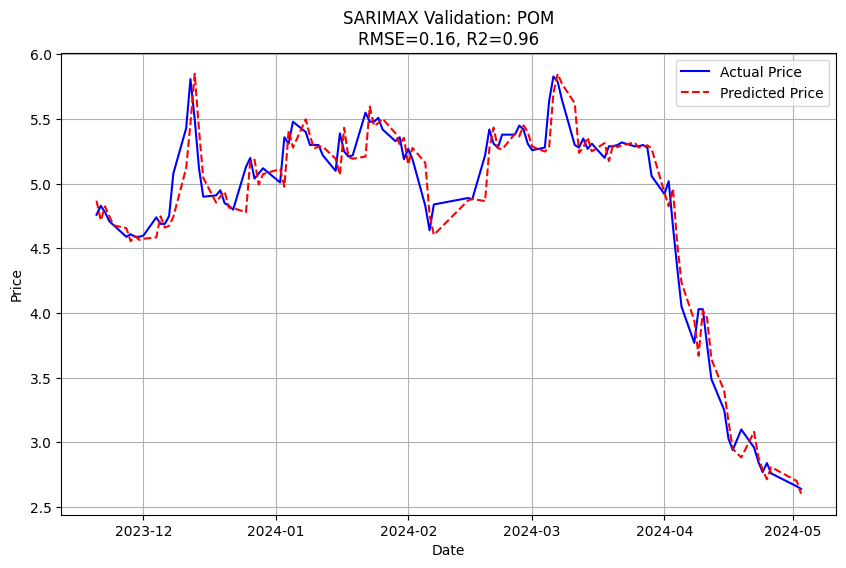

In [ ]:
# sarimax
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='POM'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

run_sarimax_custom()

--- VALIDATION RESULTS (70% Train / 15% Val) ---
               Model      RMSE       MAE  R2 Score
0      Random Forest  0.319851  0.208331  0.840296
1  Gradient Boosting  0.332044  0.209674  0.827888
2                SVR  0.739998  0.566127  0.145169


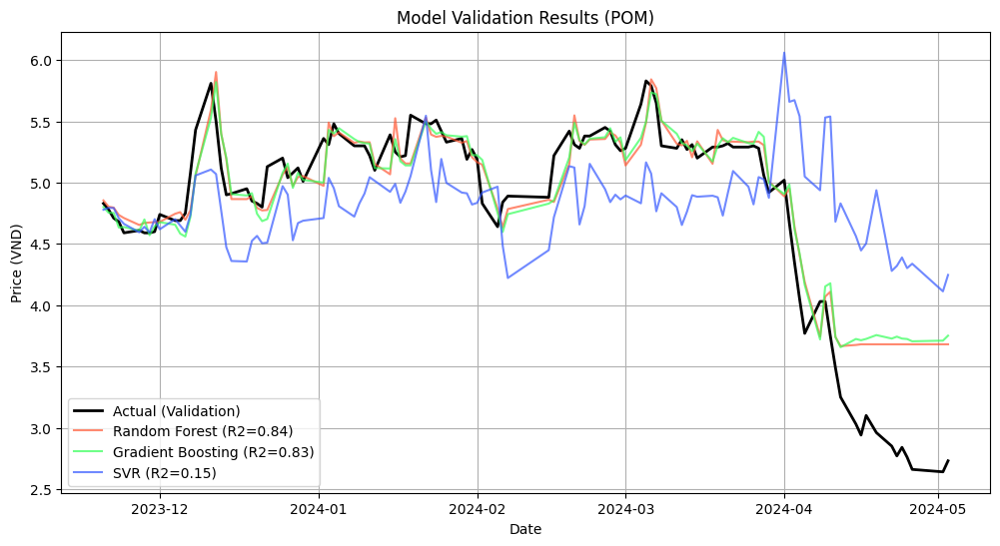

In [ ]:
# ML models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
try:
    df = pd.read_csv('synchronized_data.csv')
except FileNotFoundError:
    print("Error: File not found.")
    exit()

# Preprocessing for POM
data = df[df['stock_id'] == 'POM'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Create features
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])

# Target: Next day's log close
data['target_log'] = np.log(data['close']).shift(-1)

# Lags
lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']

# Clean NaN
data_clean = data.dropna().reset_index(drop=True)

# 2. SPLIT DATA (70% Train, 15% Val, 15% Test)
n = len(data_clean)
train_end = int(n * 0.70)
val_end = int(n * 0.85)

# Train Set
X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

# Validation Set
X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values
val_dates = data_clean.iloc[train_end:val_end]['date']

# Test Set (Reserved)
X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling (Fit on Train, Transform Val/Test)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test) # Not used in this validation step

# 4. Models
results = {}

# Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
pred_rf_log = rf.predict(X_val)
results['Random Forest'] = np.exp(pred_rf_log)

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gb.fit(X_train, y_train)
pred_gb_log = gb.predict(X_val)
results['Gradient Boosting'] = np.exp(pred_gb_log)

# SVR (Uses Scaled Data)
svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.01)
svr.fit(X_train_scaled, y_train)
pred_svr_log = svr.predict(X_val_scaled)
results['SVR'] = np.exp(pred_svr_log)

# 5. Evaluation
y_val_real = np.exp(y_val)
metrics = []

for name, preds in results.items():
    rmse = np.sqrt(mean_squared_error(y_val_real, preds))
    mae = mean_absolute_error(y_val_real, preds)
    r2 = r2_score(y_val_real, preds)
    metrics.append({'Model': name, 'RMSE': rmse, 'MAE': mae, 'R2 Score': r2})

metrics_df = pd.DataFrame(metrics).sort_values('R2 Score', ascending=False)
print("--- VALIDATION RESULTS (70% Train / 15% Val) ---")
print(metrics_df)

# Plot
plt.figure(figsize=(12, 6))
plt.plot(val_dates, y_val_real, label='Actual (Validation)', color='black', linewidth=2)
colors = ['#FF5733', '#33FF57', '#3357FF']
for i, (name, preds) in enumerate(results.items()):
    r2 = metrics_df[metrics_df['Model'] == name]['R2 Score'].values[0]
    plt.plot(val_dates, preds, label=f"{name} (R2={r2:.2f})", color=colors[i], alpha=0.7)

plt.title('Model Validation Results (POM)')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)
plt.show()

All features found.
Train shape: (486, 40, 8)
Val shape:   (104, 40, 8)
Test shape:  (105, 40, 8)
Training LSTM...
Training RNN...
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step

--- VALIDATION RESULTS (Price VND) ---
  Model      RMSE       MAE        R2
0  LSTM  0.409040  0.314400  0.799560
1   RNN  0.433066  0.328627  0.775322


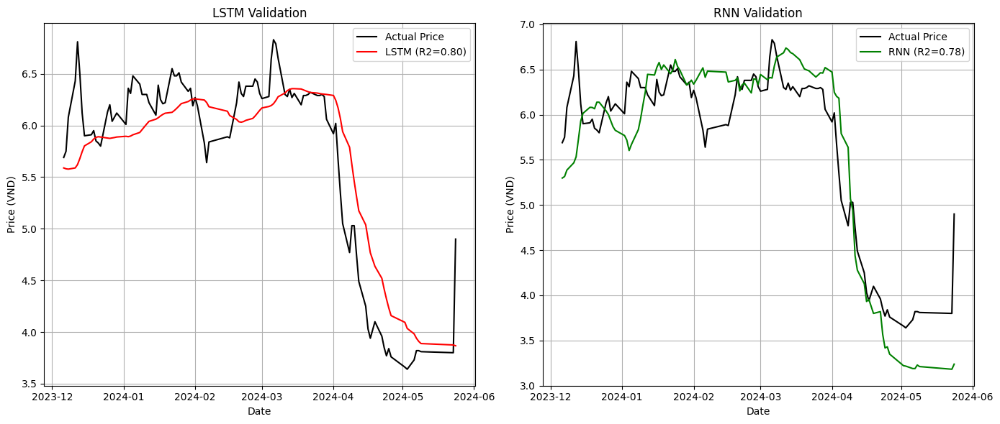

In [ ]:
# DL models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_pom = df[df['stock_id'] == 'POM'].sort_values('date').reset_index(drop=True)

# 2. Feature Setup
# Ensure we include the target (log_close) as the first feature for easier sequence creation
# User listed: 'gdp_growth', 'log_volume', 'log_rebar_price', 'interest', 'exchange_rate'
# We add 'log_close' to the front.
features = ['log_close', 'roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']

''' Phúc said: "Các biến vĩ mô với chỉ số tài chính không có tính chất theo chuỗi thời gian mà được fill forward
                nên là khi bỏ các biến này và chỉ chạy các biến mang tính chất time-series thì độ giải thích sẽ cao hơn (ko quá đáng kể)"
                '''
# còn bữa chạy ra độ ý nghĩa cao là do quên bỏ log_close vô feature... ae thông cảm :v
# features = ['log_close', 'volume', 'log_volume']

# Check if columns exist
missing_cols = [c for c in features if c not in df_pom.columns]
if missing_cols:
    print(f"Missing columns: {missing_cols}")
    # Fallback or create if possible? log_close is likely there.
    # df_hpg['log_close'] should be there from previous steps or original file.
    # Original file has 'log_close'.
else:
    print("All features found.")

data = df_pom[features].values

# 3. Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# 4. Create Sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        # Target is the NEXT value of the first column (log_close)
        # So at index i, sequence is i to i+seq_length-1. Target is at i+seq_length.
        y.append(data[i+seq_length, 0])
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# 5. Split Data (70% Train, 15% Val, 15% Test)
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val, y_val = X[train_end:val_end], y[train_end:val_end]
X_test, y_test = X[val_end:], y[val_end:]

print(f"Train shape: {X_train.shape}")
print(f"Val shape:   {X_val.shape}")
print(f"Test shape:  {X_test.shape}")

# 6. Model Building
input_shape = (X_train.shape[1], X_train.shape[2])

def build_lstm(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

def build_rnn(input_shape):
    model = Sequential()
    model.add(SimpleRNN(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(SimpleRNN(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# 7. Training
print("Training LSTM...")
lstm = build_lstm(input_shape)
# Use X_val for validation_data
lstm.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

print("Training RNN...")
rnn = build_rnn(input_shape)
rnn.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

# 8. Evaluation Helper
def evaluate_and_inverse(model, X_set, y_set, scaler):
    # Predict (scaled)
    pred_scaled = model.predict(X_set) # (N, 1)

    # Prepare dummy matrix for inverse transform
    # We need to fill other features with 0 (or anything) since scaler expects (N, n_features)
    # y_set is (N,)

    # Inverse Target (y_set)
    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0] # This is log_close

    # Inverse Prediction
    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0] # This is log_close

    # Convert to Price (exp)
    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    # Metrics
    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2

# Evaluate on Validation Set
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(lstm, X_val, y_val, scaler)
rnn_real, rnn_pred, rnn_rmse, rnn_mae, rnn_r2 = evaluate_and_inverse(rnn, X_val, y_val, scaler)

# 9. Results
results_df = pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2}
])

print("\n--- VALIDATION RESULTS (Price VND) ---")
print(results_df)

# 10. Plotting
val_dates = df_pom['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

# LSTM Plot
plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label='Actual Price', color='black')
plt.plot(val_dates, lstm_pred, label=f'LSTM (R2={lstm_r2:.2f})', color='red')
plt.title('LSTM Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

# RNN Plot
plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label='Actual Price', color='black')
plt.plot(val_dates, rnn_pred, label=f'RNN (R2={rnn_r2:.2f})', color='green')
plt.title('RNN Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest: R2 (VAL) = 0.8120 | Best Params: {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 5}
Gradient Boosting: R2 (VAL) = 0.8384 | Best Params: {'subsample': 0.8, 'n_estimators': 200, 'min_samples_split': 5, 'max_depth': 7, 'learning_rate': 0.1}
SVR: R2 (VAL) = 0.9508 | Best Params: {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}


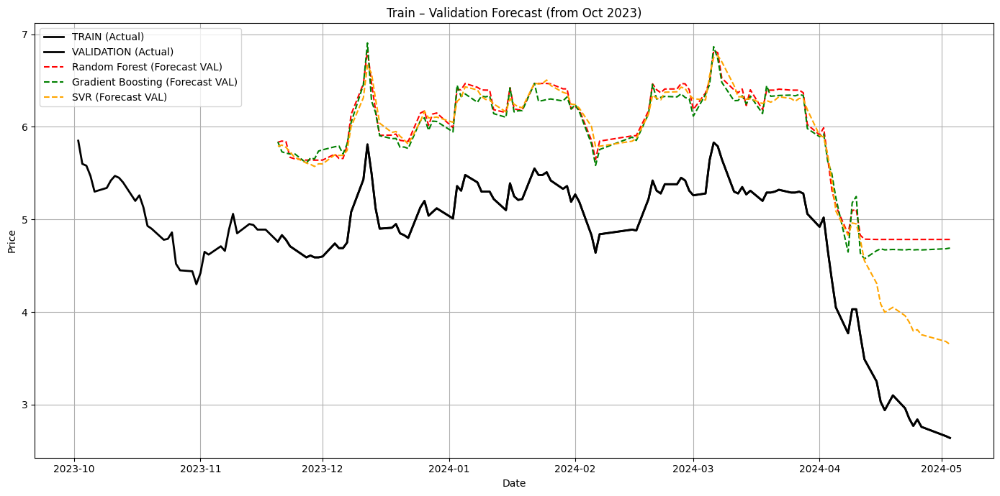

In [ ]:
# tuning ML
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# 1. Load & Preprocess Data
df = pd.read_csv('synchronized_data.csv')
data = df[df['stock_id'] == 'POM'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

'''# Features & Target
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])
data['target_log'] = np.log(data['close']).shift(-1)'''

# Dùng log1p để tránh log(0) -> -inf
data['log_close'] = np.log1p(data['close'])
data['log_volume'] = np.log1p(data['volume'])
data['target_log'] = np.log1p(data['close']).shift(-1)

lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']

# Loại bỏ inf nếu có (phòng trường hợp dữ liệu đặc trưng khác sinh ra inf)
data.replace([np.inf, -np.inf], np.nan, inplace=True)

data_clean = data.dropna().reset_index(drop=True)

# 2. Split Data into Train / Val / Test
n = len(data_clean)
train_end = int(n * 0.70)          # 70% train
val_end = int(n * 0.85)            # 15% val, 15% test

X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values

X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# 4. Hyperparameter Tuning using only TRAIN (TimeSeriesSplit)
tscv = TimeSeriesSplit(n_splits=3)

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

gb_params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

svr_params = {
    'C': [0.1, 1, 10, 100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'epsilon': [0.001, 0.01, 0.1],
    'kernel': ['rbf']
}

models = [
    ('Random Forest', RandomForestRegressor(random_state=42, n_jobs=-1), rf_params),
    ('Gradient Boosting', GradientBoostingRegressor(random_state=42), gb_params),
    ('SVR', SVR(), svr_params)
]

print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    r2_val = r2_score(np.exp(y_val), np.exp(pred_val_log))

    print(f"{name}: R2 (VAL) = {r2_val:.4f} | Best Params: {search.best_params_}")

# --------------------------
#  TRỰC QUAN HÓA TRAIN – VAL
# --------------------------

plot_df = data_clean[['date', 'close']].copy()
predictions_val = {}

for name, model, params in models:
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    pred_val = np.exp(pred_val_log)

    predictions_val[name] = pred_val


# Biểu đồ 2: Chỉ từ 10/2023
start_date = pd.Timestamp("2023-10-01")
mask = plot_df['date'] >= start_date

# ---------------------------------------
# TÙY CHỈNH MÀU CHO TỪNG ĐƯỜNG
# ---------------------------------------
color_map = {
    'TRAIN': 'black',
    'VAL': 'black',
    'Random Forest': 'red',
    'Gradient Boosting': 'green',
    'SVR': 'orange'
}
# ---------------------------------------

plt.figure(figsize=(14, 7))

# TRAIN (Actual)
plt.plot(
    plot_df['date'][:val_end][mask[:val_end]],
    plot_df['close'][:val_end][mask[:val_end]],
    label='TRAIN (Actual)',
    linewidth=2,
    color=color_map['TRAIN']
)

# VALIDATION (Actual)
plt.plot(
    plot_df['date'][train_end:val_end][mask[train_end:val_end]],
    plot_df['close'][train_end:val_end][mask[train_end:val_end]],
    label='VALIDATION (Actual)',
    linewidth=2,
    color=color_map['VAL']
)

# FORECASTS for each model
for name, pred_val in predictions_val.items():
    plt.plot(
        plot_df['date'][train_end:val_end][mask[train_end:val_end]],
        pred_val[mask[train_end:val_end]],
        linestyle='--',
        label=f'{name} (Forecast VAL)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Train – Validation Forecast (from Oct 2023)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    # Dự báo log
    pred_val_log = best_model.predict(X_val_scaled)

    # Chuyển về giá trị thực
    pred_val = np.exp(pred_val_log)
    y_val_real = np.exp(y_val)

    # Tính RMSE, MAE, R2
    rmse_val = np.sqrt(mean_squared_error(y_val_real, pred_val))
    mae_val = mean_absolute_error(y_val_real, pred_val)
    r2_val = r2_score(y_val_real, pred_val)

    # In kết quả
    print(f"{name}:")
    print(f"   RMSE (VAL) = {rmse_val:.4f}")
    print(f"   MAE  (VAL) = {mae_val:.4f}")
    print(f"   R2   (VAL) = {r2_val:.4f}")
    print(f"   Best Params = {search.best_params_}")
    print("-" * 60)

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest:
   RMSE (VAL) = 0.3470
   MAE  (VAL) = 0.2207
   R2   (VAL) = 0.8120
   Best Params = {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 5}
------------------------------------------------------------
Gradient Boosting:
   RMSE (VAL) = 0.3217
   MAE  (VAL) = 0.2095
   R2   (VAL) = 0.8384
   Best Params = {'subsample': 0.8, 'n_estimators': 200, 'min_samples_split': 5, 'max_depth': 7, 'learning_rate': 0.1}
------------------------------------------------------------
SVR:
   RMSE (VAL) = 0.1776
   MAE  (VAL) = 0.1255
   R2   (VAL) = 0.9508
   Best Params = {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}
------------------------------------------------------------


Train: (486, 40, 8)  Val: (104, 40, 8)  Test: (105, 40, 8)

===== TUNING LSTM =====
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=40


1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 356ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 172ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step
Testing LSTM: uni

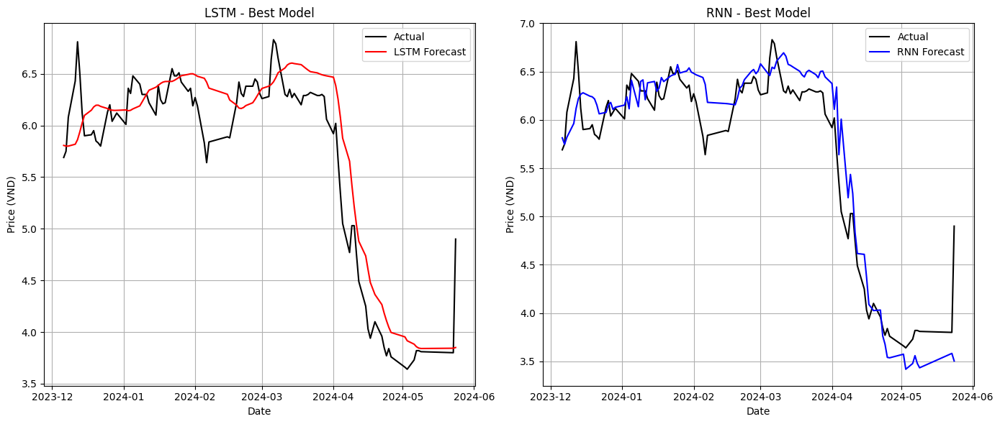

In [ ]:
# tuning DL
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings
warnings.filterwarnings('ignore')

# ===========================================
# 1. Load Data
# ===========================================
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_pom = df[df['stock_id'] == 'POM'].sort_values('date').reset_index(drop=True)

# 2. Features
features = ['log_close', 'roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']

data = df_pom[features].values

# ===========================================
# 3. Scaling
# ===========================================
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# ===========================================
# 4. Create Sequences
# ===========================================
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length, 0])  # log_close
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# ===========================================
# 5. Train-Validation-Test Split
# ===========================================
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end   = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val,   y_val   = X[train_end:val_end], y[train_end:val_end]
X_test,  y_test  = X[val_end:], y[val_end:]

input_shape = (X_train.shape[1], X_train.shape[2])

print("Train:", X_train.shape, " Val:", X_val.shape, " Test:", X_test.shape)

# ===========================================
# 6. Define Model Builders
# ===========================================
def build_lstm_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(LSTM(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

def build_rnn_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(SimpleRNN(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(SimpleRNN(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# ===========================================
# 7. Hyperparameter Search Space
# ===========================================
param_grid = {
    "num_units": [32, 50, 64],
    "dropout": [0.1, 0.2, 0.3],
    "lr": [0.001, 0.0005],
    "batch_size": [16, 32],
    "epochs": [40, 60]
}

# ===========================================
# 8. Train + Validation Evaluation
# ===========================================
def evaluate_and_inverse(model, X_set, y_set, scaler):
    pred_scaled = model.predict(X_set)

    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0]

    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0]

    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2


def tune_model(build_fn, model_name):
    best_r2 = -999
    best_params = {}
    best_model = None

    print(f"\n===== TUNING {model_name} =====")

    for units in param_grid['num_units']:
        for dr in param_grid['dropout']:
            for lr in param_grid['lr']:
                for bs in param_grid['batch_size']:
                    for ep in param_grid['epochs']:

                        print(f"Testing {model_name}: units={units}, dr={dr}, lr={lr}, bs={bs}, ep={ep}")

                        model = build_fn(units, dr, lr)
                        model.fit(X_train, y_train, batch_size=bs, epochs=ep,
                                  validation_data=(X_val, y_val), verbose=0)

                        _, _, rmse, mae, r2 = evaluate_and_inverse(model, X_val, y_val, scaler)

                        if r2 > best_r2:
                            best_r2 = r2
                            best_params = dict(units=units, dropout=dr, lr=lr, batch=bs, epochs=ep)
                            best_model = model

    print(f"\nBEST {model_name} PARAMS:", best_params)
    print(f"BEST {model_name} R2 on Validation:", best_r2)

    return best_model, best_params, best_r2

# ===========================================
# 9. Run Tuning for LSTM & RNN
# ===========================================
best_lstm, lstm_params, lstm_r2 = tune_model(build_lstm_model, "LSTM")
best_rnn,  rnn_params,  rnn_r2  = tune_model(build_rnn_model, "RNN")

# ===========================================
# 10. Final Evaluation on Validation
# ===========================================
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(best_lstm, X_val, y_val, scaler)
rnn_real,  rnn_pred,  rnn_rmse,  rnn_mae,  rnn_r2  = evaluate_and_inverse(best_rnn, X_val, y_val, scaler)

print("\n=== FINAL VALIDATION RESULTS ===")
print(pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2, 'Params': lstm_params},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2, 'Params': rnn_params}
]))

# ===========================================
# 11. Plotting
# ===========================================
val_dates = df_pom['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label="Actual", color="black")
plt.plot(val_dates, lstm_pred, label="LSTM Forecast", color="red")
plt.title("LSTM - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label="Actual", color="black")
plt.plot(val_dates, rnn_pred, label="RNN Forecast", color="blue")
plt.title("RNN - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

**TVH**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (0, 1, 1) with AIC: -2079.49
Performing rolling forecast on Validation Set...

--- Validation Results (TVN) ---
RMSE: 0.0974
MAE: 0.0748
R2 Score: 0.7863


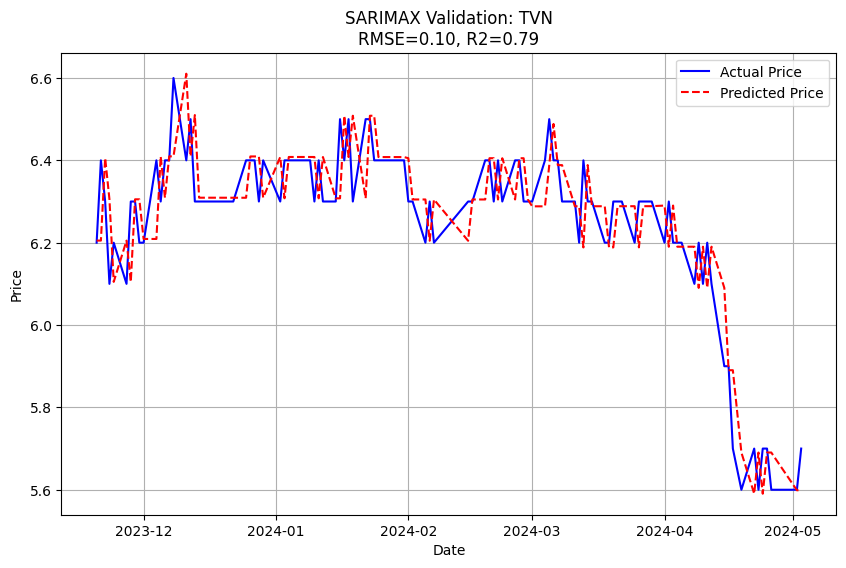

In [ ]:
# sarimax
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='TVN'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['exchange_rate', 'roa', 'roe', 'interest', 'export', 'iron_powder_price', 'log_rebar_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

run_sarimax_custom()

--- VALIDATION RESULTS (70% Train / 15% Val) ---
               Model      RMSE       MAE  R2 Score
0      Random Forest  0.122955  0.100680  0.679803
1  Gradient Boosting  0.148034  0.114982  0.535858
2                SVR  0.249430  0.193417 -0.317734


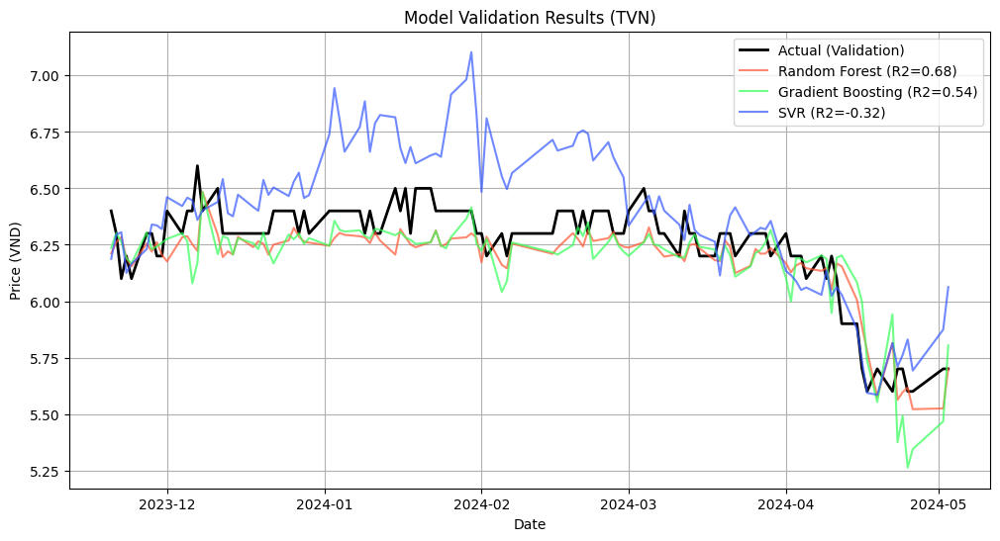

In [ ]:
# ML models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
try:
    df = pd.read_csv('synchronized_data.csv')
except FileNotFoundError:
    print("Error: File not found.")
    exit()

# Preprocessing for TVN
data = df[df['stock_id'] == 'TVN'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Create features
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])

# Target: Next day's log close
data['target_log'] = np.log(data['close']).shift(-1)

# Lags
lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['exchange_rate', 'roa', 'roe', 'interest', 'export', 'iron_powder_price', 'log_rebar_price']

# Clean NaN
data_clean = data.dropna().reset_index(drop=True)

# 2. SPLIT DATA (70% Train, 15% Val, 15% Test)
n = len(data_clean)
train_end = int(n * 0.70)
val_end = int(n * 0.85)

# Train Set
X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

# Validation Set
X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values
val_dates = data_clean.iloc[train_end:val_end]['date']

# Test Set (Reserved)
X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling (Fit on Train, Transform Val/Test)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test) # Not used in this validation step

# 4. Models
results = {}

# Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
pred_rf_log = rf.predict(X_val)
results['Random Forest'] = np.exp(pred_rf_log)

# Gradient Boosting
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gb.fit(X_train, y_train)
pred_gb_log = gb.predict(X_val)
results['Gradient Boosting'] = np.exp(pred_gb_log)

# SVR (Uses Scaled Data)
svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.01)
svr.fit(X_train_scaled, y_train)
pred_svr_log = svr.predict(X_val_scaled)
results['SVR'] = np.exp(pred_svr_log)

# 5. Evaluation
y_val_real = np.exp(y_val)
metrics = []

for name, preds in results.items():
    rmse = np.sqrt(mean_squared_error(y_val_real, preds))
    mae = mean_absolute_error(y_val_real, preds)
    r2 = r2_score(y_val_real, preds)
    metrics.append({'Model': name, 'RMSE': rmse, 'MAE': mae, 'R2 Score': r2})

metrics_df = pd.DataFrame(metrics).sort_values('R2 Score', ascending=False)
print("--- VALIDATION RESULTS (70% Train / 15% Val) ---")
print(metrics_df)

# Plot
plt.figure(figsize=(12, 6))
plt.plot(val_dates, y_val_real, label='Actual (Validation)', color='black', linewidth=2)
colors = ['#FF5733', '#33FF57', '#3357FF']
for i, (name, preds) in enumerate(results.items()):
    r2 = metrics_df[metrics_df['Model'] == name]['R2 Score'].values[0]
    plt.plot(val_dates, preds, label=f"{name} (R2={r2:.2f})", color=colors[i], alpha=0.7)

plt.title('Model Validation Results (TVN)')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)
plt.show()

All features found.
Train shape: (486, 40, 8)
Val shape:   (104, 40, 8)
Test shape:  (105, 40, 8)
Training LSTM...
Training RNN...
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step

--- VALIDATION RESULTS (Price VND) ---
  Model      RMSE       MAE        R2
0  LSTM  0.247625  0.164450 -0.119994
1   RNN  0.473758  0.395343 -3.099594


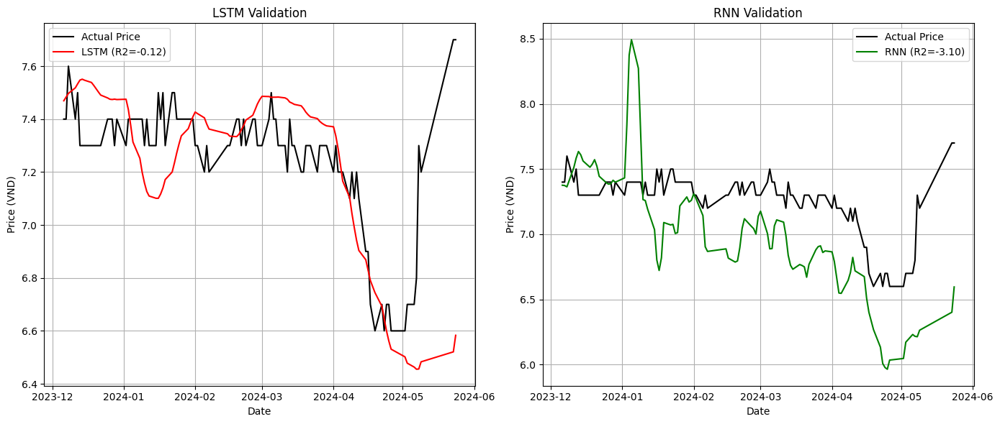

In [ ]:
# DL models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings

warnings.filterwarnings('ignore')

# 1. Load Data
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_tvn = df[df['stock_id'] == 'TVN'].sort_values('date').reset_index(drop=True)

# 2. Feature Setup
# Ensure we include the target (log_close) as the first feature for easier sequence creation
# User listed: 'gdp_growth', 'log_volume', 'log_rebar_price', 'interest', 'exchange_rate'
# We add 'log_close' to the front.
features = ['log_close', 'exchange_rate', 'roa', 'roe', 'interest', 'export', 'iron_powder_price', 'log_rebar_price']

''' Phúc said: "Các biến vĩ mô với chỉ số tài chính không có tính chất theo chuỗi thời gian mà được fill forward
                nên là khi bỏ các biến này và chỉ chạy các biến mang tính chất time-series thì độ giải thích sẽ cao hơn (ko quá đáng kể)"
                '''
# còn bữa chạy ra độ ý nghĩa cao là do quên bỏ log_close vô feature... ae thông cảm :v
# features = ['log_close', 'volume', 'log_volume']

# Check if columns exist
missing_cols = [c for c in features if c not in df_tvn.columns]
if missing_cols:
    print(f"Missing columns: {missing_cols}")
    # Fallback or create if possible? log_close is likely there.
    # df_hpg['log_close'] should be there from previous steps or original file.
    # Original file has 'log_close'.
else:
    print("All features found.")

data = df_tvn[features].values

# 3. Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# 4. Create Sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        # Target is the NEXT value of the first column (log_close)
        # So at index i, sequence is i to i+seq_length-1. Target is at i+seq_length.
        y.append(data[i+seq_length, 0])
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# 5. Split Data (70% Train, 15% Val, 15% Test)
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val, y_val = X[train_end:val_end], y[train_end:val_end]
X_test, y_test = X[val_end:], y[val_end:]

print(f"Train shape: {X_train.shape}")
print(f"Val shape:   {X_val.shape}")
print(f"Test shape:  {X_test.shape}")

# 6. Model Building
input_shape = (X_train.shape[1], X_train.shape[2])

def build_lstm(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

def build_rnn(input_shape):
    model = Sequential()
    model.add(SimpleRNN(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(SimpleRNN(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# 7. Training
print("Training LSTM...")
lstm = build_lstm(input_shape)
# Use X_val for validation_data
lstm.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

print("Training RNN...")
rnn = build_rnn(input_shape)
rnn.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_val, y_val), verbose=0)

# 8. Evaluation Helper
def evaluate_and_inverse(model, X_set, y_set, scaler):
    # Predict (scaled)
    pred_scaled = model.predict(X_set) # (N, 1)

    # Prepare dummy matrix for inverse transform
    # We need to fill other features with 0 (or anything) since scaler expects (N, n_features)
    # y_set is (N,)

    # Inverse Target (y_set)
    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0] # This is log_close

    # Inverse Prediction
    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0] # This is log_close

    # Convert to Price (exp)
    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    # Metrics
    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2

# Evaluate on Validation Set
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(lstm, X_val, y_val, scaler)
rnn_real, rnn_pred, rnn_rmse, rnn_mae, rnn_r2 = evaluate_and_inverse(rnn, X_val, y_val, scaler)

# 9. Results
results_df = pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2}
])

print("\n--- VALIDATION RESULTS (Price VND) ---")
print(results_df)

# 10. Plotting
val_dates = df_tvn['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

# LSTM Plot
plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label='Actual Price', color='black')
plt.plot(val_dates, lstm_pred, label=f'LSTM (R2={lstm_r2:.2f})', color='red')
plt.title('LSTM Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

# RNN Plot
plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label='Actual Price', color='black')
plt.plot(val_dates, rnn_pred, label=f'RNN (R2={rnn_r2:.2f})', color='green')
plt.title('RNN Validation')
plt.xlabel('Date')
plt.ylabel('Price (VND)')
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest: R2 (VAL) = 0.6798 | Best Params: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10}
Gradient Boosting: R2 (VAL) = 0.5816 | Best Params: {'subsample': 0.8, 'n_estimators': 200, 'min_samples_split': 5, 'max_depth': 7, 'learning_rate': 0.1}
SVR: R2 (VAL) = 0.8157 | Best Params: {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}


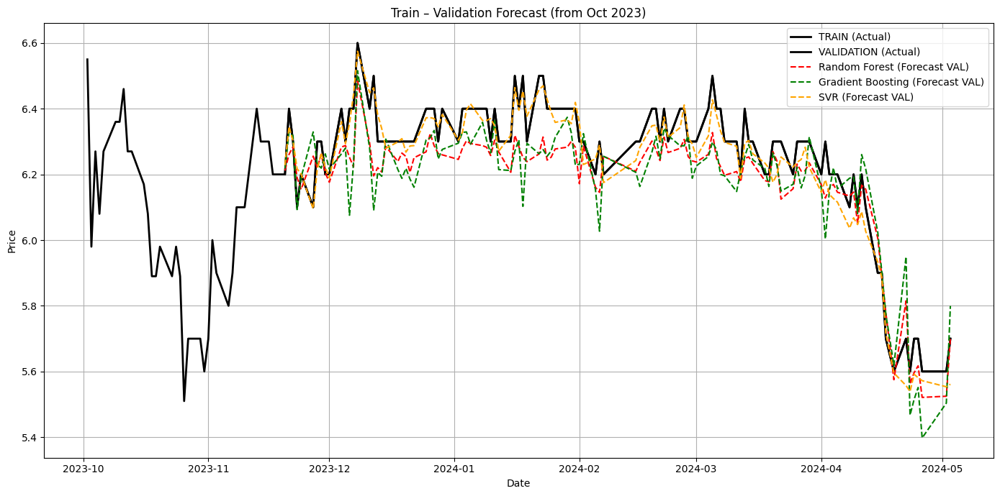

In [ ]:
# tuning ML
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# 1. Load & Preprocess Data
df = pd.read_csv('synchronized_data.csv')
data = df[df['stock_id'] == 'TVN'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Features & Target
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])
data['target_log'] = np.log(data['close']).shift(-1)

lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['exchange_rate', 'roa', 'roe', 'interest', 'export', 'iron_powder_price', 'log_rebar_price']

data_clean = data.dropna().reset_index(drop=True)

# 2. Split Data into Train / Val / Test
n = len(data_clean)
train_end = int(n * 0.70)          # 70% train
val_end = int(n * 0.85)            # 15% val, 15% test

X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values

X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# 4. Hyperparameter Tuning using only TRAIN (TimeSeriesSplit)
tscv = TimeSeriesSplit(n_splits=3)

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

gb_params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

svr_params = {
    'C': [0.1, 1, 10, 100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'epsilon': [0.001, 0.01, 0.1],
    'kernel': ['rbf']
}

models = [
    ('Random Forest', RandomForestRegressor(random_state=42, n_jobs=-1), rf_params),
    ('Gradient Boosting', GradientBoostingRegressor(random_state=42), gb_params),
    ('SVR', SVR(), svr_params)
]

print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    r2_val = r2_score(np.exp(y_val), np.exp(pred_val_log))

    print(f"{name}: R2 (VAL) = {r2_val:.4f} | Best Params: {search.best_params_}")

# --------------------------
#  TRỰC QUAN HÓA TRAIN – VAL
# --------------------------

plot_df = data_clean[['date', 'close']].copy()
predictions_val = {}

for name, model, params in models:
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    pred_val = np.exp(pred_val_log)

    predictions_val[name] = pred_val


# Biểu đồ 2: Chỉ từ 10/2023
start_date = pd.Timestamp("2023-10-01")
mask = plot_df['date'] >= start_date

# ---------------------------------------
# TÙY CHỈNH MÀU CHO TỪNG ĐƯỜNG
# ---------------------------------------
color_map = {
    'TRAIN': 'black',
    'VAL': 'black',
    'Random Forest': 'red',
    'Gradient Boosting': 'green',
    'SVR': 'orange'
}
# ---------------------------------------

plt.figure(figsize=(14, 7))

# TRAIN (Actual)
plt.plot(
    plot_df['date'][:val_end][mask[:val_end]],
    plot_df['close'][:val_end][mask[:val_end]],
    label='TRAIN (Actual)',
    linewidth=2,
    color=color_map['TRAIN']
)

# VALIDATION (Actual)
plt.plot(
    plot_df['date'][train_end:val_end][mask[train_end:val_end]],
    plot_df['close'][train_end:val_end][mask[train_end:val_end]],
    label='VALIDATION (Actual)',
    linewidth=2,
    color=color_map['VAL']
)

# FORECASTS for each model
for name, pred_val in predictions_val.items():
    plt.plot(
        plot_df['date'][train_end:val_end][mask[train_end:val_end]],
        pred_val[mask[train_end:val_end]],
        linestyle='--',
        label=f'{name} (Forecast VAL)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Train – Validation Forecast (from Oct 2023)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    # Dự báo log
    pred_val_log = best_model.predict(X_val_scaled)

    # Chuyển về giá trị thực
    pred_val = np.exp(pred_val_log)
    y_val_real = np.exp(y_val)

    # Tính RMSE, MAE, R2
    rmse_val = np.sqrt(mean_squared_error(y_val_real, pred_val))
    mae_val = mean_absolute_error(y_val_real, pred_val)
    r2_val = r2_score(y_val_real, pred_val)

    # In kết quả
    print(f"{name}:")
    print(f"   RMSE (VAL) = {rmse_val:.4f}")
    print(f"   MAE  (VAL) = {mae_val:.4f}")
    print(f"   R2   (VAL) = {r2_val:.4f}")
    print(f"   Best Params = {search.best_params_}")
    print("-" * 60)

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
Random Forest:
   RMSE (VAL) = 0.1230
   MAE  (VAL) = 0.1007
   R2   (VAL) = 0.6798
   Best Params = {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 10}
------------------------------------------------------------
Gradient Boosting:
   RMSE (VAL) = 0.1405
   MAE  (VAL) = 0.1174
   R2   (VAL) = 0.5816
   Best Params = {'subsample': 0.8, 'n_estimators': 200, 'min_samples_split': 5, 'max_depth': 7, 'learning_rate': 0.1}
------------------------------------------------------------
SVR:
   RMSE (VAL) = 0.0933
   MAE  (VAL) = 0.0750
   R2   (VAL) = 0.8157
   Best Params = {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}
------------------------------------------------------------


Train: (486, 40, 8)  Val: (104, 40, 8)  Test: (105, 40, 8)

===== TUNING LSTM =====
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step
Testing LSTM: units=32, dr=0.1, lr=0.001, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=16, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step
Testing LSTM: units=32, dr=0.1, lr=0.0005, bs=32, ep=60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=40
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step
Testing LSTM: units=32, dr=0.2, lr=0.001, bs=16, ep=60
4/4 ━━━━━━━

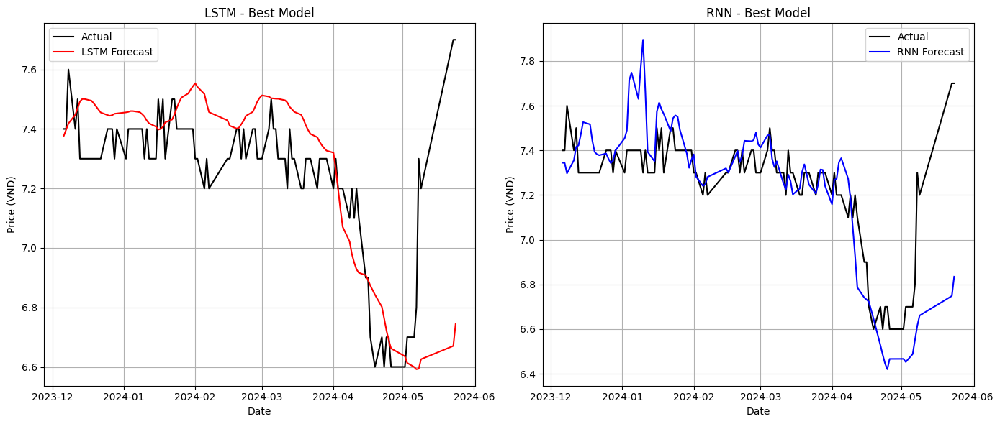

In [ ]:
# tuning DL
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import warnings
warnings.filterwarnings('ignore')

# ===========================================
# 1. Load Data
# ===========================================
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df_tvn = df[df['stock_id'] == 'TVN'].sort_values('date').reset_index(drop=True)

# 2. Features
features = ['log_close', 'exchange_rate', 'roa', 'roe', 'interest', 'export', 'iron_powder_price', 'log_rebar_price']

data = df_tvn[features].values

# ===========================================
# 3. Scaling
# ===========================================
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# ===========================================
# 4. Create Sequences
# ===========================================
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length, 0])  # log_close
    return np.array(X), np.array(y)

SEQ_LENGTH = 40
X, y = create_sequences(scaled_data, SEQ_LENGTH)

# ===========================================
# 5. Train-Validation-Test Split
# ===========================================
n_samples = len(X)
train_end = int(n_samples * 0.70)
val_end   = int(n_samples * 0.85)

X_train, y_train = X[:train_end], y[:train_end]
X_val,   y_val   = X[train_end:val_end], y[train_end:val_end]
X_test,  y_test  = X[val_end:], y[val_end:]

input_shape = (X_train.shape[1], X_train.shape[2])

print("Train:", X_train.shape, " Val:", X_val.shape, " Test:", X_test.shape)

# ===========================================
# 6. Define Model Builders
# ===========================================
def build_lstm_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(LSTM(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

def build_rnn_model(num_units, dropout_rate, lr):
    model = Sequential()
    model.add(SimpleRNN(num_units, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(dropout_rate))
    model.add(SimpleRNN(num_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=lr), loss='mean_squared_error')
    return model

# ===========================================
# 7. Hyperparameter Search Space
# ===========================================
param_grid = {
    "num_units": [32, 50, 64],
    "dropout": [0.1, 0.2, 0.3],
    "lr": [0.001, 0.0005],
    "batch_size": [16, 32],
    "epochs": [40, 60]
}

# ===========================================
# 8. Train + Validation Evaluation
# ===========================================
def evaluate_and_inverse(model, X_set, y_set, scaler):
    pred_scaled = model.predict(X_set)

    dummy_y = np.zeros((len(y_set), scaled_data.shape[1]))
    dummy_y[:, 0] = y_set
    inv_y = scaler.inverse_transform(dummy_y)[:, 0]

    dummy_pred = np.zeros((len(pred_scaled), scaled_data.shape[1]))
    dummy_pred[:, 0] = pred_scaled.flatten()
    inv_pred = scaler.inverse_transform(dummy_pred)[:, 0]

    real_price = np.exp(inv_y)
    pred_price = np.exp(inv_pred)

    rmse = np.sqrt(mean_squared_error(real_price, pred_price))
    mae = mean_absolute_error(real_price, pred_price)
    r2 = r2_score(real_price, pred_price)

    return real_price, pred_price, rmse, mae, r2


def tune_model(build_fn, model_name):
    best_r2 = -999
    best_params = {}
    best_model = None

    print(f"\n===== TUNING {model_name} =====")

    for units in param_grid['num_units']:
        for dr in param_grid['dropout']:
            for lr in param_grid['lr']:
                for bs in param_grid['batch_size']:
                    for ep in param_grid['epochs']:

                        print(f"Testing {model_name}: units={units}, dr={dr}, lr={lr}, bs={bs}, ep={ep}")

                        model = build_fn(units, dr, lr)
                        model.fit(X_train, y_train, batch_size=bs, epochs=ep,
                                  validation_data=(X_val, y_val), verbose=0)

                        _, _, rmse, mae, r2 = evaluate_and_inverse(model, X_val, y_val, scaler)

                        if r2 > best_r2:
                            best_r2 = r2
                            best_params = dict(units=units, dropout=dr, lr=lr, batch=bs, epochs=ep)
                            best_model = model

    print(f"\nBEST {model_name} PARAMS:", best_params)
    print(f"BEST {model_name} R2 on Validation:", best_r2)

    return best_model, best_params, best_r2

# ===========================================
# 9. Run Tuning for LSTM & RNN
# ===========================================
best_lstm, lstm_params, lstm_r2 = tune_model(build_lstm_model, "LSTM")
best_rnn,  rnn_params,  rnn_r2  = tune_model(build_rnn_model, "RNN")

# ===========================================
# 10. Final Evaluation on Validation
# ===========================================
lstm_real, lstm_pred, lstm_rmse, lstm_mae, lstm_r2 = evaluate_and_inverse(best_lstm, X_val, y_val, scaler)
rnn_real,  rnn_pred,  rnn_rmse,  rnn_mae,  rnn_r2  = evaluate_and_inverse(best_rnn, X_val, y_val, scaler)

print("\n=== FINAL VALIDATION RESULTS ===")
print(pd.DataFrame([
    {'Model': 'LSTM', 'RMSE': lstm_rmse, 'MAE': lstm_mae, 'R2': lstm_r2, 'Params': lstm_params},
    {'Model': 'RNN',  'RMSE': rnn_rmse,  'MAE': rnn_mae,  'R2': rnn_r2, 'Params': rnn_params}
]))

# ===========================================
# 11. Plotting
# ===========================================
val_dates = df_tvn['date'].iloc[SEQ_LENGTH + train_end : SEQ_LENGTH + val_end].values

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(val_dates, lstm_real, label="Actual", color="black")
plt.plot(val_dates, lstm_pred, label="LSTM Forecast", color="red")
plt.title("LSTM - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_dates, rnn_real, label="Actual", color="black")
plt.plot(val_dates, rnn_pred, label="RNN Forecast", color="blue")
plt.title("RNN - Best Model")
plt.xlabel("Date")
plt.ylabel("Price (VND)")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

**Model testing & evaluation**

**HPG**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (0, 1, 1) with AIC: -2288.75
Performing rolling forecast on Validation Set...

--- Validation Results (HPG) ---
RMSE: 0.3051
MAE: 0.2278
R2 Score: 0.9072


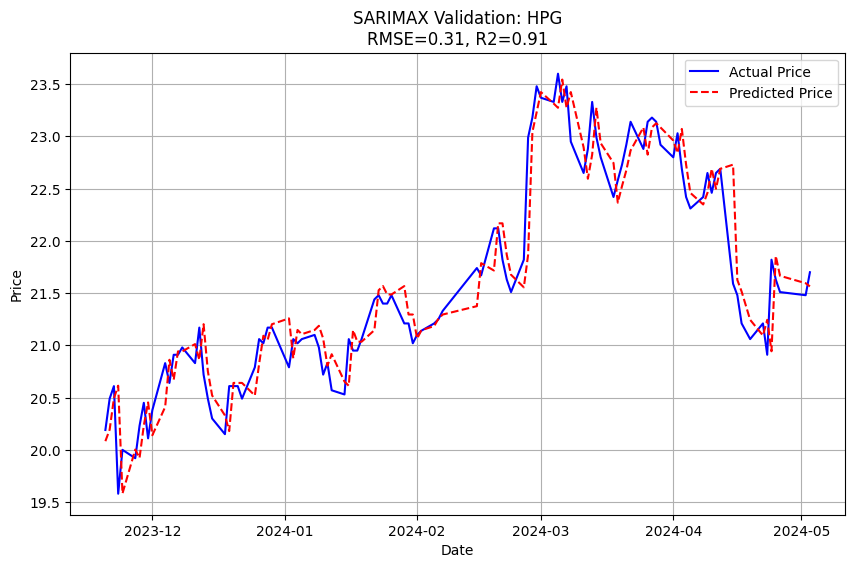


Performing Test Set Prediction...

--- TEST RESULTS (HPG) ---
RMSE: 0.6533
MAE: 0.4142
R2 Score: 0.8765


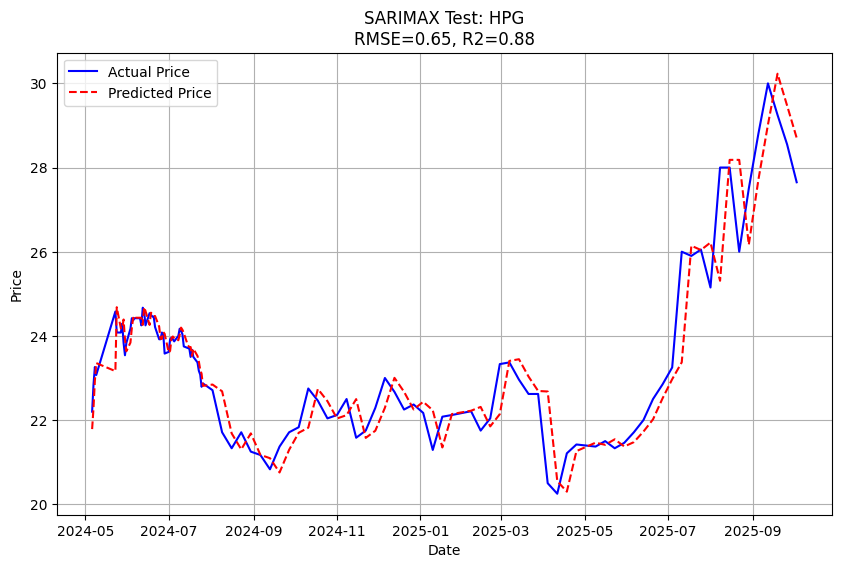


Forecasting 5 future steps...


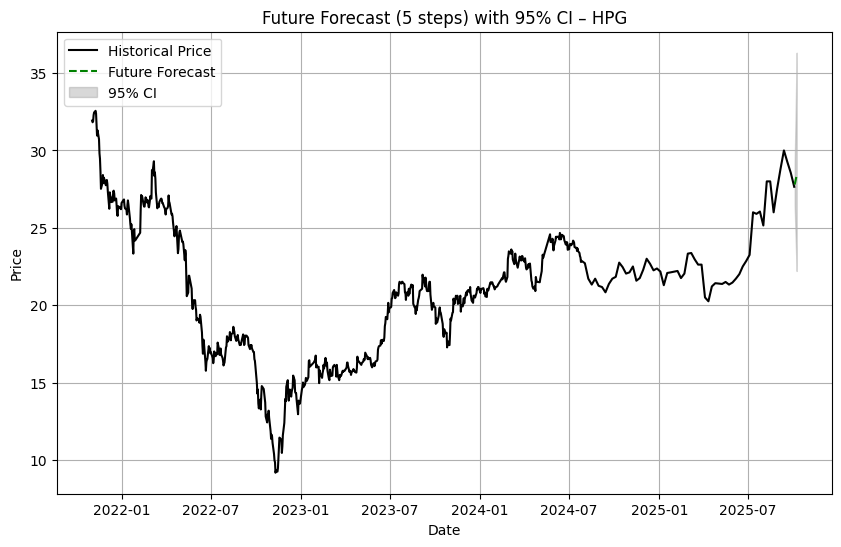


Future price forecast (first 10 rows):
        date  forecast_price   lower_95   upper_95
0 2025-10-04       27.798325  26.464554  29.199316
1 2025-10-05       27.947446  25.329933  30.835445
2 2025-10-06       28.097367  24.243956  32.563251
3 2025-10-07       28.248092  23.204538  34.387872
4 2025-10-08       28.399626  22.209684  36.314732


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='HPG'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['de', 'gdp_growth', 'interest', 'roa', 'roe', 'log_rebar_price', 'log_iron_powder_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()


    # ============================
    # 9. TEST SET PREDICTION
    # ============================

    print("\nPerforming Test Set Prediction...")

    # Build full data (train + val + test)
    full_exog_2 = pd.concat([X_train_scaled, X_val_scaled, X_test_scaled])
    full_endog_2 = pd.concat([y_train, y_val, y_test])

    # Re-setup model for (train+val+test) and apply trained params
    model_test = SARIMAX(full_endog_2, exog=full_exog_2, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_test = model_test.filter(res_fitted.params)

    # Test index range
    test_start = len(y_train) + len(y_val)
    test_end_idx = len(full_endog_2) - 1

    pred_test_res = res_test.get_prediction(start=test_start, end=test_end_idx, exog=X_test_scaled)
    pred_test_diff = pred_test_res.predicted_mean

    # ========== Reconstruct Price on TEST ==========
    # diff_log_close(t) = logP(t) - logP(t-1)
    # → logP_pred(t) = logP_actual(t-1) + diff_pred(t)

    prev_log_close_test = df_clean.iloc[val_end-1 : ].iloc[:-1]['log_close'].values

    pred_log_close_test = prev_log_close_test + pred_test_diff.values
    pred_price_test = np.exp(pred_log_close_test)

    # Actual prices
    actual_price_test = df_clean.iloc[val_end : ]['close'].values
    actual_dates_test = df_clean.iloc[val_end : ]['date'].values

    # Evaluation
    rmse_test = np.sqrt(mean_squared_error(actual_price_test, pred_price_test))
    mae_test = mean_absolute_error(actual_price_test, pred_price_test)
    r2_test = r2_score(actual_price_test, pred_price_test)

    print(f"\n--- TEST RESULTS ({stock_id}) ---")
    print(f"RMSE: {rmse_test:.4f}")
    print(f"MAE: {mae_test:.4f}")
    print(f"R2 Score: {r2_test:.4f}")

    # Plot Test
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates_test, actual_price_test, label='Actual Price', color='blue')
    plt.plot(actual_dates_test, pred_price_test, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Test: {stock_id}\nRMSE={rmse_test:.2f}, R2={r2_test:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()


    # ================================
    # 10. FUTURE FORECAST + CI
    # ================================
    future_steps = 5  # có thể thay đổi

    print(f"\nForecasting {future_steps} future steps...")

    # Ta dùng toàn bộ dữ liệu train + val + test đã lọc bằng params
    model_future = SARIMAX(full_endog_2, exog=full_exog_2,
                           order=best_order,
                           enforce_stationarity=False,
                           enforce_invertibility=False)

    res_future = model_future.filter(res_fitted.params)

    # Future exog
    # ---------
    # Bạn có 2 lựa chọn:
    # 1. Nếu exog không có forecast → dùng giá trị cuối cùng lặp lại
    # 2. Nếu bạn có model cho exog → cung cấp dự báo vào biến future_exog
    #
    # Ở đây ta dùng cách 1.
    last_exog_row = X_test_scaled.iloc[-1].values.reshape(1, -1)
    future_exog = np.repeat(last_exog_row, future_steps, axis=0)

    # Prediction
    future_pred_res = res_future.get_forecast(steps=future_steps, exog=future_exog)

    # Mean diff forecast
    future_diff = future_pred_res.predicted_mean.values

    # Confidence intervals (diff)
    future_ci = future_pred_res.conf_int().values
    future_diff_lower = future_ci[:, 0]
    future_diff_upper = future_ci[:, 1]

    # ==================================
    # Khôi phục giá tương lai (price)
    # ==================================

    # Lấy log-price cuối cùng từ df_clean
    last_log_price = df_clean.iloc[-1]['log_close']

    future_log_price = []
    future_log_price_lower = []
    future_log_price_upper = []

    cur_log = last_log_price
    cur_log_low = last_log_price
    cur_log_up = last_log_price

    for i in range(future_steps):
        cur_log = cur_log + future_diff[i]
        cur_log_low = cur_log_low + future_diff_lower[i]
        cur_log_up = cur_log_up + future_diff_upper[i]

        future_log_price.append(cur_log)
        future_log_price_lower.append(cur_log_low)
        future_log_price_upper.append(cur_log_up)

    future_price = np.exp(future_log_price)
    future_price_lower = np.exp(future_log_price_lower)
    future_price_upper = np.exp(future_log_price_upper)

    # Tạo mốc thời gian
    last_date = df_clean.iloc[-1]['date']
    future_dates = pd.date_range(start=last_date, periods=future_steps + 1, freq='D')[1:]

    # Plot Future Forecast
    plt.figure(figsize=(10, 6))

    # Giá thật giai đoạn cuối để đối chiếu
    plt.plot(df_clean['date'], df_clean['close'], color='black', label='Historical Price')

    # Forecast price
    plt.plot(future_dates, future_price, color='green', linestyle='--', label='Future Forecast')

    # CI band
    plt.fill_between(future_dates, future_price_lower, future_price_upper,
                     color='gray', alpha=0.3, label='95% CI')

    plt.title(f'Future Forecast ({future_steps} steps) with 95% CI – {stock_id}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\nFuture price forecast (first 10 rows):")
    future_df = pd.DataFrame({
        'date': future_dates,
        'forecast_price': future_price,
        'lower_95': future_price_lower,
        'upper_95': future_price_upper
    })
    print(future_df.head(10))

    return actual_price_test, pred_price_test

actual_price_test, pred_price_test = run_sarimax_custom()

Residual Summary Statistics:
count    111.000000
mean       0.007814
std        0.656225
min       -2.181956
25%       -0.271752
50%       -0.024969
75%        0.236649
max        2.689864
dtype: float64


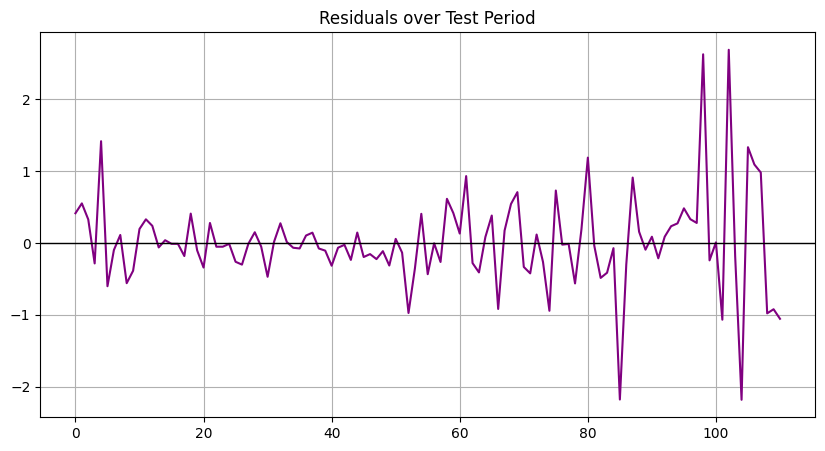

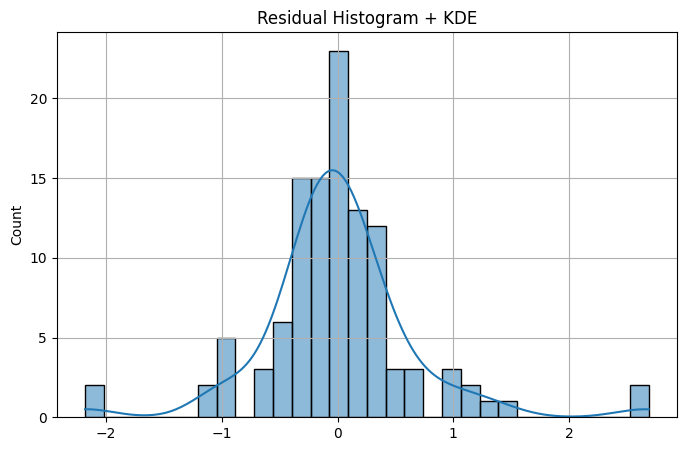

<Figure size 600x600 with 0 Axes>

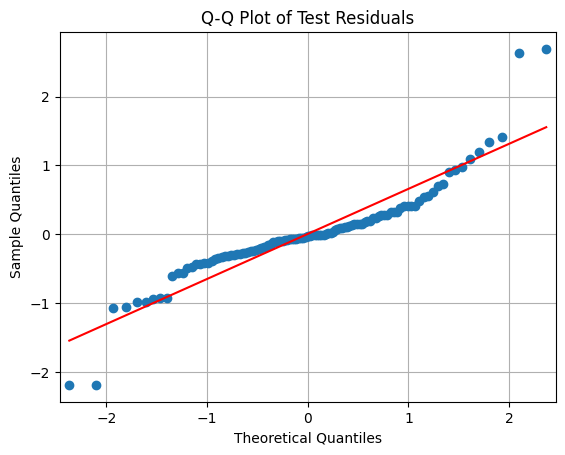

<Figure size 1000x400 with 0 Axes>

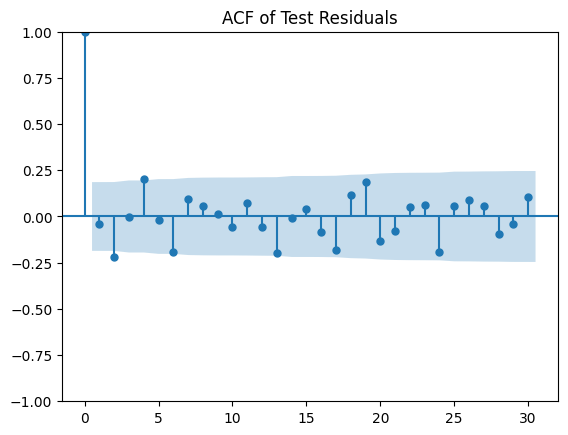

<Figure size 1000x400 with 0 Axes>

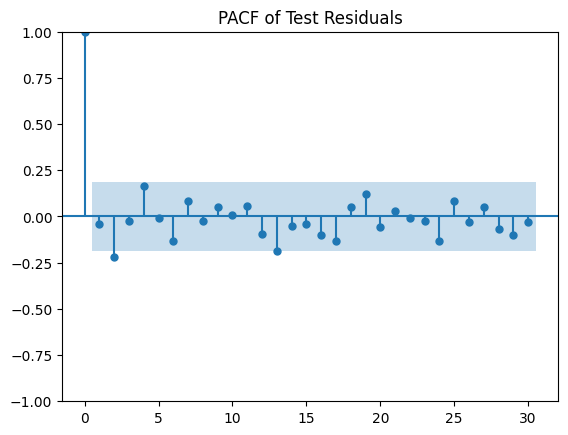


Ljung–Box Test Results:
      lb_stat  lb_pvalue
10  17.053587   0.073187
20  37.756288   0.009483
30  50.209140   0.011796

Shapiro–Wilk Normality Test: Statistic=0.8785, p-value=0.0000

Durbin–Watson Statistic: 2.0560


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import shapiro

# ======================================================
# 1. TÍNH RESIDUALS
# ======================================================
residuals_test = actual_price_test - pred_price_test

print("Residual Summary Statistics:")
print(pd.Series(residuals_test).describe())

# ======================================================
# 2. RESIDUALS PLOT
# ======================================================
plt.figure(figsize=(10, 5))
plt.plot(residuals_test, color='purple')
plt.axhline(0, color='black', linewidth=1)
plt.title("Residuals over Test Period")
plt.grid(True)
plt.show()

# ======================================================
# 3. HISTOGRAM + KDE
# ======================================================
plt.figure(figsize=(8, 5))
sns.histplot(residuals_test, bins=30, kde=True)
plt.title("Residual Histogram + KDE")
plt.grid(True)
plt.show()

# ======================================================
# 4. Q-Q PLOT
# ======================================================
plt.figure(figsize=(6, 6))
qqplot(residuals_test, line='s')
plt.title("Q-Q Plot of Test Residuals")
plt.grid(True)
plt.show()

# ======================================================
# 5. ACF & PACF OF RESIDUALS
# ======================================================
plt.figure(figsize=(10, 4))
plot_acf(residuals_test, lags=30)
plt.title("ACF of Test Residuals")
plt.show()

plt.figure(figsize=(10, 4))
plot_pacf(residuals_test, lags=30, method='ywm')
plt.title("PACF of Test Residuals")
plt.show()

# ======================================================
# 6. LJUNG–BOX TEST (Autocorrelation Check)
# ======================================================
lb_test = acorr_ljungbox(residuals_test, lags=[10, 20, 30], return_df=True)
print("\nLjung–Box Test Results:")
print(lb_test)

# ======================================================
# 7. NORMALITY TEST (Shapiro–Wilk)
# ======================================================
sh_stat, sh_p = shapiro(residuals_test)
print(f"\nShapiro–Wilk Normality Test: Statistic={sh_stat:.4f}, p-value={sh_p:.4f}")

# ======================================================
# 8. DURBIN–WATSON (Autocorrelation Test)
# ======================================================
dw = durbin_watson(residuals_test)
print(f"\nDurbin–Watson Statistic: {dw:.4f}")


Training Initial Model (SARIMAX(0, 1, 1)) on History...

Running 3-Step Rolling Forecast on Test Set...
Progress: ..... Done!

--- 3-Step Forecast Evaluation ---
T+1 Forecast -> RMSE: 0.65 | MAE: 0.40 | MAPE: 1.69%
T+2 Forecast -> RMSE: 0.89 | MAE: 0.61 | MAPE: 2.55%
T+3 Forecast -> RMSE: 1.00 | MAE: 0.70 | MAPE: 2.95%


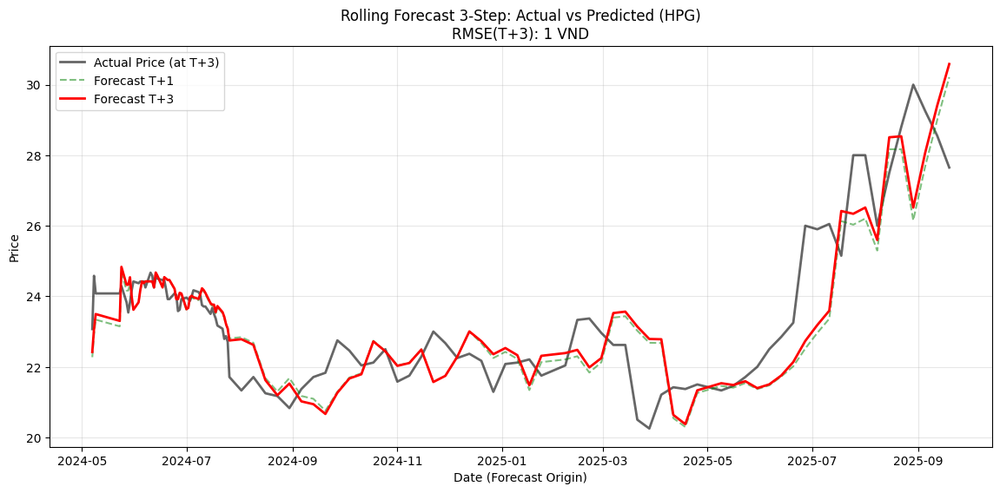

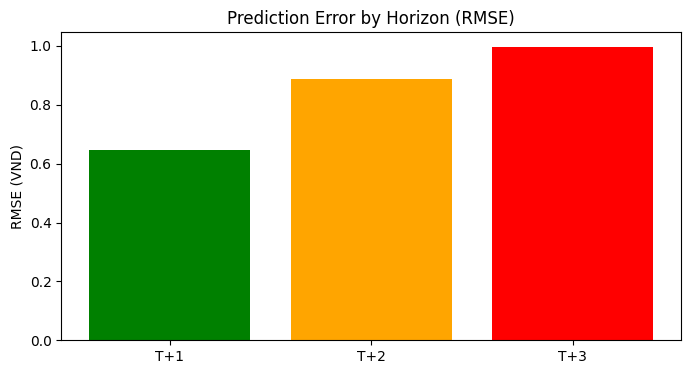

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------------------------------------------
# 1. CHUẨN BỊ DỮ LIỆU
# --------------------------------------------------------------------------------
# Load và xử lý dữ liệu
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df = df[df['stock_id'] == 'HPG'].sort_values('date').reset_index(drop=True)

# Feature Engineering
df['log_close'] = np.log(df['close'])
df['diff_log_close'] = df['log_close'].diff()

# Biến ngoại sinh
exog_cols = ['de', 'gdp_growth', 'interest', 'roa', 'roe', 'log_rebar_price', 'log_iron_powder_price']
df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

# Chia tập dữ liệu (Giữ nguyên tỷ lệ cũ hoặc tùy chỉnh)
n = len(df_clean)
test_size = int(n * 0.15)
train_val_end = n - test_size

# Tách Feature và Target
y = df_clean['diff_log_close']
X = df_clean[exog_cols]

# Scale dữ liệu (Fit trên Train, Transform trên toàn bộ để tránh look-ahead bias)
scaler = StandardScaler()
scaler.fit(X.iloc[:train_val_end]) # Chỉ fit trên quá khứ
X_scaled = pd.DataFrame(scaler.transform(X), columns=exog_cols, index=X.index)

# --------------------------------------------------------------------------------
# 2. KHỞI TẠO VÀ TRAIN MÔ HÌNH BAN ĐẦU
# --------------------------------------------------------------------------------
# Sử dụng tham số tốt nhất từ bước trước (ví dụ: order=(0,1,1) trên dữ liệu diff)
# Lưu ý: Nếu dữ liệu diff đã dừng, thường d=0. Nhưng ta tôn trọng kết quả Grid Search trước đó.
best_order = (0, 1, 1)

print(f"Training Initial Model (SARIMAX{best_order}) on History...")
# Train trên tập Train+Val ban đầu
model_init = SARIMAX(y.iloc[:train_val_end],
                     exog=X_scaled.iloc[:train_val_end],
                     order=best_order,
                     enforce_stationarity=False,
                     enforce_invertibility=False)
results_init = model_init.fit(disp=False)
fixed_params = results_init.params # Lưu lại tham số để dùng cho filter (giúp chạy nhanh)

# --------------------------------------------------------------------------------
# 3. THỰC HIỆN ROLLING FORECAST 3-STEP
# --------------------------------------------------------------------------------
print("\nRunning 3-Step Rolling Forecast on Test Set...")
print("Progress: ", end="")

horizon = 3 # Dự báo 3 bước
predictions_h1 = [] # T+1
predictions_h2 = [] # T+2
predictions_h3 = [] # T+3
actuals_h1 = []
actuals_h2 = []
actuals_h3 = []
dates_h1 = []

# Vòng lặp cuốn chiếu (Rolling Window)
# Chúng ta sẽ đi từ điểm bắt đầu Test đến (Hết Test - Horizon)
for i in range(train_val_end, n - horizon + 1):
    if i % 20 == 0: print(".", end="") # Progress bar

    # 1. Lấy dữ liệu lịch sử đến thời điểm i (History)
    # Để tối ưu tốc độ, ta không fit lại mà dùng 'filter' với tham số đã học
    # Ta dựng model với dữ liệu từ đầu đến i
    curr_y = y.iloc[:i]
    curr_X = X_scaled.iloc[:i]

    model_curr = SARIMAX(curr_y, exog=curr_X, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_curr = model_curr.filter(fixed_params) # Apply params cũ

    # 2. Lấy biến ngoại sinh cho 3 ngày tới (Future Exog)
    # Ở đây ta dùng Exog thực tế (Perfect Foresight cho biến X) để test sức mạnh model ARIMA
    # Trong thực tế trading, bạn sẽ phải dự báo X hoặc dùng giá trị X ngày i
    exog_future = X_scaled.iloc[i : i+horizon]

    # 3. Dự báo
    forecast = res_curr.get_forecast(steps=horizon, exog=exog_future)
    pred_diff = forecast.predicted_mean.values # Kết quả dạng sai phân log

    # 4. Khôi phục về giá gốc (Reconstruct Price)
    # Giá dự báo T+1 = Giá thực T + Diff(T+1)
    # Giá dự báo T+2 = Giá dự báo T+1 + Diff(T+2)
    last_real_log_price = df_clean.iloc[i-1]['log_close']

    pred_log_h1 = last_real_log_price + pred_diff[0]
    pred_log_h2 = pred_log_h1 + pred_diff[1]
    pred_log_h3 = pred_log_h2 + pred_diff[2]

    # Lưu kết quả (Convert Log -> Price)
    predictions_h1.append(np.exp(pred_log_h1))
    predictions_h2.append(np.exp(pred_log_h2))
    predictions_h3.append(np.exp(pred_log_h3))

    # Lưu giá thực tế tương ứng để so sánh
    actuals_h1.append(df_clean.iloc[i]['close'])
    actuals_h2.append(df_clean.iloc[i+1]['close'])
    actuals_h3.append(df_clean.iloc[i+2]['close'])

    dates_h1.append(df_clean.iloc[i]['date'])

print(" Done!")

# --------------------------------------------------------------------------------
# 4. ĐÁNH GIÁ HIỆU SUẤT THEO HORIZON
# --------------------------------------------------------------------------------
def evaluate(true, pred, label):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    mape = np.mean(np.abs((np.array(true) - np.array(pred)) / np.array(true))) * 100
    print(f"{label} -> RMSE: {rmse:.2f} | MAE: {mae:.2f} | MAPE: {mape:.2f}%")
    return rmse

print("\n--- 3-Step Forecast Evaluation ---")
rmse_h1 = evaluate(actuals_h1, predictions_h1, "T+1 Forecast")
rmse_h2 = evaluate(actuals_h2, predictions_h2, "T+2 Forecast")
rmse_h3 = evaluate(actuals_h3, predictions_h3, "T+3 Forecast")

# --------------------------------------------------------------------------------
# 5. TRỰC QUAN HÓA (PLOT)
# --------------------------------------------------------------------------------
# Vẽ biểu đồ so sánh cho T+3 (thường là cái khó nhất và quan trọng cho trading T+2.5)
plt.figure(figsize=(14, 6))
# Vẽ giá thực tế
plt.plot(dates_h1, actuals_h3, label='Actual Price (at T+3)', color='black', alpha=0.6, linewidth=2)
# Vẽ dự báo
plt.plot(dates_h1, predictions_h1, label='Forecast T+1', color='green', linestyle='--', alpha=0.5)
plt.plot(dates_h1, predictions_h3, label='Forecast T+3', color='red', linewidth=2)

plt.title(f'Rolling Forecast 3-Step: Actual vs Predicted (HPG)\nRMSE(T+3): {rmse_h3:.0f} VND')
plt.xlabel('Date (Forecast Origin)')
plt.ylabel('Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Vẽ biểu đồ sai số theo các bước (Error decadence)
horizons = ['T+1', 'T+2', 'T+3']
rmses = [rmse_h1, rmse_h2, rmse_h3]
plt.figure(figsize=(8, 4))
plt.bar(horizons, rmses, color=['green', 'orange', 'red'])
plt.title('Prediction Error by Horizon (RMSE)')
plt.ylabel('RMSE (VND)')
plt.show()

**HSG**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (1, 1, 1) with AIC: -1950.85
Performing rolling forecast on Validation Set...

--- Validation Results (HSG) ---
RMSE: 0.4265
MAE: 0.3277
R2 Score: 0.8010


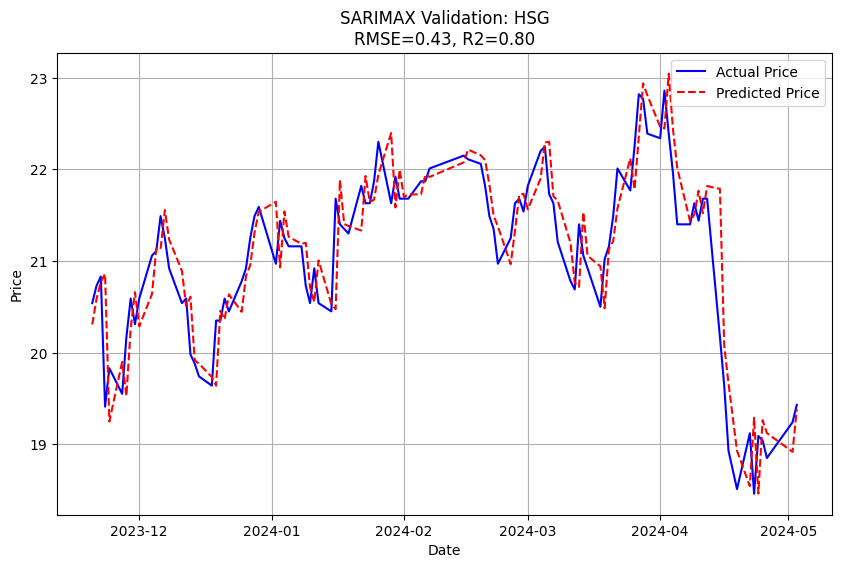

Performing rolling forecast on Test Set...

--- Test Results (HSG) ---
RMSE: 0.6726
MAE: 0.4871
R2 Score: 0.9466


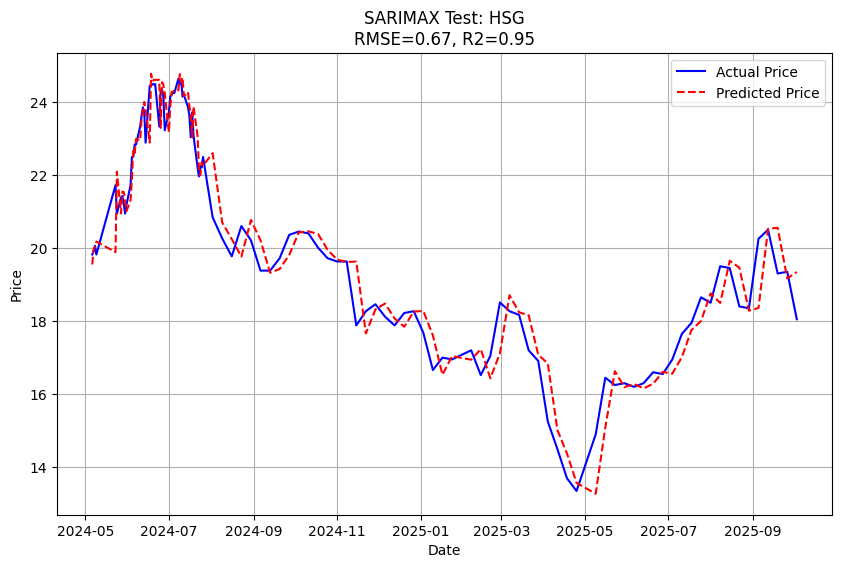


Forecasting 5 future steps...


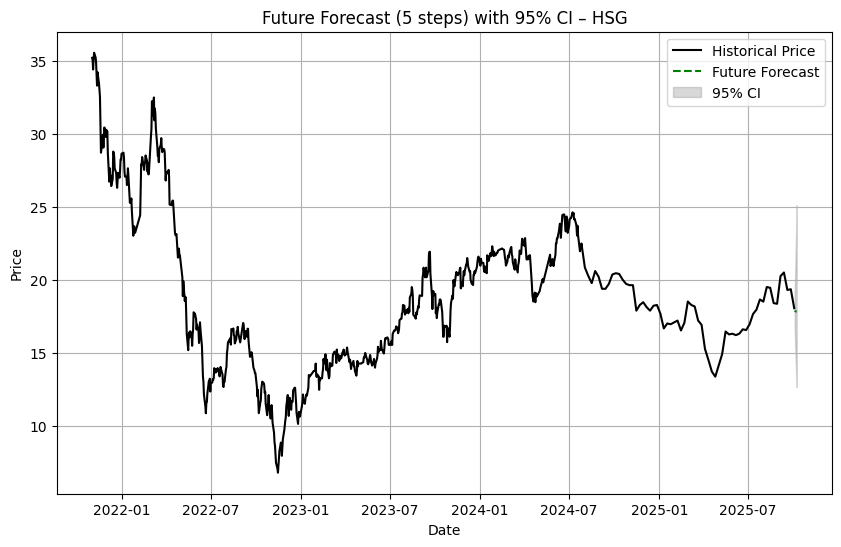


Future price forecast (first 10 rows):
        date  forecast_price   lower_95   upper_95
0 2025-10-04       17.878966  16.699148  19.142140
1 2025-10-05       17.846339  15.559835  20.468843
2 2025-10-06       17.831349  14.512400  21.909334
3 2025-10-07       17.818624  13.537180  23.454174
4 2025-10-08       17.806197  12.627698  25.108349


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='HSG'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

    # 6. Testing (Rolling Forecast)
    print("Performing rolling forecast on Test Set...")
    test_preds_diff = []

    # Previous history: use train + val
    history_endog = list(pd.concat([y_train, y_val]))
    history_exog = list(pd.concat([X_train_scaled, X_val_scaled]).values)

    # Re-setup model with full train + val data but fixed params
    full_exog_test = pd.concat([X_train_scaled, X_val_scaled, X_test_scaled])
    full_endog_test = pd.concat([y_train, y_val, y_test])  # full endog to match exog length

    model_test = SARIMAX(full_endog_test, exog=full_exog_test, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_test = model_test.filter(res_fitted.params)  # Apply trained params

    # Predict for test indices
    test_start = len(y_train) + len(y_val)
    test_end_idx = len(y_train) + len(y_val) + len(y_test) - 1

    pred_res_test = res_test.get_prediction(start=test_start, end=test_end_idx, exog=X_test_scaled)
    pred_diff_test = pred_res_test.predicted_mean

    # Reconstruct Prices
    # Previous log_close: last point of validation set
    prev_log_close_test = df_clean.iloc[val_end-1 : n-1]['log_close'].values

    # Reconstruct
    pred_log_close_test = prev_log_close_test + pred_diff_test.values
    pred_price_test = np.exp(pred_log_close_test)

    # Actual prices for test
    actual_price_test = df_clean.iloc[val_end : n]['close'].values
    actual_dates_test = df_clean.iloc[val_end : n]['date'].values

    # 8. Evaluation
    rmse_test = np.sqrt(mean_squared_error(actual_price_test, pred_price_test))
    mae_test = mean_absolute_error(actual_price_test, pred_price_test)
    r2_test = r2_score(actual_price_test, pred_price_test)

    print(f"\n--- Test Results ({stock_id}) ---")
    print(f"RMSE: {rmse_test:.4f}")
    print(f"MAE: {mae_test:.4f}")
    print(f"R2 Score: {r2_test:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates_test, actual_price_test, label='Actual Price', color='blue')
    plt.plot(actual_dates_test, pred_price_test, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Test: {stock_id}\nRMSE={rmse_test:.2f}, R2={r2_test:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

# ================================ FUTURE FORECAST + CI ================================
    future_steps = 5  # You can change this

    print(f"\nForecasting {future_steps} future steps...")

    # We use all available data (train + val + test) filtered by params for the future forecast model
    full_endog_2 = pd.concat([y_train, y_val, y_test])
    full_exog_2 = pd.concat([X_train_scaled, X_val_scaled, X_test_scaled])

    model_future = SARIMAX(full_endog_2, exog=full_exog_2,
                           order=best_order,
                           enforce_stationarity=False,
                           enforce_invertibility=False)

    res_future = model_future.filter(res_fitted.params)

    # Future exog
    # 1. If exogenous variables are not forecasted, repeat the last known values
    last_exog_row = X_test_scaled.iloc[-1].values.reshape(1, -1)
    future_exog = np.repeat(last_exog_row, future_steps, axis=0)

    # Prediction
    future_pred_res = res_future.get_forecast(steps=future_steps, exog=future_exog)

    # Mean diff forecast
    future_diff = future_pred_res.predicted_mean.values

    # Confidence intervals (diff)
    future_ci = future_pred_res.conf_int().values
    future_diff_lower = future_ci[:, 0]
    future_diff_upper = future_ci[:, 1]

# ================================== Reconstruct future price ==================================
    last_log_price = df_clean.iloc[-1]['log_close']

    future_log_price = []
    future_log_price_lower = []
    future_log_price_upper = []

    cur_log = last_log_price
    cur_log_low = last_log_price
    cur_log_up = last_log_price

    for i in range(future_steps):
        cur_log = cur_log + future_diff[i]
        cur_log_low = cur_log_low + future_diff_lower[i]
        cur_log_up = cur_log_up + future_diff_upper[i]

        future_log_price.append(cur_log)
        future_log_price_lower.append(cur_log_low)
        future_log_price_upper.append(cur_log_up)

    future_price = np.exp(future_log_price)
    future_price_lower = np.exp(future_log_price_lower)
    future_price_upper = np.exp(future_log_price_upper)

    # Generate future dates
    last_date = df_clean.iloc[-1]['date']
    future_dates = pd.date_range(start=last_date, periods=future_steps + 1, freq='D')[1:]

    # Plot Future Forecast
    plt.figure(figsize=(10, 6))
    plt.plot(df_clean['date'], df_clean['close'], color='black', label='Historical Price')
    plt.plot(future_dates, future_price, color='green', linestyle='--', label='Future Forecast')
    plt.fill_between(future_dates, future_price_lower, future_price_upper,
                     color='gray', alpha=0.3, label='95% CI')
    plt.title(f'Future Forecast ({future_steps} steps) with 95% CI – {stock_id}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\nFuture price forecast (first 10 rows):")
    future_df = pd.DataFrame({
        'date': future_dates,
        'forecast_price': future_price,
        'lower_95': future_price_lower,
        'upper_95': future_price_upper
    })
    print(future_df.head(10))

    return actual_price_test, pred_price_test

actual_price_test, pred_price_test = run_sarimax_custom()

Residual Summary Statistics:
count    111.000000
mean      -0.059037
std        0.673059
min       -1.753791
25%       -0.372279
50%       -0.078034
75%        0.265244
max        1.891670
dtype: float64


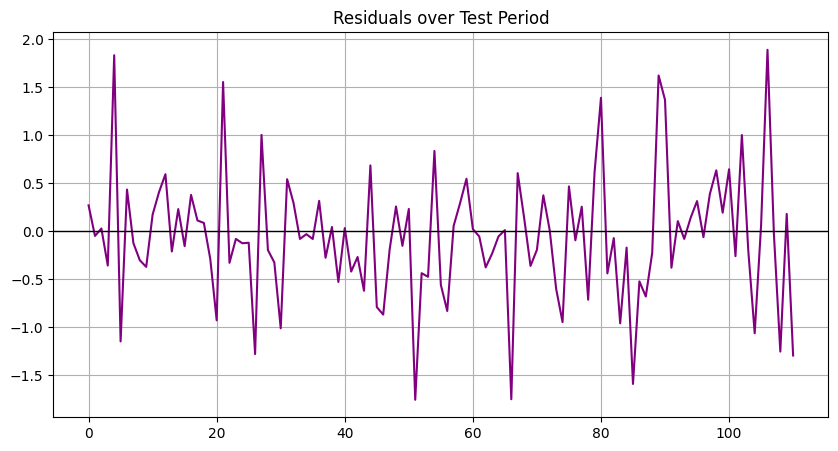

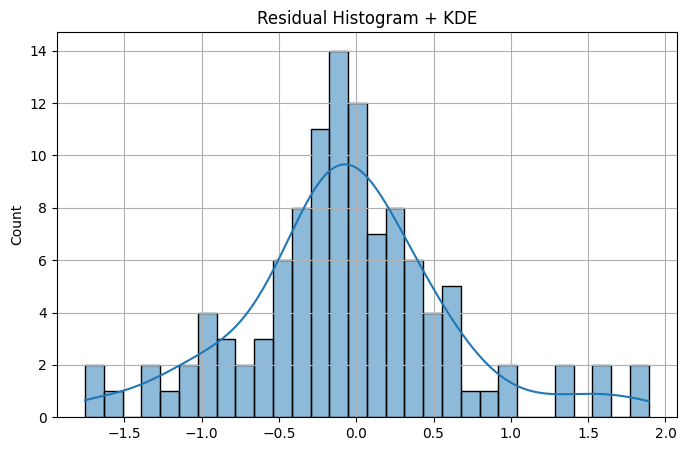

<Figure size 600x600 with 0 Axes>

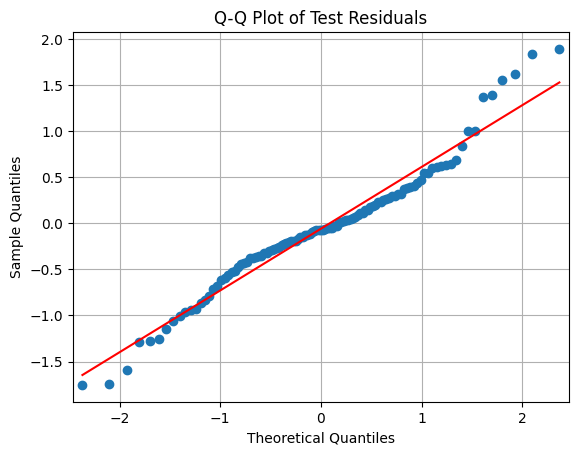

<Figure size 1000x400 with 0 Axes>

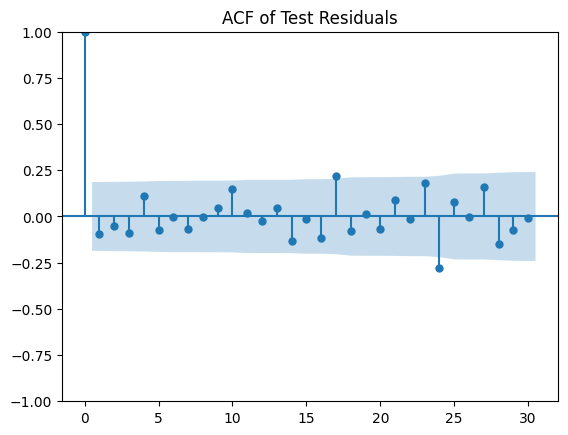

<Figure size 1000x400 with 0 Axes>

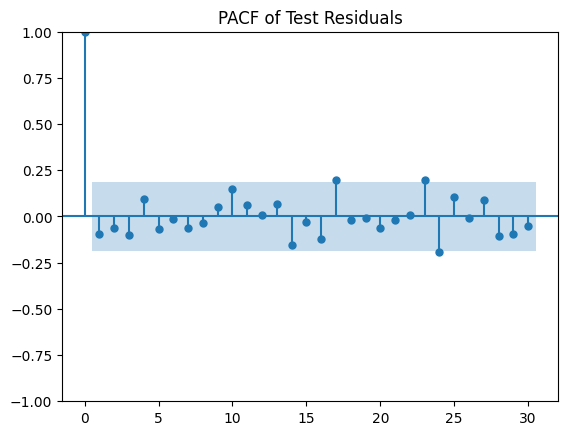


Ljung–Box Test Results:
      lb_stat  lb_pvalue
10   7.978292   0.630957
20  20.162789   0.447789
30  46.037619   0.030819

Shapiro–Wilk Normality Test: Statistic=0.9662, p-value=0.0065

Durbin–Watson Statistic: 2.1428


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import shapiro

# ======================================================
# 1. TÍNH RESIDUALS
# ======================================================
residuals_test = actual_price_test - pred_price_test

print("Residual Summary Statistics:")
print(pd.Series(residuals_test).describe())

# ======================================================
# 2. RESIDUALS PLOT
# ======================================================
plt.figure(figsize=(10, 5))
plt.plot(residuals_test, color='purple')
plt.axhline(0, color='black', linewidth=1)
plt.title("Residuals over Test Period")
plt.grid(True)
plt.show()

# ======================================================
# 3. HISTOGRAM + KDE
# ======================================================
plt.figure(figsize=(8, 5))
sns.histplot(residuals_test, bins=30, kde=True)
plt.title("Residual Histogram + KDE")
plt.grid(True)
plt.show()

# ======================================================
# 4. Q-Q PLOT
# ======================================================
plt.figure(figsize=(6, 6))
qqplot(residuals_test, line='s')
plt.title("Q-Q Plot of Test Residuals")
plt.grid(True)
plt.show()

# ======================================================
# 5. ACF & PACF OF RESIDUALS
# ======================================================
plt.figure(figsize=(10, 4))
plot_acf(residuals_test, lags=30)
plt.title("ACF of Test Residuals")
plt.show()

plt.figure(figsize=(10, 4))
plot_pacf(residuals_test, lags=30, method='ywm')
plt.title("PACF of Test Residuals")
plt.show()

# ======================================================
# 6. LJUNG–BOX TEST (Autocorrelation Check)
# ======================================================
lb_test = acorr_ljungbox(residuals_test, lags=[10, 20, 30], return_df=True)
print("\nLjung–Box Test Results:")
print(lb_test)

# ======================================================
# 7. NORMALITY TEST (Shapiro–Wilk)
# ======================================================
sh_stat, sh_p = shapiro(residuals_test)
print(f"\nShapiro–Wilk Normality Test: Statistic={sh_stat:.4f}, p-value={sh_p:.4f}")

# ======================================================
# 8. DURBIN–WATSON (Autocorrelation Test)
# ======================================================
dw = durbin_watson(residuals_test)
print(f"\nDurbin–Watson Statistic: {dw:.4f}")

Training Initial Model (SARIMAX(1, 1, 1)) on History...

Running 3-Step Rolling Forecast on Test Set...
Progress: ..... Done!

--- 3-Step Forecast Evaluation ---
T+1 Forecast -> RMSE: 0.67 | MAE: 0.48 | MAPE: 2.44%
T+2 Forecast -> RMSE: 0.96 | MAE: 0.74 | MAPE: 3.85%
T+3 Forecast -> RMSE: 1.17 | MAE: 0.91 | MAPE: 4.81%


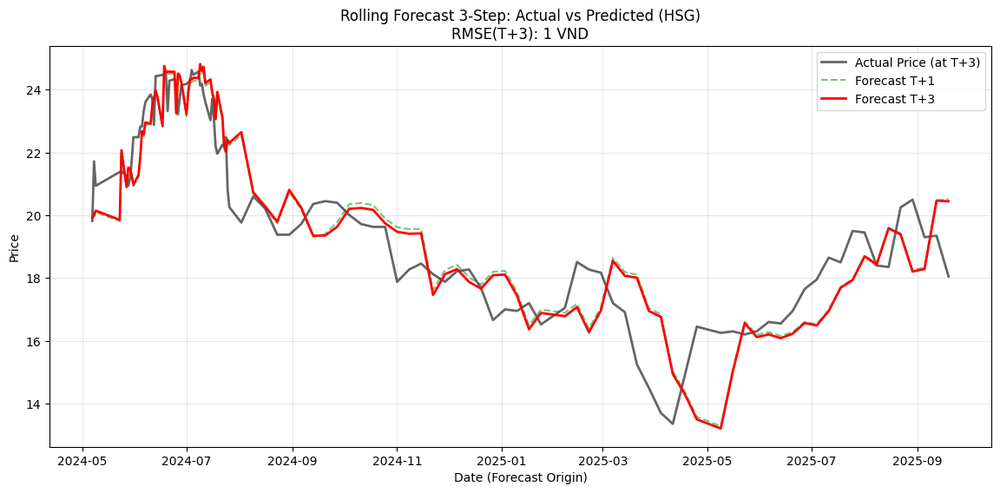

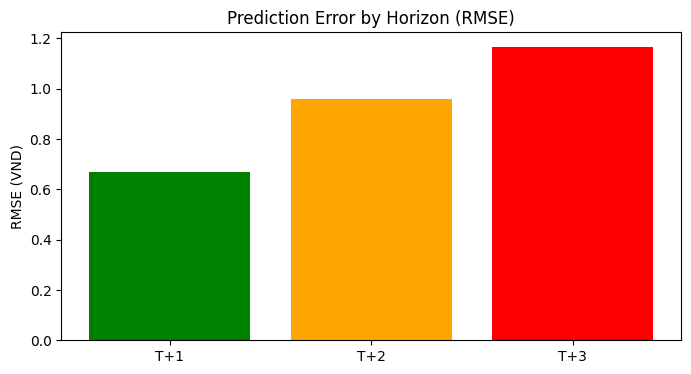

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------------------------------------------
# 1. CHUẨN BỊ DỮ LIỆU
# --------------------------------------------------------------------------------
# Load và xử lý dữ liệu
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df = df[df['stock_id'] == 'HSG'].sort_values('date').reset_index(drop=True)

# Feature Engineering
df['log_close'] = np.log(df['close'])
df['diff_log_close'] = df['log_close'].diff()

# Biến ngoại sinh
exog_cols = ['interest', 'de', 'gdp_growth', 'roe', 'cpi', 'roa', 'rebar_price']
df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

# Chia tập dữ liệu (Giữ nguyên tỷ lệ cũ hoặc tùy chỉnh)
n = len(df_clean)
test_size = int(n * 0.15)
train_val_end = n - test_size

# Tách Feature và Target
y = df_clean['diff_log_close']
X = df_clean[exog_cols]

# Scale dữ liệu (Fit trên Train, Transform trên toàn bộ để tránh look-ahead bias)
scaler = StandardScaler()
scaler.fit(X.iloc[:train_val_end]) # Chỉ fit trên quá khứ
X_scaled = pd.DataFrame(scaler.transform(X), columns=exog_cols, index=X.index)

# --------------------------------------------------------------------------------
# 2. KHỞI TẠO VÀ TRAIN MÔ HÌNH BAN ĐẦU
# --------------------------------------------------------------------------------
# Sử dụng tham số tốt nhất từ bước trước (ví dụ: order=(0,1,1) trên dữ liệu diff)
# Lưu ý: Nếu dữ liệu diff đã dừng, thường d=0. Nhưng ta tôn trọng kết quả Grid Search trước đó.
best_order = (1, 1, 1)

print(f"Training Initial Model (SARIMAX{best_order}) on History...")
# Train trên tập Train+Val ban đầu
model_init = SARIMAX(y.iloc[:train_val_end],
                     exog=X_scaled.iloc[:train_val_end],
                     order=best_order,
                     enforce_stationarity=False,
                     enforce_invertibility=False)
results_init = model_init.fit(disp=False)
fixed_params = results_init.params # Lưu lại tham số để dùng cho filter (giúp chạy nhanh)

# --------------------------------------------------------------------------------
# 3. THỰC HIỆN ROLLING FORECAST 3-STEP
# --------------------------------------------------------------------------------
print("\nRunning 3-Step Rolling Forecast on Test Set...")
print("Progress: ", end="")

horizon = 3 # Dự báo 3 bước
predictions_h1 = [] # T+1
predictions_h2 = [] # T+2
predictions_h3 = [] # T+3
actuals_h1 = []
actuals_h2 = []
actuals_h3 = []
dates_h1 = []

# Vòng lặp cuốn chiếu (Rolling Window)
# Chúng ta sẽ đi từ điểm bắt đầu Test đến (Hết Test - Horizon)
for i in range(train_val_end, n - horizon + 1):
    if i % 20 == 0: print(".", end="") # Progress bar

    # 1. Lấy dữ liệu lịch sử đến thời điểm i (History)
    # Để tối ưu tốc độ, ta không fit lại mà dùng 'filter' với tham số đã học
    # Ta dựng model với dữ liệu từ đầu đến i
    curr_y = y.iloc[:i]
    curr_X = X_scaled.iloc[:i]

    model_curr = SARIMAX(curr_y, exog=curr_X, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_curr = model_curr.filter(fixed_params) # Apply params cũ

    # 2. Lấy biến ngoại sinh cho 3 ngày tới (Future Exog)
    # Ở đây ta dùng Exog thực tế (Perfect Foresight cho biến X) để test sức mạnh model ARIMA
    # Trong thực tế trading, bạn sẽ phải dự báo X hoặc dùng giá trị X ngày i
    exog_future = X_scaled.iloc[i : i+horizon]

    # 3. Dự báo
    forecast = res_curr.get_forecast(steps=horizon, exog=exog_future)
    pred_diff = forecast.predicted_mean.values # Kết quả dạng sai phân log

    # 4. Khôi phục về giá gốc (Reconstruct Price)
    # Giá dự báo T+1 = Giá thực T + Diff(T+1)
    # Giá dự báo T+2 = Giá dự báo T+1 + Diff(T+2)
    last_real_log_price = df_clean.iloc[i-1]['log_close']

    pred_log_h1 = last_real_log_price + pred_diff[0]
    pred_log_h2 = pred_log_h1 + pred_diff[1]
    pred_log_h3 = pred_log_h2 + pred_diff[2]

    # Lưu kết quả (Convert Log -> Price)
    predictions_h1.append(np.exp(pred_log_h1))
    predictions_h2.append(np.exp(pred_log_h2))
    predictions_h3.append(np.exp(pred_log_h3))

    # Lưu giá thực tế tương ứng để so sánh
    actuals_h1.append(df_clean.iloc[i]['close'])
    actuals_h2.append(df_clean.iloc[i+1]['close'])
    actuals_h3.append(df_clean.iloc[i+2]['close'])

    dates_h1.append(df_clean.iloc[i]['date'])

print(" Done!")

# --------------------------------------------------------------------------------
# 4. ĐÁNH GIÁ HIỆU SUẤT THEO HORIZON
# --------------------------------------------------------------------------------
def evaluate(true, pred, label):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    mape = np.mean(np.abs((np.array(true) - np.array(pred)) / np.array(true))) * 100
    print(f"{label} -> RMSE: {rmse:.2f} | MAE: {mae:.2f} | MAPE: {mape:.2f}%")
    return rmse

print("\n--- 3-Step Forecast Evaluation ---")
rmse_h1 = evaluate(actuals_h1, predictions_h1, "T+1 Forecast")
rmse_h2 = evaluate(actuals_h2, predictions_h2, "T+2 Forecast")
rmse_h3 = evaluate(actuals_h3, predictions_h3, "T+3 Forecast")

# --------------------------------------------------------------------------------
# 5. TRỰC QUAN HÓA (PLOT)
# --------------------------------------------------------------------------------
# Vẽ biểu đồ so sánh cho T+3 (thường là cái khó nhất và quan trọng cho trading T+2.5)
plt.figure(figsize=(14, 6))
# Vẽ giá thực tế
plt.plot(dates_h1, actuals_h3, label='Actual Price (at T+3)', color='black', alpha=0.6, linewidth=2)
# Vẽ dự báo
plt.plot(dates_h1, predictions_h1, label='Forecast T+1', color='green', linestyle='--', alpha=0.5)
plt.plot(dates_h1, predictions_h3, label='Forecast T+3', color='red', linewidth=2)

plt.title(f'Rolling Forecast 3-Step: Actual vs Predicted (HSG)\nRMSE(T+3): {rmse_h3:.0f} VND')
plt.xlabel('Date (Forecast Origin)')
plt.ylabel('Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Vẽ biểu đồ sai số theo các bước (Error decadence)
horizons = ['T+1', 'T+2', 'T+3']
rmses = [rmse_h1, rmse_h2, rmse_h3]
plt.figure(figsize=(8, 4))
plt.bar(horizons, rmses, color=['green', 'orange', 'red'])
plt.title('Prediction Error by Horizon (RMSE)')
plt.ylabel('RMSE (VND)')
plt.show()

**NKG**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (1, 1, 1) with AIC: -5239.34
Performing rolling forecast on Validation Set...

--- Validation Results (NKG) ---
RMSE: 0.0183
MAE: 0.0109
R2 Score: 0.9995


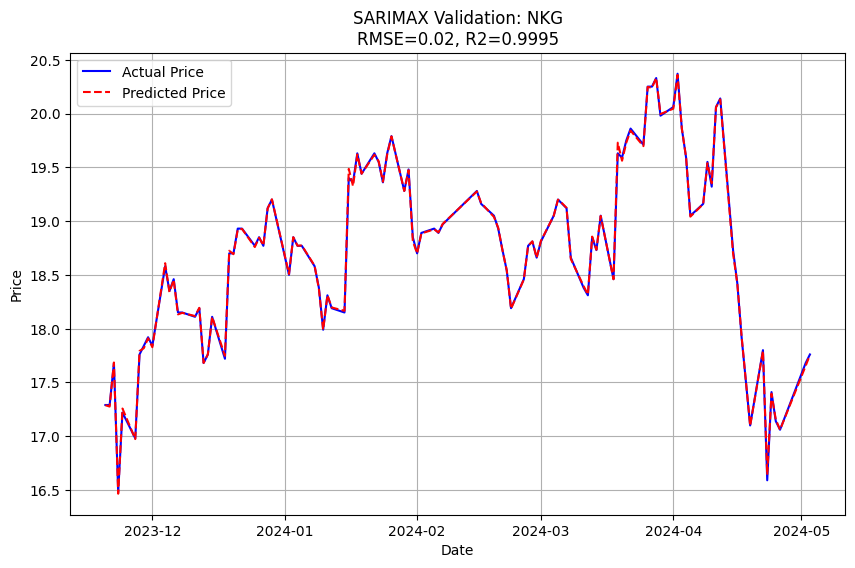


Performing Test Set Prediction...

--- TEST RESULTS (NKG) ---
RMSE: 0.5204
MAE: 0.3098
R2 Score: 0.9581


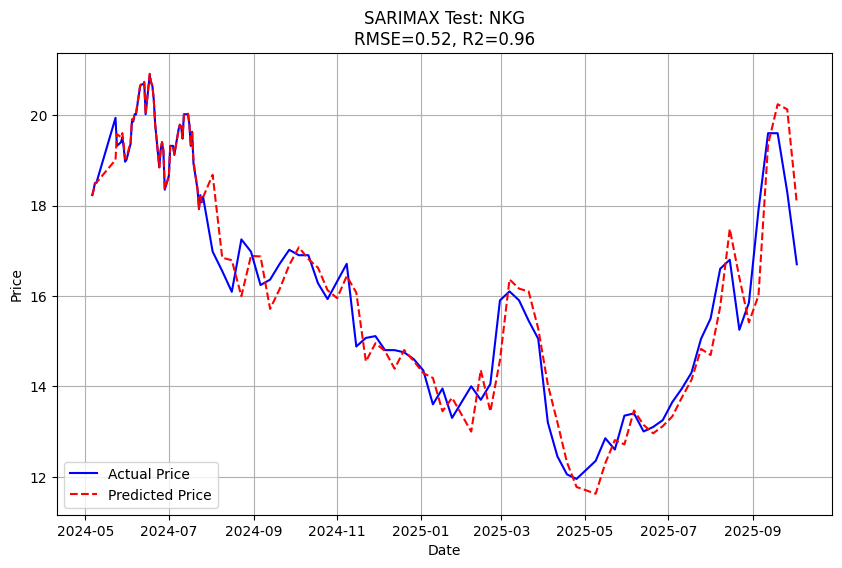


Forecasting 5 future steps...


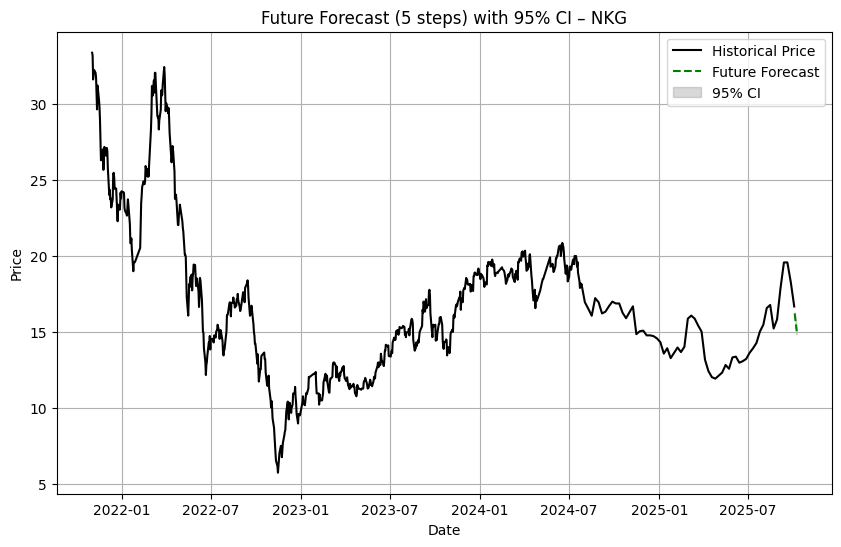


Future price forecast (first 10 rows):
        date  forecast_price   lower_95   upper_95
0 2025-10-04       16.244724  16.200567  16.289001
1 2025-10-05       15.930594  15.842293  16.019387
2 2025-10-06       15.638654  15.507095  15.771329
3 2025-10-07       15.354076  15.180268  15.529874
4 2025-10-08       15.074927  14.859903  15.293062


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='NKG'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.4f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

    # ============================
    # 9. TEST SET PREDICTION
    # ============================

    print("\nPerforming Test Set Prediction...")

    # Build full data (train + val + test)
    full_exog_2 = pd.concat([X_train_scaled, X_val_scaled, X_test_scaled])
    full_endog_2 = pd.concat([y_train, y_val, y_test])

    # Re-setup model for (train+val+test) and apply trained params
    model_test = SARIMAX(full_endog_2, exog=full_exog_2, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_test = model_test.filter(res_fitted.params)

    # Test index range
    test_start = len(y_train) + len(y_val)
    test_end_idx = len(full_endog_2) - 1

    pred_test_res = res_test.get_prediction(start=test_start, end=test_end_idx, exog=X_test_scaled)
    pred_test_diff = pred_test_res.predicted_mean

    # ========== Reconstruct Price on TEST ==========
    # diff_log_close(t) = logP(t) - logP(t-1)
    # → logP_pred(t) = logP_actual(t-1) + diff_pred(t)

    prev_log_close_test = df_clean.iloc[val_end-1 : ].iloc[:-1]['log_close'].values

    pred_log_close_test = prev_log_close_test + pred_test_diff.values
    pred_price_test = np.exp(pred_log_close_test)

    # Actual prices
    actual_price_test = df_clean.iloc[val_end : ]['close'].values
    actual_dates_test = df_clean.iloc[val_end : ]['date'].values

    # Evaluation
    rmse_test = np.sqrt(mean_squared_error(actual_price_test, pred_price_test))
    mae_test = mean_absolute_error(actual_price_test, pred_price_test)
    r2_test = r2_score(actual_price_test, pred_price_test)

    print(f"\n--- TEST RESULTS ({stock_id}) ---")
    print(f"RMSE: {rmse_test:.4f}")
    print(f"MAE: {mae_test:.4f}")
    print(f"R2 Score: {r2_test:.4f}")

    # Plot Test
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates_test, actual_price_test, label='Actual Price', color='blue')
    plt.plot(actual_dates_test, pred_price_test, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Test: {stock_id}\nRMSE={rmse_test:.2f}, R2={r2_test:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()


    # ================================
    # 10. FUTURE FORECAST + CI
    # ================================
    future_steps = 5  # Bạn có thể thay đổi

    print(f"\nForecasting {future_steps} future steps...")

    # Ta dùng toàn bộ dữ liệu train + val + test đã lọc bằng params
    model_future = SARIMAX(full_endog_2, exog=full_exog_2,
                           order=best_order,
                           enforce_stationarity=False,
                           enforce_invertibility=False)

    res_future = model_future.filter(res_fitted.params)

    # Future exog
    # ---------
    # Bạn có 2 lựa chọn:
    # 1. Nếu exog không có forecast → dùng giá trị cuối cùng lặp lại
    # 2. Nếu bạn có model cho exog → cung cấp dự báo vào biến future_exog
    #
    # Ở đây ta dùng cách 1 cho đơn giản.

    last_exog_row = X_test_scaled.iloc[-1].values.reshape(1, -1)
    future_exog = np.repeat(last_exog_row, future_steps, axis=0)

    # Prediction
    future_pred_res = res_future.get_forecast(steps=future_steps, exog=future_exog)

    # Mean diff forecast
    future_diff = future_pred_res.predicted_mean.values

    # Confidence intervals (diff)
    future_ci = future_pred_res.conf_int().values
    future_diff_lower = future_ci[:, 0]
    future_diff_upper = future_ci[:, 1]

    # ==================================
    # Khôi phục giá tương lai (price)
    # ==================================

    # Lấy log-price cuối cùng từ df_clean
    last_log_price = df_clean.iloc[-1]['log_close']

    future_log_price = []
    future_log_price_lower = []
    future_log_price_upper = []

    cur_log = last_log_price
    cur_log_low = last_log_price
    cur_log_up = last_log_price

    for i in range(future_steps):
        cur_log = cur_log + future_diff[i]
        cur_log_low = cur_log_low + future_diff_lower[i]
        cur_log_up = cur_log_up + future_diff_upper[i]

        future_log_price.append(cur_log)
        future_log_price_lower.append(cur_log_low)
        future_log_price_upper.append(cur_log_up)

    future_price = np.exp(future_log_price)
    future_price_lower = np.exp(future_log_price_lower)
    future_price_upper = np.exp(future_log_price_upper)

    # Tạo mốc thời gian
    last_date = df_clean.iloc[-1]['date']
    future_dates = pd.date_range(start=last_date, periods=future_steps + 1, freq='D')[1:]

    # Plot Future Forecast
    plt.figure(figsize=(10, 6))

    # Giá thật giai đoạn cuối để đối chiếu
    plt.plot(df_clean['date'], df_clean['close'], color='black', label='Historical Price')

    # Forecast price
    plt.plot(future_dates, future_price, color='green', linestyle='--', label='Future Forecast')

    # CI band
    plt.fill_between(future_dates, future_price_lower, future_price_upper,
                     color='gray', alpha=0.3, label='95% CI')

    plt.title(f'Future Forecast ({future_steps} steps) with 95% CI – {stock_id}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\nFuture price forecast (first 10 rows):")
    future_df = pd.DataFrame({
        'date': future_dates,
        'forecast_price': future_price,
        'lower_95': future_price_lower,
        'upper_95': future_price_upper
    })
    print(future_df.head(10))

    return actual_price_test, pred_price_test

actual_price_test, pred_price_test = run_sarimax_custom()

Residual Summary Statistics:
count    111.000000
mean      -0.005516
std        0.522773
min       -1.828037
25%       -0.083069
50%       -0.005350
75%        0.137553
max        1.890274
dtype: float64


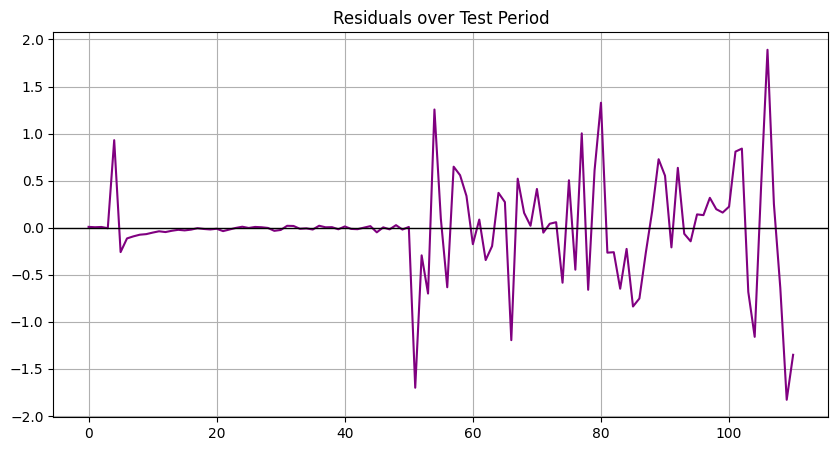

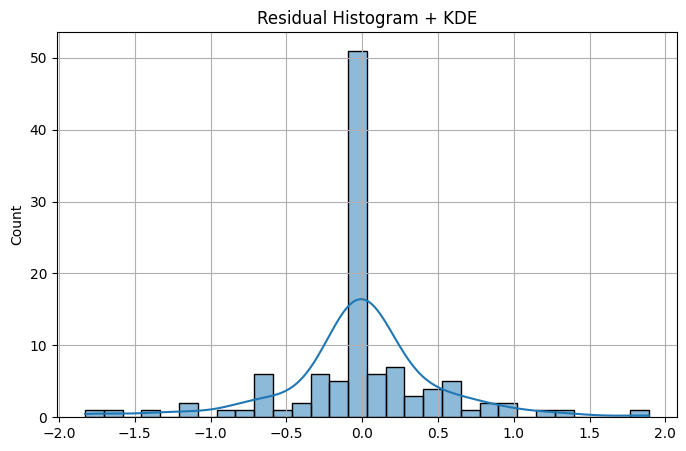

<Figure size 600x600 with 0 Axes>

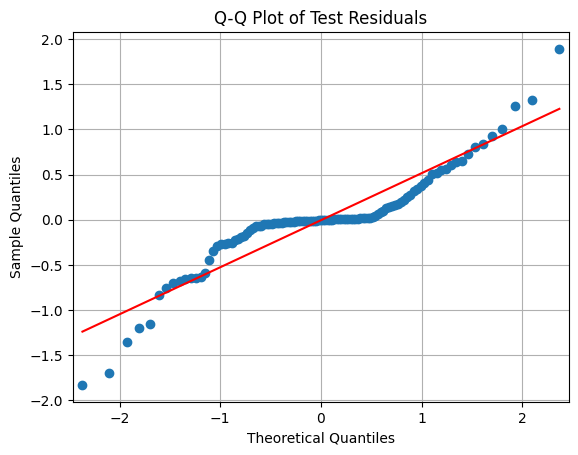

<Figure size 1000x400 with 0 Axes>

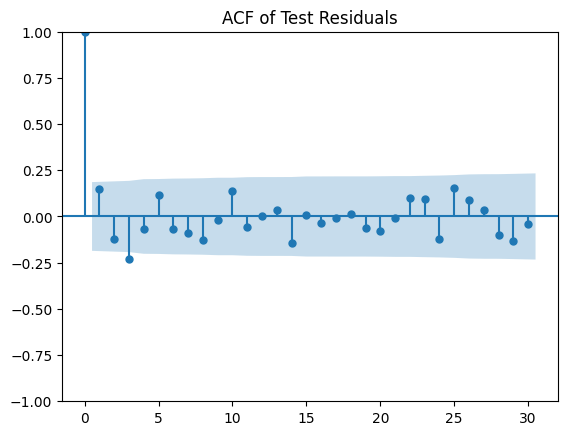

<Figure size 1000x400 with 0 Axes>

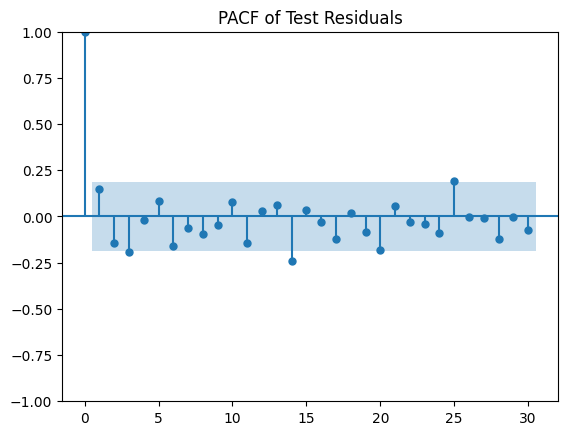


Ljung–Box Test Results:
      lb_stat  lb_pvalue
10  18.138848   0.052666
20  22.859825   0.295730
30  37.191464   0.171630

Shapiro–Wilk Normality Test: Statistic=0.8818, p-value=0.0000

Durbin–Watson Statistic: 1.6423


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import shapiro

# ======================================================
# 1. TÍNH RESIDUALS
# ======================================================
residuals_test = actual_price_test - pred_price_test

print("Residual Summary Statistics:")
print(pd.Series(residuals_test).describe())

# ======================================================
# 2. RESIDUALS PLOT
# ======================================================
plt.figure(figsize=(10, 5))
plt.plot(residuals_test, color='purple')
plt.axhline(0, color='black', linewidth=1)
plt.title("Residuals over Test Period")
plt.grid(True)
plt.show()

# ======================================================
# 3. HISTOGRAM + KDE
# ======================================================
plt.figure(figsize=(8, 5))
sns.histplot(residuals_test, bins=30, kde=True)
plt.title("Residual Histogram + KDE")
plt.grid(True)
plt.show()

# ======================================================
# 4. Q-Q PLOT
# ======================================================
plt.figure(figsize=(6, 6))
qqplot(residuals_test, line='s')
plt.title("Q-Q Plot of Test Residuals")
plt.grid(True)
plt.show()

# ======================================================
# 5. ACF & PACF OF RESIDUALS
# ======================================================
plt.figure(figsize=(10, 4))
plot_acf(residuals_test, lags=30)
plt.title("ACF of Test Residuals")
plt.show()

plt.figure(figsize=(10, 4))
plot_pacf(residuals_test, lags=30, method='ywm')
plt.title("PACF of Test Residuals")
plt.show()

# ======================================================
# 6. LJUNG–BOX TEST (Autocorrelation Check)
# ======================================================
lb_test = acorr_ljungbox(residuals_test, lags=[10, 20, 30], return_df=True)
print("\nLjung–Box Test Results:")
print(lb_test)

# ======================================================
# 7. NORMALITY TEST (Shapiro–Wilk)
# ======================================================
sh_stat, sh_p = shapiro(residuals_test)
print(f"\nShapiro–Wilk Normality Test: Statistic={sh_stat:.4f}, p-value={sh_p:.4f}")

# ======================================================
# 8. DURBIN–WATSON (Autocorrelation Test)
# ======================================================
dw = durbin_watson(residuals_test)
print(f"\nDurbin–Watson Statistic: {dw:.4f}")


Training Initial Model (SARIMAX(1, 1, 1)) on History...

Running 3-Step Rolling Forecast on Test Set...
Progress: ..... Done!

--- 3-Step Forecast Evaluation ---
T+1 Forecast -> RMSE: 0.48 | MAE: 0.29 | MAPE: 1.87%
T+2 Forecast -> RMSE: 0.84 | MAE: 0.51 | MAPE: 3.27%
T+3 Forecast -> RMSE: 1.17 | MAE: 0.73 | MAPE: 4.66%


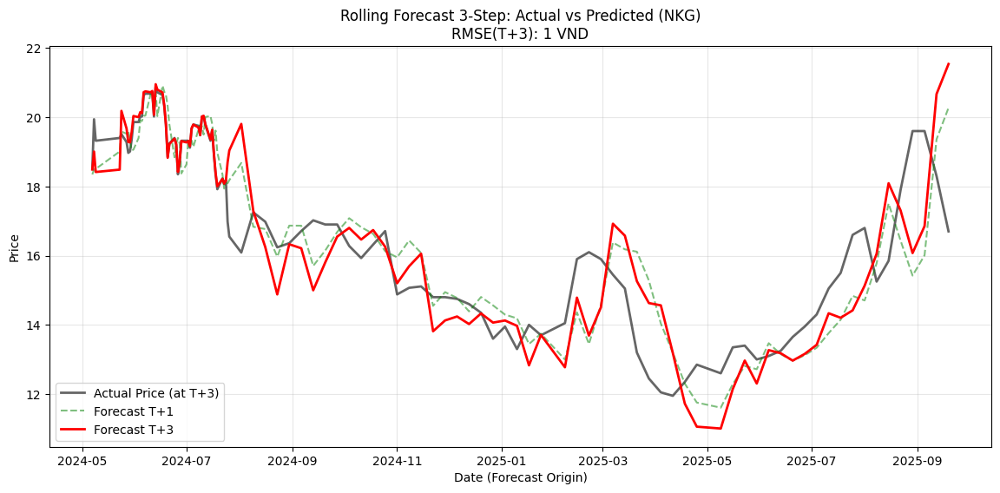

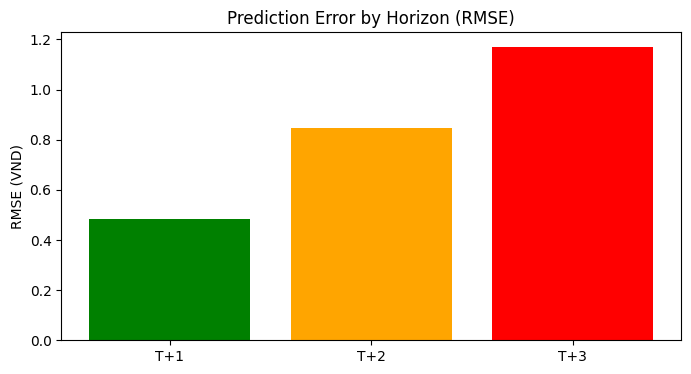

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------------------------------------------
# 1. CHUẨN BỊ DỮ LIỆU
# --------------------------------------------------------------------------------
# Load và xử lý dữ liệu
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df = df[df['stock_id'] == 'NKG'].sort_values('date').reset_index(drop=True)

# Feature Engineering
df['log_close'] = np.log(df['close'])
df['diff_log_close'] = df['log_close'].diff()

# Biến ngoại sinh
exog_cols = ['interest', 'log_rebar_price', 'iron_powder_price', 'cpi', 'coke_price', 'volume_momentum', 'log_volume']
df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

# Chia tập dữ liệu (Giữ nguyên tỷ lệ cũ hoặc tùy chỉnh)
n = len(df_clean)
test_size = int(n * 0.15)
train_val_end = n - test_size

# Tách Feature và Target
y = df_clean['diff_log_close']
X = df_clean[exog_cols]

# Scale dữ liệu (Fit trên Train, Transform trên toàn bộ để tránh look-ahead bias)
scaler = StandardScaler()
scaler.fit(X.iloc[:train_val_end]) # Chỉ fit trên quá khứ
X_scaled = pd.DataFrame(scaler.transform(X), columns=exog_cols, index=X.index)

# --------------------------------------------------------------------------------
# 2. KHỞI TẠO VÀ TRAIN MÔ HÌNH BAN ĐẦU
# --------------------------------------------------------------------------------
# Sử dụng tham số tốt nhất từ bước trước (ví dụ: order=(0,1,1) trên dữ liệu diff)
# Lưu ý: Nếu dữ liệu diff đã dừng, thường d=0. Nhưng ta tôn trọng kết quả Grid Search trước đó.
best_order = (1, 1, 1)

print(f"Training Initial Model (SARIMAX{best_order}) on History...")
# Train trên tập Train+Val ban đầu
model_init = SARIMAX(y.iloc[:train_val_end],
                     exog=X_scaled.iloc[:train_val_end],
                     order=best_order,
                     enforce_stationarity=False,
                     enforce_invertibility=False)
results_init = model_init.fit(disp=False)
fixed_params = results_init.params # Lưu lại tham số để dùng cho filter (giúp chạy nhanh)

# --------------------------------------------------------------------------------
# 3. THỰC HIỆN ROLLING FORECAST 3-STEP
# --------------------------------------------------------------------------------
print("\nRunning 3-Step Rolling Forecast on Test Set...")
print("Progress: ", end="")

horizon = 3 # Dự báo 3 bước
predictions_h1 = [] # T+1
predictions_h2 = [] # T+2
predictions_h3 = [] # T+3
actuals_h1 = []
actuals_h2 = []
actuals_h3 = []
dates_h1 = []

# Vòng lặp cuốn chiếu (Rolling Window)
# Chúng ta sẽ đi từ điểm bắt đầu Test đến (Hết Test - Horizon)
for i in range(train_val_end, n - horizon + 1):
    if i % 20 == 0: print(".", end="") # Progress bar

    # 1. Lấy dữ liệu lịch sử đến thời điểm i (History)
    # Để tối ưu tốc độ, ta không fit lại mà dùng 'filter' với tham số đã học
    # Ta dựng model với dữ liệu từ đầu đến i
    curr_y = y.iloc[:i]
    curr_X = X_scaled.iloc[:i]

    model_curr = SARIMAX(curr_y, exog=curr_X, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_curr = model_curr.filter(fixed_params) # Apply params cũ

    # 2. Lấy biến ngoại sinh cho 3 ngày tới (Future Exog)
    # Ở đây ta dùng Exog thực tế (Perfect Foresight cho biến X) để test sức mạnh model ARIMA
    # Trong thực tế trading, bạn sẽ phải dự báo X hoặc dùng giá trị X ngày i
    exog_future = X_scaled.iloc[i : i+horizon]

    # 3. Dự báo
    forecast = res_curr.get_forecast(steps=horizon, exog=exog_future)
    pred_diff = forecast.predicted_mean.values # Kết quả dạng sai phân log

    # 4. Khôi phục về giá gốc (Reconstruct Price)
    # Giá dự báo T+1 = Giá thực T + Diff(T+1)
    # Giá dự báo T+2 = Giá dự báo T+1 + Diff(T+2)
    last_real_log_price = df_clean.iloc[i-1]['log_close']

    pred_log_h1 = last_real_log_price + pred_diff[0]
    pred_log_h2 = pred_log_h1 + pred_diff[1]
    pred_log_h3 = pred_log_h2 + pred_diff[2]

    # Lưu kết quả (Convert Log -> Price)
    predictions_h1.append(np.exp(pred_log_h1))
    predictions_h2.append(np.exp(pred_log_h2))
    predictions_h3.append(np.exp(pred_log_h3))

    # Lưu giá thực tế tương ứng để so sánh
    actuals_h1.append(df_clean.iloc[i]['close'])
    actuals_h2.append(df_clean.iloc[i+1]['close'])
    actuals_h3.append(df_clean.iloc[i+2]['close'])

    dates_h1.append(df_clean.iloc[i]['date'])

print(" Done!")

# --------------------------------------------------------------------------------
# 4. ĐÁNH GIÁ HIỆU SUẤT THEO HORIZON
# --------------------------------------------------------------------------------
def evaluate(true, pred, label):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    mape = np.mean(np.abs((np.array(true) - np.array(pred)) / np.array(true))) * 100
    print(f"{label} -> RMSE: {rmse:.2f} | MAE: {mae:.2f} | MAPE: {mape:.2f}%")
    return rmse

print("\n--- 3-Step Forecast Evaluation ---")
rmse_h1 = evaluate(actuals_h1, predictions_h1, "T+1 Forecast")
rmse_h2 = evaluate(actuals_h2, predictions_h2, "T+2 Forecast")
rmse_h3 = evaluate(actuals_h3, predictions_h3, "T+3 Forecast")

# --------------------------------------------------------------------------------
# 5. TRỰC QUAN HÓA (PLOT)
# --------------------------------------------------------------------------------
# Vẽ biểu đồ so sánh cho T+3 (thường là cái khó nhất và quan trọng cho trading T+2.5)
plt.figure(figsize=(14, 6))
# Vẽ giá thực tế
plt.plot(dates_h1, actuals_h3, label='Actual Price (at T+3)', color='black', alpha=0.6, linewidth=2)
# Vẽ dự báo
plt.plot(dates_h1, predictions_h1, label='Forecast T+1', color='green', linestyle='--', alpha=0.5)
plt.plot(dates_h1, predictions_h3, label='Forecast T+3', color='red', linewidth=2)

plt.title(f'Rolling Forecast 3-Step: Actual vs Predicted (NKG)\nRMSE(T+3): {rmse_h3:.0f} VND')
plt.xlabel('Date (Forecast Origin)')
plt.ylabel('Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Vẽ biểu đồ sai số theo các bước (Error decadence)
horizons = ['T+1', 'T+2', 'T+3']
rmses = [rmse_h1, rmse_h2, rmse_h3]
plt.figure(figsize=(8, 4))
plt.bar(horizons, rmses, color=['green', 'orange', 'red'])
plt.title('Prediction Error by Horizon (RMSE)')
plt.ylabel('RMSE (VND)')
plt.show()

**POM**

Starting Grid Search for ARIMA Order (p, 1, q)...
Best Order Found: (2, 1, 1) with AIC: -2178.30
Performing rolling forecast on Validation Set...

--- Validation Results (POM) ---
RMSE: 0.1552
MAE: 0.1138
R2 Score: 0.9599


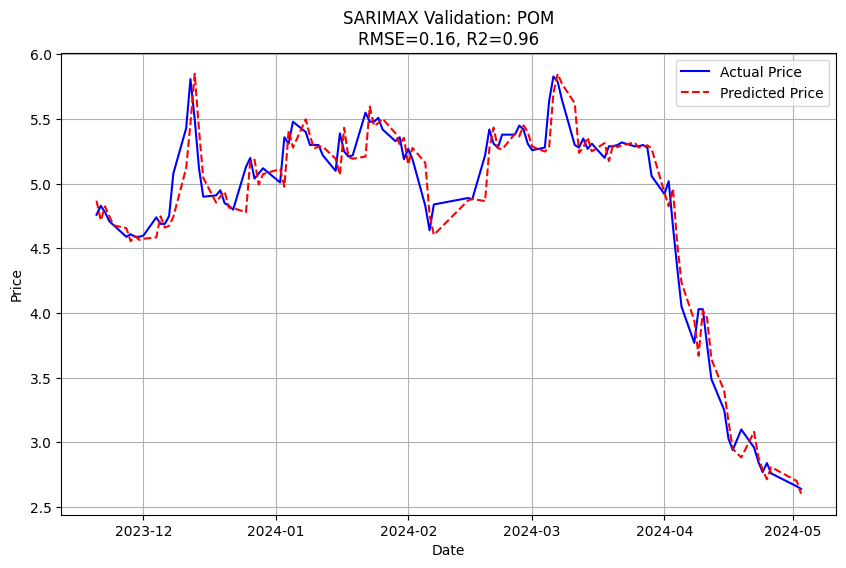


Performing Test Set Prediction...

--- TEST RESULTS (POM) ---
RMSE: 0.2006
MAE: 0.1264
R2 Score: 0.8811


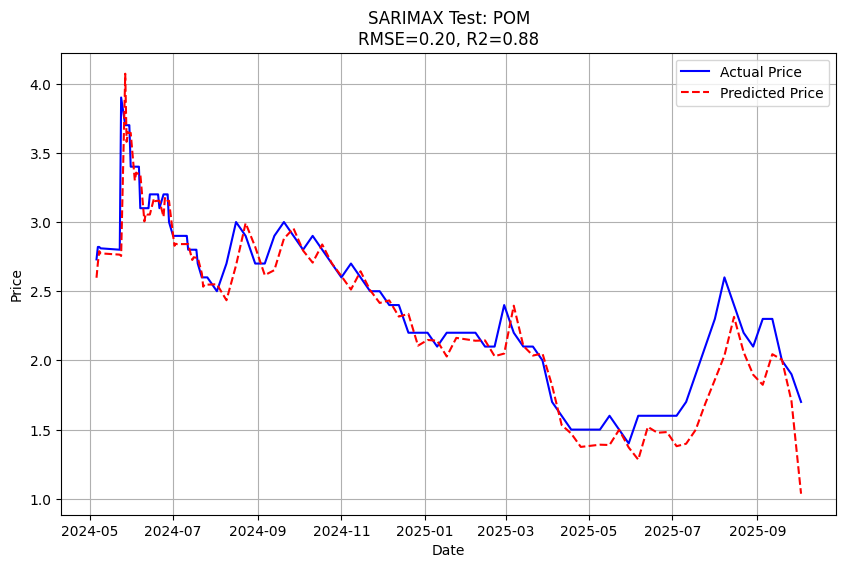


Forecasting 5 future steps...


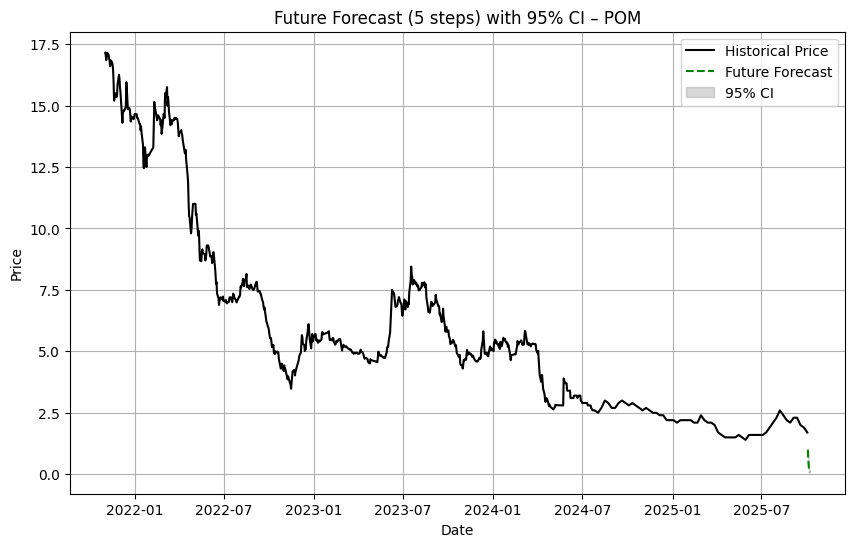


Future price forecast (first 10 rows):
        date  forecast_price  lower_95  upper_95
0 2025-10-04        0.994497  0.941718  1.050233
1 2025-10-05        0.534360  0.478742  0.596439
2 2025-10-06        0.285965  0.242398  0.337361
3 2025-10-07        0.153260  0.122912  0.191101
4 2025-10-08        0.082168  0.062348  0.108290


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings('ignore')

def run_sarimax_custom(filepath='synchronized_data.csv', stock_id='POM'):
    # 1. Load Data
    df = pd.read_csv(filepath)
    df['date'] = pd.to_datetime(df['date'])
    df = df[df['stock_id'] == stock_id].sort_values('date').reset_index(drop=True)

    # 2. Preprocessing
    # Log close
    df['log_close'] = np.log(df['close'])

    # Differencing (Data đã sai phân)
    df['diff_log_close'] = df['log_close'].diff()

    # Exogenous variables
    exog_cols = ['roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']
    # exog_cols = ['interest', 'gdp_growth', 'rebar_price', 'exchange_rate']

    # Drop NaN created by differencing (first row)
    df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

    # 3. Split Data (70% Train, 15% Val, 15% Test)
    n = len(df_clean)
    train_end = int(n * 0.70)
    val_end = int(n * 0.85)

    train_df = df_clean.iloc[:train_end]
    val_df = df_clean.iloc[train_end:val_end]
    test_df = df_clean.iloc[val_end:]

    # Prepare Endog and Exog
    y_train = train_df['diff_log_close']
    y_val = val_df['diff_log_close']
    y_test = test_df['diff_log_close']

    X_train = train_df[exog_cols]
    X_val = val_df[exog_cols]
    X_test = test_df[exog_cols]

    # Scale Exog
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=exog_cols, index=X_train.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=exog_cols, index=X_val.index)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=exog_cols, index=X_test.index)

    # 4. Grid Search for Order (Simple Fallback)
    # We use d=0 because data is already differenced
    best_aic = np.inf
    best_order = (1, 0, 1) # Default

    print("Starting Grid Search for ARIMA Order (p, 1, q)...")
    for p in range(3):
        for q in range(3):
            try:
                model = SARIMAX(y_train, exog=X_train_scaled, order=(p, 1, q),
                                enforce_stationarity=False, enforce_invertibility=False)
                res = model.fit(disp=False)
                if res.aic < best_aic:
                    best_aic = res.aic
                    best_order = (p, 1, q)
            except:
                continue

    print(f"Best Order Found: {best_order} with AIC: {best_aic:.2f}")

    # 5. Fit Best Model on Train
    final_model = SARIMAX(y_train, exog=X_train_scaled, order=best_order,
                          enforce_stationarity=False, enforce_invertibility=False)
    res_fitted = final_model.fit(disp=False)

    # 6. Validation (Rolling Forecast)
    # Since we model differences, prediction is Diff_Log_Price
    # We will do 1-step ahead forecast for the validation set using actual history

    print("Performing rolling forecast on Validation Set...")
    val_preds_diff = []

    # History starts with training data
    history_endog = list(y_train)
    history_exog = list(X_train_scaled.values)

    # We loop through validation set
    # Optimally, we would re-fit, but for speed we just filter/predict using updated history or just use the model object
    # For statsmodels, we can use 'append' or just re-create model.
    # To save time in this environment, we'll use the fixed parameters from training and just apply to new data (filter method)
    # Or simpler: Use predict with dynamic=False if we pass the whole series?
    # No, strictly rolling means using info up to t-1.
    # Statsmodels .predict(start, end, exog) uses the data in 'endog' attached to the model for lags.
    # So we need to extend the model results.

    # Efficient way: create a model with (train + val), set params, then predict validation part
    full_exog = pd.concat([X_train_scaled, X_val_scaled])
    full_endog = pd.concat([y_train, y_val])

    # Re-setup model with full data but fixed params
    model_val = SARIMAX(full_endog, exog=full_exog, order=best_order,
                        enforce_stationarity=False, enforce_invertibility=False)
    res_val = model_val.filter(res_fitted.params) # Apply trained params to new data

    # Predict for the validation indices
    # Indices in statsmodels are 0-based. Train ends at len(y_train)-1.
    # Val starts at len(y_train).
    val_start = len(y_train)
    val_end_idx = len(y_train) + len(y_val) - 1

    pred_res = res_val.get_prediction(start=val_start, end=val_end_idx, exog=X_val_scaled)
    pred_diff = pred_res.predicted_mean

    # 7. Reconstruct Prices
    # Actual previous log close is needed.
    # The 'diff_log_close' at time t is log(P_t) - log(P_{t-1})
    # So log(P_t)_pred = log(P_{t-1})_actual + diff_pred_t
    # We need the vector of "previous log prices" corresponding to validation set.

    # Get log_close from original df_clean
    # The validation part corresponds to indices in df_clean: train_end to val_end-1
    # We need lag-1 log_close.
    # df_clean['log_close'] indices: 0..N-1
    # Validation indices: train_end ... val_end-1
    # Previous values indices: train_end-1 ... val_end-2

    prev_log_close = df_clean.iloc[train_end-1 : val_end-1]['log_close'].values

    # Reconstruct
    pred_log_close = prev_log_close + pred_diff.values
    pred_price = np.exp(pred_log_close)

    # Actual prices for validation
    actual_price = df_clean.iloc[train_end : val_end]['close'].values
    actual_dates = df_clean.iloc[train_end : val_end]['date'].values

    # 8. Evaluation
    rmse = np.sqrt(mean_squared_error(actual_price, pred_price))
    mae = mean_absolute_error(actual_price, pred_price)
    r2 = r2_score(actual_price, pred_price)

    print(f"\n--- Validation Results ({stock_id}) ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R2 Score: {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates, actual_price, label='Actual Price', color='blue')
    plt.plot(actual_dates, pred_price, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Validation: {stock_id}\nRMSE={rmse:.2f}, R2={r2:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)

    plt.show()

 # ============================
    # 9. TEST SET PREDICTION
    # ============================

    print("\nPerforming Test Set Prediction...")

    # Build full data (train + val + test)
    full_exog_2 = pd.concat([X_train_scaled, X_val_scaled, X_test_scaled])
    full_endog_2 = pd.concat([y_train, y_val, y_test])

    # Re-setup model for (train+val+test) and apply trained params
    model_test = SARIMAX(full_endog_2, exog=full_exog_2, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_test = model_test.filter(res_fitted.params)

    # Test index range
    test_start = len(y_train) + len(y_val)
    test_end_idx = len(full_endog_2) - 1

    pred_test_res = res_test.get_prediction(start=test_start, end=test_end_idx, exog=X_test_scaled)
    pred_test_diff = pred_test_res.predicted_mean

    # ========== Reconstruct Price on TEST ==========
    # diff_log_close(t) = logP(t) - logP(t-1)
    # → logP_pred(t) = logP_actual(t-1) + diff_pred(t)

    prev_log_close_test = df_clean.iloc[val_end-1 : ].iloc[:-1]['log_close'].values

    pred_log_close_test = prev_log_close_test + pred_test_diff.values
    pred_price_test = np.exp(pred_log_close_test)

    # Actual prices
    actual_price_test = df_clean.iloc[val_end : ]['close'].values
    actual_dates_test = df_clean.iloc[val_end : ]['date'].values

    # Evaluation
    rmse_test = np.sqrt(mean_squared_error(actual_price_test, pred_price_test))
    mae_test = mean_absolute_error(actual_price_test, pred_price_test)
    r2_test = r2_score(actual_price_test, pred_price_test)

    print(f"\n--- TEST RESULTS ({stock_id}) ---")
    print(f"RMSE: {rmse_test:.4f}")
    print(f"MAE: {mae_test:.4f}")
    print(f"R2 Score: {r2_test:.4f}")

    # Plot Test
    plt.figure(figsize=(10, 6))
    plt.plot(actual_dates_test, actual_price_test, label='Actual Price', color='blue')
    plt.plot(actual_dates_test, pred_price_test, label='Predicted Price', color='red', linestyle='--')
    plt.title(f'SARIMAX Test: {stock_id}\nRMSE={rmse_test:.2f}, R2={r2_test:.2f}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()


    # ================================
    # 10. FUTURE FORECAST + CI
    # ================================
    future_steps = 5  # Bạn có thể thay đổi

    print(f"\nForecasting {future_steps} future steps...")

    # Ta dùng toàn bộ dữ liệu train + val + test đã lọc bằng params
    model_future = SARIMAX(full_endog_2, exog=full_exog_2,
                           order=best_order,
                           enforce_stationarity=False,
                           enforce_invertibility=False)

    res_future = model_future.filter(res_fitted.params)

    # Future exog
    # ---------
    # Bạn có 2 lựa chọn:
    # 1. Nếu exog không có forecast → dùng giá trị cuối cùng lặp lại
    # 2. Nếu bạn có model cho exog → cung cấp dự báo vào biến future_exog
    #
    # Ở đây ta dùng cách 1 cho đơn giản.

    last_exog_row = X_test_scaled.iloc[-1].values.reshape(1, -1)
    future_exog = np.repeat(last_exog_row, future_steps, axis=0)

    # Prediction
    future_pred_res = res_future.get_forecast(steps=future_steps, exog=future_exog)

    # Mean diff forecast
    future_diff = future_pred_res.predicted_mean.values

    # Confidence intervals (diff)
    future_ci = future_pred_res.conf_int().values
    future_diff_lower = future_ci[:, 0]
    future_diff_upper = future_ci[:, 1]

    # ==================================
    # Khôi phục giá tương lai (price)
    # ==================================

    # Lấy log-price cuối cùng từ df_clean
    last_log_price = df_clean.iloc[-1]['log_close']

    future_log_price = []
    future_log_price_lower = []
    future_log_price_upper = []

    cur_log = last_log_price
    cur_log_low = last_log_price
    cur_log_up = last_log_price

    for i in range(future_steps):
        cur_log = cur_log + future_diff[i]
        cur_log_low = cur_log_low + future_diff_lower[i]
        cur_log_up = cur_log_up + future_diff_upper[i]

        future_log_price.append(cur_log)
        future_log_price_lower.append(cur_log_low)
        future_log_price_upper.append(cur_log_up)

    future_price = np.exp(future_log_price)
    future_price_lower = np.exp(future_log_price_lower)
    future_price_upper = np.exp(future_log_price_upper)

    # Tạo mốc thời gian
    last_date = df_clean.iloc[-1]['date']
    future_dates = pd.date_range(start=last_date, periods=future_steps + 1, freq='D')[1:]

    # Plot Future Forecast
    plt.figure(figsize=(10, 6))

    # Giá thật giai đoạn cuối để đối chiếu
    plt.plot(df_clean['date'], df_clean['close'], color='black', label='Historical Price')

    # Forecast price
    plt.plot(future_dates, future_price, color='green', linestyle='--', label='Future Forecast')

    # CI band
    plt.fill_between(future_dates, future_price_lower, future_price_upper,
                     color='gray', alpha=0.3, label='95% CI')

    plt.title(f'Future Forecast ({future_steps} steps) with 95% CI – {stock_id}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\nFuture price forecast (first 10 rows):")
    future_df = pd.DataFrame({
        'date': future_dates,
        'forecast_price': future_price,
        'lower_95': future_price_lower,
        'upper_95': future_price_upper
    })
    print(future_df.head(10))

    return actual_price_test, pred_price_test

actual_price_test, pred_price_test = run_sarimax_custom()


Residual Summary Statistics:
count    111.000000
mean       0.086075
std        0.182004
min       -0.371799
25%        0.003837
50%        0.056784
75%        0.120260
max        1.145142
dtype: float64


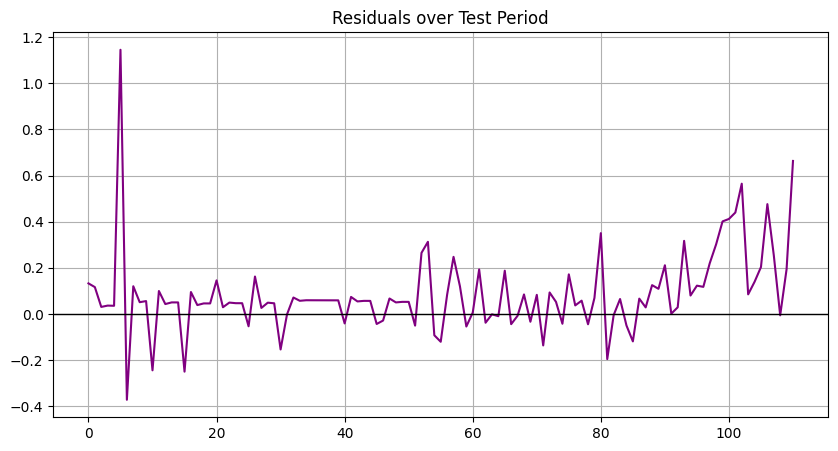

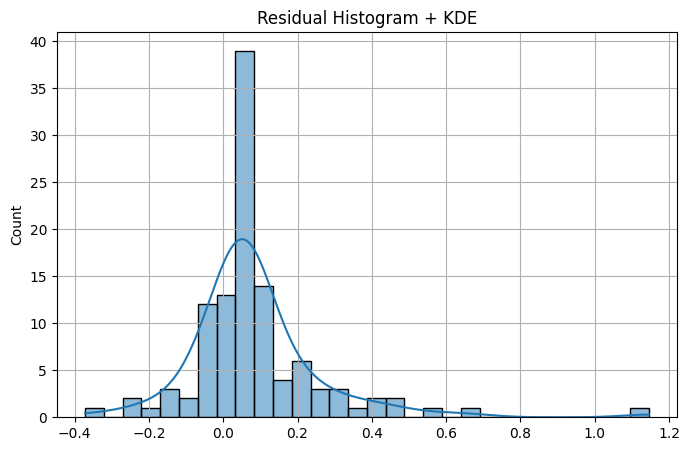

<Figure size 600x600 with 0 Axes>

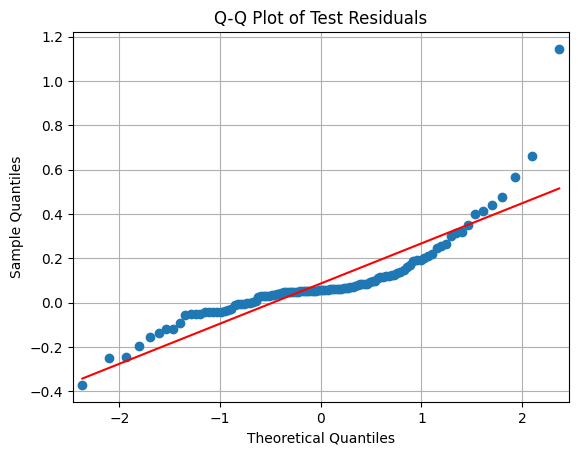

<Figure size 1000x400 with 0 Axes>

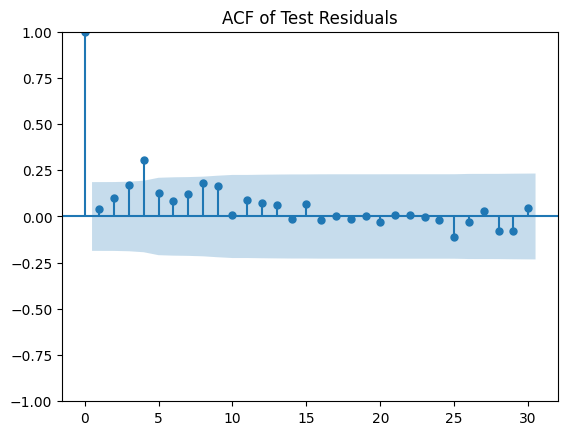

<Figure size 1000x400 with 0 Axes>

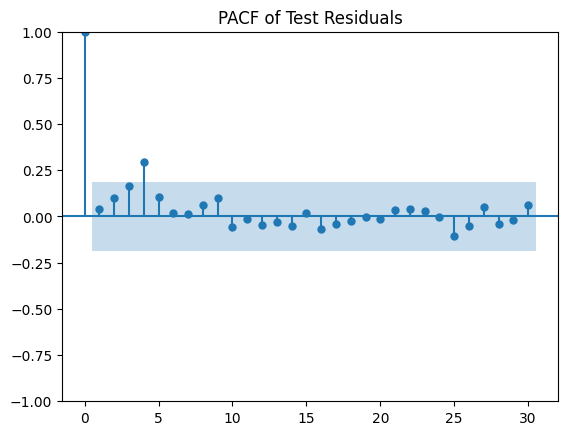


Ljung–Box Test Results:
      lb_stat  lb_pvalue
10  27.358613   0.002285
20  30.371296   0.064057
30  34.597531   0.257579

Shapiro–Wilk Normality Test: Statistic=0.8077, p-value=0.0000

Durbin–Watson Statistic: 1.4882


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import shapiro

# ======================================================
# 1. TÍNH RESIDUALS
# ======================================================
residuals_test = actual_price_test - pred_price_test

print("Residual Summary Statistics:")
print(pd.Series(residuals_test).describe())

# ======================================================
# 2. RESIDUALS PLOT
# ======================================================
plt.figure(figsize=(10, 5))
plt.plot(residuals_test, color='purple')
plt.axhline(0, color='black', linewidth=1)
plt.title("Residuals over Test Period")
plt.grid(True)
plt.show()

# ======================================================
# 3. HISTOGRAM + KDE
# ======================================================
plt.figure(figsize=(8, 5))
sns.histplot(residuals_test, bins=30, kde=True)
plt.title("Residual Histogram + KDE")
plt.grid(True)
plt.show()

# ======================================================
# 4. Q-Q PLOT
# ======================================================
plt.figure(figsize=(6, 6))
qqplot(residuals_test, line='s')
plt.title("Q-Q Plot of Test Residuals")
plt.grid(True)
plt.show()

# ======================================================
# 5. ACF & PACF OF RESIDUALS
# ======================================================
plt.figure(figsize=(10, 4))
plot_acf(residuals_test, lags=30)
plt.title("ACF of Test Residuals")
plt.show()

plt.figure(figsize=(10, 4))
plot_pacf(residuals_test, lags=30, method='ywm')
plt.title("PACF of Test Residuals")
plt.show()

# ======================================================
# 6. LJUNG–BOX TEST (Autocorrelation Check)
# ======================================================
lb_test = acorr_ljungbox(residuals_test, lags=[10, 20, 30], return_df=True)
print("\nLjung–Box Test Results:")
print(lb_test)

# ======================================================
# 7. NORMALITY TEST (Shapiro–Wilk)
# ======================================================
sh_stat, sh_p = shapiro(residuals_test)
print(f"\nShapiro–Wilk Normality Test: Statistic={sh_stat:.4f}, p-value={sh_p:.4f}")

# ======================================================
# 8. DURBIN–WATSON (Autocorrelation Test)
# ======================================================
dw = durbin_watson(residuals_test)
print(f"\nDurbin–Watson Statistic: {dw:.4f}")


Training Initial Model (SARIMAX(2, 1, 1)) on History...

Running 3-Step Rolling Forecast on Test Set...
Progress: ..... Done!

--- 3-Step Forecast Evaluation ---
T+1 Forecast -> RMSE: 0.21 | MAE: 0.14 | MAPE: 5.83%
T+2 Forecast -> RMSE: 0.36 | MAE: 0.25 | MAPE: 10.66%
T+3 Forecast -> RMSE: 0.49 | MAE: 0.35 | MAPE: 14.91%


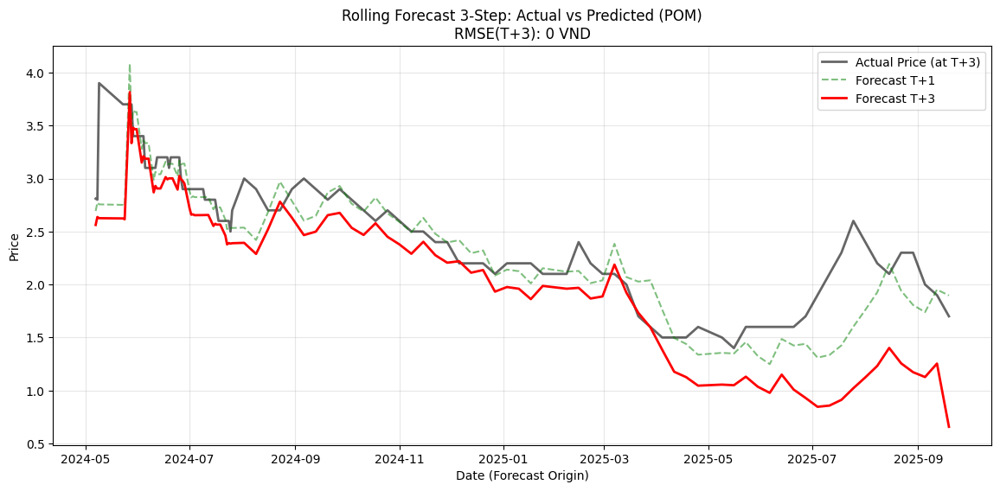

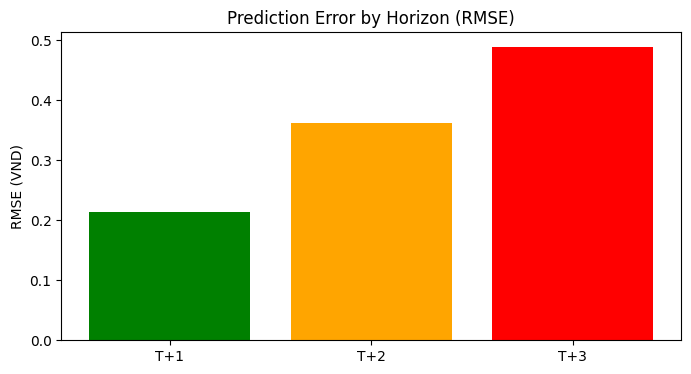

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------------------------------------------
# 1. CHUẨN BỊ DỮ LIỆU
# --------------------------------------------------------------------------------
# Load và xử lý dữ liệu
df = pd.read_csv('synchronized_data.csv')
df['date'] = pd.to_datetime(df['date'])
df = df[df['stock_id'] == 'POM'].sort_values('date').reset_index(drop=True)

# Feature Engineering
df['log_close'] = np.log(df['close'])
df['diff_log_close'] = df['log_close'].diff()

# Biến ngoại sinh
exog_cols = ['roe', 'quick_ratio', 'exchange_rate', 'roa', 'fdi', 'export', 'coke_price']
df_clean = df.dropna(subset=['diff_log_close']).reset_index(drop=True)

# Chia tập dữ liệu (Giữ nguyên tỷ lệ cũ hoặc tùy chỉnh)
n = len(df_clean)
test_size = int(n * 0.15)
train_val_end = n - test_size

# Tách Feature và Target
y = df_clean['diff_log_close']
X = df_clean[exog_cols]

# Scale dữ liệu (Fit trên Train, Transform trên toàn bộ để tránh look-ahead bias)
scaler = StandardScaler()
scaler.fit(X.iloc[:train_val_end]) # Chỉ fit trên quá khứ
X_scaled = pd.DataFrame(scaler.transform(X), columns=exog_cols, index=X.index)

# --------------------------------------------------------------------------------
# 2. KHỞI TẠO VÀ TRAIN MÔ HÌNH BAN ĐẦU
# --------------------------------------------------------------------------------
# Sử dụng tham số tốt nhất từ bước trước (ví dụ: order=(0,1,1) trên dữ liệu diff)
# Lưu ý: Nếu dữ liệu diff đã dừng, thường d=0. Nhưng ta tôn trọng kết quả Grid Search trước đó.
best_order = (2, 1, 1)

print(f"Training Initial Model (SARIMAX{best_order}) on History...")
# Train trên tập Train+Val ban đầu
model_init = SARIMAX(y.iloc[:train_val_end],
                     exog=X_scaled.iloc[:train_val_end],
                     order=best_order,
                     enforce_stationarity=False,
                     enforce_invertibility=False)
results_init = model_init.fit(disp=False)
fixed_params = results_init.params # Lưu lại tham số để dùng cho filter (giúp chạy nhanh)

# --------------------------------------------------------------------------------
# 3. THỰC HIỆN ROLLING FORECAST 3-STEP
# --------------------------------------------------------------------------------
print("\nRunning 3-Step Rolling Forecast on Test Set...")
print("Progress: ", end="")

horizon = 3 # Dự báo 3 bước
predictions_h1 = [] # T+1
predictions_h2 = [] # T+2
predictions_h3 = [] # T+3
actuals_h1 = []
actuals_h2 = []
actuals_h3 = []
dates_h1 = []

# Vòng lặp cuốn chiếu (Rolling Window)
# Chúng ta sẽ đi từ điểm bắt đầu Test đến (Hết Test - Horizon)
for i in range(train_val_end, n - horizon + 1):
    if i % 20 == 0: print(".", end="") # Progress bar

    # 1. Lấy dữ liệu lịch sử đến thời điểm i (History)
    # Để tối ưu tốc độ, ta không fit lại mà dùng 'filter' với tham số đã học
    # Ta dựng model với dữ liệu từ đầu đến i
    curr_y = y.iloc[:i]
    curr_X = X_scaled.iloc[:i]

    model_curr = SARIMAX(curr_y, exog=curr_X, order=best_order,
                         enforce_stationarity=False, enforce_invertibility=False)
    res_curr = model_curr.filter(fixed_params) # Apply params cũ

    # 2. Lấy biến ngoại sinh cho 3 ngày tới (Future Exog)
    # Ở đây ta dùng Exog thực tế (Perfect Foresight cho biến X) để test sức mạnh model ARIMA
    # Trong thực tế trading, bạn sẽ phải dự báo X hoặc dùng giá trị X ngày i
    exog_future = X_scaled.iloc[i : i+horizon]

    # 3. Dự báo
    forecast = res_curr.get_forecast(steps=horizon, exog=exog_future)
    pred_diff = forecast.predicted_mean.values # Kết quả dạng sai phân log

    # 4. Khôi phục về giá gốc (Reconstruct Price)
    # Giá dự báo T+1 = Giá thực T + Diff(T+1)
    # Giá dự báo T+2 = Giá dự báo T+1 + Diff(T+2)
    last_real_log_price = df_clean.iloc[i-1]['log_close']

    pred_log_h1 = last_real_log_price + pred_diff[0]
    pred_log_h2 = pred_log_h1 + pred_diff[1]
    pred_log_h3 = pred_log_h2 + pred_diff[2]

    # Lưu kết quả (Convert Log -> Price)
    predictions_h1.append(np.exp(pred_log_h1))
    predictions_h2.append(np.exp(pred_log_h2))
    predictions_h3.append(np.exp(pred_log_h3))

    # Lưu giá thực tế tương ứng để so sánh
    actuals_h1.append(df_clean.iloc[i]['close'])
    actuals_h2.append(df_clean.iloc[i+1]['close'])
    actuals_h3.append(df_clean.iloc[i+2]['close'])

    dates_h1.append(df_clean.iloc[i]['date'])

print(" Done!")

# --------------------------------------------------------------------------------
# 4. ĐÁNH GIÁ HIỆU SUẤT THEO HORIZON
# --------------------------------------------------------------------------------
def evaluate(true, pred, label):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    mape = np.mean(np.abs((np.array(true) - np.array(pred)) / np.array(true))) * 100
    print(f"{label} -> RMSE: {rmse:.2f} | MAE: {mae:.2f} | MAPE: {mape:.2f}%")
    return rmse

print("\n--- 3-Step Forecast Evaluation ---")
rmse_h1 = evaluate(actuals_h1, predictions_h1, "T+1 Forecast")
rmse_h2 = evaluate(actuals_h2, predictions_h2, "T+2 Forecast")
rmse_h3 = evaluate(actuals_h3, predictions_h3, "T+3 Forecast")

# --------------------------------------------------------------------------------
# 5. TRỰC QUAN HÓA (PLOT)
# --------------------------------------------------------------------------------
# Vẽ biểu đồ so sánh cho T+3 (thường là cái khó nhất và quan trọng cho trading T+2.5)
plt.figure(figsize=(14, 6))
# Vẽ giá thực tế
plt.plot(dates_h1, actuals_h3, label='Actual Price (at T+3)', color='black', alpha=0.6, linewidth=2)
# Vẽ dự báo
plt.plot(dates_h1, predictions_h1, label='Forecast T+1', color='green', linestyle='--', alpha=0.5)
plt.plot(dates_h1, predictions_h3, label='Forecast T+3', color='red', linewidth=2)

plt.title(f'Rolling Forecast 3-Step: Actual vs Predicted (POM)\nRMSE(T+3): {rmse_h3:.0f} VND')
plt.xlabel('Date (Forecast Origin)')
plt.ylabel('Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Vẽ biểu đồ sai số theo các bước (Error decadence)
horizons = ['T+1', 'T+2', 'T+3']
rmses = [rmse_h1, rmse_h2, rmse_h3]
plt.figure(figsize=(8, 4))
plt.bar(horizons, rmses, color=['green', 'orange', 'red'])
plt.title('Prediction Error by Horizon (RMSE)')
plt.ylabel('RMSE (VND)')
plt.show()

**TVN**

Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:
SVR: R2 (VAL) = 0.8157 | Best Params: {'kernel': 'rbf', 'gamma': 0.001, 'epsilon': 0.001, 'C': 100}


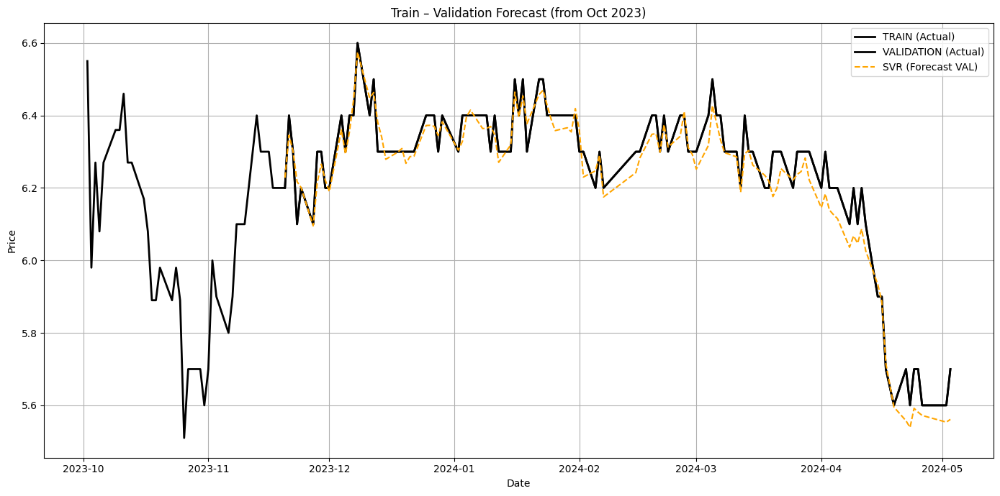

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# 1. Load & Preprocess Data
df = pd.read_csv('synchronized_data.csv')
data = df[df['stock_id'] == 'TVN'].copy()
data['date'] = pd.to_datetime(data['date'])
data = data.sort_values('date').reset_index(drop=True)

# Features & Target
data['log_close'] = np.log(data['close'])
data['log_volume'] = np.log(data['volume'])
data['target_log'] = np.log(data['close']).shift(-1)

lags = 3
for i in range(lags):
    data[f'log_close_lag_{i}'] = data['log_close'].shift(i)
    data[f'log_volume_lag_{i}'] = data['log_volume'].shift(i)

features = [f'log_close_lag_{i}' for i in range(lags)] + \
           [f'log_volume_lag_{i}' for i in range(lags)] + \
           ['exchange_rate', 'roa', 'roe', 'interest', 'export', 'iron_powder_price', 'log_rebar_price']

data_clean = data.dropna().reset_index(drop=True)

# 2. Split Data into Train / Val / Test
n = len(data_clean)
train_end = int(n * 0.70)          # 70% train
val_end = int(n * 0.85)            # 15% val, 15% test

X_train = data_clean.iloc[:train_end][features].values
y_train = data_clean.iloc[:train_end]['target_log'].values

X_val = data_clean.iloc[train_end:val_end][features].values
y_val = data_clean.iloc[train_end:val_end]['target_log'].values

X_test = data_clean.iloc[val_end:][features].values
y_test = data_clean.iloc[val_end:]['target_log'].values

# 3. Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# 4. Hyperparameter Tuning using only TRAIN (TimeSeriesSplit)
tscv = TimeSeriesSplit(n_splits=3)

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

gb_params = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

svr_params = {
    'C': [0.1, 1, 10, 100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'epsilon': [0.001, 0.01, 0.1],
    'kernel': ['rbf']
}

models = [('SVR', SVR(), svr_params)]

print("Kết quả đánh giá mô hình tối ưu trên tập VALIDATION:")
for name, model, params in models:

    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    r2_val = r2_score(np.exp(y_val), np.exp(pred_val_log))

    print(f"{name}: R2 (VAL) = {r2_val:.4f} | Best Params: {search.best_params_}")

# --------------------------
#  TRỰC QUAN HÓA TRAIN – VAL
# --------------------------

plot_df = data_clean[['date', 'close']].copy()
predictions_val = {}

for name, model, params in models:
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )

    search.fit(X_train_scaled, y_train)
    best_model = search.best_estimator_

    pred_val_log = best_model.predict(X_val_scaled)
    pred_val = np.exp(pred_val_log)

    predictions_val[name] = pred_val


# Biểu đồ 2: Chỉ từ 10/2023
start_date = pd.Timestamp("2023-10-01")
mask = plot_df['date'] >= start_date

# ---------------------------------------
# TÙY CHỈNH MÀU CHO TỪNG ĐƯỜNG
# ---------------------------------------
color_map = {
    'TRAIN': 'black',
    'VAL': 'black',
    'Random Forest': 'red',
    'Gradient Boosting': 'green',
    'SVR': 'orange'
}
# ---------------------------------------

plt.figure(figsize=(14, 7))

# TRAIN (Actual)
plt.plot(
    plot_df['date'][:val_end][mask[:val_end]],
    plot_df['close'][:val_end][mask[:val_end]],
    label='TRAIN (Actual)',
    linewidth=2,
    color=color_map['TRAIN']
)

# VALIDATION (Actual)
plt.plot(
    plot_df['date'][train_end:val_end][mask[train_end:val_end]],
    plot_df['close'][train_end:val_end][mask[train_end:val_end]],
    label='VALIDATION (Actual)',
    linewidth=2,
    color=color_map['VAL']
)

# FORECASTS for each model
for name, pred_val in predictions_val.items():
    plt.plot(
        plot_df['date'][train_end:val_end][mask[train_end:val_end]],
        pred_val[mask[train_end:val_end]],
        linestyle='--',
        label=f'{name} (Forecast VAL)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Train – Validation Forecast (from Oct 2023)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



=== ĐÁNH GIÁ MÔ HÌNH TRÊN TEST ===
SVR:  MSE=0.3157 | MAE=0.4372 | R2=0.8286


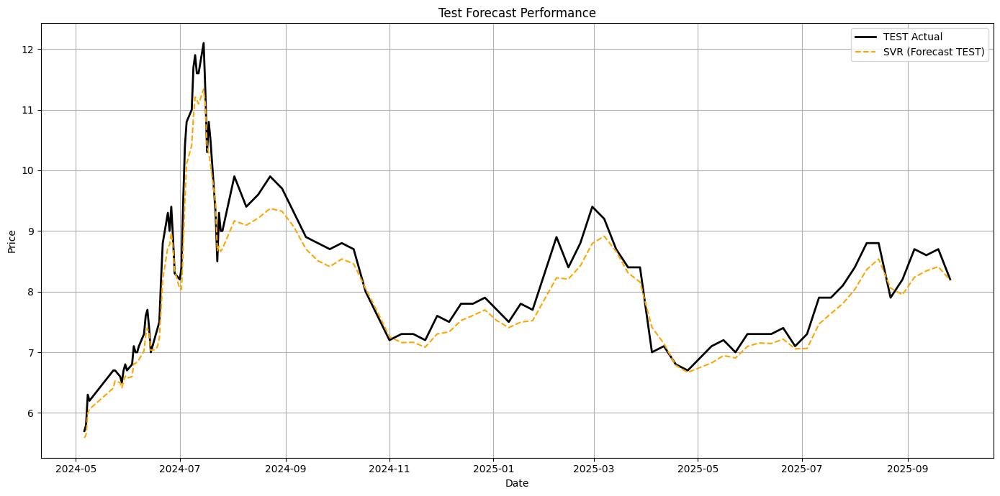

In [ ]:
# ================================
# 5. ĐÁNH GIÁ MÔ HÌNH TRÊN TẬP TEST
# ================================

print("\n=== ĐÁNH GIÁ MÔ HÌNH TRÊN TEST ===")

results_test = {}
predictions_test = {}

# Gộp TRAIN + VAL để train lại mô hình tối ưu
X_trainval_scaled = scaler.fit_transform(
    np.vstack([X_train, X_val])
)
y_trainval = np.concatenate([y_train, y_val])

for name, model, params in models:

    # Tuning lại để lấy best params (như train ban đầu)
    search = RandomizedSearchCV(
        model,
        params,
        n_iter=20,
        cv=tscv,
        scoring='neg_mean_squared_error',
        random_state=42,
        n_jobs=-1
    )
    search.fit(X_train_scaled, y_train)

    best_model = search.best_estimator_

    # Train best model trên toàn bộ TRAIN+VAL
    best_model.fit(X_trainval_scaled, y_trainval)

    # Predict TEST
    pred_test_log = best_model.predict(X_test_scaled)
    pred_test = np.exp(pred_test_log)

    # Metrics (so sánh về giá thực tế)
    mse = mean_squared_error(np.exp(y_test), pred_test)
    mae = mean_absolute_error(np.exp(y_test), pred_test)
    r2 = r2_score(np.exp(y_test), pred_test)

    results_test[name] = (mse, mae, r2)
    predictions_test[name] = pred_test

    print(f"{name}:  MSE={mse:.4f} | MAE={mae:.4f} | R2={r2:.4f}")


# ================================
# 6. TRỰC QUAN HÓA TEST FORECAST
# ================================

plt.figure(figsize=(14, 7))

# Actual TEST
plt.plot(
    plot_df['date'][val_end:],
    plot_df['close'][val_end:],
    label='TEST Actual',
    linewidth=2,
    color='black'
)

# Forecast TEST
for name, pred in predictions_test.items():
    plt.plot(
        plot_df['date'][val_end:],
        pred,
        linestyle='--',
        label=f'{name} (Forecast TEST)',
        color=color_map[name] if name in color_map else None
    )

plt.title("Test Forecast Performance")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



=== FULL RESIDUAL ANALYSIS ON TEST SET ===

SVR:
  Mean Residual     : 0.2806
  Std Residual      : 0.4867


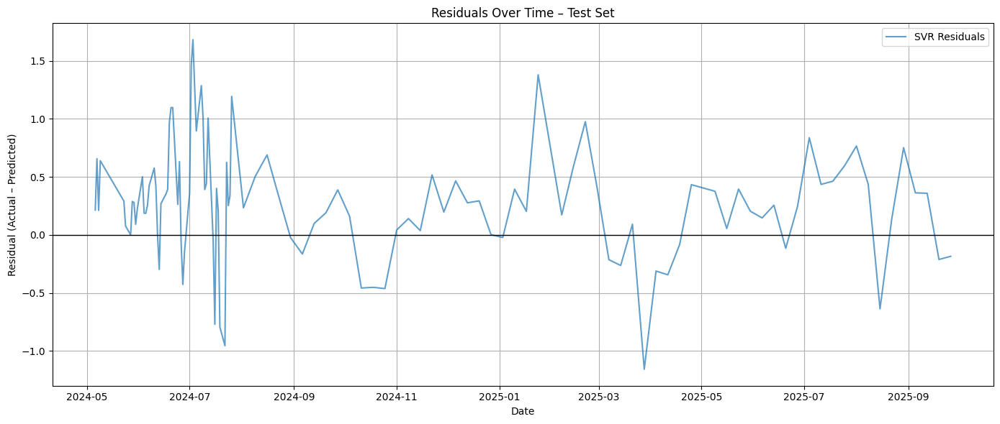

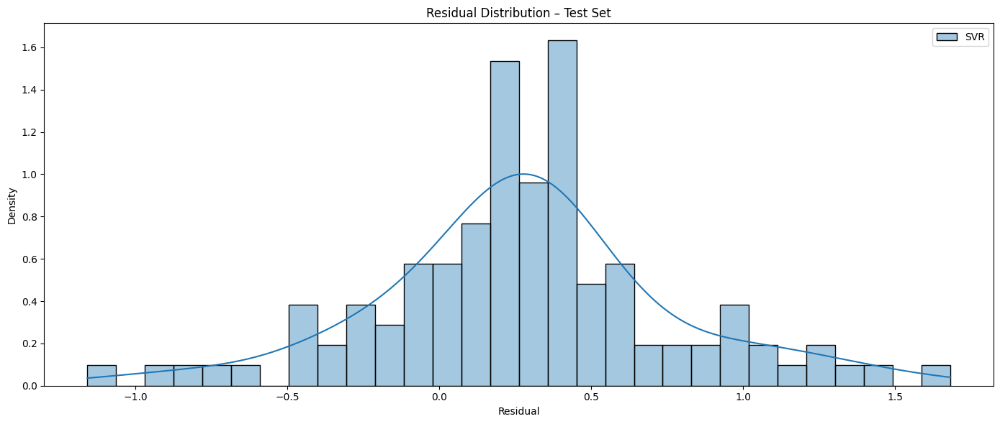

<Figure size 600x600 with 0 Axes>

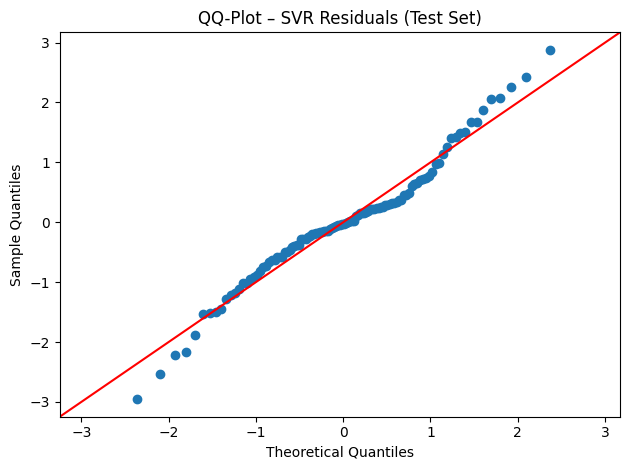


=== DURBIN–WATSON TEST ===
SVR: Durbin–Watson = 0.7813

=== LJUNG–BOX AUTOCORRELATION TEST ===
SVR: LB Statistic=43.2564, p-value=0.0000


In [ ]:
# ================================
# 7. FULL RESIDUAL ANALYSIS – TEST SET
# ================================

import seaborn as sns
from scipy import stats
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import acorr_ljungbox
import statsmodels.api as sm

print("\n=== FULL RESIDUAL ANALYSIS ON TEST SET ===")

residuals_test = {}

# Actual giá thật trên TEST
actual_test = np.exp(y_test)

for name, pred in predictions_test.items():
    residual = actual_test - pred
    residuals_test[name] = residual
    print(f"\n{name}:")
    print(f"  Mean Residual     : {np.mean(residual):.4f}")
    print(f"  Std Residual      : {np.std(residual):.4f}")

# ---------------------------------
# 7.1 Residuals Over Time
# ---------------------------------
plt.figure(figsize=(14, 6))

for name, res in residuals_test.items():
    plt.plot(
        plot_df['date'][val_end:],
        res,
        label=f"{name} Residuals",
        alpha=0.7
    )

plt.axhline(0, color='black', linewidth=1)
plt.title("Residuals Over Time – Test Set")
plt.xlabel("Date")
plt.ylabel("Residual (Actual – Predicted)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# ---------------------------------
# 7.2 Residual Distribution
# ---------------------------------
plt.figure(figsize=(14, 6))

for name, res in residuals_test.items():
    sns.histplot(res, kde=True, bins=30, stat="density", label=name, alpha=0.4)

plt.title("Residual Distribution – Test Set")
plt.xlabel("Residual")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

# ---------------------------------
# 7.3 QQ-PLOT (Normality Check)
# ---------------------------------

for name, res in residuals_test.items():
    plt.figure(figsize=(6, 6))
    sm.qqplot(res, line='45', fit=True)
    plt.title(f"QQ-Plot – {name} Residuals (Test Set)")
    plt.tight_layout()
    plt.show()

# ---------------------------------
# 7.4 Durbin–Watson Test (Autocorrelation)
# ---------------------------------
print("\n=== DURBIN–WATSON TEST ===")
for name, res in residuals_test.items():
    dw = durbin_watson(res)
    print(f"{name}: Durbin–Watson = {dw:.4f}")

# ---------------------------------
# 7.5 Ljung–Box Test (Autocorrelation)
# ---------------------------------
print("\n=== LJUNG–BOX AUTOCORRELATION TEST ===")
for name, res in residuals_test.items():
    lb_test = acorr_ljungbox(res, lags=[10], return_df=True)
    pval = lb_test['lb_pvalue'].iloc[0]
    stat = lb_test['lb_stat'].iloc[0]
    print(f"{name}: LB Statistic={stat:.4f}, p-value={pval:.4f}")



=== BACKTESTING – FULL 3-STEP AHEAD FORECAST ===

=== ROLLING FORECAST PERFORMANCE (PER HORIZON) ===

---- SVR ----
Horizon t+1:  MSE=0.4034 | MAE=0.4900 | R2=0.7867
Horizon t+2:  MSE=0.4803 | MAE=0.5296 | R2=0.7381
Horizon t+3:  MSE=0.5451 | MAE=0.5586 | R2=0.6964


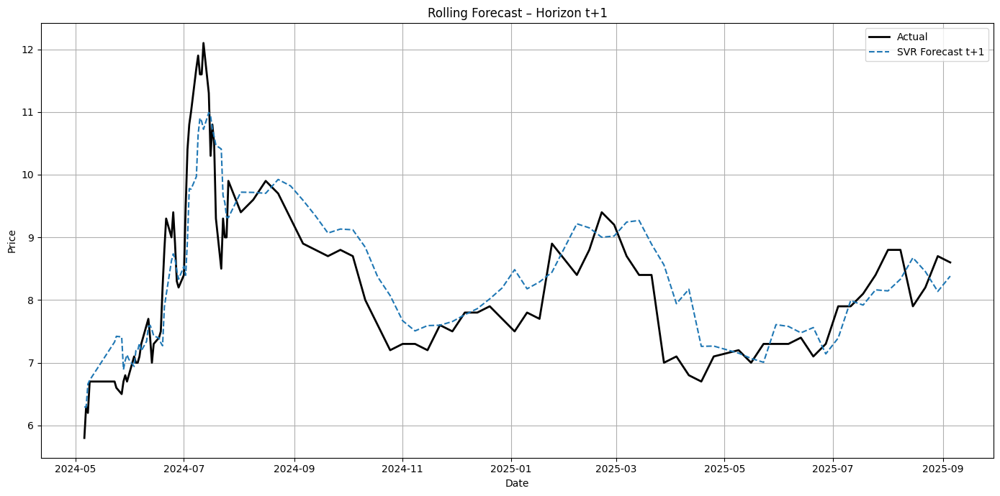

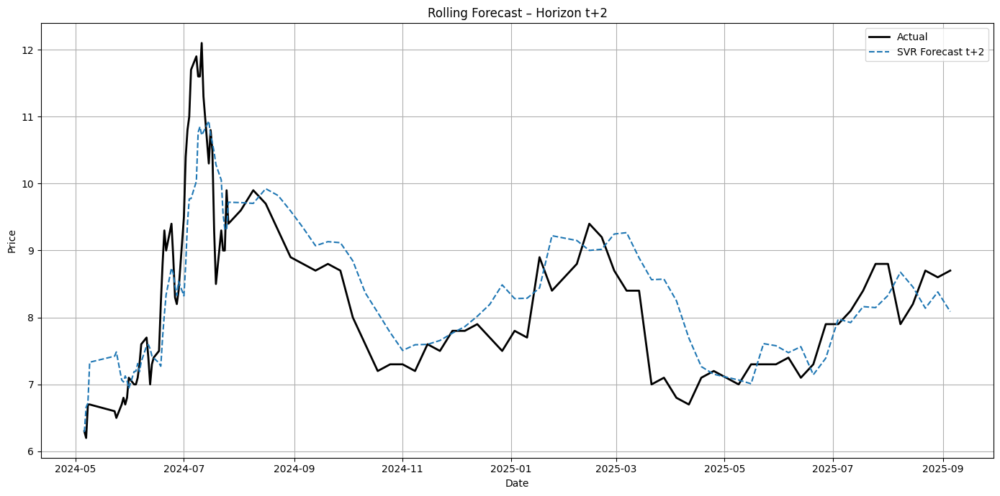

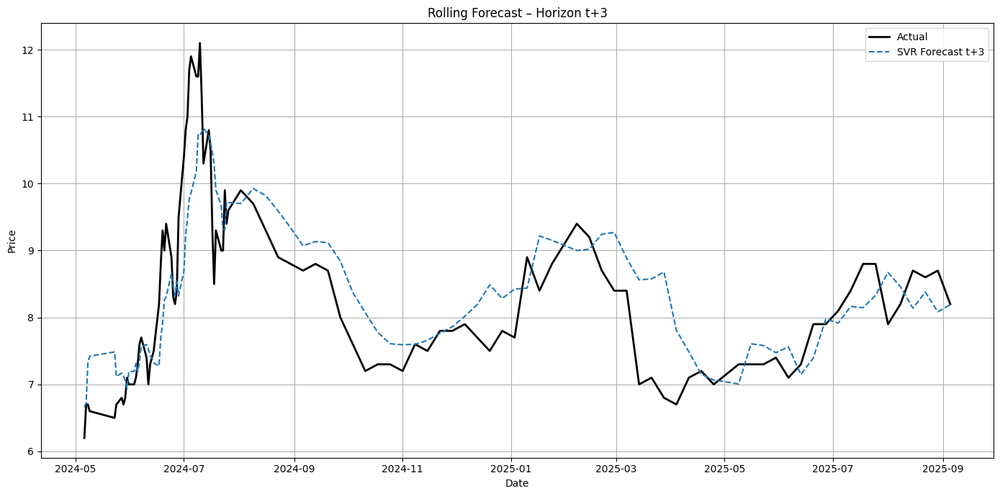

In [ ]:
# ========================================================
# 8. BACKTESTING – ROLLING 3-STEP AHEAD (FULL HORIZONS)
# ========================================================

print("\n=== BACKTESTING – FULL 3-STEP AHEAD FORECAST ===")

# Lưu kết quả cho 3 horizons
rolling_results = {
    name: {1: [], 2: [], 3: []}
    for name, _, _ in models
}
rolling_dates = []

# Tổng dữ liệu
X_total = np.vstack([X_train, X_val, X_test])
y_total = np.concatenate([y_train, y_val, y_test])

test_start = len(X_train) + len(X_val)

expanding_window = True
forecast_horizon = 3

for start_idx in range(test_start, len(X_total) - forecast_horizon):

    rolling_dates.append(plot_df['date'].iloc[start_idx])

    # ===============================
    # 1. Window train tại thời điểm t
    # ===============================
    if expanding_window:
        X_train_roll = X_total[:start_idx]
        y_train_roll = y_total[:start_idx]
    else:
        X_train_roll = X_total[start_idx - window_size:start_idx]
        y_train_roll = y_total[start_idx - window_size:start_idx]

    X_train_roll_scaled = scaler.fit_transform(X_train_roll)

    # Dữ liệu dùng forecast (t+1 → t+3)
    X_future_scaled = scaler.transform(
        X_total[start_idx:start_idx + forecast_horizon]
    )

    # ===============================
    # 2. Train + 3-step forecast
    # ===============================
    for name, model, params in models:

        model.fit(X_train_roll_scaled, y_train_roll)

        # Predict log-price
        pred_log = model.predict(X_future_scaled)
        pred = np.exp(pred_log)

        # Lưu t+1, t+2, t+3
        rolling_results[name][1].append(pred[0])
        rolling_results[name][2].append(pred[1])
        rolling_results[name][3].append(pred[2])

# ========================================================
# 9. ĐÁNH GIÁ KẾT QUẢ BACKTEST THEO TỪNG HORIZON
# ========================================================

print("\n=== ROLLING FORECAST PERFORMANCE (PER HORIZON) ===")

for name in rolling_results:

    print(f"\n---- {name} ----")

    for h in [1, 2, 3]:
        pred_h = np.array(rolling_results[name][h])

        actual_h = np.exp(
            y_total[test_start + (h - 1) : test_start + (h - 1) + len(pred_h)]
        )

        mse = mean_squared_error(actual_h, pred_h)
        mae = mean_absolute_error(actual_h, pred_h)
        r2 = r2_score(actual_h, pred_h)

        print(f"Horizon t+{h}:  MSE={mse:.4f} | MAE={mae:.4f} | R2={r2:.4f}")

# ========================================================
# 10. PLOT 3 BIỂU ĐỒ CHO 3 HORIZONS
# ========================================================

for h in [1, 2, 3]:

    plt.figure(figsize=(14, 7))

    # Actual tương ứng horizon t+h
    actual_h = np.exp(
        y_total[test_start + (h - 1): test_start + (h - 1) + len(rolling_dates)]
    )

    plt.plot(
        rolling_dates,
        actual_h,
        label="Actual",
        color="black",
        linewidth=2
    )

    # Forecast theo từng model
    for name in rolling_results:
        plt.plot(
            rolling_dates,
            rolling_results[name][h],
            linestyle="--",
            label=f"{name} Forecast t+{h}"
        )

    plt.title(f"Rolling Forecast – Horizon t+{h}")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
